# *IATHON*

# Projeto: Am I Safe?

**Objetivo do Projeto:** Oferecer uma solução de informação sobre o nível de segurança dos bairros da capital de São Paulo

**Público:** turistas e possíveis moradores de São Paulo

Atualmente o turista e mesmo o morador da cidade de São Paulo não dispõe de infornações rápidas e fáceis a respeito da violência no seu bairro e em sua região. Pensando nisso, foi criado uma aplicação baseada em dados de ocorrências históricas para oferecer a facilidade da informação ao usuário, ou seja, analisando todos os dados hitóricos dos últimos 7 meses dos principais tipos de ocorrências em por região e em cada bairro, é possível saber em uma determinada região qual dos bairros é o mais seguro.

A seguir foi feita toda a análise dos conjuntos de dados da Secretaria de Segurança Pública de SP e dados populacionais do IBGE-SP.

A - Conjunto de dados: 

 1 - *Crimes_cidadeSP.csv*
   - *'DATA_OCORRENCIA_BO'*: data que ocorreu o delito
   - *'HORA_OCORRENCIA_BO'*: hora que ocorreu o delito
   - *'DESC_PERIODO'*: NaN
   - *'DESCR_TIPOLOCAL'*: tipo de local do delito
   - *'BAIRRO'*: bairro do delito
   - *'LOGRADOURO'*: endereço do delito
   - *'NUMERO_LOGRADOURO'*: completmento do endereço do delito
   - *'LATITUDE'*: latitude do local do delito
   - *'LONGITUDE'*: longitude do local do delito
   - *'NOME_DELEGACIA_CIRCUNSCRIÇÃO'*: delegacia que atendeu a ocorrência
   - *'NOME_DEPARTAMENTO_CIRCUNSCRIÇÃO': especialização da delegacia que atendeu ocorrência
   - *'NOME_SECCIONAL_CIRCUNSCRIÇÃO'*: delegacia distrital
   - *'NOME_MUNICIPIO_CIRCUNSCRIÇÃO'*: município da ocorrência
   - *'NOME_MUNICIPIO_CIRCUNSCRIÇÃO'*: nome do município
   - *'RUBRICA'*: fato ocorrido
   - *'DESCR_CONDUTA'*: comprovação do fato ocorrido 
   - *'NATUREZA_APURADA'*: apuração do delito
   - *'MES_ESTATISTICA'*: mês do delito apurado
   - *'ANO_ESTATISTICA'*: ano do delito apurado
           
2 - *SP_pop_cens_.csv*
 
   - *'Bairros'*:nome do bairro
   - *'População'*: população do bairro
   - *'Região'*: região(zona) a que o bairro pertence
     

   ## Início

### Carregando as bibliotecas e base de dados

In [1]:
#Importando as bibliotecas
import pandas as pd
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
import matplotlib.pyplot as plt
from matplotlib import pylab
import numpy as np
import os.path

In [2]:
#Carregando base de dados
database = pd.read_csv(os.path.abspath('/home/jovyan/work/Crimes_cidadeSP.csv'))
ibge_sp = pd.read_csv('/home/jovyan/work/SP_pop_cens_.csv')

In [3]:
database

,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,DESC_PERIODO,DESCR_TIPOLOCAL,BAIRRO,LOGRADOURO,NUMERO_LOGRADOURO,LATITUDE,LONGITUDE,NOME_DELEGACIA_CIRCUNSCRIÇÃO,NOME_DEPARTAMENTO_CIRCUNSCRIÇÃO,NOME_SECCIONAL_CIRCUNSCRIÇÃO,NOME_MUNICIPIO_CIRCUNSCRIÇÃO,RUBRICA,DESCR_CONDUTA,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA
0,1/26/2023,23:55:00,NaN,Hospital,NaN,Rua Doutor Edson de Melo,347.0,"-23,5128377","-46,5830433",19 D.P. - VILA MARIA,DECAP,DEL.SEC.4º NORTE,S.PAULO,Ameaça (art. 147),NaN,HOMICÍDIO CULPOSO OUTROS,1,2023
1,1/1/2023,1:20:00,NaN,Acostamento,RAPOSO TAVARES,VIADUTO RODOVIA RAPOSO TAVARES,17300.0,"-23,58404575","-46,78334339",75 D.P. - JARDIM ARPOADOR,DECAP,DEL.SEC.3º OESTE,S.PAULO,Comunicação de óbito,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
2,1/1/2023,3:05:00,NaN,Via Pública,CIDADE LÍDER,AVENIDA ARICANDUVA,5520.0,"-23,58206873","-46,49064622",53 D.P. - PARQUE DO CARMO,DECAP,DEL.SEC.8º SAO MATEUS,S.PAULO,Colisão,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
3,1/1/2023,5:44:00,NaN,Via Pública,VILA JACUÍ,Avenida Jacu-Pêssego,2981.0,"-23,50658","-46,4561998",63 D.P. - VILA JACUI,DECAP,DEL.SEC.7º ITAQUERA,S.PAULO,Homicídio culposo na direção de veículo automo...,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
4,1/1/2023,7:00:29,NaN,Via Pública,ANHANGUERA,ESTRADA CORONEL JOSE GLADIADOR,25.0,"-23,44048142","-46,79551178",46 D.P. - PERUS,DECAP,DEL.SEC.3º OESTE,S.PAULO,Choque,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284820,7/30/2023,2:40:00 AM,NaN,Via Pública,CACHOEIRINHA,Rua Koshun Takara,1350.0,"-23,4624974","-46,6609035",38 D.P. - VILA AMALIA,DECAP,DEL.SEC.4º NORTE,S.PAULO,Morte suspeita,Morte Acidental,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284821,7/30/2023,4:30:00 AM,NaN,Via Pública,MOEMA,AVENIDA RUBEM BERTA,1100.0,"-23,59924922","-46,65091036",16 D.P. - VILA CLEMENTINO,DECAP,DEL.SEC.2º SUL,S.PAULO,Homicídio culposo na direção de veículo automo...,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284822,7/30/2023,7:00:00 PM,NaN,Via Pública,Itaim Bibi,Rua Jesuíno Arruda,10.0,"-23,5821941","-46,6752873",15º DP DR LUCIANO H BEIGUELMAN,DECAP,DEL.SEC.3º OESTE,S.PAULO,Homicídio culposo na direção de veículo automo...,§ 1o No homicídio culposo cometido na direção ...,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284823,7/31/2023,12:10:00 PM,NaN,Via Pública,MANDAQUI,RUA CONSELHEIRO MOREIRA DE BARROS,4060.0,"-23,47980042","-46,65004107",38 D.P. - VILA AMALIA,DECAP,DEL.SEC.4º NORTE,S.PAULO,Comunicação de óbito,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023


In [4]:
#Conjunto de dados da população de sp
ibge_sp

,Bairros,População,Região
0,Bela Vista,73508,CENTRO
1,Bom Retiro,39856,CENTRO
2,Cambuci,45952,CENTRO
3,Consolação,57076,CENTRO
4,Liberdade,73170,CENTRO
...,...,...,...
91,Parelheiros,159266,SUL
92,Pedreira,165404,SUL
93,Santo Amaro,74315,SUL
94,Socorro,35546,SUL


## Explorando os dados

In [5]:
database.head()

,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,DESC_PERIODO,DESCR_TIPOLOCAL,BAIRRO,LOGRADOURO,NUMERO_LOGRADOURO,LATITUDE,LONGITUDE,NOME_DELEGACIA_CIRCUNSCRIÇÃO,NOME_DEPARTAMENTO_CIRCUNSCRIÇÃO,NOME_SECCIONAL_CIRCUNSCRIÇÃO,NOME_MUNICIPIO_CIRCUNSCRIÇÃO,RUBRICA,DESCR_CONDUTA,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA
0,1/26/2023,23:55:00,NaN,Hospital,NaN,Rua Doutor Edson de Melo,347.0,"-23,5128377","-46,5830433",19 D.P. - VILA MARIA,DECAP,DEL.SEC.4º NORTE,S.PAULO,Ameaça (art. 147),NaN,HOMICÍDIO CULPOSO OUTROS,1,2023
1,1/1/2023,1:20:00,NaN,Acostamento,RAPOSO TAVARES,VIADUTO RODOVIA RAPOSO TAVARES,17300.0,"-23,58404575","-46,78334339",75 D.P. - JARDIM ARPOADOR,DECAP,DEL.SEC.3º OESTE,S.PAULO,Comunicação de óbito,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
2,1/1/2023,3:05:00,NaN,Via Pública,CIDADE LÍDER,AVENIDA ARICANDUVA,5520.0,"-23,58206873","-46,49064622",53 D.P. - PARQUE DO CARMO,DECAP,DEL.SEC.8º SAO MATEUS,S.PAULO,Colisão,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
3,1/1/2023,5:44:00,NaN,Via Pública,VILA JACUÍ,Avenida Jacu-Pêssego,2981.0,"-23,50658","-46,4561998",63 D.P. - VILA JACUI,DECAP,DEL.SEC.7º ITAQUERA,S.PAULO,Homicídio culposo na direção de veículo automo...,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
4,1/1/2023,7:00:29,NaN,Via Pública,ANHANGUERA,ESTRADA CORONEL JOSE GLADIADOR,25.0,"-23,44048142","-46,79551178",46 D.P. - PERUS,DECAP,DEL.SEC.3º OESTE,S.PAULO,Choque,NaN,HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023


In [6]:
database.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284825 entries, 0 to 284824
Data columns (total 18 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   DATA_OCORRENCIA_BO               284435 non-null  object 
 1   HORA_OCORRENCIA_BO               187229 non-null  object 
 2   DESC_PERIODO                     97600 non-null   object 
 3   DESCR_TIPOLOCAL                  284825 non-null  object 
 4   BAIRRO                           283997 non-null  object 
 5   LOGRADOURO                       284825 non-null  object 
 6   NUMERO_LOGRADOURO                284823 non-null  float64
 7   LATITUDE                         249688 non-null  object 
 8   LONGITUDE                        249688 non-null  object 
 9   NOME_DELEGACIA_CIRCUNSCRIÇÃO     284825 non-null  object 
 10  NOME_DEPARTAMENTO_CIRCUNSCRIÇÃO  284825 non-null  object 
 11  NOME_SECCIONAL_CIRCUNSCRIÇÃO     284825 non-null  object 
 12  NO

In [7]:
#Verificando os valores nulos
print(database.isna().sum())
print((database.isna().sum() / database.shape[0])*100)

DATA_OCORRENCIA_BO                    390
HORA_OCORRENCIA_BO                  97596
DESC_PERIODO                       187225
DESCR_TIPOLOCAL                         0
BAIRRO                                828
LOGRADOURO                              0
NUMERO_LOGRADOURO                       2
LATITUDE                            35137
LONGITUDE                           35137
NOME_DELEGACIA_CIRCUNSCRIÇÃO            0
NOME_DEPARTAMENTO_CIRCUNSCRIÇÃO         0
NOME_SECCIONAL_CIRCUNSCRIÇÃO            0
NOME_MUNICIPIO_CIRCUNSCRIÇÃO            0
RUBRICA                                 4
DESCR_CONDUTA                       29508
NATUREZA_APURADA                        0
MES_ESTATISTICA                         0
ANO_ESTATISTICA                         0
dtype: int64
DATA_OCORRENCIA_BO                  0.136926
HORA_OCORRENCIA_BO                 34.265251
DESC_PERIODO                       65.733345
DESCR_TIPOLOCAL                     0.000000
BAIRRO                              0.290705
LOGRAD

Como visto acima, há 7 colunas com valores nulos sendo algumas com percentuais bem elevados. Algumas colunas serão exluídas pois são informações irrelavantes para os propósitos do projeto.

In [8]:
#Exluindo algumas colunas
database.drop(['DESC_PERIODO','DESCR_CONDUTA','NOME_DELEGACIA_CIRCUNSCRIÇÃO','NOME_DEPARTAMENTO_CIRCUNSCRIÇÃO','NOME_SECCIONAL_CIRCUNSCRIÇÃO','NUMERO_LOGRADOURO','NOME_MUNICIPIO_CIRCUNSCRIÇÃO','DESCR_TIPOLOCAL','LOGRADOURO','RUBRICA'], axis=1, inplace=True)
database

,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA
0,1/26/2023,23:55:00,NaN,"-23,5128377","-46,5830433",HOMICÍDIO CULPOSO OUTROS,1,2023
1,1/1/2023,1:20:00,RAPOSO TAVARES,"-23,58404575","-46,78334339",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
2,1/1/2023,3:05:00,CIDADE LÍDER,"-23,58206873","-46,49064622",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
3,1/1/2023,5:44:00,VILA JACUÍ,"-23,50658","-46,4561998",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
4,1/1/2023,7:00:29,ANHANGUERA,"-23,44048142","-46,79551178",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
...,...,...,...,...,...,...,...,...
284820,7/30/2023,2:40:00 AM,CACHOEIRINHA,"-23,4624974","-46,6609035",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284821,7/30/2023,4:30:00 AM,MOEMA,"-23,59924922","-46,65091036",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284822,7/30/2023,7:00:00 PM,Itaim Bibi,"-23,5821941","-46,6752873",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284823,7/31/2023,12:10:00 PM,MANDAQUI,"-23,47980042","-46,65004107",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023


In [9]:
#Excluindo os valores nulos da coluna BAIRRO
database.dropna(subset=['BAIRRO'], inplace=True)
database

,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA
1,1/1/2023,1:20:00,RAPOSO TAVARES,"-23,58404575","-46,78334339",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
2,1/1/2023,3:05:00,CIDADE LÍDER,"-23,58206873","-46,49064622",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
3,1/1/2023,5:44:00,VILA JACUÍ,"-23,50658","-46,4561998",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
4,1/1/2023,7:00:29,ANHANGUERA,"-23,44048142","-46,79551178",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
5,1/1/2023,10:00:00,LAJEADO,"-23,53027508","-46,41549436",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023
...,...,...,...,...,...,...,...,...
284820,7/30/2023,2:40:00 AM,CACHOEIRINHA,"-23,4624974","-46,6609035",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284821,7/30/2023,4:30:00 AM,MOEMA,"-23,59924922","-46,65091036",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284822,7/30/2023,7:00:00 PM,Itaim Bibi,"-23,5821941","-46,6752873",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023
284823,7/31/2023,12:10:00 PM,MANDAQUI,"-23,47980042","-46,65004107",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023


Como a exclusão foi de menos de 1% do total dos dados, não haverá impacto na análise do conjunto.

In [10]:
#Convertendo as colunas para os tipo correto de dados
database['DATA_OCORRENCIA_BO'] = pd.to_datetime(database['DATA_OCORRENCIA_BO'], errors='ignore', format="%d/%m/%Y")
database.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 283997 entries, 1 to 284824
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   DATA_OCORRENCIA_BO  283612 non-null  object
 1   HORA_OCORRENCIA_BO  186535 non-null  object
 2   BAIRRO              283997 non-null  object
 3   LATITUDE            248866 non-null  object
 4   LONGITUDE           248866 non-null  object
 5   NATUREZA_APURADA    283997 non-null  object
 6   MES_ESTATISTICA     283997 non-null  int64 
 7   ANO_ESTATISTICA     283997 non-null  int64 
dtypes: int64(2), object(6)
memory usage: 19.5+ MB


Pelo fato de a coluna 'HORA_OCORRENCIA_BO' conter cerca de 35% dos valores nulos, não foi possível convertê-la para datetime.

In [11]:
#Agrupando os bairros com 
database.BAIRRO.value_counts().head(30)

REPÚBLICA             9357
PINHEIROS             8132
VILA MARIANA          6533
CENTRO                6485
BELA VISTA            6219
CAMPO LIMPO           6133
CAPÃO REDONDO         5972
SÉ                    5905
SANTO AMARO           5895
CONSOLAÇÃO            5743
JARDIM ÂNGELA         5526
BRÁS                  5482
TATUAPÉ               4851
ITAIM BIBI            4849
SANTANA               4803
GRAJAÚ                4711
ERMELINO MATARAZZO    4656
CIDADE DUTRA          4322
BARRA FUNDA           4306
IPIRANGA              3950
JARDIM PAULISTA       3913
BRASILÂNDIA           3868
CIDADE ADEMAR         3775
SÃO MATEUS            3748
LIBERDADE             3690
JABAQUARA             3684
LAPA                  3669
JAÇANÃ                3620
SAPOPEMBA             3443
BOM RETIRO            3416
Name: BAIRRO, dtype: int64

Devido o conjunto de dados não apresentar um padrão de escrita dos nomes dos principais bairros e suas respectivas vilas, há a necessidade de uma padronização em alguns nomes onde há uma maior número de ocorrências. 

In [12]:
#Organizando os nomes de alguns bairros
database.loc[database['BAIRRO'].isin(['BRAS']),'BAIRRO'] = 'BRÁS'
database.loc[database['BAIRRO'].isin(['CONSOLACAO']),'BAIRRO'] = 'CONSOLAÇÃO'
database.loc[database['BAIRRO'].isin(['REPUBLICA']),'BAIRRO'] = 'REPÚBLICA'
database.loc[database['BAIRRO'].isin(['VILA CARRAO','JARDIM VILA CARRAO','JARDIM VILA CARRÃO','CARRAO']),'BAIRRO'] = 'CARRÃO'
database.loc[database['BAIRRO'].isin(['B SÃO MATEUS','CIDADE SÃO MATEUS','SAO MATEUS']),'BAIRRO'] = 'SÃO MATEUS'
database.loc[database['BAIRRO'].isin(['PARQUE SÃO LUCAS','SAO LUCAS']),'BAIRRO'] = 'SÃO LUCAS'
database.loc[database['BAIRRO'].isin(['CAPÃO REDODNDO','CAPAO REDONDO','JARDIM CAPÃO REDONDO']),'BAIRRO'] = 'CAPÃO REDONDO'
database.loc[database['BAIRRO'].isin(['JARDIM ANGELA']),'BAIRRO'] = 'JARDIM ÂNGELA'
database.loc[database['BAIRRO'].isin(['CHÁCARA TATUAPÉ', 'TATUAPE']),'BAIRRO'] = 'TATUAPÉ'

In [13]:
#Descrição dos dados IBGE SP
ibge_sp.drop(ibge_sp.tail(5).index,inplace=True)
ibge_sp.head()

,Bairros,População,Região
0,Bela Vista,73508,CENTRO
1,Bom Retiro,39856,CENTRO
2,Cambuci,45952,CENTRO
3,Consolação,57076,CENTRO
4,Liberdade,73170,CENTRO


In [14]:
#Alterando o nome da coluna
ibge_sp = ibge_sp.rename(columns={'2022':'População'})
ibge_sp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91 entries, 0 to 90
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Bairros    91 non-null     object
 1   População  91 non-null     int64 
 2   Região     91 non-null     object
dtypes: int64(1), object(2)
memory usage: 2.8+ KB


In [15]:
# Convertendo a coluna População para float
ibge_sp['População'] = pd.to_numeric(ibge_sp['População'])
ibge_sp.Bairros

0          Bela Vista
1          Bom Retiro
2             Cambuci
3          Consolação
4           Liberdade
           ...       
86       Cidade Dutra
87             Grajaú
88      Jardim Ângela
89    Jardim São Luís
90           Marsilac
Name: Bairros, Length: 91, dtype: object

In [16]:
#Alterando para a grafia maiúscula os nomes dos bairros
ibge_sp['Bairros'] = ibge_sp['Bairros'].str.upper()
ibge_sp

,Bairros,População,Região
0,BELA VISTA,73508,CENTRO
1,BOM RETIRO,39856,CENTRO
2,CAMBUCI,45952,CENTRO
3,CONSOLAÇÃO,57076,CENTRO
4,LIBERDADE,73170,CENTRO
...,...,...,...
86,CIDADE DUTRA,205532,SUL
87,GRAJAÚ,398040,SUL
88,JARDIM ÂNGELA,349210,SUL
89,JARDIM SÃO LUÍS,299874,SUL


In [17]:
#Inserindo no conjunto de dado principal as informações de região e população
database['POPULACAO'] = database['BAIRRO'].map(ibge_sp.set_index('Bairros')['População'])
database['REGIÃO'] = database['BAIRRO'].map(ibge_sp.set_index('Bairros')['Região'])
database

,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
1,1/1/2023,1:20:00,RAPOSO TAVARES,"-23,58404575","-46,78334339",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,109052.0,OESTE
2,1/1/2023,3:05:00,CIDADE LÍDER,"-23,58206873","-46,49064622",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,137277.0,LESTE
3,1/1/2023,5:44:00,VILA JACUÍ,"-23,50658","-46,4561998",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,147166.0,LESTE
4,1/1/2023,7:00:29,ANHANGUERA,"-23,44048142","-46,79551178",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,88677.0,NORTE
5,1/1/2023,10:00:00,LAJEADO,"-23,53027508","-46,41549436",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,177828.0,LESTE
...,...,...,...,...,...,...,...,...,...,...
284820,7/30/2023,2:40:00 AM,CACHOEIRINHA,"-23,4624974","-46,6609035",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,147821.0,NORTE
284821,7/30/2023,4:30:00 AM,MOEMA,"-23,59924922","-46,65091036",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,89785.0,SUL
284822,7/30/2023,7:00:00 PM,Itaim Bibi,"-23,5821941","-46,6752873",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,NaN,NaN
284823,7/31/2023,12:10:00 PM,MANDAQUI,"-23,47980042","-46,65004107",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,109384.0,NORTE


In [18]:
#Verificando valores nulos
database.isna().sum()/database.shape[0]

DATA_OCORRENCIA_BO    0.001356
HORA_OCORRENCIA_BO    0.343180
BAIRRO                0.000000
LATITUDE              0.123702
LONGITUDE             0.123702
NATUREZA_APURADA      0.000000
MES_ESTATISTICA       0.000000
ANO_ESTATISTICA       0.000000
POPULACAO             0.163319
REGIÃO                0.163319
dtype: float64

Conforme visto acima, mesmo com todo o tratamento  verificação feita no conjunto de dados, ainda restam cerca de 16% do total de linhas das colunas 'POPULAÇÃO' e 'REGIÃO' aos quais não foi possível verificar sua respectiva região. Isso se deve a diversos fatores como o local de ocorrência fora da cidade de São Paulo (ABC, OSASCO, etc) e endereços ou nomes de bairros errados ou incompletos. Para que haja uma análise mais precisa das reais ocorrências em suas respectivas localidades e evitar uma influência negativa nos dados em geral, a opção adotada é da exclusão desses dados, não havendo prejuízos ou perdas significativas.

In [19]:
#Excluindo os valores nulos da coluna BAIRRO
database.dropna(subset=['POPULACAO','REGIÃO'], inplace=True)
database

,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
1,1/1/2023,1:20:00,RAPOSO TAVARES,"-23,58404575","-46,78334339",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,109052.0,OESTE
2,1/1/2023,3:05:00,CIDADE LÍDER,"-23,58206873","-46,49064622",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,137277.0,LESTE
3,1/1/2023,5:44:00,VILA JACUÍ,"-23,50658","-46,4561998",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,147166.0,LESTE
4,1/1/2023,7:00:29,ANHANGUERA,"-23,44048142","-46,79551178",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,88677.0,NORTE
5,1/1/2023,10:00:00,LAJEADO,"-23,53027508","-46,41549436",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,1,2023,177828.0,LESTE
...,...,...,...,...,...,...,...,...,...,...
284819,7/29/2023,3:32:00 AM,SACOMÃ,"-23,60745319","-46,59564297",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,266814.0,SUL
284820,7/30/2023,2:40:00 AM,CACHOEIRINHA,"-23,4624974","-46,6609035",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,147821.0,NORTE
284821,7/30/2023,4:30:00 AM,MOEMA,"-23,59924922","-46,65091036",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,89785.0,SUL
284823,7/31/2023,12:10:00 PM,MANDAQUI,"-23,47980042","-46,65004107",HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO,7,2023,109384.0,NORTE


In [20]:
#Verificando valores nulos
database.isna().sum()/database.shape[0]

DATA_OCORRENCIA_BO    0.001376
HORA_OCORRENCIA_BO    0.333380
BAIRRO                0.000000
LATITUDE              0.105014
LONGITUDE             0.105014
NATUREZA_APURADA      0.000000
MES_ESTATISTICA       0.000000
ANO_ESTATISTICA       0.000000
POPULACAO             0.000000
REGIÃO                0.000000
dtype: float64

### Visão Geral dos Conjunto de dados

In [21]:
x = database.groupby(['REGIÃO','BAIRRO'])['ANO_ESTATISTICA'].count().sort_values(ascending=False)
print(x)
print((x/database.shape[0])*100)

REGIÃO  BAIRRO         
CENTRO  REPÚBLICA          9357
OESTE   PINHEIROS          8132
SUL     VILA MARIANA       6533
CENTRO  BELA VISTA         6219
SUL     CAMPO LIMPO        6133
                           ... 
LESTE   JOSÉ BONIFÁCIO       74
SUL     CURSINO              69
        MARSILAC             40
NORTE   SÃO DOMINGOS         12
OESTE   VILA LEOPOLDINA       1
Name: ANO_ESTATISTICA, Length: 85, dtype: int64
REGIÃO  BAIRRO         
CENTRO  REPÚBLICA          3.937883
OESTE   PINHEIROS          3.422343
SUL     VILA MARIANA       2.749406
CENTRO  BELA VISTA         2.617259
SUL     CAMPO LIMPO        2.581066
                             ...   
LESTE   JOSÉ BONIFÁCIO     0.031143
SUL     CURSINO            0.029039
        MARSILAC           0.016834
NORTE   SÃO DOMINGOS       0.005050
OESTE   VILA LEOPOLDINA    0.000421
Name: ANO_ESTATISTICA, Length: 85, dtype: float64


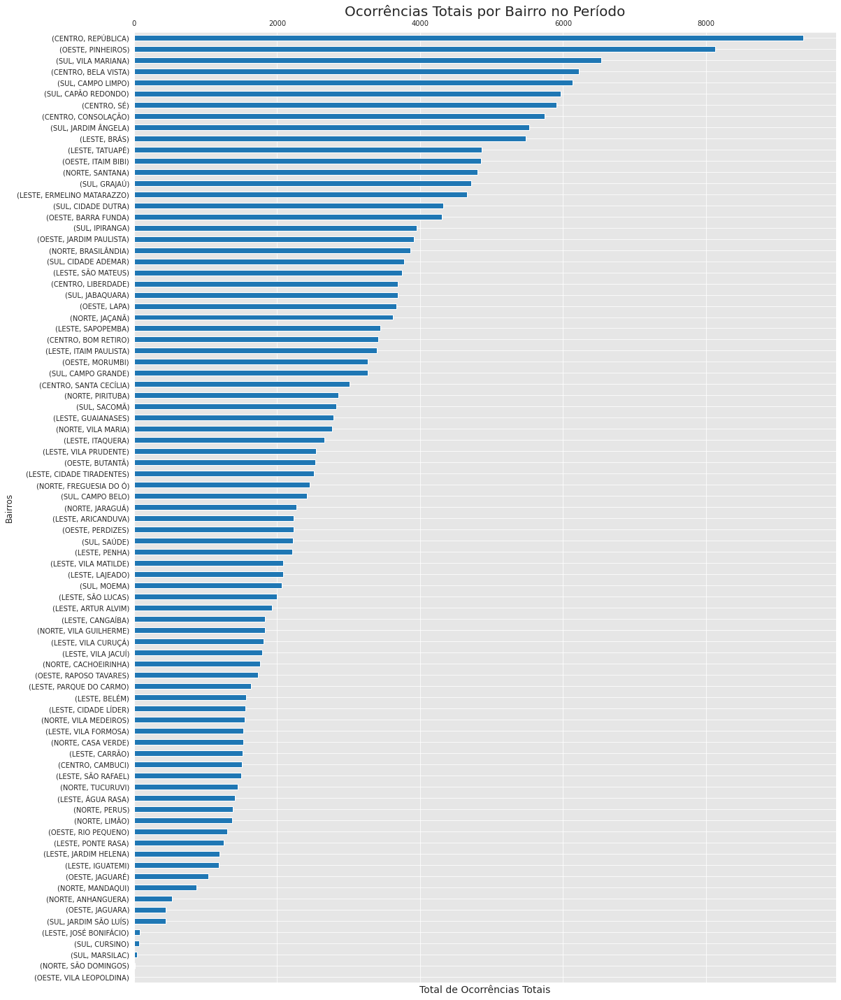

In [22]:
fig, ax = plt.subplots(figsize=(18, 25))
ax = (database.groupby(['REGIÃO','BAIRRO'])['ANO_ESTATISTICA'].count().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Bairros', fontsize=12)
ax.set_xlabel('Total de Ocorrências Totais', fontsize=14)
ax.set_title('Ocorrências Totais por Bairro no Período', fontsize=20)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado de todas as ocorrências em todo o período separadas por bairro. Nota-se  algumas informações importantes:
- até 2000 ocorrências: 41% do total de bairros
- até 4000 ocorrências: 80% do total de bairros
- ate 6000 ocorrências: 94% do total de bairros

Somente os bairros REPÚBLICA(CENTRO) e PINHEIROS(OESTE) ultrapassam a quantidade de 8000 ocorrências no período. 

In [23]:
#
print(database.MES_ESTATISTICA.value_counts())
print((database.MES_ESTATISTICA.value_counts() / database.MES_ESTATISTICA.count())*100)

3    38311
5    35243
6    34205
1    33628
7    33463
4    32837
2    29928
Name: MES_ESTATISTICA, dtype: int64
3    16.123140
5    14.831976
6    14.395135
1    14.152305
7    14.082865
4    13.819414
2    12.595164
Name: MES_ESTATISTICA, dtype: float64


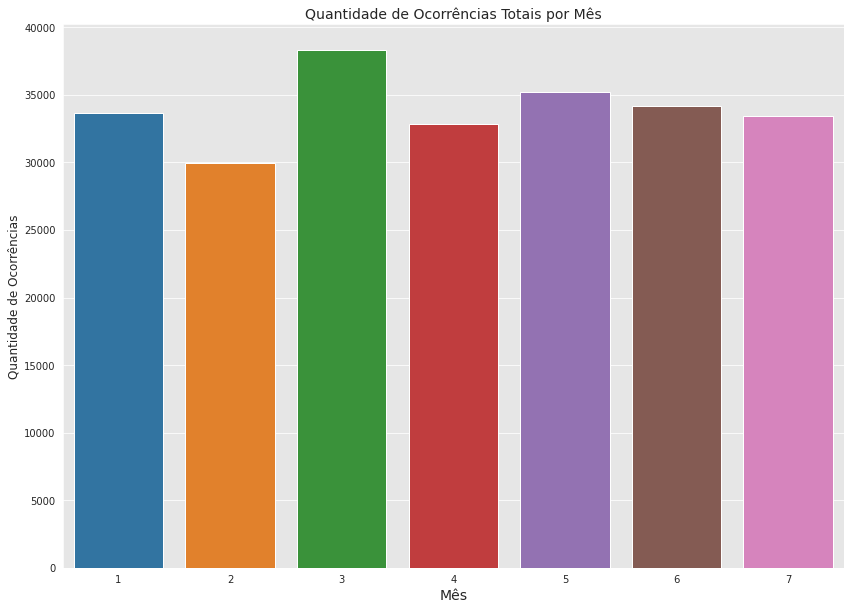

In [24]:
#Plotando o gráfico de Ocorrências 
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrências Totais por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências totais distribuídas pelos meses em questão. Nota-se que o mês de março se sobressai aos demais meses com 16% do total de ocorrências da cidade. O mês de maio  e junho aparecem em segundo lugar com cerca de 14% do total de ocorências.

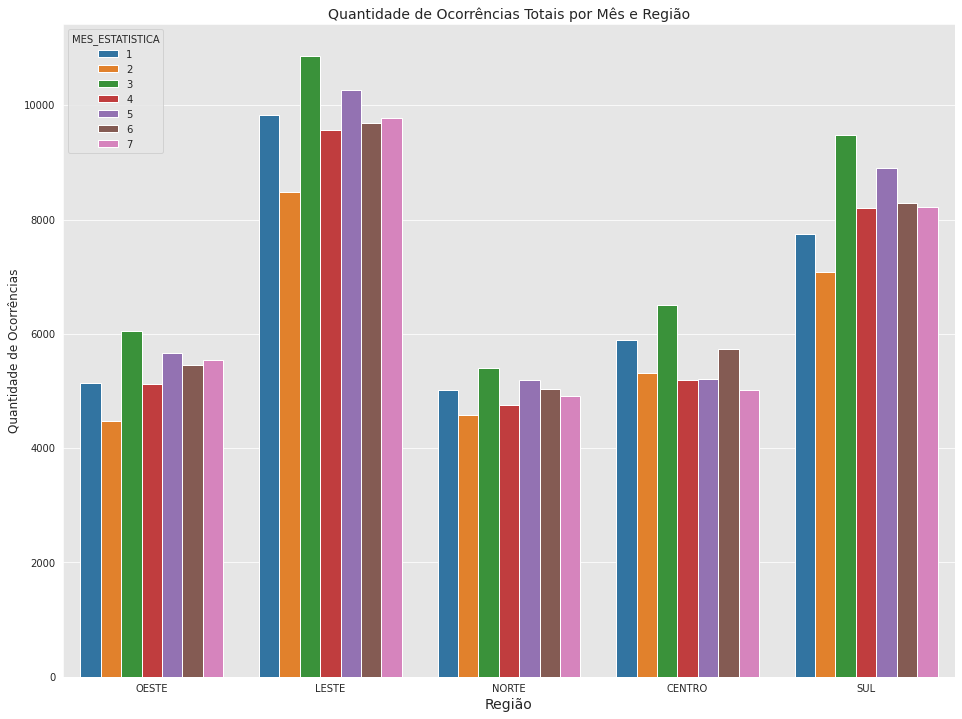

In [25]:
fig, ax = plt.subplots(figsize=(16, 12))
ax = sns.countplot(data = database,x='REGIÃO', hue='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Ocorrências Totais por Mês e Região', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências totais por região e por mês. Algumas observações importantes:
   - em todas as regiões o mês de fevereiro e março é o mais violento, muito provavelmente por causa do pré-carnaval e carnaval;
   - o mês de maio se destaca em segundo lugar por dois principais motivos: e evento Virada Cultural que ocorre no final de maio onde movimentou mais de 4 milhões de pessoas e as festas de São João que em algumas regiões se iniciam em maio e vão até junho.

In [26]:
#Verificando os tipos de ocorrências
database['NATUREZA_APURADA'].value_counts()

FURTO - OUTROS                                     118524
ROUBO - OUTROS                                      64641
FURTO DE VEÍCULO                                    20539
LESÃO CORPORAL DOLOSA                               16835
ROUBO DE VEÍCULO                                     7120
LESÃO CORPORAL CULPOSA POR ACIDENTE DE TRÂNSITO      5892
ROUBO DE CARGA                                       1339
ESTUPRO DE VULNERÁVEL                                1063
ESTUPRO                                               395
LESÃO CORPORAL CULPOSA - OUTRAS                       347
TENTATIVA DE HOMICÍDIO                                318
HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO            261
HOMICÍDIO DOLOSO                                      227
FURTO DE CARGA                                         71
LATROCÍNIO                                             18
HOMICÍDIO CULPOSO OUTROS                               11
LESÃO CORPORAL SEGUIDA DE MORTE                        10
ROUBO A BANCO 

Como verificado acima, há diversas categorias de crimes para a mesma natureza da ocorrência. Esse tipo de classificação pode ser importante para órgãos goernamentais e setores especializados em segurança, mas para um usuário final não faz muito sentido essa classificação. Por isso, optou-se por reclassificar essas subcategorias afim de ficar mais simples para o usuário, afinal, independente da natureza, um roubo é um roubo.

O foco será voltado para as ocorrências onde há um grande volume de dados, ou seja, FURTO, ROUBO, HOMICÍDIO,LESÃO CORPORAL, ACIDENTE DE TRÂNSITO, ESTUPRO E TENTATIVA DE HOMICÍDIO.
Os demais tipos de delitos serão desconsiderados por insuficiência de dados (LATROCÍNIO e ROUBO A BANCO)

In [27]:
#Agrupando os tipos de delitos
database.loc[database['NATUREZA_APURADA'].isin(['FURTO - OUTROS','FURTO DE VEÍCULO','FURTO DE CARGA']),'NATUREZA_APURADA'] = 'FURTO'
database.loc[database['NATUREZA_APURADA'].isin(['ROUBO - OUTROS','ROUBO DE VEÍCULO','ROUBO DE CARGA','ROUBO A BANCO']),'NATUREZA_APURADA'] = 'ROUBO'
database.loc[database['NATUREZA_APURADA'].isin(['LESÃO CORPORAL DOLOSA','LESÃO CORPORAL CULPOSA - OUTRAS','LESÃO CORPORAL SEGUIDA DE MORTE']),'NATUREZA_APURADA'] = 'LESÃO CORPORAL'
database.loc[database['NATUREZA_APURADA'].isin(['LESÃO CORPORAL CULPOSA POR ACIDENTE DE TRÂNSITO','HOMICÍDIO CULPOSO POR ACIDENTE DE TRÂNSITO','HOMICÍDIO DOLOSO POR ACIDENTE DE TRÂNSITO']),'NATUREZA_APURADA'] = 'ACIDENTE DE TRÂNSITO'
database.loc[database['NATUREZA_APURADA'].isin(['HOMICÍDIO DOLOSO','HOMICÍDIO CULPOSO OUTROS']),'NATUREZA_APURADA'] = 'HOMICÍDIO'
database.loc[database['NATUREZA_APURADA'].isin(['ESTUPRO DE VULNERÁVEL','ESTUPRO']),'NATUREZA_APURADA'] = 'ESTUPRO'
database.loc[database['NATUREZA_APURADA'].isin(['TENTATIVA DE HOMICÍDIO']),'NATUREZA_APURADA'] = 'TENTATIVA DE HOMICÍDIO'

In [28]:
#Verificando o conjunto de dados
database.pivot_table(index='NATUREZA_APURADA', columns='REGIÃO',aggfunc={'MES_ESTATISTICA':'count'})

MES_ESTATISTICA                            
REGIÃO                          CENTRO  LESTE  NORTE  OESTE    SUL
NATUREZA_APURADA                                                  
ACIDENTE DE TRÂNSITO               338   1835   1287    933   1761
ESTUPRO                             77    570    279    127    405
FURTO                            26815  39229  20011  24422  28657
HOMICÍDIO                           27     61     44     32     74
LATROCÍNIO                           2      5      2      3      6
LESÃO CORPORAL                    1131   6277   3574   1500   4710
ROUBO                            10435  20396   9647  10392  22233
TENTATIVA DE HOMICÍDIO              19     98     64     30    107

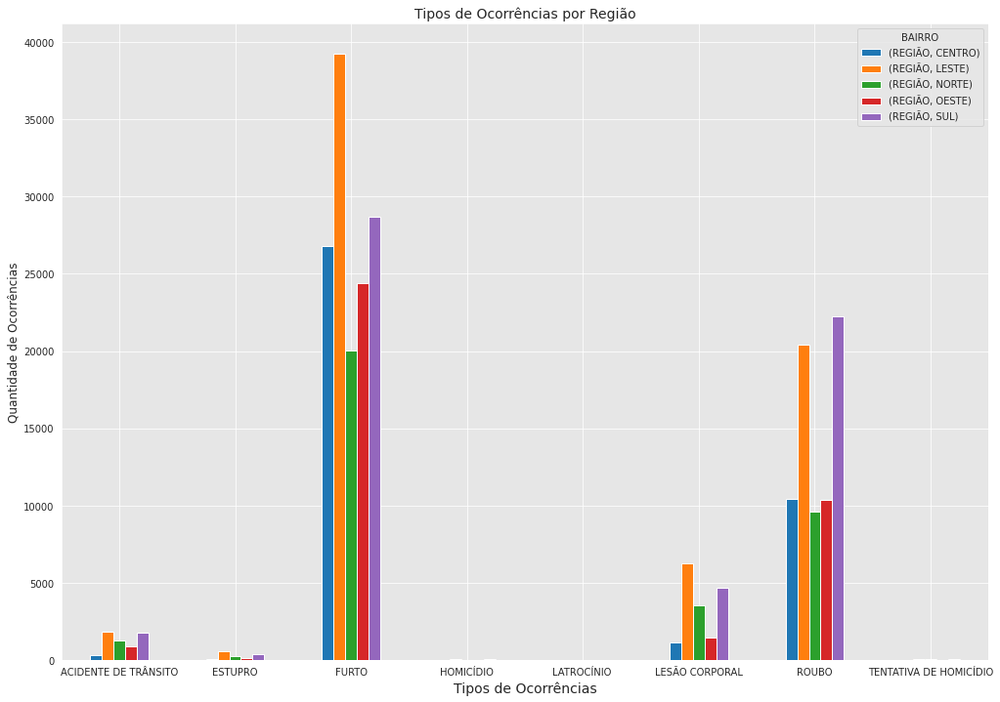

In [29]:
#Plotando o gráfico de Ocorrências por Região
ax = database.pivot_table(index='NATUREZA_APURADA', columns='REGIÃO',aggfunc={'REGIÃO':'count'}).plot.bar(figsize=(17,12))
plt.legend(loc='upper right', title='BAIRRO',fontsize=10)
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Tipos de Ocorrências', fontsize=14)
ax.set_title('Tipos de Ocorrências por Região', fontsize=14)
plt.xticks(rotation=0)
plt.show()

No gráfico plotado acima, onde tem-se a distribuição da quantidade de ocorrências por tipo de delito nas regiões. Nota-se o destaque da região LESTE em quase todos os delitos sendo que no tipo FURTO a quantidade é 36% maior em relação à segunda posição (região SUL). Isso se deve possivelmente seja reflexo da densidade demográfica distribuída pelas regiões da capital paulista, onde as regiões LESTE e SUL são as que possuem o maior número de habitantes. Outro fator interessante é que há uma inversão comparando os delitos FURTO e ROUBO: no delito FURTO há a predominância da região LESTE e no delito ROUBO a predominância é da região SUL, indicando possivelmente que há uma influência do poder aquisitivo dessa em comparação àquela.
Os delitos HOMICÍDIO, LATROCÍNIO e TENTATIVA DE HOMICÍDIO tiveram valores insignificantes, não sendo possível uma análise mais aprofundada.

In [30]:
#Conjunto de dados ibge_sp
ibge_sp

,Bairros,População,Região
0,BELA VISTA,73508,CENTRO
1,BOM RETIRO,39856,CENTRO
2,CAMBUCI,45952,CENTRO
3,CONSOLAÇÃO,57076,CENTRO
4,LIBERDADE,73170,CENTRO
...,...,...,...
86,CIDADE DUTRA,205532,SUL
87,GRAJAÚ,398040,SUL
88,JARDIM ÂNGELA,349210,SUL
89,JARDIM SÃO LUÍS,299874,SUL


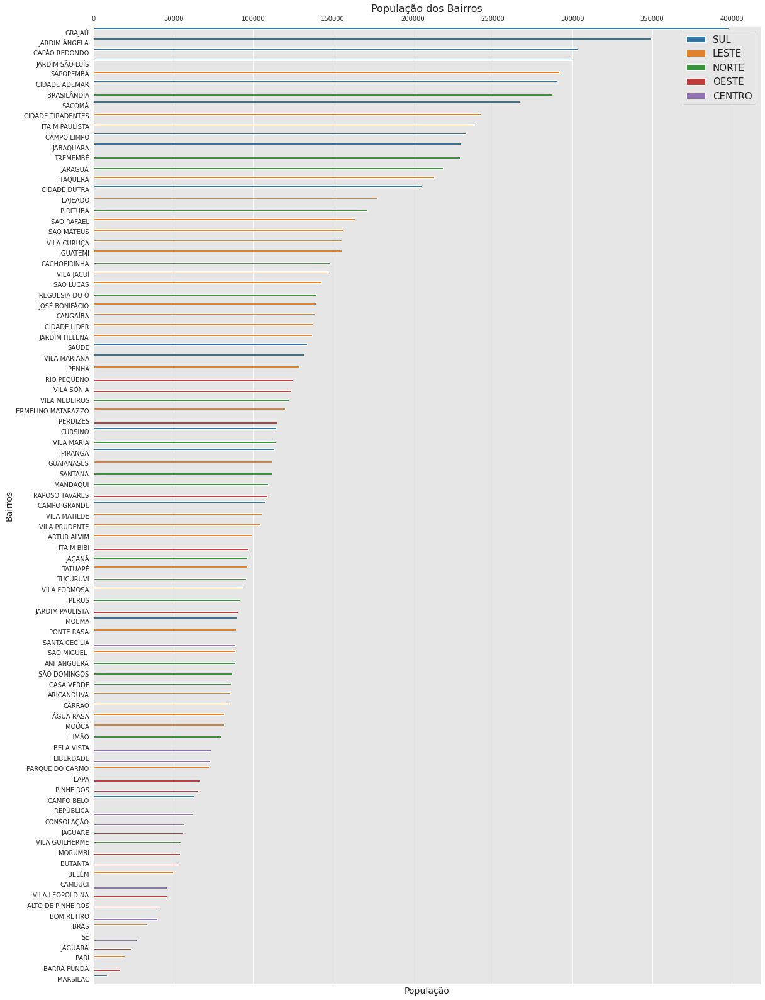

In [31]:
#Gráfico da população dividida pelos bairros
fig,ag = plt.subplots(figsize=(19,28))
ag = sns.barplot(x = 'População', y='Bairros', hue='Região', data=ibge_sp.sort_values(by='População',ascending=False))
ag.set_ylabel('Bairros', fontsize=14)
ag.set_xlabel('População', fontsize=14)
ag.set_title('População dos Bairros', fontsize=16)
ag.legend(loc='upper right', prop={'size': 15})
ag.tick_params(labelbottom=False,labeltop=True)
plt.show()

Pelo gráfico plotado acima, nota-se a distribuição dos bairros por sua respectiva população, onde é possível verificar que, dos bairros com população acima de 100.000 habitantes, apenas 13 dos 49 bairros não pertencem às regiões SUL e LESTE.
Dos 8 bairros que apresentam população acima de 250.000, 6 são da região SUL. O bairro do GRAJAÚ é o único bairro a ultrapassar os 350.000 habitantes.

In [32]:
#Agrupando por Região e População o conjunto de dados ibge_sp
ibge_sp_pop = ibge_sp.groupby('Região')['População'].sum().sort_values(ascending=False).reset_index()
print(ibge_sp_pop)
print((ibge_sp_pop.População / ibge_sp_pop.População.sum())*100)

   Região  População
0   LESTE    4183475
1     SUL    3337628
2   NORTE    2331010
3   OESTE    1082874
4  CENTRO     467801
0    36.688177
1    29.270280
2    20.442457
3     9.496572
4     4.102514
Name: População, dtype: float64


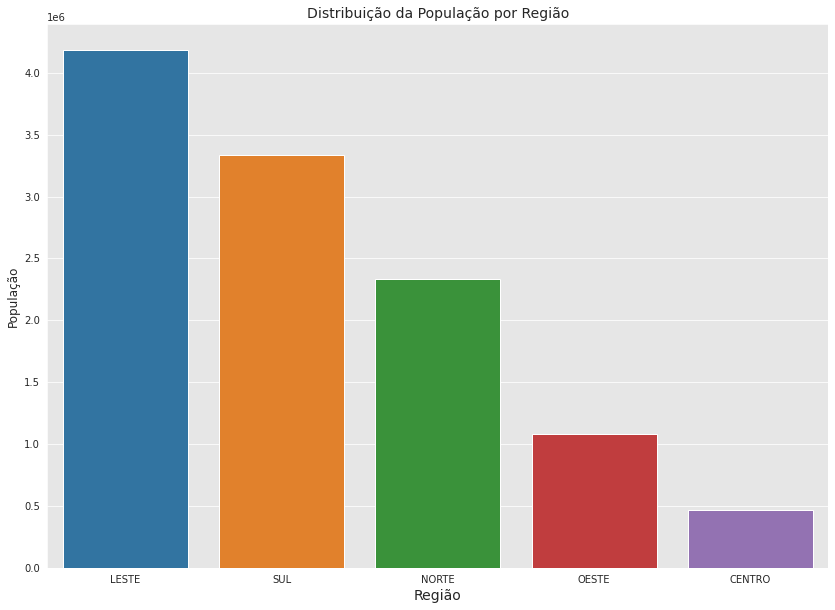

In [33]:
#Plotando o gráfico de população por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.barplot(x = 'Região', y='População', data=ibge_sp_pop)
ax.set_ylabel('População', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Distribuição da População por Região', fontsize=14)
plt.show()

Acima nota-se a distribuição do total de ocorrências no período separados por região, onde é possível verificar que mais de 80% da população está concentrada nas regiões LESTE, SUL e NORTE. A região LESTE é a mais populosa com mais de 36% do total da população da cidade de São Paulo.

### Analisando Ocorrências: FURTO

Com o intuito de realizar uma análise mais detalhada, o conjunto de dados será separado por tipo de ocorrência, onde agora será analisado a ocorrência FURTO.

In [34]:
#Separando por tipo de ocorrência
database_furto = database.loc[database['NATUREZA_APURADA']== 'FURTO'].reset_index()
database_furto

,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,104,12/30/2022,NaN,SÉ,NaN,NaN,FURTO,1,2023,27241.0,CENTRO
1,105,12/30/2022,NaN,SÉ,"-23,53899364","-46,63209317",FURTO,1,2023,27241.0,CENTRO
2,107,12/31/2022,9:00:00 PM,SÉ,"-23,5527276","-46,62662316",FURTO,1,2023,27241.0,CENTRO
3,108,12/30/2022,NaN,SÉ,"-23,5514603","-46,63721902",FURTO,1,2023,27241.0,CENTRO
4,109,12/31/2022,NaN,SÉ,"-23,55461826","-46,63313102",FURTO,1,2023,27241.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...
139129,284620,7/17/2023,8:00:00 AM,MORUMBI,"-23,6026955","-46,7509178",FURTO,7,2023,54007.0,OESTE
139130,284621,7/24/2023,7:30:00 PM,MORUMBI,"-23,6026955","-46,7509178",FURTO,7,2023,54007.0,OESTE
139131,284630,7/5/2023,7:55:00 AM,CAMPO BELO,"-23,62905364","-46,66144526",FURTO,7,2023,62894.0,SUL
139132,284631,7/12/2023,9:30:00 AM,CAMPO BELO,"-23,62905364","-46,66144526",FURTO,7,2023,62894.0,SUL


In [35]:
#Agrupando e contando as ocorrências em cada mês
database.loc[database['NATUREZA_APURADA']== 'FURTO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()

MES_ESTATISTICA
1    19010
2    16807
3    22153
4    19014
5    21078
6    20827
7    20245
Name: ANO_ESTATISTICA, dtype: int64

In [36]:
#Percentual de ocorrências por mês
(database.loc[database['NATUREZA_APURADA']== 'FURTO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count())/database_furto.shape[0]

MES_ESTATISTICA
1    0.136631
2    0.120797
3    0.159221
4    0.136660
5    0.151494
6    0.149690
7    0.145507
Name: ANO_ESTATISTICA, dtype: float64

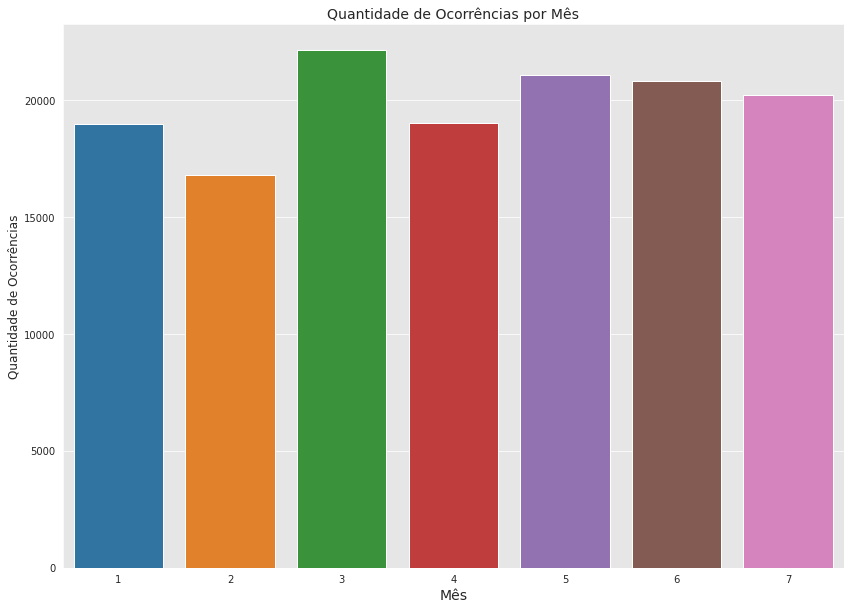

In [37]:
#Plotando o gráfico
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_furto,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de furtos totais distribuídas pelos meses em questão. Nota-se que o mês de março se sobressai aos demais meses com cerca de 15% a mais do que o mês de abril. O mês de maio  e junho aparecem em segundo lugar com cerca de 15% do total de ocorências.

In [38]:
#Ocorrencias por região
database_furto.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)

REGIÃO
LESTE     39229
SUL       28657
CENTRO    26815
OESTE     24422
NORTE     20011
Name: NATUREZA_APURADA, dtype: int64

In [39]:
#Percentual de ocorrências por região
(database_furto.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False))/database_furto.shape[0]

REGIÃO
LESTE     0.281951
SUL       0.205967
CENTRO    0.192728
OESTE     0.175529
NORTE     0.143825
Name: NATUREZA_APURADA, dtype: float64

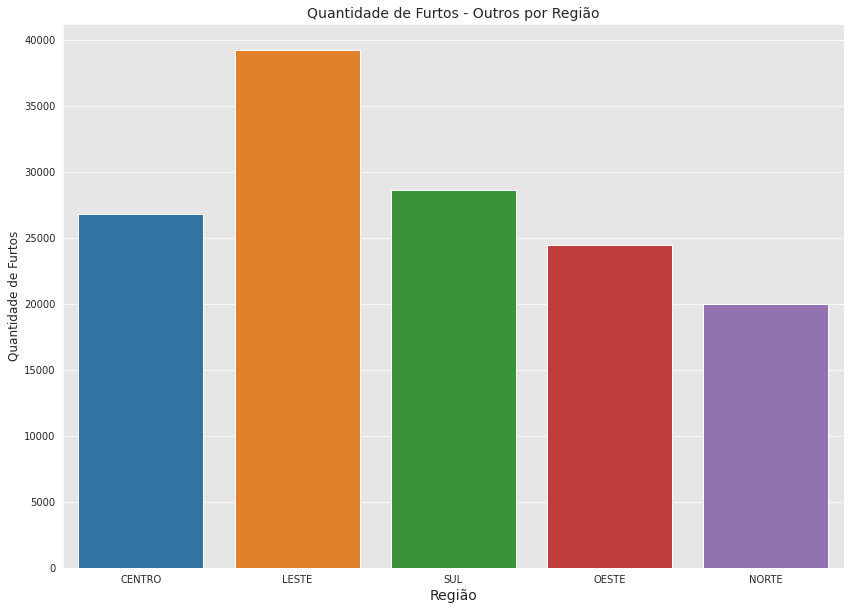

In [40]:
#Gráfico de ocorrências por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_furto,x='REGIÃO')
ax.set_ylabel('Quantidade de Furtos', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Furtos - Outros por Região', fontsize=14)
plt.show()

Acima o gráfico plotado demostra que cerca de 28% dos casos se concentram na região LESTE. Somados os percentais das regiões LESTE e SUL tem-se que essas duas regiões respondem por quase 50% do total de ocorrências de furtos.

In [41]:
#Quantidade de ocorrências por bairro
database_furto['BAIRRO'].value_counts()

PINHEIROS          5669
REPÚBLICA          5382
BELA VISTA         4730
VILA MARIANA       4344
CONSOLAÇÃO         4200
                   ... 
JOSÉ BONIFÁCIO       51
CURSINO              45
MARSILAC             17
SÃO DOMINGOS          6
VILA LEOPOLDINA       1
Name: BAIRRO, Length: 85, dtype: int64

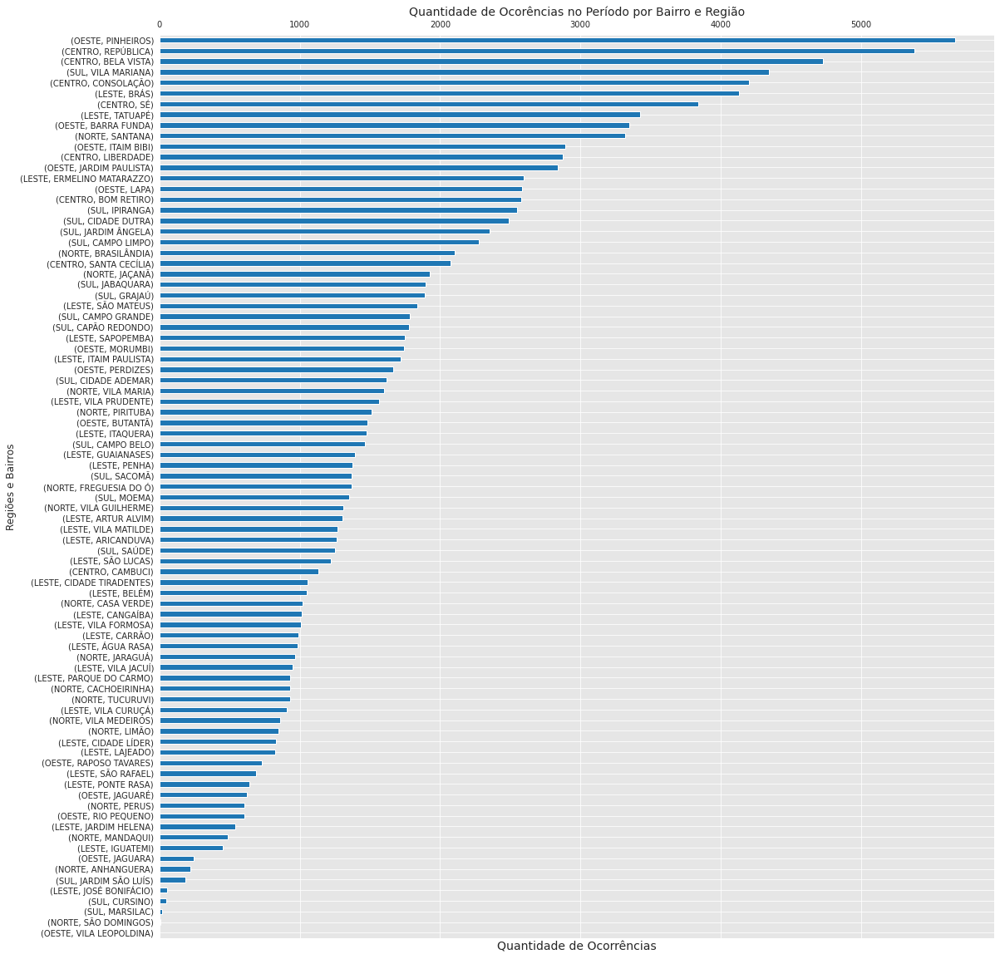

In [42]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(18, 20))
ax = (database_furto.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Regiões e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorências no Período por Bairro e Região', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado da quantidade de furtos por região e bairro no período. Nota-se que os 10 primeiros bairros estão acima de 3000 furtos no período em questão. Verifica-se também que dos 10 primeiros bairros com o maior número de furtos no período, 6 são das regiões LESTE e CENTRO. Analisando as duas primeiras colocadas (PINHEIROS e REPÚBLICA) e dado a baixa população de ambas, é bem possível que esses delitos tenham sido executados por pessoas de bairros adjacentes.

In [43]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_furto.BAIRRO,database_furto.REGIÃO], database_furto.MES_ESTATISTICA, values=database_furto.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7,Total
BAIRRO,REGIÃO,,,,,,,,
ANHANGUERA,NORTE,0.147291,0.118998,0.203133,0.173556,0.175538,0.148845,0.138306,0.159558
ARICANDUVA,LESTE,0.973172,0.916285,0.893784,0.920374,0.882437,0.830653,0.958261,0.909195
ARTUR ALVIM,LESTE,1.146765,1.047183,0.844129,0.815189,0.896670,0.917079,0.923685,0.936507
BARRA FUNDA,OESTE,2.488164,1.612423,2.505304,2.571789,2.723219,2.578384,2.212892,2.405595
BELA VISTA,CENTRO,3.524461,2.707205,2.821288,3.003050,2.922478,5.185576,3.521857,3.399600
...,...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,2.756444,2.850003,3.146301,3.102977,3.302021,3.442647,3.166214,3.122170
VILA MATILDE,LESTE,0.857443,0.827036,1.033720,0.999264,0.849227,0.821050,0.963201,0.909914
VILA MEDEIROS,NORTE,0.794319,0.612840,0.564258,0.610077,0.550337,0.528161,0.676710,0.616672


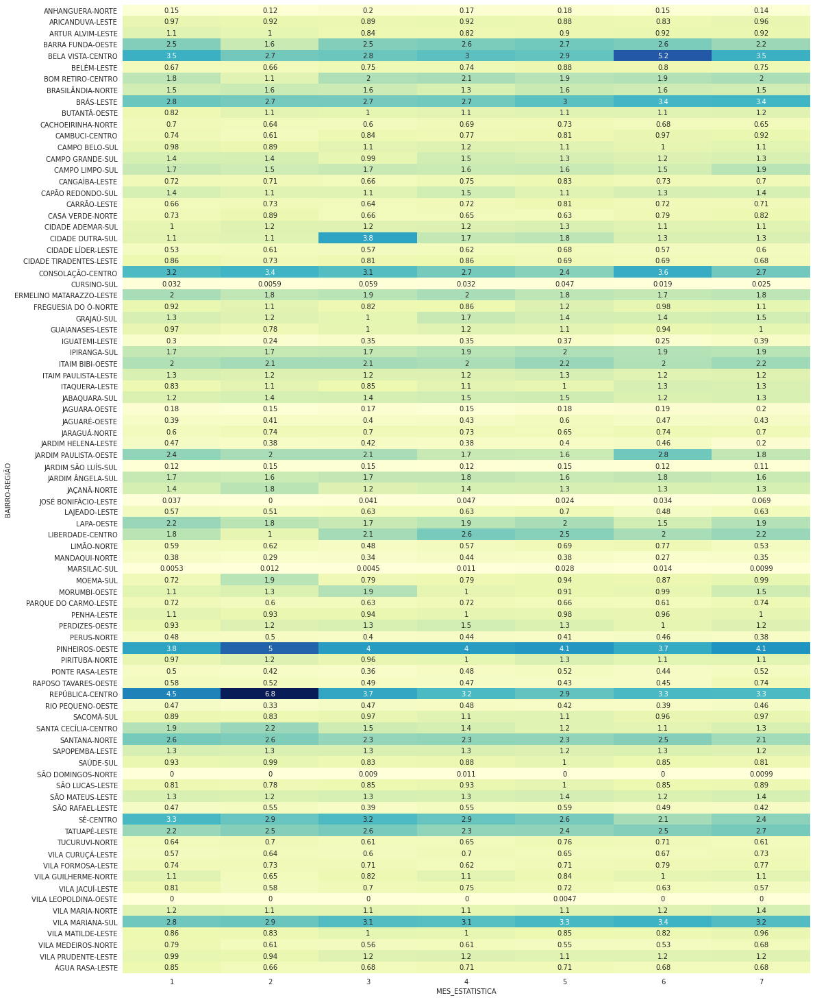

In [44]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(18,26))
sns.heatmap((pd.crosstab([database_furto.BAIRRO,database_furto.REGIÃO], database_furto.MES_ESTATISTICA, values=database_furto.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

         
|    JANEIRO      |   FEVEREIRO     |       MARÇO       |       ABRIL      |      MAIO        |       JUNHO       |      JULHO     |
|:---------------:|:---------------:|:------------------:|:-----------------:|:-----------------:|:-----------------:|:---------------:|
|REPÚBLICA **4.5%** |REPÚBLICA **6.7%** |PINHEIROS    **4.6%** |PINHEIROS  **4,0%** |PINHEIROS  **4.1%** |PINHEIROS **3.7%** |PINHEIROS   **4.1%**|
|SÉ **3.3%** |PINHEIROS **7.3%** |REPÚBLICA **3.8%** |REPÚBLICA  **3,2%** |V. MARIANA **3.3%** |REPÚBLICA  **3.4%** |REPÚBLICA**3.3%**|
|V. MARIANA **2.2%** |CONSOLAÇÃO **3.4%** |C. DUTRA **3.7%** |V. MARIANA **3,1%** |REPÚBLICA **2.9%** |V. MARIANA **3.3%** |V. MARIANA **3.2%**|


Nota-se que o bairro de Pinheiros(OESTE), República(CENTRO) e Vila MAriana (SUL) estão entre os bairros com o maior percentual de furtos comparado com os demais bairros.
Os bairros com o menor percentual de ocorrências são Vila Leopoldina, São Domingos, Marsilac e José Bonifácio.

Na tabela gerada, a coluna 'Total' refere-se a media contribuição no período de cada bairro em seu respectivo mês (exemplo: o bairro VILA PRUDENTE no mês 1 (JANEIRO) contribuiu com 0.98%, ou seja, do total de ocorrências no mês, 0.98% ocorreram na VILA PRUDENTE e no TOTAL a contribuição média no período foi de 1.12%)

In [45]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_furto.BAIRRO,database_furto.REGIÃO], database_furto.MES_ESTATISTICA, values=database_furto.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7
BAIRRO,REGIÃO,,,,,,,
ANHANGUERA,NORTE,12.612613,9.009009,20.270270,14.864865,16.666667,13.963964,12.612613
ARICANDUVA,LESTE,14.624506,12.173913,15.652174,13.833992,14.703557,13.675889,15.335968
ARTUR ALVIM,LESTE,16.730622,13.507291,14.351497,11.895625,14.504988,14.658480,14.351497
BARRA FUNDA,OESTE,14.132059,8.096803,16.582014,14.610099,17.149686,16.044219,13.385121
BELA VISTA,CENTRO,14.164905,9.619450,13.213531,12.071882,13.023256,22.832981,15.073996
...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,12.062615,11.026703,16.045120,13.581952,16.022099,16.505525,14.755985
VILA MATILDE,LESTE,12.875197,10.979463,18.088468,15.007899,14.139021,13.507109,15.402844
VILA MEDEIROS,NORTE,17.599068,12.004662,14.568765,13.519814,13.519814,12.820513,15.967366


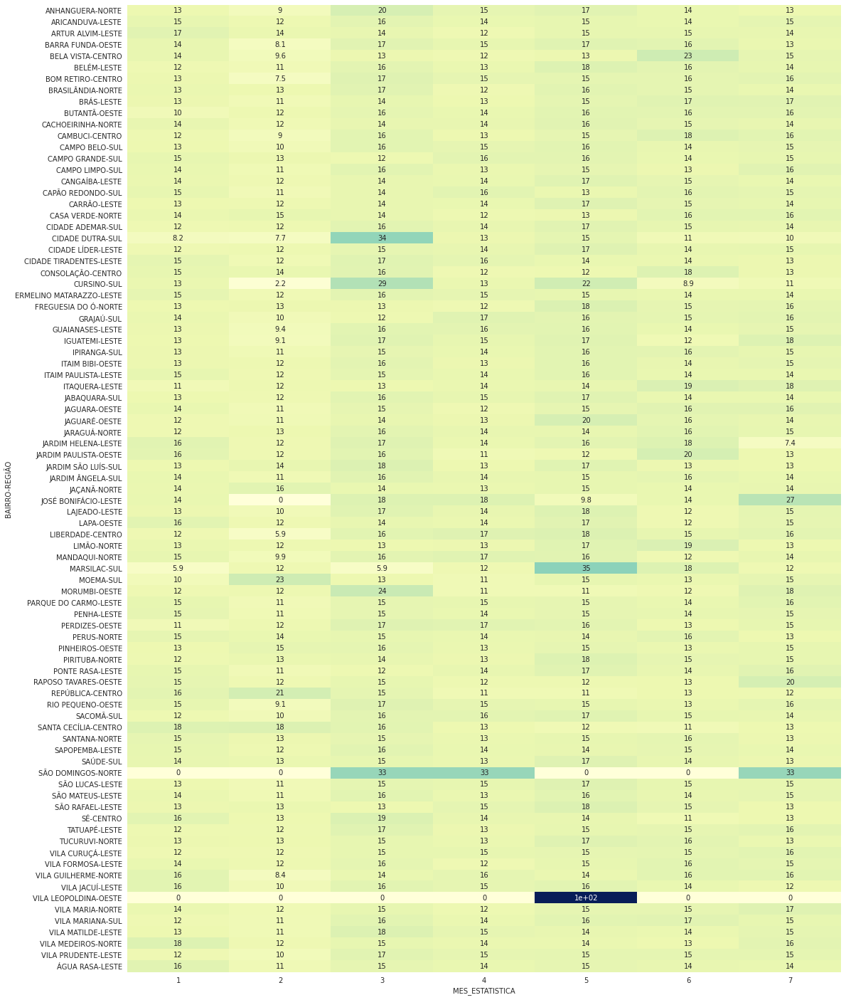

In [46]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(18,25))
sns.heatmap((pd.crosstab([database_furto.BAIRRO,database_furto.REGIÃO], database_furto.MES_ESTATISTICA, values=database_furto.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A mesma análise acima foi feita, porém agora analisando cada bairro ao longo do período (JANEIRO a JULHO), ou seja, a distribuição  por mês dos percentuais de todas as ocorrências de furtos separados por bairro. Alguns pontos importantes a serem ressaltados:

- Vila Leopoldina apresentou todos as ocorrências no mês de MAIO no período analisado;
- São Domingos apresenta percentual de 0% em 4 dos 7 meses do período
- pratiamente todos os bairros apresentam uma distribuição uniforme de percentuais de ocorrências no período

#### Análise de Ocorrência FURTO na região NORTE

In [47]:
#Separando pela região NORTE
database_furto_n = database_furto[database_furto['REGIÃO']== 'NORTE'].reset_index()

In [48]:
database_furto_n

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,4345,8089,12/31/2022,NaN,SANTANA,"-23,5566781","-46,6608408",FURTO,1,2023,111492.0,NORTE
1,4972,8767,12/31/2022,8:00:00 PM,ANHANGUERA,"-23,44202128","-46,8063014",FURTO,1,2023,88677.0,NORTE
2,8874,15889,1/1/2023,8:00:00 PM,PIRITUBA,"-23,51385","-46,7436806",FURTO,1,2023,171585.0,NORTE
3,8875,15891,1/3/2023,NaN,PIRITUBA,0,0,FURTO,1,2023,171585.0,NORTE
4,8876,15892,1/2/2023,NaN,PIRITUBA,"-23,48453609","-46,74722821",FURTO,1,2023,171585.0,NORTE
...,...,...,...,...,...,...,...,...,...,...,...,...
20006,135493,276300,6/29/2023,2:00:00 PM,SANTANA,NaN,NaN,FURTO,7,2023,111492.0,NORTE
20007,135525,276334,7/19/2023,NaN,SANTANA,0,0,FURTO,7,2023,111492.0,NORTE
20008,135720,277181,7/15/2023,NaN,SANTANA,"-23,670683","-46,6881922",FURTO,7,2023,111492.0,NORTE
20009,136804,279680,6/8/2023,NaN,SANTANA,"-23,5153307","-46,4549477",FURTO,7,2023,111492.0,NORTE


In [49]:
#Quantidade de Furtos no Período por Bairro e Região
x = database_furto_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_furto_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_furto_n.shape[0])

REGIÃO  BAIRRO        
NORTE   SANTANA           3319
        BRASILÂNDIA       2106
        JAÇANÃ            1929
        VILA MARIA        1603
        PIRITUBA          1509
        FREGUESIA DO Ó    1367
        VILA GUILHERME    1310
        CASA VERDE        1021
        JARAGUÁ            964
        CACHOEIRINHA       930
        TUCURUVI           929
        VILA MEDEIROS      858
        LIMÃO              845
        PERUS              607
        MANDAQUI           486
        ANHANGUERA         222
        SÃO DOMINGOS         6
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        
NORTE   SANTANA           0.165859
        BRASILÂNDIA       0.105242
        JAÇANÃ            0.096397
        VILA MARIA        0.080106
        PIRITUBA          0.075409
        FREGUESIA DO Ó    0.068312
        VILA GUILHERME    0.065464
        CASA VERDE        0.051022
        JARAGUÁ           0.048174
        CACHOEIRINHA      0.046474
        TUCURUVI          0.046424
        VILA ME

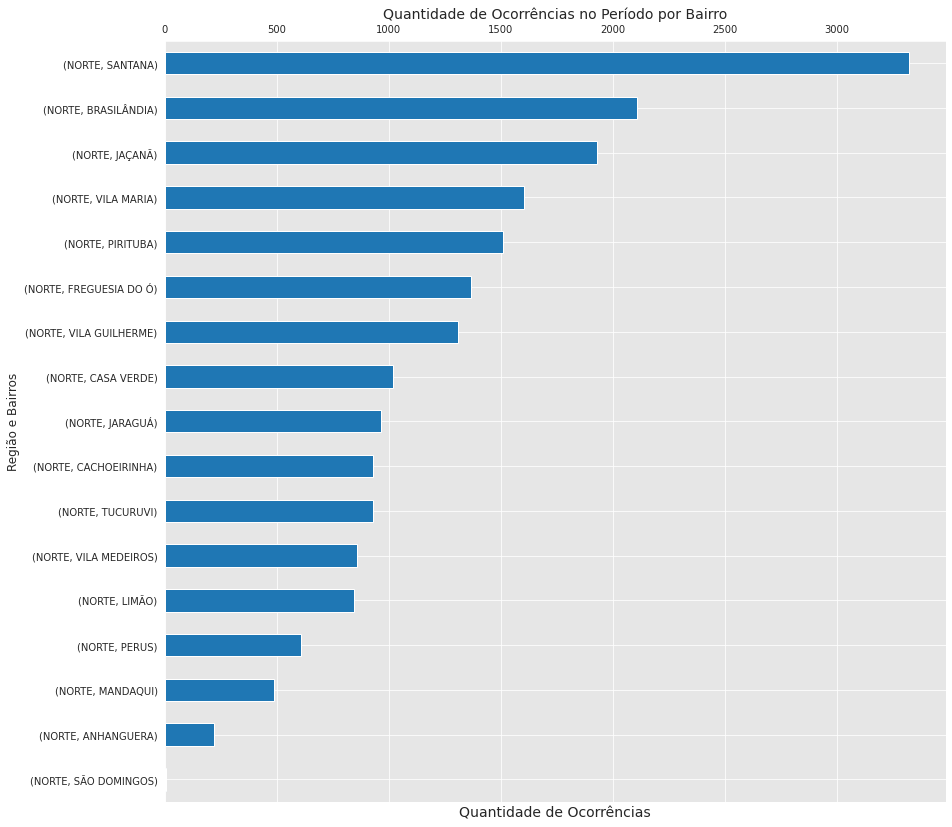

In [50]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_furto_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região NORTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de furtos é SANTANA com um percentual 57% maior do que o bairro BRASILÂNDIA (2º posição).

In [51]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
furto_cross_n = (pd.crosstab([database_furto_n.REGIÃO,database_furto_n.BAIRRO], database_furto_n.MES_ESTATISTICA, values=database_furto_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
furto_cross_n.reset_index(inplace=True)
furto_cross_n

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,NORTE,ANHANGUERA,1.000357,0.788333,1.526459,1.238274,1.193934,1.015062,0.962530,1.109390
1,NORTE,BRASILÂNDIA,10.039300,10.524241,11.804613,9.418386,10.971281,10.576293,10.175318,10.524212
2,NORTE,CACHOEIRINHA,4.751697,4.217580,4.511533,4.915572,4.937076,4.616896,4.537642,4.647444
3,NORTE,CASA VERDE,4.930332,5.912495,4.986431,4.652908,4.259439,5.370007,5.706428,5.102194
4,NORTE,FREGUESIA DO Ó,6.216506,7.016161,6.139756,6.153846,8.131655,6.712508,7.322104,6.831243
5,NORTE,JARAGUÁ,4.108610,4.887663,5.223881,5.178236,4.420781,5.075311,4.847026,4.817350
6,NORTE,JAÇANÃ,9.360486,12.219156,9.192673,9.756098,9.099710,8.873608,9.384668,9.639698
7,NORTE,LIMÃO,4.037156,4.099330,3.595658,4.090056,4.678929,5.239031,3.712616,4.222678
8,NORTE,MANDAQUI,2.572347,1.891998,2.578019,3.114447,2.581478,1.866405,2.406325,2.428664
9,NORTE,PERUS,3.286888,3.310997,3.018996,3.151970,2.775089,3.110675,2.646958,3.033332


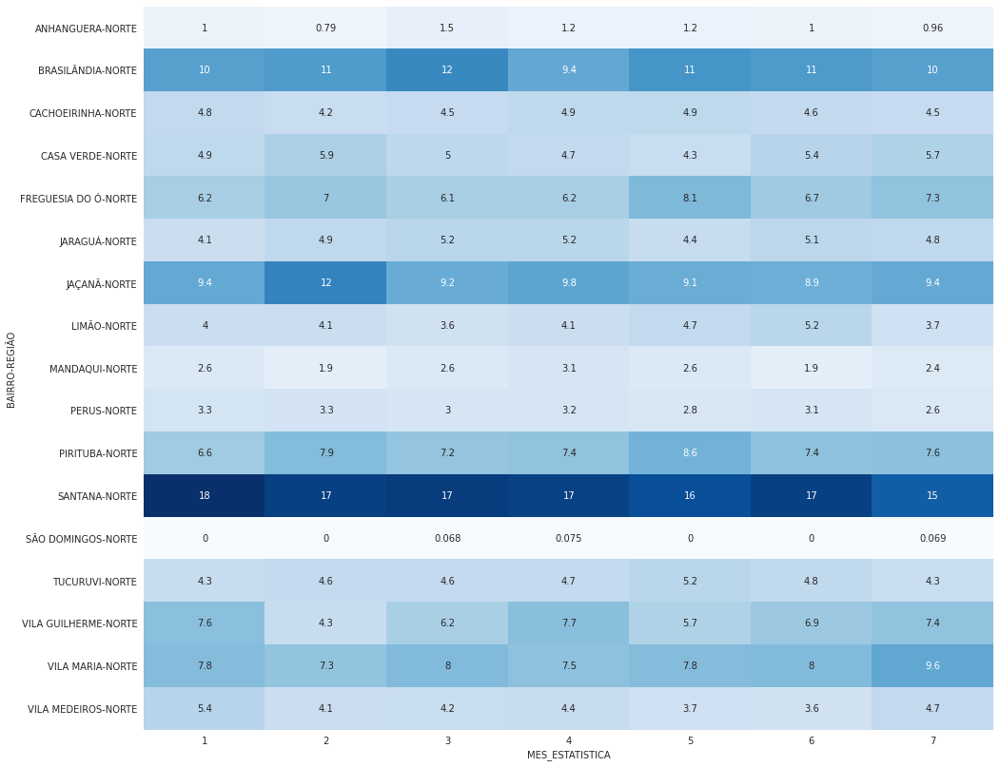

In [52]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_furto_n.BAIRRO,database_furto_n.REGIÃO], database_furto_n.MES_ESTATISTICA, values=database_furto_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro de SANTANA é o bairro que mais contribuiu no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - os bairros de JAÇANÃ e BRASILÂNDIA demonstram os segundos maiores percentuais 
 - já o menor percentual é o bairro SÃO DOMINGOS

In [53]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_furto_n.REGIÃO,database_furto_n.BAIRRO], database_furto_n.MES_ESTATISTICA, values=database_furto_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                1          2          3          4          5  \
REGIÃO BAIRRO                                                                  
NORTE  ANHANGUERA      12.612613   9.009009  20.270270  14.864865  16.666667   
       BRASILÂNDIA     13.342830  12.678063  16.524217  11.918329  16.144349   
       CACHOEIRINHA    14.301075  11.505376  14.301075  14.086022  16.451613   
       CASA VERDE      13.516161  14.691479  14.397649  12.144956  12.928501   
       FREGUESIA DO Ó  12.728603  13.021214  13.240673  11.997074  18.434528   
       JARAGUÁ         11.929461  12.863071  15.975104  14.315353  14.211618   
       JAÇANÃ          13.582167  16.070503  14.048730  13.478486  14.618974   
       LIMÃO           13.372781  12.307692  12.544379  12.899408  17.159763   
       MANDAQUI        14.814815   9.876543  15.637860  17.078189  16.460905   
       PERUS           15.156507  13.838550  14.662273  13.838550  14.168040   
       PIRITUBA        12.193506  13.320080  14.115308  12.988734  17.760106   
       SANTANA         15.155167  12.925580  15.185297  13.437782  14.823742   
       SÃO DOMINGOS     0.000000   0.000000  33.333333  33.333333   0.000000   
       TUCURUVI        13.024758  12.594187  14.639397  13.347686  17.222820   
       VILA GUILHERME  16.259542   8.396947  13.893130  15.572519  13.511450   
       VILA MARIA      13.661884  11.540861  14.722396  12.476606  15.096694   
       VILA MEDEIROS   17.599068  12.004662  14.568765  13.519814  13.519814   

MES_ESTATISTICA                6          7  
REGIÃO BAIRRO                                
NORTE  ANHANGUERA      13.963964  12.612613  
       BRASILÂNDIA     15.337132  14.055081  
       CACHOEIRINHA    15.161290  14.193548  
       CASA VERDE      16.062684  16.258570  
       FREGUESIA DO Ó  14.996342  15.581565  
       JARAGUÁ         16.078838  14.626556  
       JAÇANÃ          14.048730  14.152411  
       LIMÃO           18.934911  12.781065  
       MANDAQUI        11.728395  14.403292  
       PERUS           15.650741  12.685338  
       PIRITUBA        15.043075  14.579192  
       SANTANA         15.516722  12.955710  
       SÃO DOMINGOS     0.000000  33.333333  
       TUCURUVI        15.823466  13.347686  
       VILA GUILHERME  16.030534  16.335878  
       VILA MARIA      15.159077  17.342483  
       VILA MEDEIROS   12.820513  15.967366

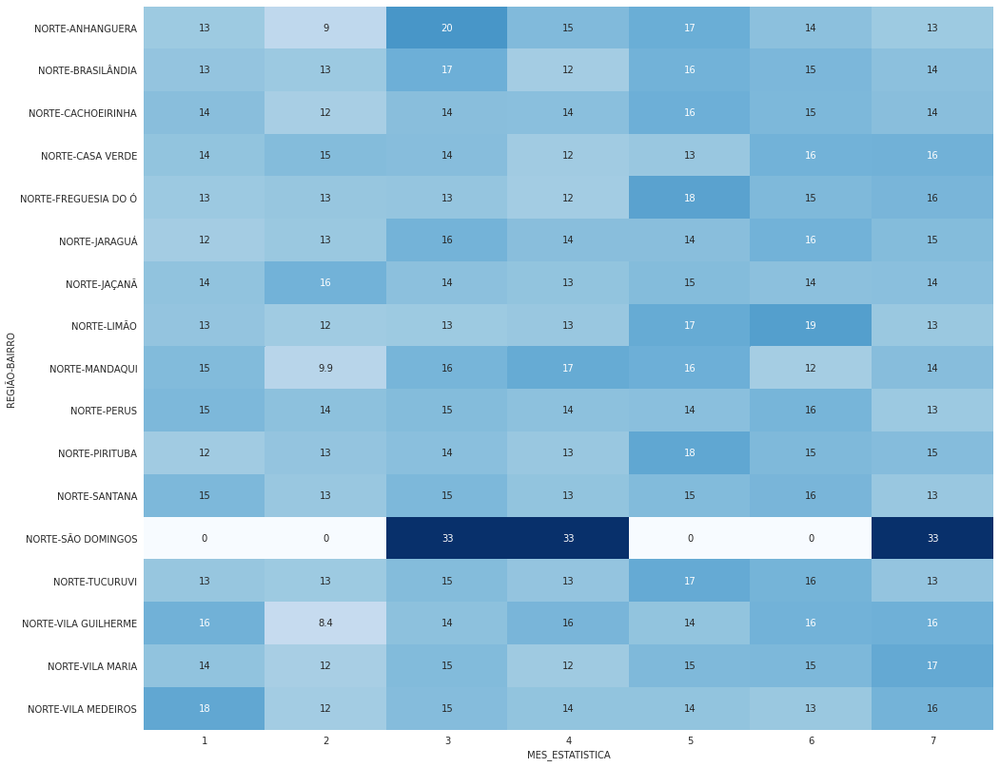

In [54]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_furto_n.REGIÃO,database_furto_n.BAIRRO], database_furto_n.MES_ESTATISTICA, values=database_furto_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências de furtos separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada (exceto São Domingos)
- vale ressaltar o bairro São Domingos que teve um percentual de 0% em 4 dos 7 meses
- o único bairro a apresentar o maior percentual na distribuição dos meses foi Anhanguera, no mês de março.

#### Análise de Ocorrência FURTO na região SUL

In [55]:
#Separando pela região SUL
database_furto_s = database_furto[database_furto['REGIÃO']== 'SUL'].reset_index()

In [56]:
database_furto_s

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,637,881,1/22/2023,NaN,IPIRANGA,NaN,NaN,FURTO,1,2023,113158.0,SUL
1,2574,4907,1/2/2023,NaN,VILA MARIANA,NaN,NaN,FURTO,1,2023,131624.0,SUL
2,2592,4925,1/6/2023,NaN,VILA MARIANA,NaN,NaN,FURTO,1,2023,131624.0,SUL
3,2618,4951,1/10/2023,NaN,VILA MARIANA,NaN,NaN,FURTO,1,2023,131624.0,SUL
4,2619,4952,1/10/2023,1:30:00 PM,SAÚDE,"-23,5557714","-46,6395571",FURTO,1,2023,133796.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...,...
28652,139126,284610,7/26/2023,3:30:00 PM,SACOMÃ,"-23,64019298","-46,59078359",FURTO,7,2023,266814.0,SUL
28653,139127,284611,7/18/2023,NaN,SACOMÃ,"-23,64019298","-46,59078359",FURTO,7,2023,266814.0,SUL
28654,139131,284630,7/5/2023,7:55:00 AM,CAMPO BELO,"-23,62905364","-46,66144526",FURTO,7,2023,62894.0,SUL
28655,139132,284631,7/12/2023,9:30:00 AM,CAMPO BELO,"-23,62905364","-46,66144526",FURTO,7,2023,62894.0,SUL


In [57]:
x = database_furto_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_furto_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_furto_s.shape[0])

REGIÃO  BAIRRO         
SUL     VILA MARIANA       4344
        IPIRANGA           2548
        CIDADE DUTRA       2487
        JARDIM ÂNGELA      2353
        CAMPO LIMPO        2278
        JABAQUARA          1894
        GRAJAÚ             1888
        CAMPO GRANDE       1786
        CAPÃO REDONDO      1777
        CIDADE ADEMAR      1620
        CAMPO BELO         1466
        SACOMÃ             1368
        MOEMA              1354
        SAÚDE              1249
        JARDIM SÃO LUÍS     183
        CURSINO              45
        MARSILAC             17
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
SUL     VILA MARIANA       0.151586
        IPIRANGA           0.088914
        CIDADE DUTRA       0.086785
        JARDIM ÂNGELA      0.082109
        CAMPO LIMPO        0.079492
        JABAQUARA          0.066092
        GRAJAÚ             0.065883
        CAMPO GRANDE       0.062323
        CAPÃO REDONDO      0.062009
        CIDADE ADEMAR      0.056531
        CAMPO BELO   

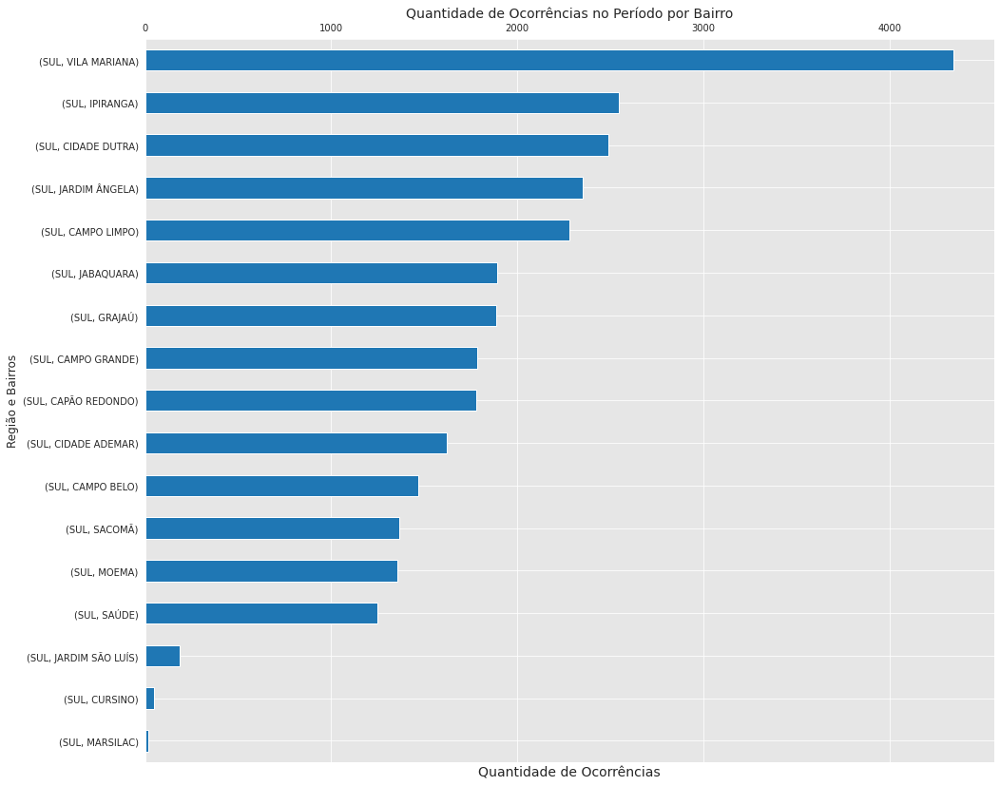

In [58]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_furto_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região SUL em todo o período. Nota-se que o bairro com o maior número de ocorrências de furtos é VILA MARIANA com um percentual 78% maior do que o bairro IPIRANGA (2º posição).

In [59]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
furto_cross_s = (pd.crosstab([database_furto_s.REGIÃO,database_furto_s.BAIRRO], database_furto_s.MES_ESTATISTICA, values=database_furto_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
furto_cross_s.reset_index(inplace=True)
furto_cross_s

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,SUL,CAMPO BELO,5.155211,4.478509,4.990643,5.427873,5.246914,5.063595,5.339806,5.115679
1,SUL,CAMPO GRANDE,7.178492,6.973249,4.574756,6.870416,6.238977,5.951524,6.383495,6.232334
2,SUL,CAMPO LIMPO,8.869180,7.814848,7.714702,7.432763,7.627866,7.247420,9.101942,7.949192
3,SUL,CAPÃO REDONDO,7.150776,5.740908,5.198586,6.992665,5.268959,6.671466,6.674757,6.200928
4,SUL,CIDADE ADEMAR,5.404656,5.921250,5.427324,5.599022,5.996473,5.663547,5.582524,5.653069
5,SUL,CIDADE DUTRA,5.681818,5.740908,17.633604,8.068460,8.465608,6.431485,6.334951,8.678508
6,SUL,CURSINO,0.166297,0.030057,0.270326,0.146699,0.220459,0.095992,0.121359,0.157030
7,SUL,GRAJAÚ,7.095344,5.951307,4.761905,7.775061,6.569665,6.983441,7.233010,6.588268
8,SUL,IPIRANGA,9.118625,8.626390,7.922645,8.704156,9.215168,9.623230,9.126214,8.891370
9,SUL,JABAQUARA,6.568736,6.883078,6.363069,6.772616,7.098765,6.215503,6.407767,6.609205


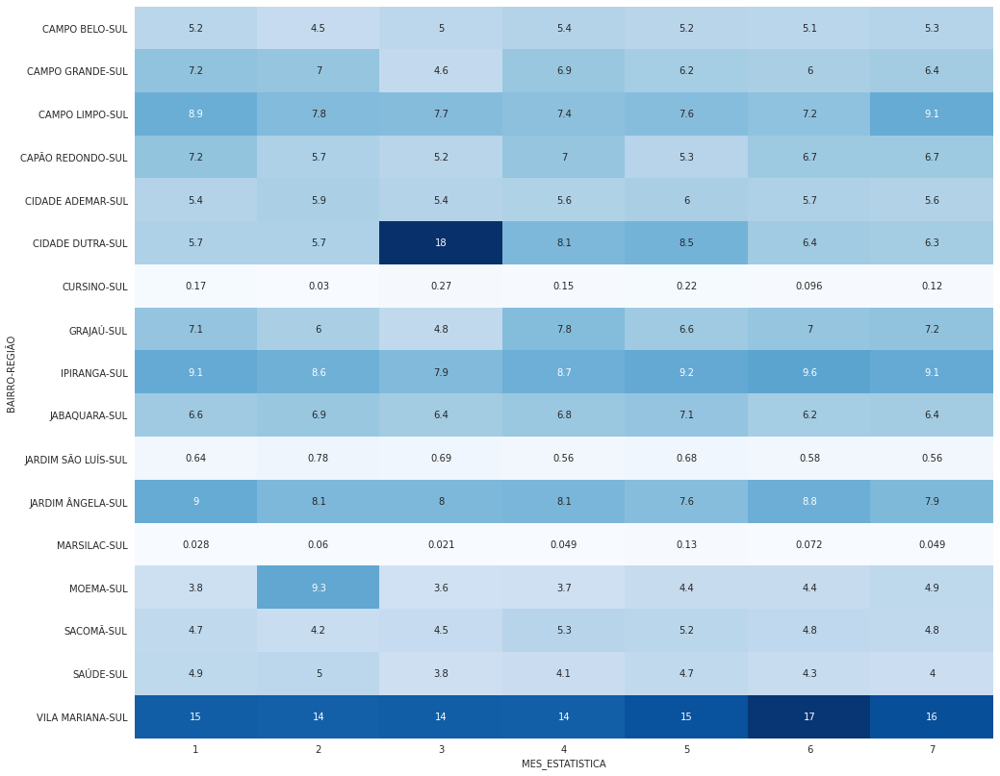

In [60]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_furto_s.BAIRRO,database_furto_s.REGIÃO], database_furto_s.MES_ESTATISTICA, values=database_furto_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro de VILA MARIANA é o bairro que mais contribuiu no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros MARSILAC, JD. SÃO LUIS e CURSINO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [61]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_furto_s.REGIÃO,database_furto_s.BAIRRO], database_furto_s.MES_ESTATISTICA, values=database_furto_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
SUL    CAMPO BELO       12.687585  10.163711  16.371078  15.143247  16.234652   
       CAMPO GRANDE     14.501680  12.989922  12.318029  15.733483  15.845465   
       CAMPO LIMPO      14.047410  11.413521  16.286216  13.345040  15.188762   
       CAPÃO REDONDO    14.518852  10.748452  14.068655  16.094541  13.449634   
       CIDADE ADEMAR    12.037037  12.160494  16.111111  14.135802  16.790123   
       CIDADE DUTRA      8.242863   7.679936  34.097306  13.268999  15.440290   
       CURSINO          13.333333   2.222222  28.888889  13.333333  22.222222   
       GRAJAÚ           13.559322  10.487288  12.129237  16.843220  15.783898   
       IPIRANGA         12.912088  11.263736  14.952904  13.971743  16.405024   
       JABAQUARA        12.513200  12.090813  16.156283  14.625132  17.001056   
       JARDIM SÃO LUÍS  12.568306  14.207650  18.032787  12.568306  16.939891   
       JARDIM ÂNGELA    13.854654  11.389715  16.447089  14.152146  14.704632   
       MARSILAC          5.882353  11.764706   5.882353  11.764706  35.294118   
       MOEMA            10.118168  22.968981  12.850812  11.152142  14.623338   
       SACOMÃ           12.426901  10.160819  15.716374  15.716374  17.105263   
       SAÚDE            14.091273  13.370697  14.651721  13.370697  17.213771   
       VILA MARIANA     12.062615  11.026703  16.045120  13.581952  16.022099   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
SUL    CAMPO BELO       14.392906  15.006821  
       CAMPO GRANDE     13.885778  14.725644  
       CAMPO LIMPO      13.257243  16.461809  
       CAPÃO REDONDO    15.644344  15.475521  
       CIDADE ADEMAR    14.567901  14.197531  
       CIDADE DUTRA     10.776035  10.494572  
       CURSINO           8.888889  11.111111  
       GRAJAÚ           15.413136  15.783898  
       IPIRANGA         15.737834  14.756672  
       JABAQUARA        13.674762  13.938754  
       JARDIM SÃO LUÍS  13.114754  12.568306  
       JARDIM ÂNGELA    15.554611  13.897153  
       MARSILAC         17.647059  11.764706  
       MOEMA            13.441654  14.844904  
       SACOMÃ           14.546784  14.327485  
       SAÚDE            14.251401  13.050440  
       VILA MARIANA     16.505525  14.755985

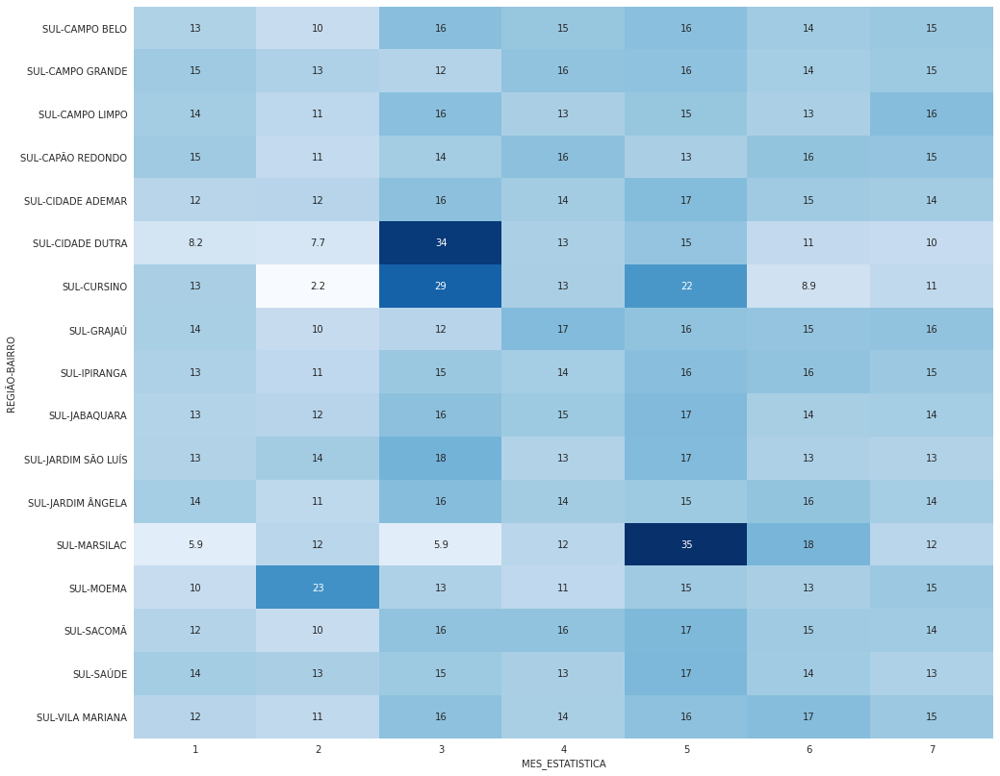

In [62]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_furto_s.REGIÃO,database_furto_s.BAIRRO], database_furto_s.MES_ESTATISTICA, values=database_furto_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências de furtos separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- os bairros MOEMA, CURSINO, CIDADE DUTRA e MARSILAC são os que apresentaram o maior percentual entre os meses de fevereiro a maio)

#### Análise de Ocorrência FURTO na região LESTE

In [63]:
#Separando pela região LESTE
database_furto_l = database_furto[database_furto['REGIÃO']== 'LESTE'].reset_index()

In [64]:
database_furto_l

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,5,110,1/1/2023,7:45:00 AM,BRÁS,"-23,5519317","-46,6256609",FURTO,1,2023,33770.0,LESTE
1,13,119,1/1/2023,2:45:00 PM,BRÁS,"-23,5523761","-46,6256772",FURTO,1,2023,33770.0,LESTE
2,17,126,1/31/2022,3:30:35 PM,BRÁS,"-23,5490633","-46,6256366",FURTO,1,2023,33770.0,LESTE
3,35,146,1/2/2023,5:00:00 PM,BRÁS,"-23,54708244","-46,62424248",FURTO,1,2023,33770.0,LESTE
4,65,184,1/3/2023,NaN,BRÁS,NaN,NaN,FURTO,1,2023,33770.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
39224,139118,284461,7/28/2023,12:30:00 PM,SAPOPEMBA,"-23,60729681","-46,50878294",FURTO,7,2023,291648.0,LESTE
39225,139119,284462,7/29/2023,5:05:00 PM,SAPOPEMBA,"-23,60156557","-46,52471492",FURTO,7,2023,291648.0,LESTE
39226,139120,284463,7/30/2023,7:45:11 AM,SAPOPEMBA,"-23,61391357","-46,51646994",FURTO,7,2023,291648.0,LESTE
39227,139121,284464,7/30/2023,1:00:00 PM,SÃO LUCAS,"-23,60522059","-46,52568541",FURTO,7,2023,142744.0,LESTE


In [65]:
x = database_furto_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_furto_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_furto_l.shape[0])

REGIÃO  BAIRRO            
LESTE   BRÁS                  4130
        TATUAPÉ               3426
        ERMELINO MATARAZZO    2595
        SÃO MATEUS            1835
        SAPOPEMBA             1750
        ITAIM PAULISTA        1721
        VILA PRUDENTE         1563
        ITAQUERA              1478
        GUAIANASES            1395
        PENHA                 1373
        ARTUR ALVIM           1303
        VILA MATILDE          1266
        ARICANDUVA            1265
        SÃO LUCAS             1220
        CIDADE TIRADENTES     1054
        BELÉM                 1049
        CANGAÍBA              1014
        VILA FORMOSA          1006
        CARRÃO                 988
        ÁGUA RASA              986
        VILA JACUÍ             946
        PARQUE DO CARMO        930
        VILA CURUÇÁ            908
        CIDADE LÍDER           831
        LAJEADO                827
        SÃO RAFAEL             687
        PONTE RASA             643
        JARDIM HELENA       

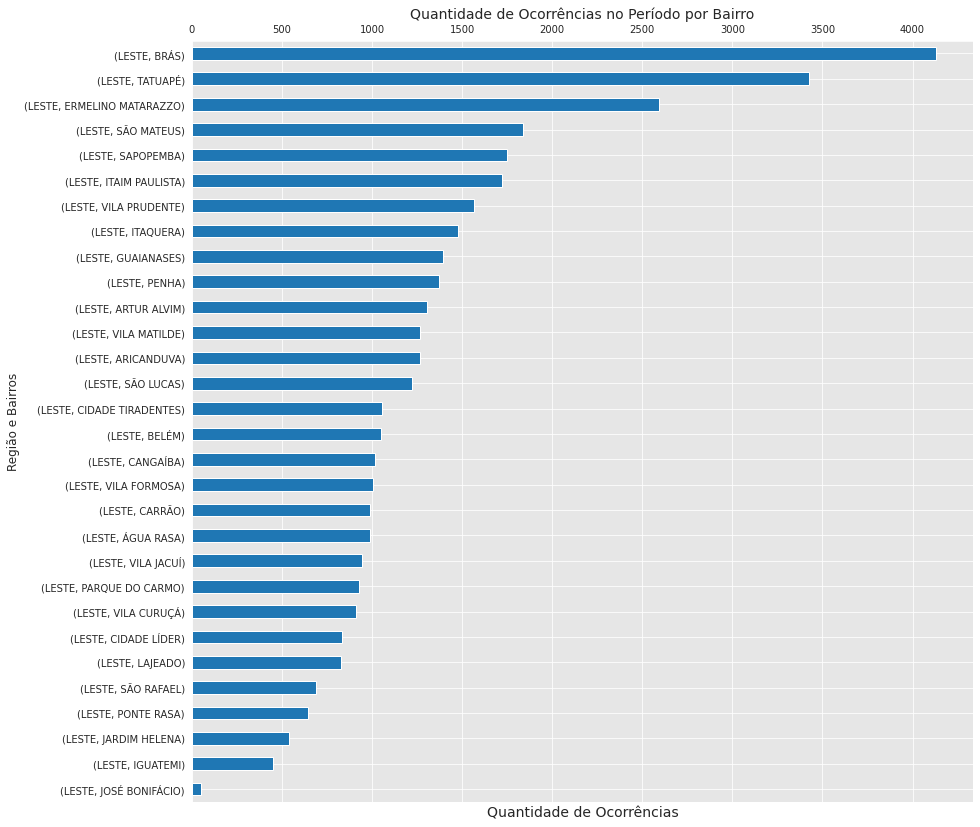

In [66]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_furto_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região LESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de furtos é BRÁS com um percentual 20% maior do que o bairro TATUAPÉ (2º posição). Percebe-se que as 3 primeiras posições se destacam e muito dos demais bairros.

In [67]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
furto_cross_l = (pd.crosstab([database_furto_l.REGIÃO,database_furto_l.BAIRRO], database_furto_l.MES_ESTATISTICA, values=database_furto_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
furto_cross_l.reset_index(inplace=True)
furto_cross_l

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,LESTE,ARICANDUVA,3.454070,3.426029,3.244838,3.210420,3.050180,2.956254,3.302128,3.224655
1,LESTE,ARTUR ALVIM,4.070202,3.915462,3.064569,2.843515,3.099377,3.263841,3.182979,3.321522
2,LESTE,BELÉM,2.371173,2.469410,2.736808,2.586681,3.033782,2.836637,2.587234,2.674042
3,LESTE,BRÁS,9.988798,10.033370,9.783677,9.502844,10.495244,11.961722,11.727660,10.527926
4,LESTE,CANGAÍBA,2.557879,2.669633,2.392658,2.605027,2.853395,2.614491,2.417021,2.584822
5,LESTE,CARRÃO,2.333831,2.736374,2.310718,2.494955,2.787799,2.563226,2.434043,2.518545
6,LESTE,CIDADE LÍDER,1.867065,2.291435,2.064897,2.164740,2.345031,2.033493,2.076596,2.118331
7,LESTE,CIDADE TIRADENTES,3.043316,2.714127,2.949853,3.008622,2.377829,2.443609,2.331915,2.686788
8,LESTE,ERMELINO MATARAZZO,7.244212,6.674082,6.751885,7.117960,6.264349,6.168831,6.195745,6.615004
9,LESTE,GUAIANASES,3.435400,2.914349,3.720092,4.017611,3.722532,3.332194,3.608511,3.556043


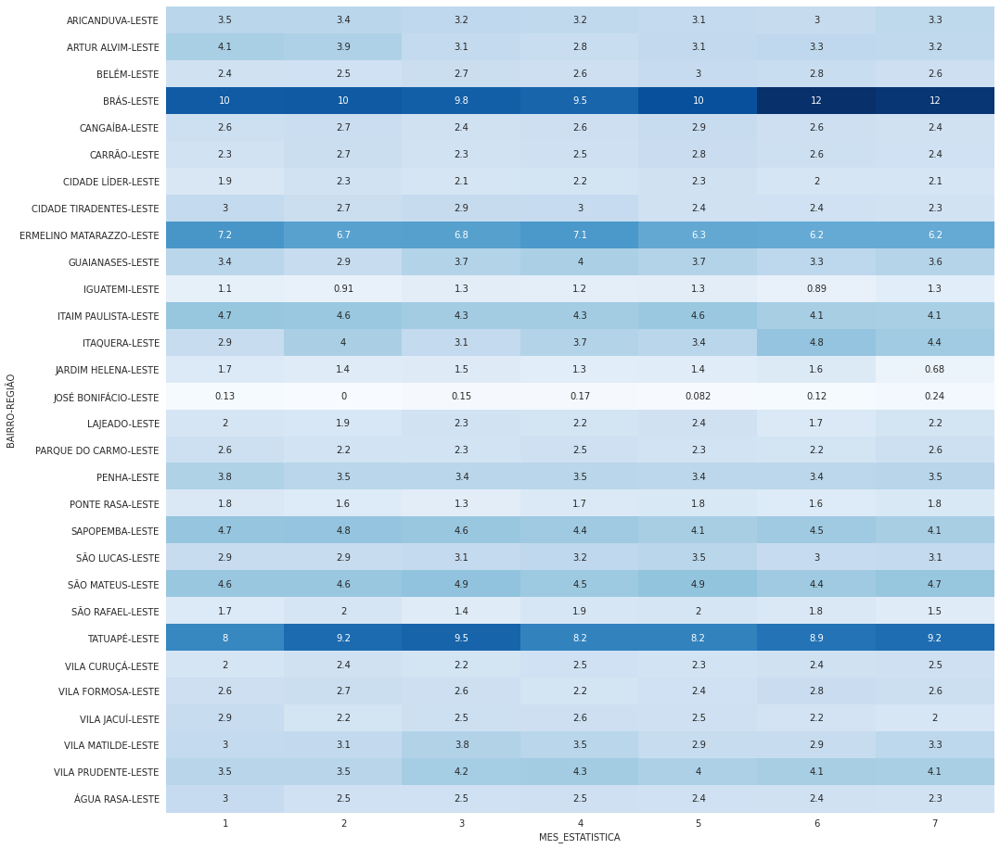

In [68]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_furto_l.BAIRRO,database_furto_l.REGIÃO], database_furto_l.MES_ESTATISTICA, values=database_furto_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro do BRÁS é o bairro que mais contribuiu no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros JOSÉ BONIFÁCIO e JARDIM HELENA
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [69]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_furto_l.REGIÃO,database_furto_l.BAIRRO], database_furto_l.MES_ESTATISTICA, values=database_furto_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                    1          2          3          4  \
REGIÃO BAIRRO                                                           
LESTE  ARICANDUVA          14.624506  12.173913  15.652174  13.833992   
       ARTUR ALVIM         16.730622  13.507291  14.351497  11.895625   
       BELÉM               12.106768  10.581506  15.919924  13.441373   
       BRÁS                12.953995  10.920097  14.455206  12.542373   
       CANGAÍBA            13.510848  11.834320  14.398422  14.003945   
       CARRÃO              12.651822  12.449393  14.271255  13.765182   
       CIDADE LÍDER        12.033694  12.394705  15.162455  14.199759   
       CIDADE TIRADENTES   15.464896  11.574953  17.077799  15.559772   
       ERMELINO MATARAZZO  14.951830  11.560694  15.876686  14.951830   
       GUAIANASES          13.189964   9.390681  16.272401  15.698925   
       IGUATEMI            12.694878   9.131403  17.149220  14.699332   
       ITAIM PAULISTA      14.584544  11.969785  15.398024  13.712958   
       ITAQUERA            10.622463  12.313938  12.719892  13.667118   
       JARDIM HELENA       16.481481  11.851852  17.407407  13.518519   
       JOSÉ BONIFÁCIO      13.725490   0.000000  17.647059  17.647059   
       LAJEADO             13.180169  10.399033  16.928658  14.389359   
       PARQUE DO CARMO     14.731183  10.860215  14.946237  14.623656   
       PENHA               14.857975  11.434814  15.222141  13.911143   
       PONTE RASA          14.774495  10.886470  12.286159  14.307932   
       SAPOPEMBA           14.514286  12.285714  16.171429  13.828571   
       SÃO LUCAS           12.622951  10.737705  15.409836  14.508197   
       SÃO MATEUS          13.514986  11.389646  16.294278  13.460490   
       SÃO RAFAEL          13.100437  13.391557  12.663755  15.283843   
       TATUAPÉ             12.434326  12.113252  16.987741  13.018097   
       VILA CURUÇÁ         12.004405  11.784141  14.757709  14.757709   
       VILA FORMOSA        13.916501  12.226640  15.606362  11.729622   
       VILA JACUÍ          16.279070  10.253700  16.279070  15.010571   
       VILA MATILDE        12.875197  10.979463  18.088468  15.007899   
       VILA PRUDENTE       12.028151  10.108765  16.506718  15.035189   
       ÁGUA RASA           16.430020  11.257606  15.212982  13.691684   

MES_ESTATISTICA                    5          6          7  
REGIÃO BAIRRO                                               
LESTE  ARICANDUVA          14.703557  13.675889  15.335968  
       ARTUR ALVIM         14.504988  14.658480  14.351497  
       BELÉM               17.635844  15.824595  14.489990  
       BRÁS                15.496368  16.949153  16.682809  
       CANGAÍBA            17.159763  15.088757  14.003945  
       CARRÃO              17.206478  15.182186  14.473684  
       CIDADE LÍDER        17.208183  14.320096  14.681107  
       CIDADE TIRADENTES   13.757116  13.567362  12.998102  
       ERMELINO MATARAZZO  14.720617  13.911368  14.026975  
       GUAIANASES          16.272401  13.978495  15.197133  
       IGUATEMI            17.149220  11.581292  17.594655  
       ITAIM PAULISTA      16.385822  14.061592  13.887275  
       ITAQUERA            14.208390  18.944520  17.523681  
       JARDIM HELENA       15.740741  17.592593   7.407407  
       JOSÉ BONIFÁCIO       9.803922  13.725490  27.450980  
       LAJEADO             17.775091  11.970979  15.356711  
       PARQUE DO CARMO     14.946237  13.763441  16.129032  
       PENHA               15.076475  14.493809  15.003642  
       PONTE RASA          17.107309  14.152411  16.485226  
       SAPOPEMBA           14.400000  14.914286  13.885714  
       SÃO LUCAS           17.459016  14.508197  14.754098  
       SÃO MATEUS          16.130790  14.168937  15.040872  
       SÃO RAFAEL          18.049491  14.992722  12.518195  
       TATUAPÉ             14.623468  15.119673  15.703444  
       VILA CURUÇÁ         15.198238  15.308370  16.189427  
       VILA FORM

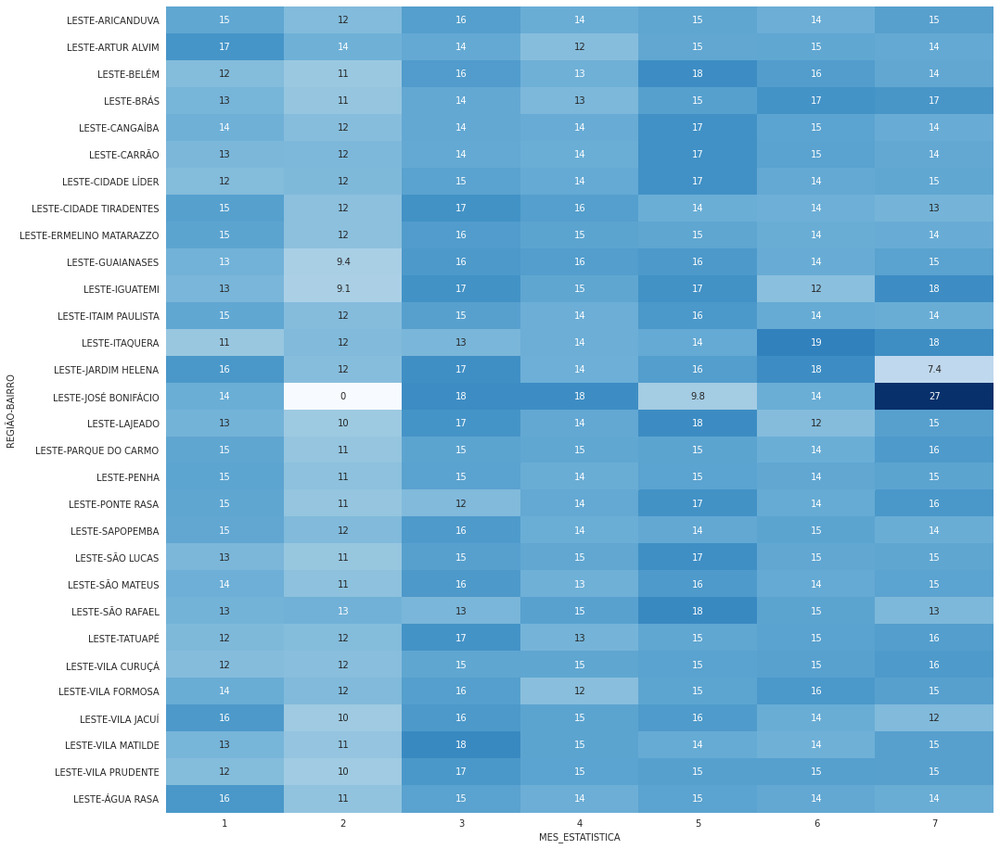

In [70]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_furto_l.REGIÃO,database_furto_l.BAIRRO], database_furto_l.MES_ESTATISTICA, values=database_furto_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências de furtos separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- nos meses de maio, junho e julho alguns bairros apresentam uma elevação nos percentuais;
- O bairo JOSÉ BONIFÁCIO apresenta o menor valor (0% - fevereiro) e o maior valor (27% - julho)

#### Análise de Ocorrência FURTO na região OESTE

In [71]:
#Separando pela região OESTE
database_furto_o = database_furto[database_furto['REGIÃO']== 'OESTE'].reset_index()

In [72]:
database_furto_o

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,1825,3075,1/24/2023,12:30:00 PM,JARDIM PAULISTA,"-23,56437548","-46,65688935",FURTO,1,2023,90279.0,OESTE
1,1881,3147,1/27/2023,NaN,JARDIM PAULISTA,"-23,56585891","-46,65791705",FURTO,1,2023,90279.0,OESTE
2,1962,3998,1/1/2023,NaN,JARDIM PAULISTA,"-23,5546679","-46,6556236",FURTO,1,2023,90279.0,OESTE
3,1969,4005,12/31/2022,NaN,JARDIM PAULISTA,"-23,5655068","-46,65763533",FURTO,1,2023,90279.0,OESTE
4,1985,4023,1/1/2023,NaN,ITAIM BIBI,"-23,5619817","-46,6558762",FURTO,1,2023,97270.0,OESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
24417,136805,279681,6/8/2023,NaN,JAGUARÉ,"-23,5146412","-46,4562827",FURTO,7,2023,56292.0,OESTE
24418,136815,279694,6/14/2023,NaN,JAGUARÉ,"-23,5142803","-46,4566365",FURTO,7,2023,56292.0,OESTE
24419,139128,284618,7/10/2023,4:30:00 PM,MORUMBI,"-23,6026955","-46,7509178",FURTO,7,2023,54007.0,OESTE
24420,139129,284620,7/17/2023,8:00:00 AM,MORUMBI,"-23,6026955","-46,7509178",FURTO,7,2023,54007.0,OESTE


In [73]:
x = database_furto_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_furto_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_furto_o.shape[0])

REGIÃO  BAIRRO         
OESTE   PINHEIROS          5669
        BARRA FUNDA        3347
        ITAIM BIBI         2894
        JARDIM PAULISTA    2837
        LAPA               2582
        MORUMBI            1742
        PERDIZES           1668
        BUTANTÃ            1482
        RAPOSO TAVARES      728
        JAGUARÉ             625
        RIO PEQUENO         604
        JAGUARA             243
        VILA LEOPOLDINA       1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
OESTE   PINHEIROS          0.232127
        BARRA FUNDA        0.137049
        ITAIM BIBI         0.118500
        JARDIM PAULISTA    0.116166
        LAPA               0.105724
        MORUMBI            0.071329
        PERDIZES           0.068299
        BUTANTÃ            0.060683
        RAPOSO TAVARES     0.029809
        JAGUARÉ            0.025592
        RIO PEQUENO        0.024732
        JAGUARA            0.009950
        VILA LEOPOLDINA    0.000041
Name: BAIRRO, dtype: float64


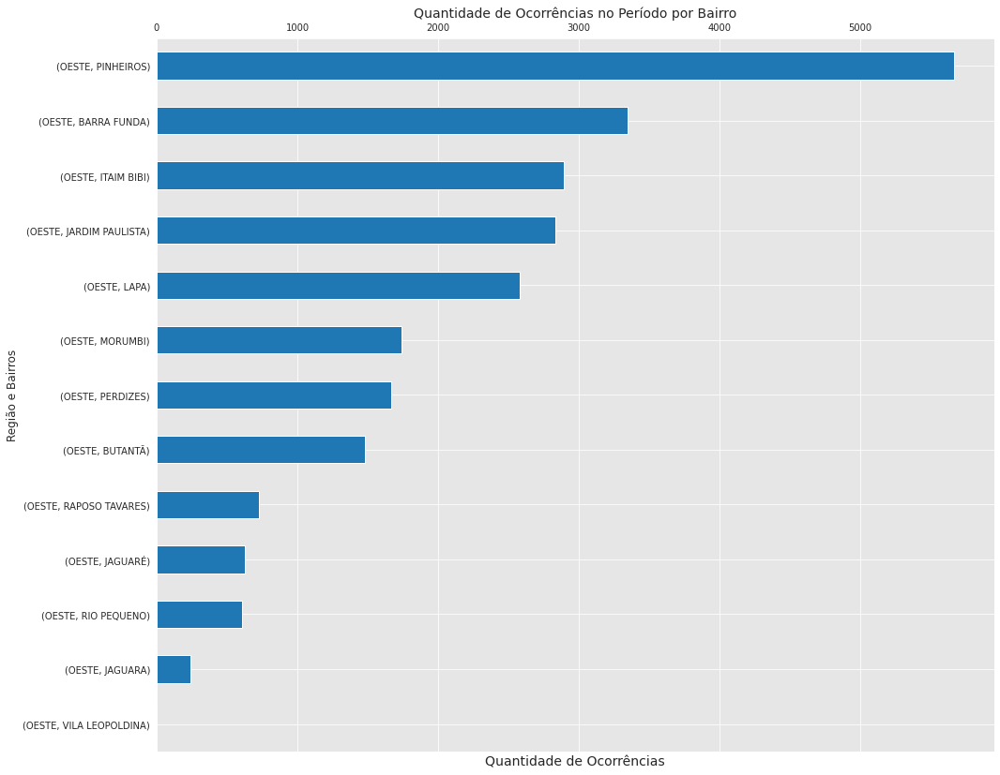

In [74]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_furto_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região OESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de furtos é PINHEIROs com um percentual 70% maior do que o bairro BARRA FUNDA (2º posição). Percebe-se que as 3° , 4° e 5°  posições apresentam valores próximos entre si, similaridade vista também nas 6°, 7° e 8° posições.

In [75]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
furto_cross_o = (pd.crosstab([database_furto_o.BAIRRO,database_furto_o.REGIÃO], database_furto_o.MES_ESTATISTICA, values=database_furto_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
furto_cross_o.reset_index(inplace=True)
furto_cross_o

MES_ESTATISTICA,BAIRRO,REGIÃO,1,2,3,4,5,6,7,Total
0,BARRA FUNDA,OESTE,14.381271,9.161596,13.847305,14.958703,15.446717,15.113988,12.344999,13.704856
1,BUTANTÃ,OESTE,4.712679,6.152806,5.763473,6.301621,6.458558,6.529693,6.503169,6.068299
2,ITAIM BIBI,OESTE,11.401642,11.866126,11.551896,11.716121,12.674919,11.483254,12.207220,11.849971
3,JAGUARA,OESTE,1.033749,0.878972,0.923154,0.887121,0.995694,1.125809,1.102232,0.995005
4,JAGUARÉ,OESTE,2.249924,2.332657,2.220559,2.508412,3.390743,2.730087,2.424910,2.559168
5,JARDIM PAULISTA,OESTE,13.590757,11.595673,11.377246,9.758336,9.068891,16.239797,9.864977,11.616575
6,LAPA,OESTE,12.861052,10.446247,9.281437,10.798409,11.625404,8.640585,10.636539,10.572435
7,MORUMBI,OESTE,6.384919,7.200811,10.578842,5.903946,5.139935,5.797917,8.404519,7.132913
8,PERDIZES,OESTE,5.351171,7.031778,7.235529,8.473539,7.131324,5.910498,6.668504,6.829907
9,PINHEIROS,OESTE,21.982365,28.498986,21.931138,23.126338,23.223897,21.531100,23.146872,23.212677


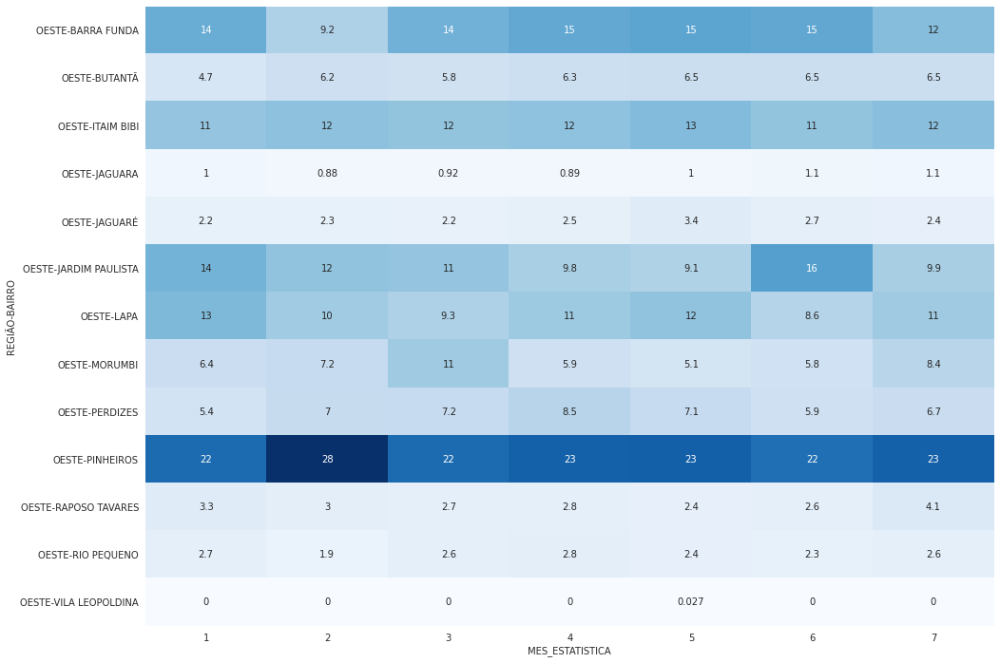

In [76]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_furto_o.REGIÃO,database_furto_o.BAIRRO], database_furto_o.MES_ESTATISTICA, values=database_furto_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro do PINHEIROS é o bairro que mais contribuiu no percentual em todos os meses do período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros JAGUARA  e VILA LEOPOLDINA
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [77]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_furto_o.REGIÃO,database_furto_o.BAIRRO], database_furto_o.MES_ESTATISTICA, values=database_furto_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                 1          2          3          4  \
REGIÃO BAIRRO                                                        
OESTE  BARRA FUNDA      14.132059   8.096803  16.582014  14.610099   
       BUTANTÃ          10.458839  12.280702  15.587045  13.900135   
       ITAIM BIBI       12.957844  12.128542  15.998618  13.234278   
       JAGUARA          13.991770  10.699588  15.226337  11.934156   
       JAGUARÉ          11.840000  11.040000  14.240000  13.120000   
       JARDIM PAULISTA  15.756080  12.090236  16.073317  11.244272   
       LAPA             16.382649  11.967467  14.407436  13.671572   
       MORUMBI          12.055109  12.227325  24.339839  11.079219   
       PERDIZES         10.551559  12.470024  17.386091  16.606715   
       PINHEIROS        12.753572  14.870348  15.505380  13.335685   
       RAPOSO TAVARES   15.109890  12.087912  14.835165  12.362637   
       RIO PEQUENO      14.735099   9.105960  17.218543  15.231788   
       VILA LEOPOLDINA   0.000000   0.000000   0.000000   0.000000   

MES_ESTATISTICA                  5          6          7  
REGIÃO BAIRRO                                             
OESTE  BARRA FUNDA       17.149686  16.044219  13.385121  
       BUTANTÃ           16.194332  15.654521  15.924426  
       ITAIM BIBI        16.275052  14.098134  15.307533  
       JAGUARA           15.226337  16.460905  16.460905  
       JAGUARÉ           20.160000  15.520000  14.080000  
       JARDIM PAULISTA   11.878745  20.338386  12.618964  
       LAPA              16.731216  11.890008  14.949651  
       MORUMBI           10.964409  11.825488  17.508611  
       PERDIZES          15.887290  12.589928  14.508393  
       PINHEIROS         15.223143  13.494443  14.817428  
       RAPOSO TAVARES    12.362637  12.774725  20.467033  
       RIO PEQUENO       14.735099  13.410596  15.562914  
       VILA LEOPOLDINA  100.000000   0.000000   0.000000

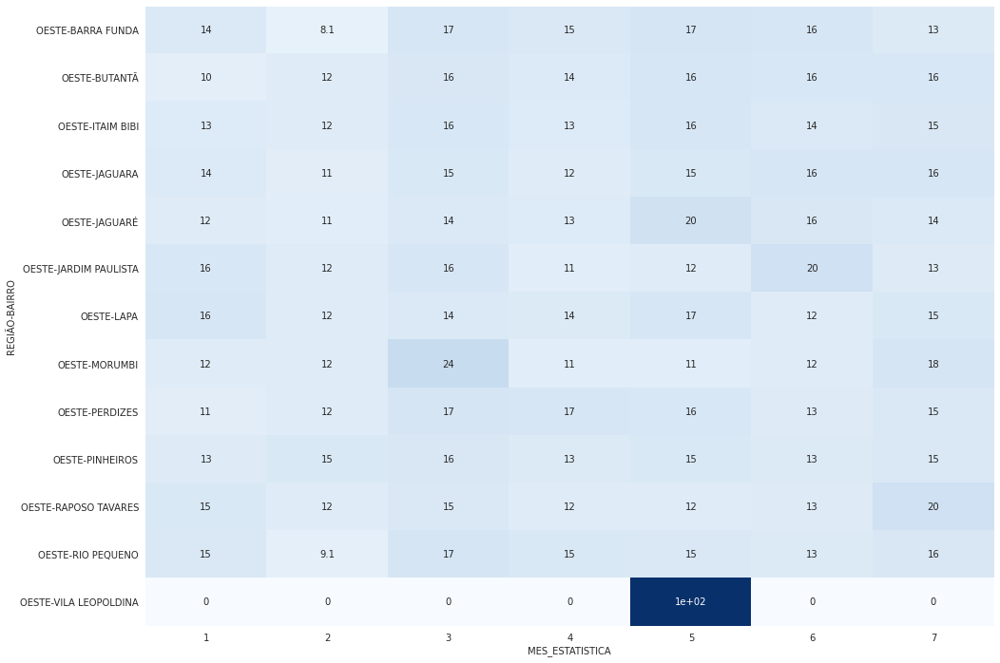

In [78]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_furto_o.REGIÃO,database_furto_o.BAIRRO], database_furto_o.MES_ESTATISTICA, values=database_furto_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências de furtos separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- o bairro VILA LEOPOLDINA é o destaque, pois a única ocorrência registrada em todo período aconteceu em maio (100%) e com 0% nos demais meses

#### Análise de Ocorrência FURTO na região CENTRAL

In [79]:
#Separando pela região CENTRAL
database_furto_c = database_furto[database_furto['REGIÃO']== 'CENTRO'].reset_index()

In [80]:
database_furto_c

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,0,104,12/30/2022,NaN,SÉ,NaN,NaN,FURTO,1,2023,27241.0,CENTRO
1,1,105,12/30/2022,NaN,SÉ,"-23,53899364","-46,63209317",FURTO,1,2023,27241.0,CENTRO
2,2,107,12/31/2022,9:00:00 PM,SÉ,"-23,5527276","-46,62662316",FURTO,1,2023,27241.0,CENTRO
3,3,108,12/30/2022,NaN,SÉ,"-23,5514603","-46,63721902",FURTO,1,2023,27241.0,CENTRO
4,4,109,12/31/2022,NaN,SÉ,"-23,55461826","-46,63313102",FURTO,1,2023,27241.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...,...
26810,135976,278131,7/8/2023,NaN,REPÚBLICA,NaN,NaN,FURTO,7,2023,62203.0,CENTRO
26811,136012,278170,7/16/2023,NaN,REPÚBLICA,NaN,NaN,FURTO,7,2023,62203.0,CENTRO
26812,136080,278246,7/1/2023,12:10:00 AM,BELA VISTA,NaN,NaN,FURTO,7,2023,73508.0,CENTRO
26813,136396,278842,7/14/2023,NaN,CONSOLAÇÃO,NaN,NaN,FURTO,7,2023,57076.0,CENTRO


In [81]:
x = database_furto_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_furto_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_furto_c.shape[0])

REGIÃO  BAIRRO       
CENTRO  REPÚBLICA        5382
        BELA VISTA       4730
        CONSOLAÇÃO       4200
        SÉ               3841
        LIBERDADE        2875
        BOM RETIRO       2577
        SANTA CECÍLIA    2075
        CAMBUCI          1135
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
CENTRO  REPÚBLICA        0.200709
        BELA VISTA       0.176394
        CONSOLAÇÃO       0.156629
        SÉ               0.143241
        LIBERDADE        0.107216
        BOM RETIRO       0.096103
        SANTA CECÍLIA    0.077382
        CAMBUCI          0.042327
Name: BAIRRO, dtype: float64


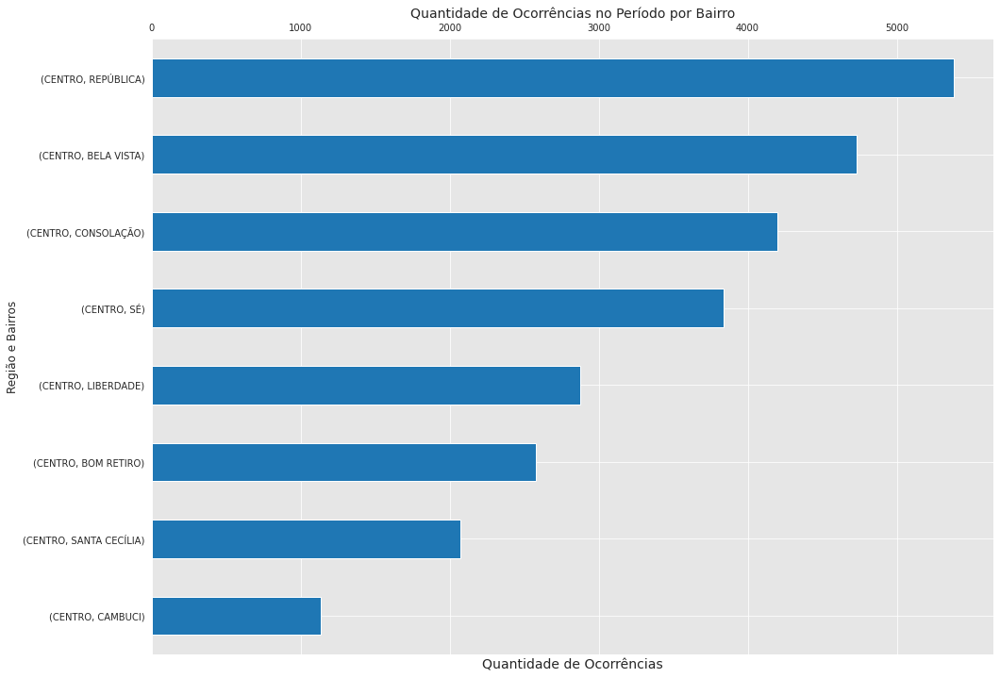

In [82]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 12))
ax = (database_furto_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que o bairro com o maior número de ocorrências de furtos é REPÚBLICA com um percentual 15% maior do que o bairro BELA VISTA (2º posição).

In [83]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
furto_cross_c = (pd.crosstab([database_furto_c.REGIÃO,database_furto_c.BAIRRO], database_furto_c.MES_ESTATISTICA, values=database_furto_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
furto_cross_c.reset_index(inplace=True)
furto_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,CENTRO,BELA VISTA,16.927741,13.037249,14.582361,16.134501,16.974373,25.708165,19.207974,17.639381
1,CENTRO,BOM RETIRO,8.640728,5.501433,10.359309,11.020062,10.994764,9.569150,10.991379,9.610293
2,CENTRO,CAMBUCI,3.562405,2.922636,4.339711,4.125459,4.712042,4.832183,5.010776,4.232706
3,CENTRO,CONSOLAÇÃO,15.462355,16.504298,16.145590,14.297824,14.191237,17.900500,14.735991,15.662875
4,CENTRO,LIBERDADE,8.767054,4.899713,10.802613,14.100028,14.273905,10.116639,12.176724,10.721611
5,CENTRO,REPÚBLICA,21.576554,32.578797,19.295380,17.406047,16.891706,16.115211,17.726293,20.070856
6,CENTRO,SANTA CECÍLIA,9.221829,10.716332,7.886141,7.487991,6.696060,5.332064,7.165948,7.738206
7,CENTRO,SÉ,15.841334,13.839542,16.588894,15.428087,15.265913,10.426089,12.984914,14.324072


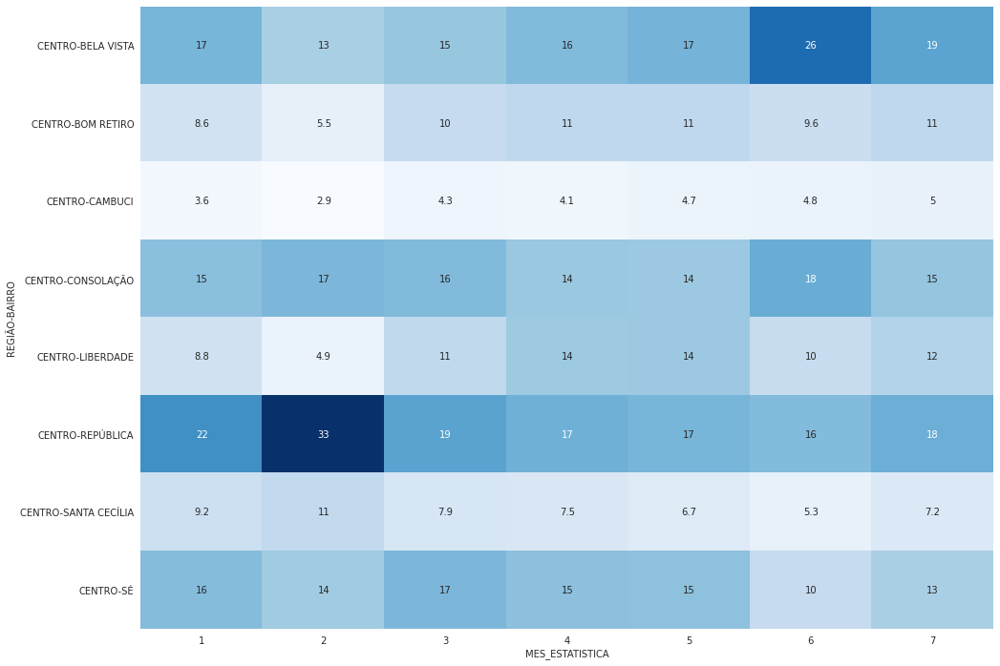

In [84]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_furto_c.REGIÃO,database_furto_c.BAIRRO], database_furto_c.MES_ESTATISTICA, values=database_furto_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro da REPÚBLICA é o bairro que mais contribuiu no percentual em todos os meses do período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros CAMBUCI  e SANTA CECÍLIA
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [85]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_furto_c.REGIÃO,database_furto_c.BAIRRO], database_furto_c.MES_ESTATISTICA, values=database_furto_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA               1          2          3          4          5  \
REGIÃO BAIRRO                                                                 
CENTRO BELA VISTA     14.164905   9.619450  13.213531  12.071882  13.023256   
       BOM RETIRO     13.271246   7.450524  17.229336  15.133877  15.483120   
       CAMBUCI        12.422907   8.986784  16.387665  12.863436  15.066079   
       CONSOLAÇÃO     14.571429  13.714286  16.476190  12.047619  12.261905   
       LIBERDADE      12.069565   5.947826  16.104348  17.356522  18.017391   
       REPÚBLICA      15.867707  21.125975  15.366035  11.445559  11.389818   
       SANTA CECÍLIA  17.590361  18.024096  16.289157  12.771084  11.710843   
       SÉ             16.323874  12.574850  18.510804  14.215048  14.423327   

MES_ESTATISTICA               6          7  
REGIÃO BAIRRO                               
CENTRO BELA VISTA     22.832981  15.073996  
       BOM RETIRO     15.599534  15.832363  
       CAMBUCI        17.885463  16.387665  
       CONSOLAÇÃO     17.904762  13.023810  
       LIBERDADE      14.782609  15.721739  
       REPÚBLICA      12.578967  12.225938  
       SANTA CECÍLIA  10.795181  12.819277  
       SÉ             11.403280  12.548815

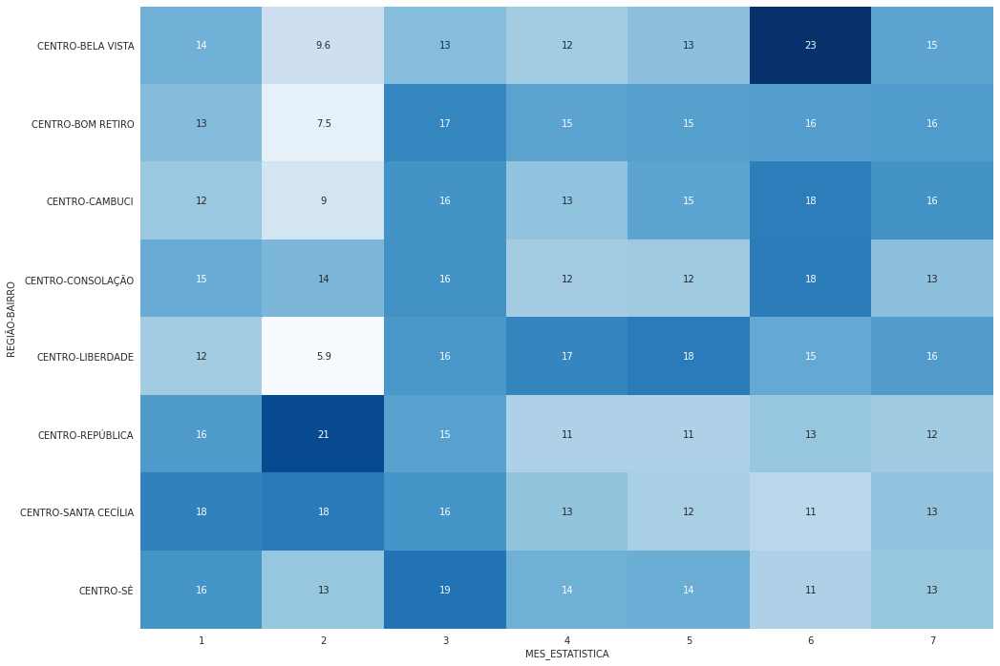

In [86]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_furto_c.REGIÃO,database_furto_c.BAIRRO], database_furto_c.MES_ESTATISTICA, values=database_furto_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- exceto REPÚBLICA e SANTA CECÍLIA, todos os bairros apresentaram queda em fevereiro e aumento do percentual em março;
- em abril e maio há um equilíbrio dos percentuais 
- os bairros REPÚBLICA e BELA VISTA são os que apresentam os maiores valores percentuais

### Analisando Ocorrências: ROUBO

Com o intuito de realizar uma análise mais detalhada, o conjunto de dados será separado por tipo de ocorrência, onde agora será analisado a ocorrência ROUBO.

In [87]:
#Separando por tipo de ocorrência
database_roubo = database.loc[database['NATUREZA_APURADA']== 'ROUBO'].reset_index()
database_roubo

,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,1277,12/31/2022,1:30:00 PM,SÉ,"-23,55206965","-46,63604587",ROUBO,1,2023,27241.0,CENTRO
1,1278,12/31/2022,1:30:00 PM,SÉ,"-23,55206965","-46,63604587",ROUBO,1,2023,27241.0,CENTRO
2,1279,12/31/2022,9:00:00 PM,SÉ,NaN,NaN,ROUBO,1,2023,27241.0,CENTRO
3,1280,1/1/2023,8:20:00 AM,SÉ,"-23,55200559","-46,63442933",ROUBO,1,2023,27241.0,CENTRO
4,1282,12/29/2022,8:00:00 PM,SÉ,NaN,NaN,ROUBO,1,2023,27241.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...
73098,284585,7/20/2023,5:40:00 PM,SAPOPEMBA,"-23,60505976","-46,51732447",ROUBO,7,2023,291648.0,LESTE
73099,284586,7/30/2023,11:15:00 PM,SAPOPEMBA,"-23,6073315","-46,5230619",ROUBO,7,2023,291648.0,LESTE
73100,284605,7/11/2023,6:55:00 PM,RAPOSO TAVARES,"-23,5919041","-46,8094722",ROUBO,7,2023,109052.0,OESTE
73101,284626,7/1/2023,5:00:00 AM,MORUMBI,NaN,NaN,ROUBO,7,2023,54007.0,OESTE


In [88]:
#Agrupando e contando as ocorrências em cada mês
database.loc[database['NATUREZA_APURADA']== 'ROUBO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()

MES_ESTATISTICA
1    11180
2     9739
3    11995
4    10229
5    10403
6     9790
7     9767
Name: ANO_ESTATISTICA, dtype: int64

In [89]:
#Percentual de ocorrências por mês
database.loc[database['NATUREZA_APURADA']== 'ROUBO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()/database_roubo.shape[0]

MES_ESTATISTICA
1    0.152935
2    0.133223
3    0.164084
4    0.139926
5    0.142306
6    0.133921
7    0.133606
Name: ANO_ESTATISTICA, dtype: float64

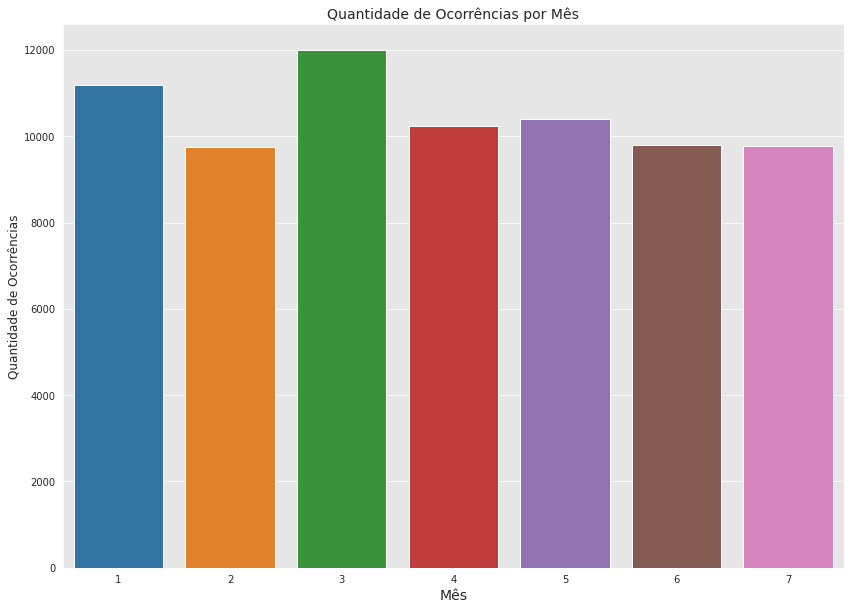

In [90]:
#Plotando o gráfico
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_roubo,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de roubos totais distribuídas pelos meses em questão. Nota-se que os meses de JANEIRO e MARÇO se sobressaem com cerca de 15% a mais em relação aos demais meses (JAN/FEV e MAR/ABR). O mês de maio  e junho aparecem em segundo lugar com cerca de 13% do total de ocorências.

In [91]:
#Ocorrencias por região
database_roubo.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)

REGIÃO
SUL       22233
LESTE     20396
CENTRO    10435
OESTE     10392
NORTE      9647
Name: NATUREZA_APURADA, dtype: int64

In [92]:
#Percentual de ocorrências por região
database_roubo.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)/database_roubo.shape[0]

REGIÃO
SUL       0.304133
LESTE     0.279004
CENTRO    0.142744
OESTE     0.142156
NORTE     0.131964
Name: NATUREZA_APURADA, dtype: float64

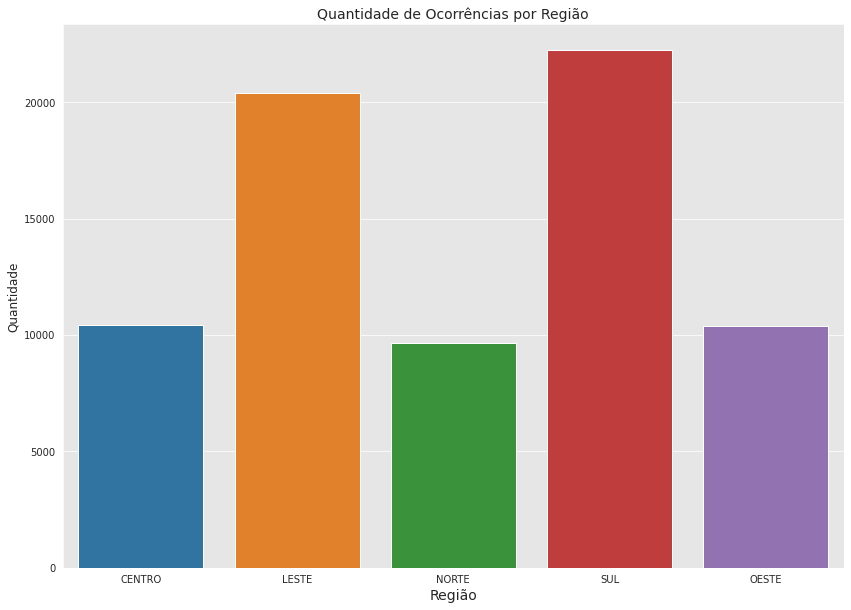

In [93]:
#Gráfico de ocorrências por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_roubo,x='REGIÃO')
ax.set_ylabel('Quantidade', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Região', fontsize=14)
plt.show()

Acima o gráfico plotado demostra as regiões LESTE e SUL se destacam e muito das demais, onde demostra que cerca de 27% (LESTE) e 30%(SUL) dos casos. Somados os percentais das regiões LESTE e SUL tem-se que essas duas regiões respondem por quase 58% do total de ocorrências de roubos.

In [94]:
#Quantidade de ocorrências por bairro
database_roubo['BAIRRO'].value_counts()

REPÚBLICA         3690
CAPÃO REDONDO     3437
CAMPO LIMPO       3088
JARDIM ÂNGELA     2201
GRAJAÚ            2018
                  ... 
JAGUARA            147
CURSINO             23
JOSÉ BONIFÁCIO      18
MARSILAC             8
SÃO DOMINGOS         5
Name: BAIRRO, Length: 84, dtype: int64

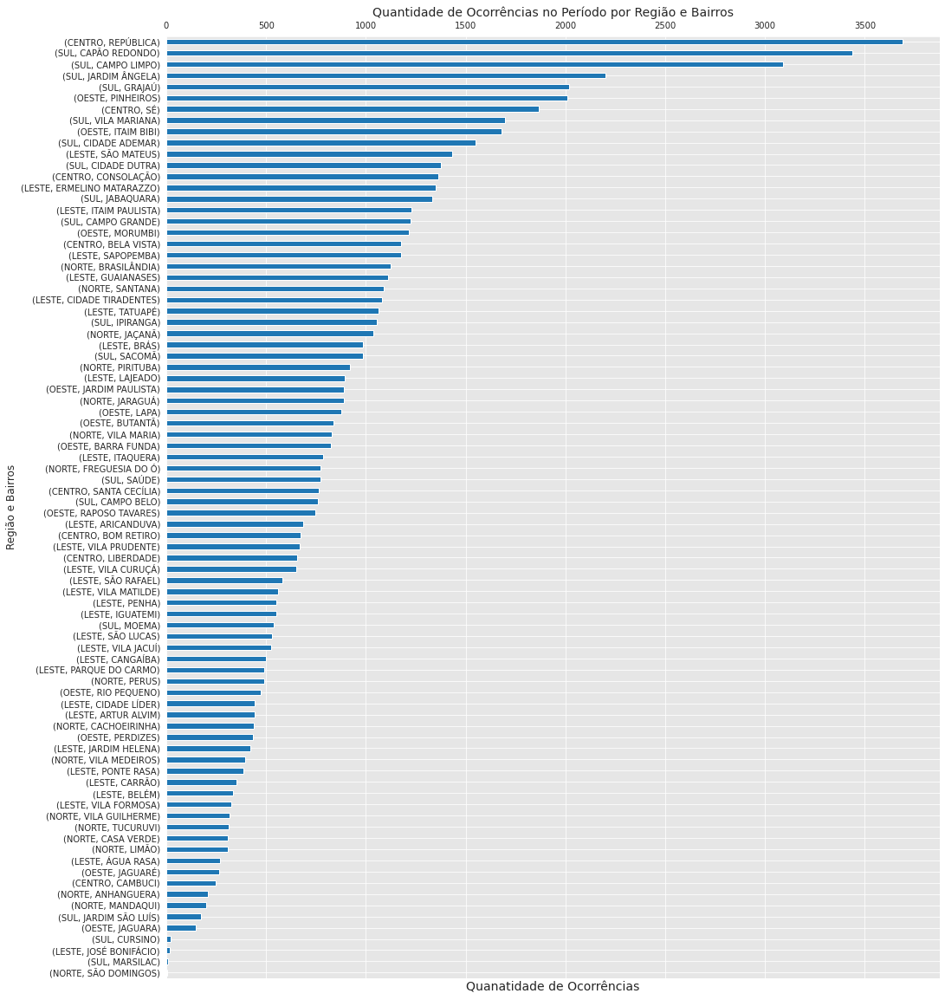

In [95]:
#Plotando o gráfico Quantidade de corrências no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 20))
ax = database_roubo.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quanatidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Região e Bairros', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado da quantidade de roubos por região e bairro no período. Nota-se que os 10 primeiros bairros estão acima de 3000 furtos no período em questão. Verifica-se também que dos 10 primeiros bairros com o maior número de furtos no período, 6 são das região SUL. Analisando as três primeiras colocadas (REPÚBLICA, CAPÃO REDONDO e CAMPO LIMPO) é bem possível que esses delitos tenham sido executados por pessoas de bairros adjacentesnos casos dos bairros REPÚBLICA e CAMPO LIMPO.

In [96]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_roubo.BAIRRO,database_roubo.REGIÃO], database_roubo.MES_ESTATISTICA, values=database_roubo.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7,Total
BAIRRO,REGIÃO,,,,,,,,
ANHANGUERA,NORTE,0.259392,0.369648,0.366820,0.293284,0.192252,0.143003,0.378827,0.287266
ARICANDUVA,LESTE,0.948122,0.995995,0.917049,1.182911,1.018937,0.755873,0.726938,0.937034
ARTUR ALVIM,LESTE,0.635063,0.585276,0.541892,0.635448,0.528694,0.694586,0.634791,0.605994
BARRA FUNDA,OESTE,1.109123,0.759832,0.875365,1.270896,1.355378,1.409602,1.146719,1.127177
BELA VISTA,CENTRO,1.502683,1.529931,1.267195,1.485971,1.624531,2.093973,1.853179,1.608689
...,...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,2.576029,1.981723,2.359316,2.043210,2.374315,2.441267,2.436777,2.321382
VILA MATILDE,LESTE,0.733453,0.913852,0.741976,0.958060,0.730558,0.623085,0.675745,0.767410
VILA MEDEIROS,NORTE,0.652952,0.564740,0.425177,0.537687,0.634432,0.572012,0.409542,0.541701


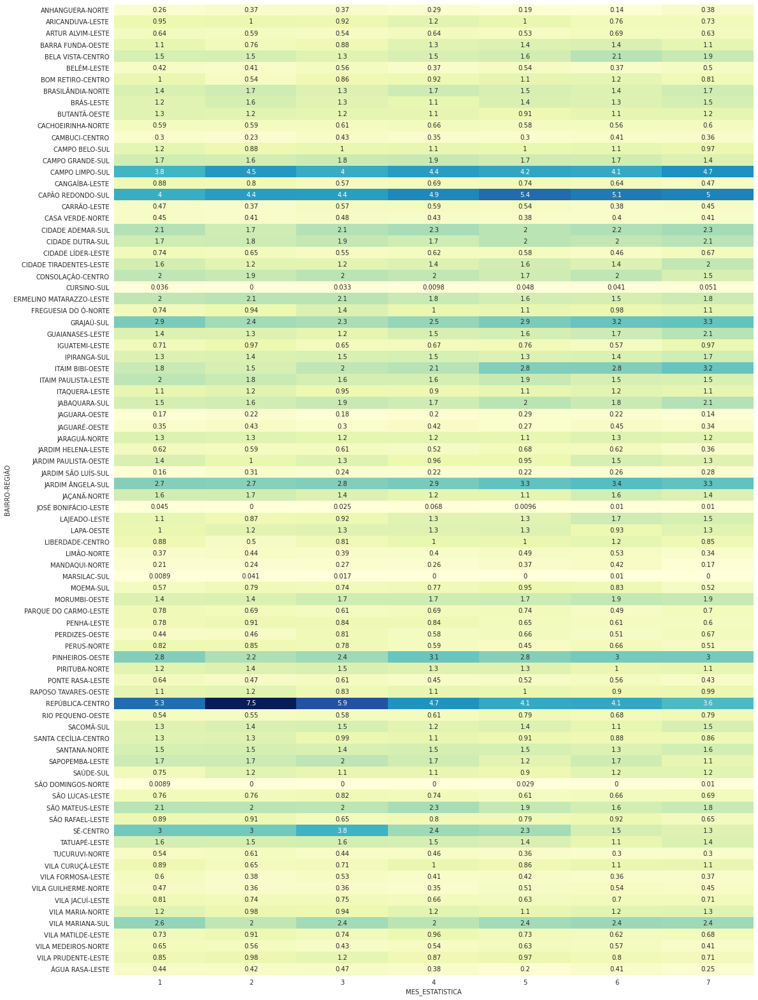

In [97]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(18,28))
sns.heatmap((pd.crosstab([database_roubo.BAIRRO,database_roubo.REGIÃO], database_roubo.MES_ESTATISTICA, values=database_roubo.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de roubos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

         
|    JANEIRO      |   FEVEREIRO     |       MARÇO       |       ABRIL      |      MAIO        |       JUNHO       |      JULHO     |
|:---------------:|:---------------:|:------------------:|:-----------------:|:-----------------:|:-----------------:|:---------------:|
|REPÚBLICA **5.3%** |REPÚBLICA **7.5%** |REPÚBLICA **5.9%** |CAPÃO RED.  **4,9%** |CAPÃO RED.  **5.4%** |CAPÃO RED. **5.1%** |CAPÃO RED.  **5%**|
|CAPÃO RED. **4%** |CAPÃO RED. **4.5%** |CAPÃO RED. **4.4%** |REPÚBLICA  **4,7%** |REPÚBLICA **4.2%** |REPÚBLICA  **4.1%** |CAMPO LIMPO**4.7%**|
|CAMPO LIMPO **3.8%** |CAMPO LIMPO **4.4%** |CAMPO LIMPO **4%** |CAMPO LIMPO **4,4%** |CAMPO LIMPO **4.1%** |CAMPO LIMPO **4.1%** |REPÚBLICA **3.6%**|


Nota-se que os bairros de REPÚBLICA(CENTRO), CAPÃO RED.(SUL) e CAMPO LIMPO (SUL) estão entre os bairros com o maior percentual de furtos comparado com os demais bairros.
Os bairros com o menor percentual de ocorrências são São Domingos, Marsilac e José Bonifácio

In [98]:
#Distribição percentual por bairros e por mês
(pd.crosstab([database_roubo.BAIRRO,database_roubo.REGIÃO], database_roubo.MES_ESTATISTICA, values=database_roubo.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7
BAIRRO,REGIÃO,,,,,,,
ANHANGUERA,NORTE,13.809524,17.142857,20.952381,14.285714,9.523810,6.666667,17.619048
ARICANDUVA,LESTE,15.474453,14.160584,16.058394,17.664234,15.474453,10.802920,10.364964
ARTUR ALVIM,LESTE,16.027088,12.866817,14.672686,14.672686,12.415350,15.349887,13.995485
BARRA FUNDA,OESTE,15.048544,8.980583,12.742718,15.776699,17.111650,16.747573,13.592233
BELA VISTA,CENTRO,14.285714,12.670068,12.925170,12.925170,14.370748,17.431973,15.391156
...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,16.971126,11.373011,16.676488,12.315852,14.555097,14.083677,14.024750
VILA MATILDE,LESTE,14.616756,15.864528,15.864528,17.468806,13.547237,10.873440,11.764706
VILA MEDEIROS,NORTE,18.434343,13.888889,12.878788,13.888889,16.666667,14.141414,10.101010


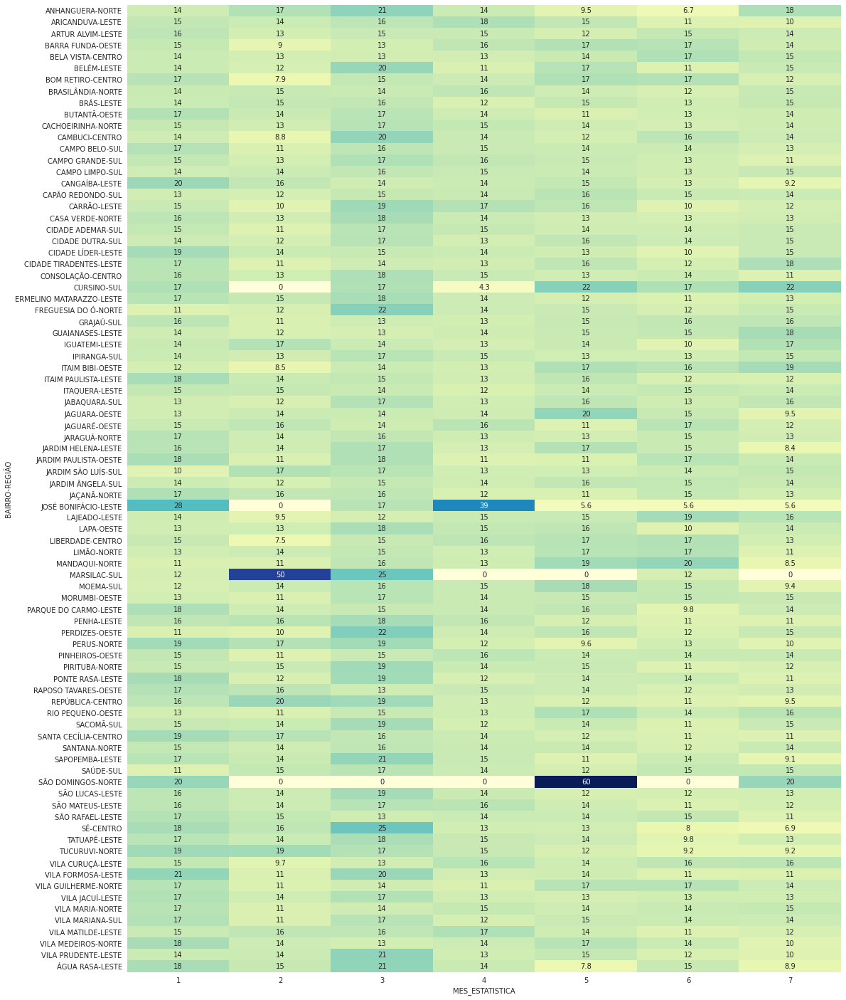

In [99]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(18,25))
sns.heatmap((pd.crosstab([database_roubo.BAIRRO,database_roubo.REGIÃO], database_roubo.MES_ESTATISTICA, values=database_roubo.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A mesma análise acima foi feita, porém agora analisando cada bairro ao longo do período (JANEIRO a JULHO), ou seja, em um determinado bairro, de todas as ocorrências de roubos, quais os percentuais em cada mês em relação ao total. Alguns pontos importantes a serem ressaltados:

 - em JANEIRO praticamente todos os bairros em questão apresentam percentuais alto  (exceto JOSÈ BONIFÁCIO com 28%);
 - em FEVEREIRO há uma queda generalizada nos percentuais, à exceção do bairro MARSILAC, que apresenta um percentual de 50% (aumento de 100% em relação ao mês anterior) no mês de FEVEREIRO, ou seja, todos os delitos ocorridos no período, metade ocorreram em FEVEREIRO;
 - em MARÇO há um aumento generalizado dos percentuais em todos os bairros. Os bairros SÉ, PERDIZES, ANHAMGUERA e FREQUESIA DO Ó apresentam os maiores percentuais para o mês.
 - nos meses de ABRIL e MAIO há um certo equilíbrio entre os percentuais nos bairros, variando entre 12% e 17%, tendo os bairros SÃO DOMINGOS e JOSÉ BONIFÁCIO apresentando os maiores percentuais;
 - em JUNHO e JULHO os bairros há novamente um euilíbrio entre os percentuais

#### Análise de Ocorrência ROUBO na região NORTE

In [100]:
#Separando pela região NORTE
database_roubo_n = database_roubo[database_roubo['REGIÃO']== 'NORTE'].reset_index()

In [101]:
database_roubo_n

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,264,1601,1/17/2023,5:00:00 PM,SANTANA,NaN,NaN,ROUBO,1,2023,111492.0,NORTE
1,3846,15882,1/22/2023,4:30:00 PM,CASA VERDE,"-23,50926796","-46,66610737",ROUBO,1,2023,85871.0,NORTE
2,3849,16091,12/31/2022,4:00:00 AM,JARAGUÁ,"-23,45436761","-46,7516858",ROUBO,1,2023,218794.0,NORTE
3,3850,16092,12/31/2022,8:10:00 PM,JARAGUÁ,"-23,46899494","-46,7531287",ROUBO,1,2023,218794.0,NORTE
4,3851,16093,12/31/2022,8:00:00 PM,PIRITUBA,"-23,4857164","-46,7317193",ROUBO,1,2023,171585.0,NORTE
...,...,...,...,...,...,...,...,...,...,...,...,...
9642,68934,268717,7/30/2023,11:10:00 AM,VILA MEDEIROS,"-23,48656352","-46,56620239",ROUBO,7,2023,122483.0,NORTE
9643,69812,274115,7/16/2023,10:30:00 PM,ANHANGUERA,"-23,44982867","-46,78765798",ROUBO,7,2023,88677.0,NORTE
9644,70737,276472,6/30/2023,10:00:00 PM,SANTANA,NaN,NaN,ROUBO,7,2023,111492.0,NORTE
9645,71059,277413,7/13/2023,11:40:00 AM,SANTANA,"-23,6760989","-46,6848586",ROUBO,7,2023,111492.0,NORTE


In [102]:
x = database_roubo_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_roubo_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_roubo_n.shape[0])

REGIÃO  BAIRRO        
NORTE   BRASILÂNDIA       1125
        SANTANA           1090
        JAÇANÃ            1036
        PIRITUBA           920
        JARAGUÁ            889
        VILA MARIA         828
        FREGUESIA DO Ó     771
        PERUS              490
        CACHOEIRINHA       437
        VILA MEDEIROS      396
        VILA GUILHERME     317
        TUCURUVI           314
        CASA VERDE         310
        LIMÃO              308
        ANHANGUERA         210
        MANDAQUI           201
        SÃO DOMINGOS         5
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        
NORTE   BRASILÂNDIA       0.116617
        SANTANA           0.112988
        JAÇANÃ            0.107391
        PIRITUBA          0.095366
        JARAGUÁ           0.092153
        VILA MARIA        0.085830
        FREGUESIA DO Ó    0.079921
        PERUS             0.050793
        CACHOEIRINHA      0.045299
        VILA MEDEIROS     0.041049
        VILA GUILHERME    0.032860
        TUCURUV

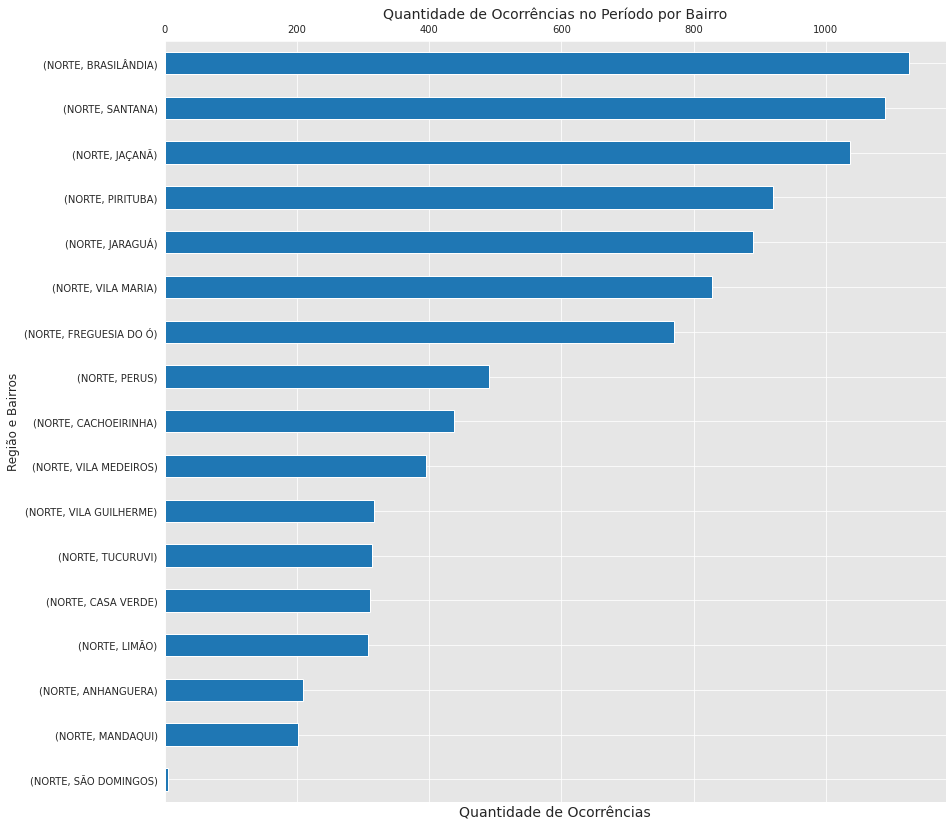

In [103]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_roubo_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região NORTE em todo o período. Nota-se que os bairros com os maiores números de ocorrências de roubos são BRASILÂNDIA, SANTANA e JAÇANÃ com percentuais próximos entre sí.

In [104]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
roubo_cross_n = (pd.crosstab([database_roubo_n.REGIÃO,database_roubo_n.BAIRRO], database_roubo_n.MES_ESTATISTICA, values=database_roubo_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
roubo_cross_n.reset_index(inplace=True)
roubo_cross_n

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,NORTE,ANHANGUERA,1.925631,2.662722,2.772527,2.228826,1.515152,1.104101,2.917981,2.176843
1,NORTE,BRASILÂNDIA,10.756972,12.426036,10.144928,13.224368,11.742424,10.567823,13.170347,11.661656
2,NORTE,CACHOEIRINHA,4.382470,4.215976,4.599874,4.977712,4.545455,4.337539,4.652997,4.529906
3,NORTE,CASA VERDE,3.320053,2.958580,3.591682,3.268945,3.030303,3.075710,3.154574,3.213434
4,NORTE,FREGUESIA DO Ó,5.511288,6.804734,10.586011,7.949480,8.560606,7.570978,8.832808,7.992122
5,NORTE,JARAGUÁ,9.960159,9.023669,8.758664,8.841010,8.636364,10.173502,9.148265,9.215300
6,NORTE,JAÇANÃ,12.018592,11.908284,10.396975,8.915305,9.015152,12.381703,10.488959,10.739090
7,NORTE,LIMÃO,2.722444,3.180473,2.961563,3.046062,3.863636,4.100946,2.602524,3.192702
8,NORTE,MANDAQUI,1.527224,1.701183,2.016383,2.005944,2.878788,3.233438,1.340694,2.083549
9,NORTE,PERUS,6.108898,6.139053,5.860113,4.457652,3.560606,5.126183,3.943218,5.079299


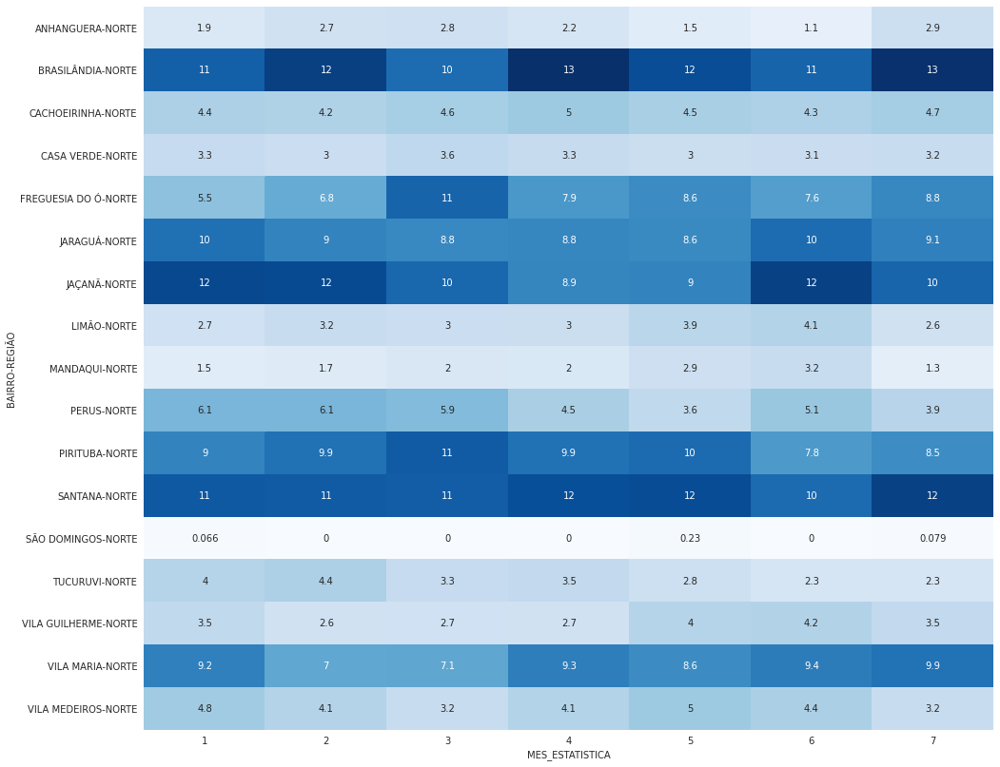

In [105]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_roubo_n.BAIRRO,database_roubo_n.REGIÃO], database_roubo_n.MES_ESTATISTICA, values=database_roubo_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro de JACANÃ e BRASILÂNDIA são os bairros que mais contribuiram no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já o menor percentual é o bairro SÃO DOMINGOS

In [106]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_roubo_n.REGIÃO,database_roubo_n.BAIRRO], database_roubo_n.MES_ESTATISTICA, values=database_roubo_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                1          2          3          4          5  \
REGIÃO BAIRRO                                                                  
NORTE  ANHANGUERA      13.809524  17.142857  20.952381  14.285714   9.523810   
       BRASILÂNDIA     14.400000  14.933333  14.311111  15.822222  13.777778   
       CACHOEIRINHA    15.102975  13.043478  16.704805  15.331808  13.729977   
       CASA VERDE      16.129032  12.903226  18.387097  14.193548  12.903226   
       FREGUESIA DO Ó  10.765240  11.932555  21.789883  13.878080  14.656291   
       JARAGUÁ         16.872891  13.723285  15.635546  13.385827  12.823397   
       JAÇANÃ          17.471042  15.540541  15.926641  11.583012  11.486486   
       LIMÃO           13.311688  13.961039  15.259740  13.311688  16.558442   
       MANDAQUI        11.442786  11.442786  15.920398  13.432836  18.905473   
       PERUS           18.775510  16.938776  18.979592  12.244898   9.591837   
       PIRITUBA        14.782609  14.565217  19.021739  14.456522  14.673913   
       SANTANA         15.412844  13.669725  15.871560  14.403670  14.311927   
       SÃO DOMINGOS    20.000000   0.000000   0.000000   0.000000  60.000000   
       TUCURUVI        19.108280  18.789809  16.878981  14.968153  11.783439   
       VILA GUILHERME  16.719243  11.041009  13.564669  11.356467  16.719243   
       VILA MARIA      16.666667  11.473430  13.647343  15.096618  13.647343   
       VILA MEDEIROS   18.434343  13.888889  12.878788  13.888889  16.666667   

MES_ESTATISTICA                6          7  
REGIÃO BAIRRO                                
NORTE  ANHANGUERA       6.666667  17.619048  
       BRASILÂNDIA     11.911111  14.844444  
       CACHOEIRINHA    12.585812  13.501144  
       CASA VERDE      12.580645  12.903226  
       FREGUESIA DO Ó  12.451362  14.526589  
       JARAGUÁ         14.510686  13.048369  
       JAÇANÃ          15.154440  12.837838  
       LIMÃO           16.883117  10.714286  
       MANDAQUI        20.398010   8.457711  
       PERUS           13.265306  10.204082  
       PIRITUBA        10.760870  11.739130  
       SANTANA         11.926606  14.403670  
       SÃO DOMINGOS     0.000000  20.000000  
       TUCURUVI         9.235669   9.235669  
       VILA GUILHERME  16.719243  13.880126  
       VILA MARIA      14.371981  15.096618  
       VILA MEDEIROS   14.141414  10.101010

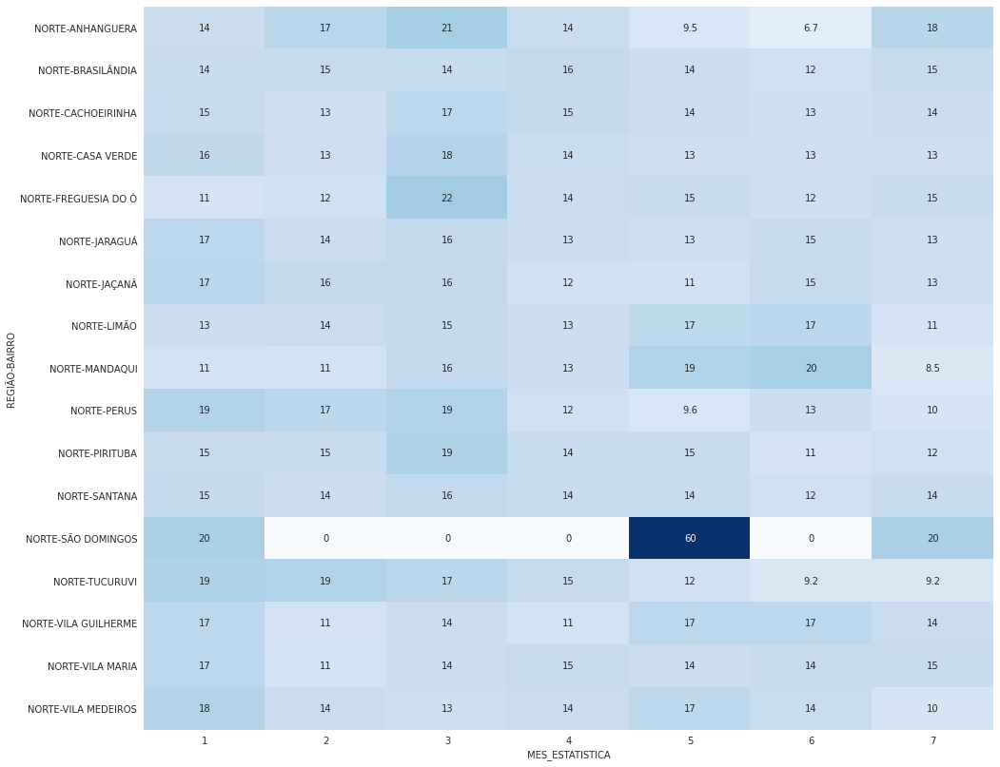

In [107]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_roubo_n.REGIÃO,database_roubo_n.BAIRRO], database_roubo_n.MES_ESTATISTICA, values=database_roubo_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de roubos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada (exceto São Domingos)
- vale ressaltar o bairro São Domingos que teve um percentual de 0% em 4 dos 7 meses e foi também o que apresentou o maior percentual na distribuição dos meses, no mês de maio.

#### Análise de Ocorrência ROUBO na região SUL

In [108]:
#Separando pela região SUL
database_roubo_s = database_roubo[database_roubo['REGIÃO']== 'SUL'].reset_index()

In [109]:
database_roubo_s

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,347,1696,1/25/2023,NaN,VILA MARIANA,"-23,57135353","-46,64422404",ROUBO,1,2023,131624.0,SUL
1,1287,5261,1/9/2023,7:45:00 PM,VILA MARIANA,NaN,NaN,ROUBO,1,2023,131624.0,SUL
2,1329,5304,1/25/2023,10:30:00,VILA MARIANA,"-23,5699585","-46,6357774",ROUBO,1,2023,131624.0,SUL
3,1332,5307,1/26/2023,12:30:00 AM,VILA MARIANA,"-23,58388862","-46,63685061",ROUBO,1,2023,131624.0,SUL
4,1357,5605,12/30/2022,1:05:00 AM,VILA MARIANA,"-23,58513012","-46,62397074",ROUBO,1,2023,131624.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...,...
22228,71104,277464,7/30/2023,3:29:51 PM,CAMPO GRANDE,"-23,6778788","-46,6827953",ROUBO,7,2023,107661.0,SUL
22229,71105,277465,7/19/2023,8:00:50 PM,CAMPO GRANDE,"-23,67578851","-46,69936864",ROUBO,7,2023,107661.0,SUL
22230,71379,279146,7/22/2023,11:30:00 AM,CAMPO LIMPO,NaN,NaN,ROUBO,7,2023,233057.0,SUL
22231,71380,279147,7/22/2023,11:30:00 AM,CAMPO LIMPO,NaN,NaN,ROUBO,7,2023,233057.0,SUL


In [110]:
x = database_roubo_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_roubo_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_roubo_s.shape[0])

REGIÃO  BAIRRO         
SUL     CAPÃO REDONDO      3437
        CAMPO LIMPO        3088
        JARDIM ÂNGELA      2201
        GRAJAÚ             2018
        VILA MARIANA       1697
        CIDADE ADEMAR      1550
        CIDADE DUTRA       1374
        JABAQUARA          1331
        CAMPO GRANDE       1223
        IPIRANGA           1054
        SACOMÃ              985
        SAÚDE               771
        CAMPO BELO          758
        MOEMA               540
        JARDIM SÃO LUÍS     175
        CURSINO              23
        MARSILAC              8
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
SUL     CAPÃO REDONDO      0.154590
        CAMPO LIMPO        0.138893
        JARDIM ÂNGELA      0.098997
        GRAJAÚ             0.090766
        VILA MARIANA       0.076328
        CIDADE ADEMAR      0.069716
        CIDADE DUTRA       0.061800
        JABAQUARA          0.059866
        CAMPO GRANDE       0.055008
        IPIRANGA           0.047407
        SACOMÃ       

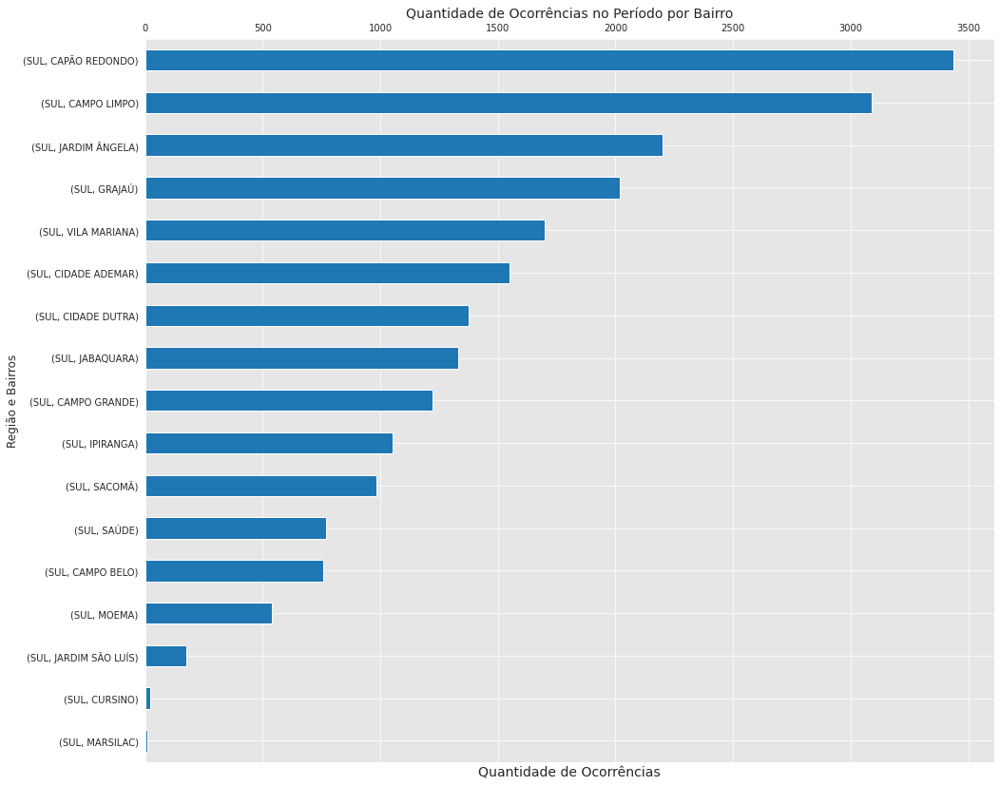

In [111]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_roubo_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região SUL em todo o período. Nota-se que os bairros com o maior número de ocorrências de roubos são CAPÃO REDONDO e CAMPO LIMPO com um percentual muito acima dos demais bairros.

In [112]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
roubo_cross_s = (pd.crosstab([database_roubo_s.REGIÃO,database_roubo_s.BAIRRO], database_roubo_s.MES_ESTATISTICA, values=database_roubo_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
roubo_cross_s.reset_index(inplace=True)
roubo_cross_s

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,SUL,CAMPO BELO,4.068117,3.071429,3.439526,3.588749,3.229701,3.462648,2.978056,3.409346
1,SUL,CAMPO GRANDE,5.897193,5.571429,6.005075,6.142903,5.433142,5.226034,4.200627,5.500832
2,SUL,CAMPO LIMPO,13.308105,15.678571,13.560756,14.581313,13.160278,12.856685,14.357367,13.889264
3,SUL,CAPÃO REDONDO,14.064964,15.250000,14.716662,16.068542,16.903109,16.062841,15.172414,15.459002
4,SUL,CIDADE ADEMAR,7.537055,5.964286,7.217367,7.565470,6.429218,6.829112,7.147335,6.971619
5,SUL,CIDADE DUTRA,5.991801,6.107143,6.512546,5.690268,6.429218,6.123758,6.332288,6.180003
6,SUL,CURSINO,0.126143,0.000000,0.112771,0.032331,0.150921,0.128246,0.156740,0.103450
7,SUL,GRAJAÚ,10.217597,8.250000,7.640259,8.406078,9.085421,10.035268,9.968652,9.076598
8,SUL,IPIRANGA,4.730369,4.892857,4.905554,5.011316,4.225777,4.360372,5.078370,4.740701
9,SUL,JABAQUARA,5.455692,5.678571,6.343389,5.722599,6.399034,5.706957,6.489028,5.986597


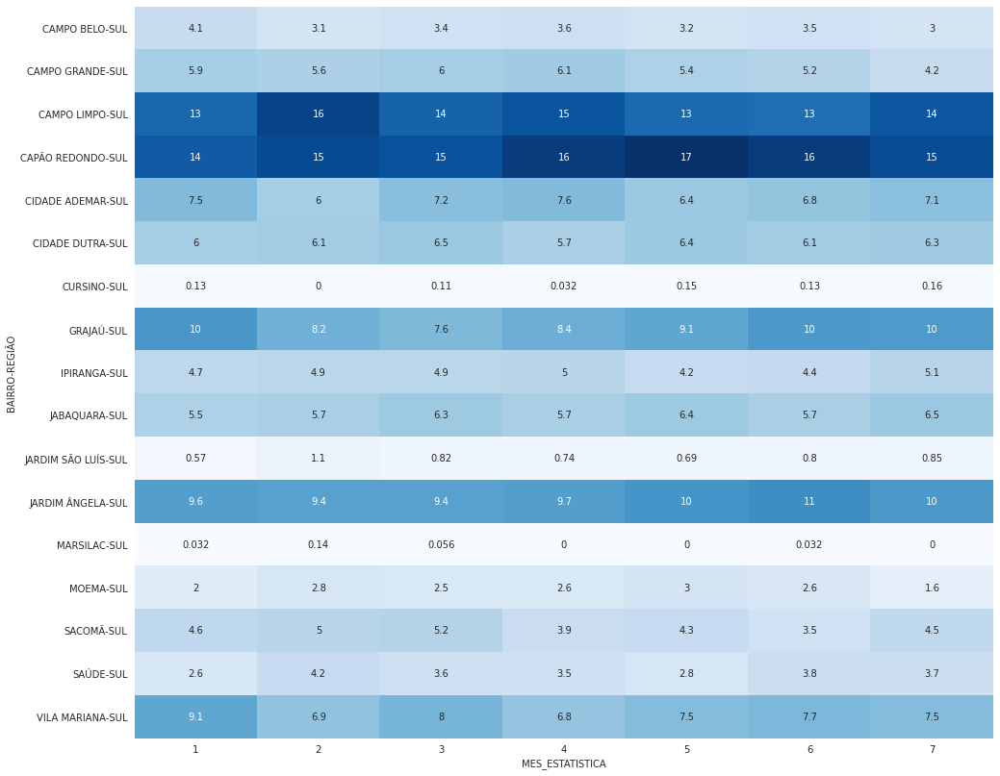

In [113]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_roubo_s.BAIRRO,database_roubo_s.REGIÃO], database_roubo_s.MES_ESTATISTICA, values=database_roubo_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - os bairros CAPÃO REDONDO e CAMPO LIMPO realmente saltam aos olhos seus percentuais em relação aos demais bairros, perdurando durante todo o período;
 - já os menores percentuais são os bairros MARSILAC e CURSINO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [114]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_roubo_s.REGIÃO,database_roubo_s.BAIRRO], database_roubo_s.MES_ESTATISTICA, values=database_roubo_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
SUL    CAMPO BELO       17.018470  11.345646  16.094987  14.643799  14.116095   
       CAMPO GRANDE     15.290270  12.755519  17.416190  15.535568  14.717907   
       CAMPO LIMPO      13.665803  14.216321  15.576425  14.604922  14.119171   
       CAPÃO REDONDO    12.976433  12.423625  15.187664  14.460285  16.293279   
       CIDADE ADEMAR    15.419355  10.774194  16.516129  15.096774  13.741935   
       CIDADE DUTRA     13.828239  12.445415  16.812227  12.809316  15.502183   
       CURSINO          17.391304   0.000000  17.391304   4.347826  21.739130   
       GRAJAÚ           16.055500  11.446977  13.429138  12.884044  14.915758   
       IPIRANGA         14.231499  12.998102  16.508539  14.705882  13.282732   
       JABAQUARA        12.997746  11.945905  16.904583  13.298272  15.927874   
       JARDIM SÃO LUÍS  10.285714  17.142857  16.571429  13.142857  13.142857   
       JARDIM ÂNGELA    13.902771  11.994548  15.174920  13.584734  15.538392   
       MARSILAC         12.500000  50.000000  25.000000   0.000000   0.000000   
       MOEMA            11.851852  14.259259  16.481481  14.629630  18.333333   
       SACOMÃ           14.822335  14.213198  18.578680  12.385787  14.314721   
       SAÚDE            10.894942  15.434501  16.601816  14.137484  12.191958   
       VILA MARIANA     16.971126  11.373011  16.676488  12.315852  14.555097   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
SUL    CAMPO BELO       14.248021  12.532982  
       CAMPO GRANDE     13.327882  10.956664  
       CAMPO LIMPO      12.985751  14.831606  
       CAPÃO REDONDO    14.576666  14.082048  
       CIDADE ADEMAR    13.741935  14.709677  
       CIDADE DUTRA     13.901019  14.701601  
       CURSINO          17.391304  21.739130  
       GRAJAÚ           15.510406  15.758176  
       IPIRANGA         12.903226  15.370019  
       JABAQUARA        13.373403  15.552216  
       JARDIM SÃO LUÍS  14.285714  15.428571  
       JARDIM ÂNGELA    15.311222  14.493412  
       MARSILAC         12.500000   0.000000  
       MOEMA            15.000000   9.444444  
       SACOMÃ           11.065990  14.619289  
       SAÚDE            15.434501  15.304799  
       VILA MARIANA     14.083677  14.024750

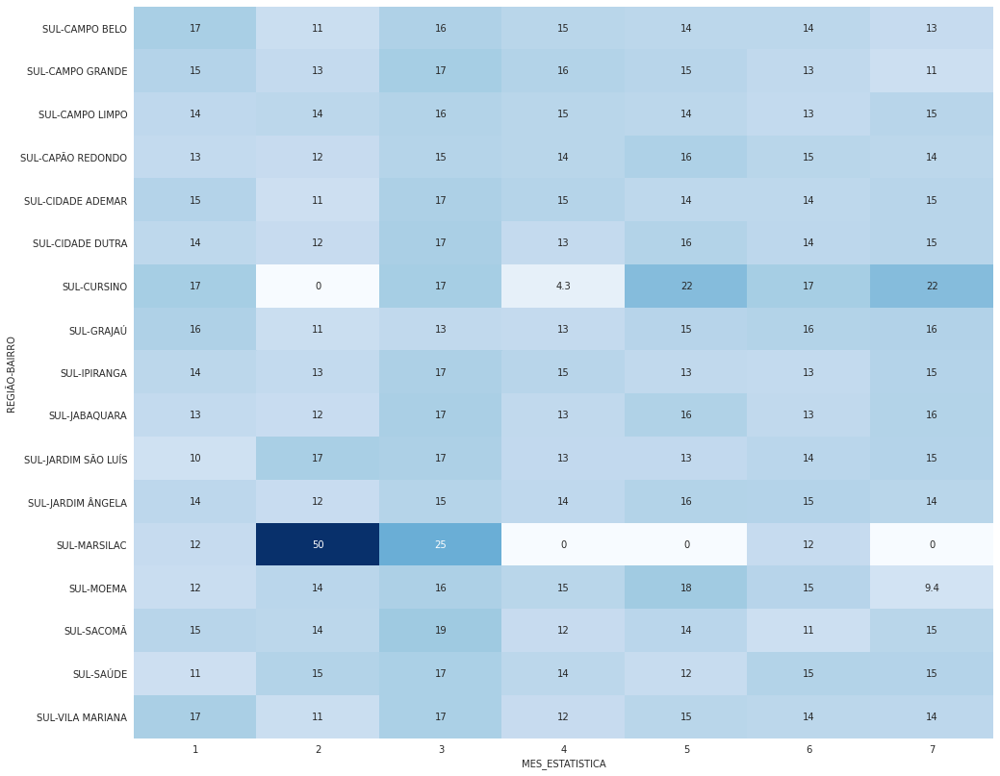

In [115]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_roubo_s.REGIÃO,database_roubo_s.BAIRRO], database_roubo_s.MES_ESTATISTICA, values=database_roubo_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de roubos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- os bairros MARSILAC e CURSINO são os que apresentaram o maior percentual entre os meses de fevereiro a maio

#### Análise de Ocorrência ROUBO na região LESTE

In [116]:
#Separando pela região LESTE
database_roubo_l = database_roubo[database_roubo['REGIÃO']== 'LESTE'].reset_index()

In [117]:
database_roubo_l

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,26,1306,1/2/2023,12:40:00 PM,BRÁS,"-23,5446822","-46,6268809",ROUBO,1,2023,33770.0,LESTE
1,38,1320,1/1/2023,11:00:00 AM,BRÁS,"-23,5499507","-46,6254151",ROUBO,1,2023,33770.0,LESTE
2,89,1387,1/7/2023,7:10:00 AM,BRÁS,NaN,NaN,ROUBO,1,2023,33770.0,LESTE
3,96,1395,1/8/2023,7:40:00 AM,BRÁS,"-23,5490633","-46,6256366",ROUBO,1,2023,33770.0,LESTE
4,115,1416,1/9/2023,7:10:00 AM,BRÁS,"-23,54708244","-46,62424248",ROUBO,1,2023,33770.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
20391,73095,284582,7/13/2023,7:20:00 PM,VILA FORMOSA,"-23,57661368","-46,54977177",ROUBO,7,2023,93654.0,LESTE
20392,73096,284583,7/18/2023,11:30:00 AM,SAPOPEMBA,0,0,ROUBO,7,2023,291648.0,LESTE
20393,73097,284584,7/18/2023,10:10:29 PM,SAPOPEMBA,"-23,6013644","-46,520869",ROUBO,7,2023,291648.0,LESTE
20394,73098,284585,7/20/2023,5:40:00 PM,SAPOPEMBA,"-23,60505976","-46,51732447",ROUBO,7,2023,291648.0,LESTE


In [118]:
x = database_roubo_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_roubo_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_roubo_l.shape[0])

REGIÃO  BAIRRO            
LESTE   SÃO MATEUS            1434
        ERMELINO MATARAZZO    1349
        ITAIM PAULISTA        1228
        SAPOPEMBA             1175
        GUAIANASES            1113
        CIDADE TIRADENTES     1081
        TATUAPÉ               1065
        BRÁS                   986
        LAJEADO                894
        ITAQUERA               787
        ARICANDUVA             685
        VILA PRUDENTE          667
        VILA CURUÇÁ            651
        SÃO RAFAEL             583
        VILA MATILDE           561
        PENHA                  550
        IGUATEMI               550
        SÃO LUCAS              528
        VILA JACUÍ             524
        CANGAÍBA               501
        PARQUE DO CARMO        491
        CIDADE LÍDER           445
        ARTUR ALVIM            443
        JARDIM HELENA          419
        PONTE RASA             387
        CARRÃO                 353
        BELÉM                  333
        VILA FORMOSA        

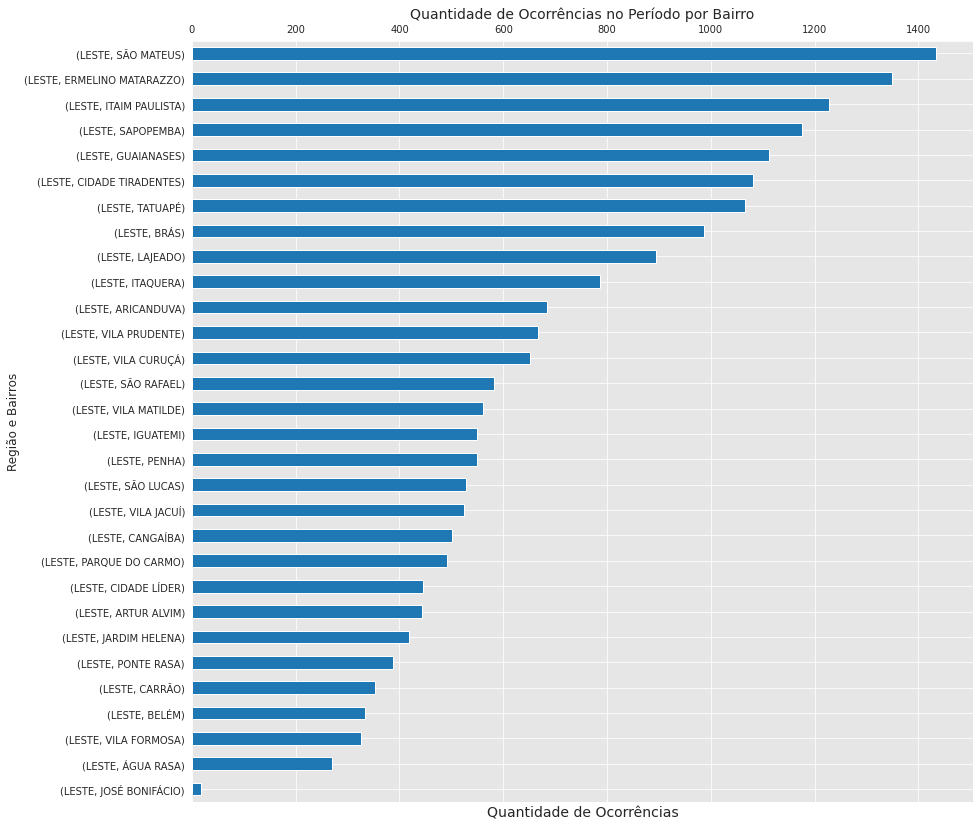

In [119]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_roubo_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região LESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de roubos é SAO MATEUS, seguido por ERMELINO MATARAZZO e ITAIM PAULISTA.

In [120]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
roubo_cross_l = (pd.crosstab([database_roubo_l.REGIÃO,database_roubo_l.BAIRRO], database_roubo_l.MES_ESTATISTICA, values=database_roubo_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
roubo_cross_l.reset_index(inplace=True)
roubo_cross_l

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,LESTE,ARICANDUVA,3.225806,3.481694,3.316250,4.189751,3.710186,2.860456,2.654206,3.358502
1,LESTE,ARTUR ALVIM,2.160682,2.045944,1.959602,2.250693,1.925096,2.628527,2.317757,2.171995
2,LESTE,BELÉM,1.430310,1.435750,2.019897,1.315789,1.960098,1.391573,1.831776,1.632673
3,LESTE,BRÁS,4.230067,5.419957,4.612602,3.947368,5.215261,5.025126,5.607477,4.834281
4,LESTE,CANGAÍBA,2.982349,2.799713,2.050045,2.458449,2.695135,2.435253,1.719626,2.456364
5,LESTE,CARRÃO,1.582471,1.292175,2.050045,2.077562,1.960098,1.430228,1.644860,1.730732
6,LESTE,CIDADE LÍDER,2.525867,2.261307,1.989750,2.181440,2.100105,1.739467,2.429907,2.181800
7,LESTE,CIDADE TIRADENTES,5.447352,4.271357,4.431715,4.847645,5.985299,5.141090,7.177570,5.300059
8,LESTE,ERMELINO MATARAZZO,6.786366,7.286432,7.416340,6.544321,5.845292,5.798222,6.392523,6.614042
9,LESTE,GUAIANASES,4.656117,4.666188,4.220681,5.228532,5.705285,6.609973,7.663551,5.456952


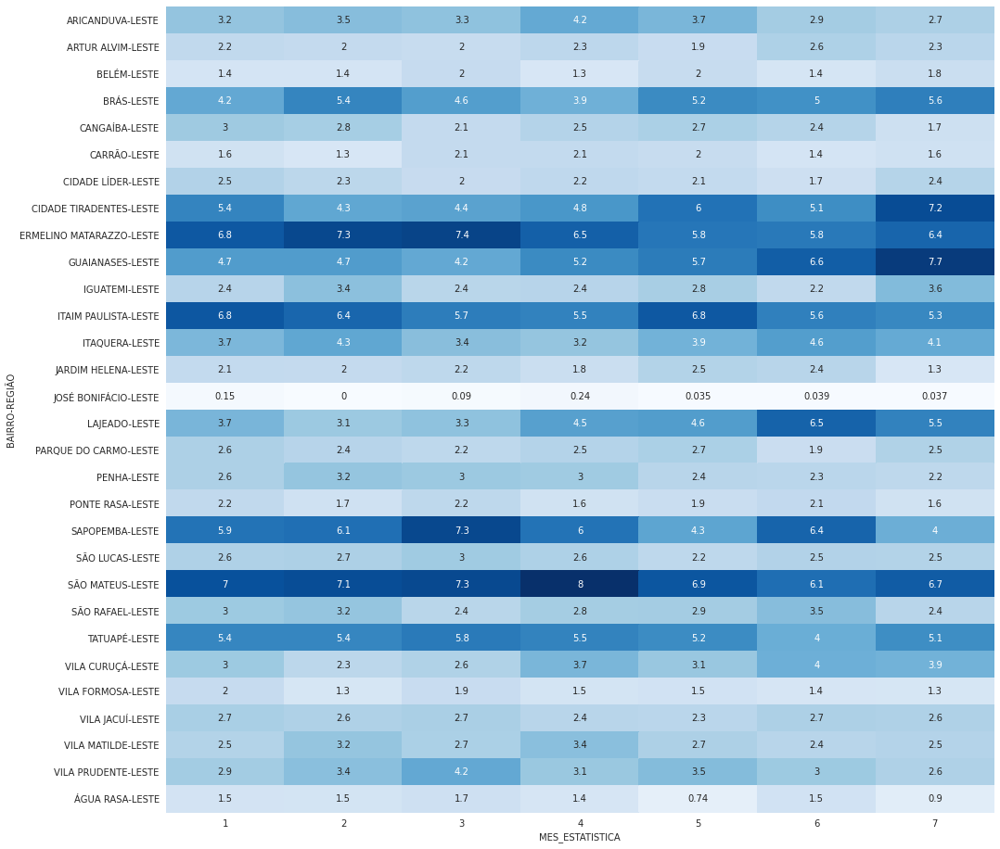

In [121]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_roubo_l.BAIRRO,database_roubo_l.REGIÃO], database_roubo_l.MES_ESTATISTICA, values=database_roubo_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - comproando o exposto acima,os bairros SAO MATEUS, ERMELINO MATARAZZO e ITAIM PAULISTA os bairros que mais contribuiram no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros JOSÉ BONIFÁCIO e VILA FORMOSA
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [122]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_roubo_l.REGIÃO,database_roubo_l.BAIRRO], database_roubo_l.MES_ESTATISTICA, values=database_roubo_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                    1          2          3          4  \
REGIÃO BAIRRO                                                           
LESTE  ARICANDUVA          15.474453  14.160584  16.058394  17.664234   
       ARTUR ALVIM         16.027088  12.866817  14.672686  14.672686   
       BELÉM               14.114114  12.012012  20.120120  11.411411   
       BRÁS                14.097363  15.314402  15.517241  11.561866   
       CANGAÍBA            19.560878  15.568862  13.572854  14.171657   
       CARRÃO              14.730878  10.198300  19.263456  16.997167   
       CIDADE LÍDER        18.651685  14.157303  14.831461  14.157303   
       CIDADE TIRADENTES   16.558742  11.008326  13.598520  12.950971   
       ERMELINO MATARAZZO  16.530764  15.048184  18.235730  14.010378   
       GUAIANASES          13.746631  11.680144  12.578616  13.566936   
       IGUATEMI            14.363636  17.090909  14.181818  12.545455   
       ITAIM PAULISTA      18.241042  14.413681  15.309446  12.947883   
       ITAQUERA            15.374841  15.120712  14.485388  11.689962   
       JARDIM HELENA       16.467780  13.603819  17.422434  12.649165   
       JOSÉ BONIFÁCIO      27.777778   0.000000  16.666667  38.888889   
       LAJEADO             13.758389   9.507830  12.304251  14.541387   
       PARQUE DO CARMO     17.718941  13.645621  14.867617  14.460285   
       PENHA               15.818182  16.181818  18.363636  15.636364   
       PONTE RASA          18.346253  11.886305  18.863049  11.886305   
       SAPOPEMBA           16.595745  14.382979  20.595745  14.638298   
       SÃO LUCAS           16.098485  14.015152  18.560606  14.393939   
       SÃO MATEUS          16.039052  13.877266  16.806137  16.178522   
       SÃO RAFAEL          16.981132  15.265866  13.379074  14.065180   
       TATUAPÉ             16.619718  14.084507  17.934272  14.835681   
       VILA CURUÇÁ         15.360983   9.677419  13.056836  16.436252   
       VILA FORMOSA        20.615385  11.384615  19.692308  12.923077   
       VILA JACUÍ          17.175573  13.740458  17.175573  12.977099   
       VILA MATILDE        14.616756  15.864528  15.864528  17.468806   
       VILA PRUDENTE       14.242879  14.242879  20.989505  13.343328   
       ÁGUA RASA           18.148148  15.185185  20.740741  14.444444   

MES_ESTATISTICA                    5          6          7  
REGIÃO BAIRRO                                               
LESTE  ARICANDUVA          15.474453  10.802920  10.364964  
       ARTUR ALVIM         12.415350  15.349887  13.995485  
       BELÉM               16.816817  10.810811  14.714715  
       BRÁS                15.111562  13.184584  15.212982  
       CANGAÍBA            15.369261  12.574850   9.181637  
       CARRÃO              15.864023  10.481586  12.464589  
       CIDADE LÍDER        13.483146  10.112360  14.606742  
       CIDADE TIRADENTES   15.818686  12.303423  17.761332  
       ERMELINO MATARAZZO  12.379540  11.119348  12.676056  
       GUAIANASES          14.645103  15.363881  18.418688  
       IGUATEMI            14.363636  10.181818  17.272727  
       ITAIM PAULISTA      15.798046  11.726384  11.563518  
       ITAQUERA            14.104193  15.120712  14.104193  
       JARDIM HELENA       16.945107  14.558473   8.353222  
       JOSÉ BONIFÁCIO       5.555556   5.555556   5.555556  
       LAJEADO             14.765101  18.680089  16.442953  
       PARQUE DO CARMO     15.682281   9.775967  13.849287  
       PENHA               12.363636  10.909091  10.727273  
       PONTE RASA          13.953488  14.211886  10.852713  
       SAPOPEMBA           10.553191  14.127660   9.106383  
       SÃO LUCAS           11.931818  12.310606  12.689394  
       SÃO MATEUS          13.668061  11.018131  12.412831  
       SÃO RAFAEL          14.065180  15.437393  10.806175  
       TATUAPÉ             13.896714   9.765258  12.863850  
       VILA CURUÇÁ         13.671275  15.821813  15.975422  
       VILA FORM

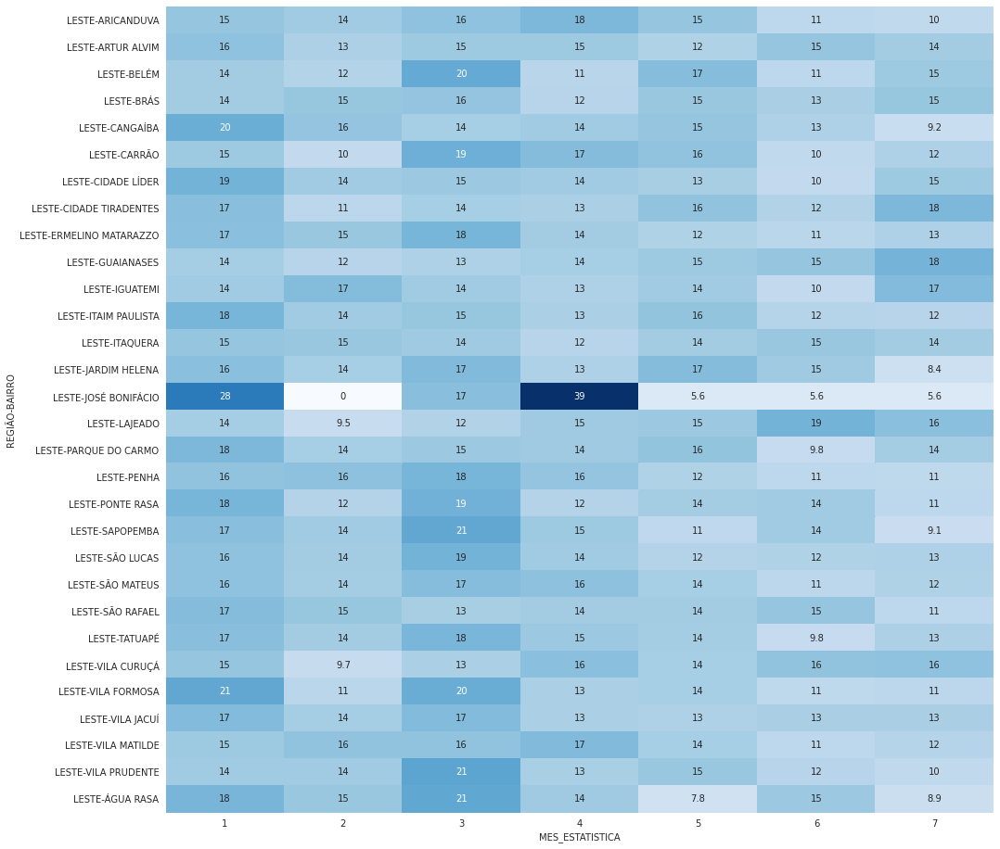

In [123]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_roubo_l.REGIÃO,database_roubo_l.BAIRRO], database_roubo_l.MES_ESTATISTICA, values=database_roubo_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de roubos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- nos meses de janeiro e março alguns bairros apresentam uma elevação nos percentuais;
- O bairo JOSÉ BONIFÁCIO apresenta o menor valor (0% - fevereiro) e o maior valor (29% - julho)

#### Análise de Ocorrência ROUBO na região OESTE

In [124]:
#Separando pela região OESTE
database_roubo_o = database_roubo[database_roubo['REGIÃO']== 'OESTE'].reset_index()

In [125]:
database_roubo_o

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,821,3708,1/19/2022,6:47:00 PM,JARDIM PAULISTA,NaN,NaN,ROUBO,1,2023,90279.0,OESTE
1,923,3842,1/24/2023,3:00:00 AM,JARDIM PAULISTA,"-23,5698886","-46,6618928",ROUBO,1,2023,90279.0,OESTE
2,1051,4652,1/1/2023,12:40:00 AM,JARDIM PAULISTA,NaN,NaN,ROUBO,1,2023,90279.0,OESTE
3,1054,4655,1/1/2023,3:30:00 AM,JARDIM PAULISTA,"-23,5544296","-46,6554725",ROUBO,1,2023,90279.0,OESTE
4,1091,4695,1/9/2023,6:10:00 PM,JARDIM PAULISTA,"-23,55602647","-46,6665296",ROUBO,1,2023,90279.0,OESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
10387,71473,279352,7/25/2023,12:14:00 AM,PINHEIROS,"-23,4842427","-46,4192123",ROUBO,7,2023,65509.0,OESTE
10388,71484,279363,7/8/2023,7:10:00 PM,PINHEIROS,"-23,4917562","-46,4159614",ROUBO,7,2023,65509.0,OESTE
10389,73100,284605,7/11/2023,6:55:00 PM,RAPOSO TAVARES,"-23,5919041","-46,8094722",ROUBO,7,2023,109052.0,OESTE
10390,73101,284626,7/1/2023,5:00:00 AM,MORUMBI,NaN,NaN,ROUBO,7,2023,54007.0,OESTE


In [126]:
x = database_roubo_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_roubo_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) / database_roubo_o.shape[0])

REGIÃO  BAIRRO         
OESTE   PINHEIROS          2008
        ITAIM BIBI         1679
        MORUMBI            1216
        JARDIM PAULISTA     891
        LAPA                875
        BUTANTÃ             836
        BARRA FUNDA         824
        RAPOSO TAVARES      745
        RIO PEQUENO         472
        PERDIZES            434
        JAGUARÉ             265
        JAGUARA             147
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
OESTE   PINHEIROS          0.193226
        ITAIM BIBI         0.161567
        MORUMBI            0.117013
        JARDIM PAULISTA    0.085739
        LAPA               0.084199
        BUTANTÃ            0.080446
        BARRA FUNDA        0.079292
        RAPOSO TAVARES     0.071690
        RIO PEQUENO        0.045420
        PERDIZES           0.041763
        JAGUARÉ            0.025500
        JAGUARA            0.014145
Name: BAIRRO, dtype: float64


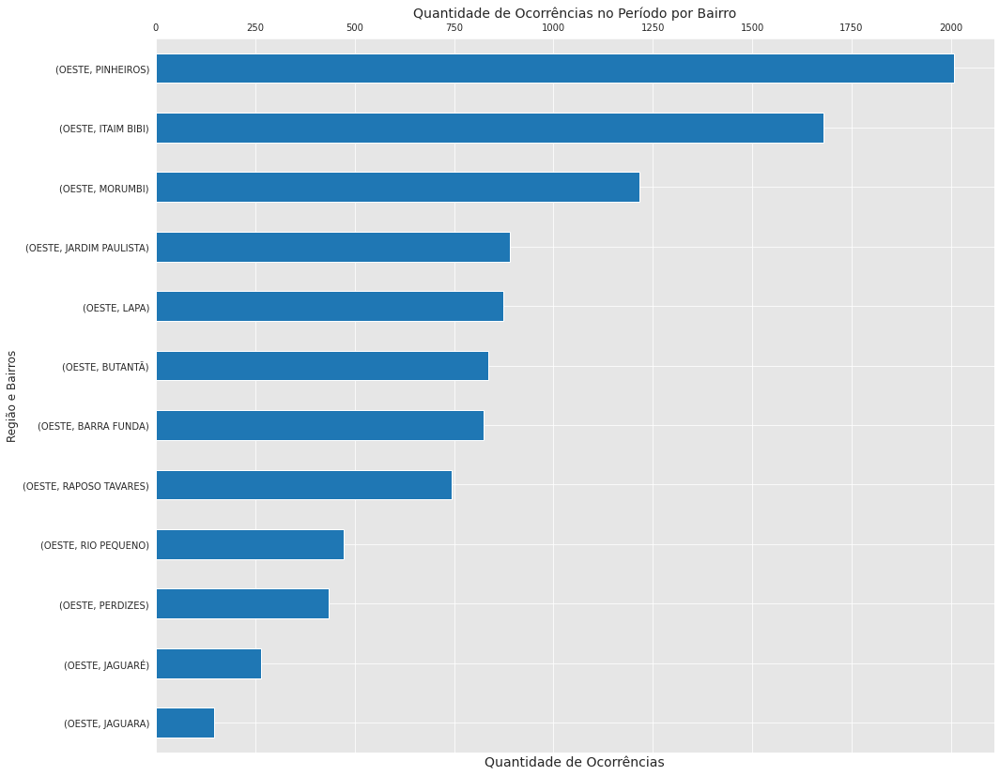

In [127]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_roubo_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região OESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de roubos é PINHEIROs com um percentual 15% maior do que o bairro ITAIM BIBI (2º posição). Percebe-se que do 4° ao 8°  posições apresentam valores próximos entre si.

In [128]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
roubo_cross_o = (pd.crosstab([database_roubo_o.BAIRRO,database_roubo_o.REGIÃO], database_roubo_o.MES_ESTATISTICA, values=database_roubo_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
roubo_cross_o.reset_index(inplace=True)
roubo_cross_o

MES_ESTATISTICA,BAIRRO,REGIÃO,1,2,3,4,5,6,7,Total
0,BARRA FUNDA,OESTE,8.228268,6.223717,6.517691,8.777853,9.114415,9.139073,7.239819,7.929176
1,BUTANTÃ,OESTE,9.555408,10.092515,8.566108,7.765024,6.140918,7.350993,7.304460,8.044650
2,ITAIM BIBI,OESTE,13.669542,12.026913,14.835506,14.449696,18.875242,18.079470,20.168067,16.156659
3,JAGUARA,OESTE,1.260783,1.766190,1.303538,1.350439,1.939237,1.456954,0.904977,1.414550
4,JAGUARÉ,OESTE,2.587923,3.532380,2.234637,2.903444,1.809955,2.913907,2.133161,2.550038
5,JARDIM PAULISTA,OESTE,10.617120,8.578638,9.683426,6.617151,6.399483,9.801325,8.274079,8.573903
6,LAPA,OESTE,7.564698,9.756098,9.683426,9.115463,8.920491,6.026490,8.080155,8.419938
7,MORUMBI,OESTE,10.218978,11.522288,12.476723,11.748818,11.764706,12.384106,11.700065,11.701309
8,PERDIZES,OESTE,3.251493,3.784693,6.021105,3.983795,4.460246,3.311258,4.201681,4.176289
9,PINHEIROS,OESTE,20.637027,18.082422,18.125388,21.742066,18.552036,19.271523,18.745960,19.322556


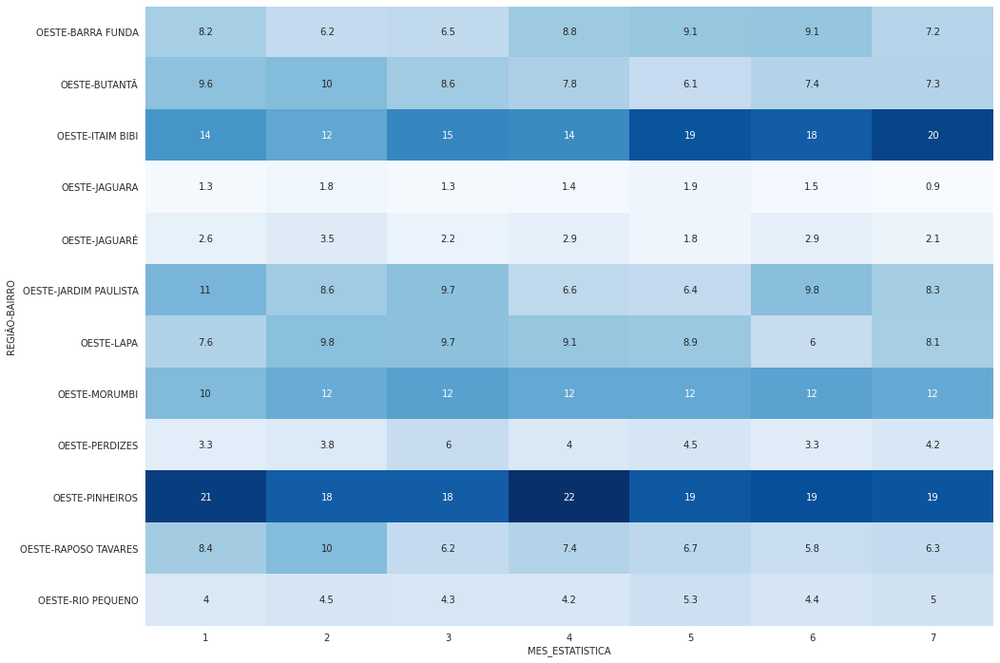

In [129]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_roubo_o.REGIÃO,database_roubo_o.BAIRRO], database_roubo_o.MES_ESTATISTICA, values=database_roubo_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro do PINHEIROS é o bairro que mais contribuiu no percentual em todos os meses do período, apresentando o maior percentual em todos os meses, enqanto ITAIM BIBI apresenta valores altos a partir de maio;
 - já os menores percentuais são os bairros JAGUARA  e JAGUARÉ
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [130]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_roubo_o.REGIÃO,database_roubo_o.BAIRRO], database_roubo_o.MES_ESTATISTICA, values=database_roubo_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
OESTE  BARRA FUNDA      15.048544   8.980583  12.742718  15.776699  17.111650   
       BUTANTÃ          17.224880  14.354067  16.507177  13.755981  11.363636   
       ITAIM BIBI       12.269208   8.516974  14.234663  12.745682  17.391304   
       JAGUARA          12.925170  14.285714  14.285714  13.605442  20.408163   
       JAGUARÉ          14.716981  15.849057  13.584906  16.226415  10.566038   
       JARDIM PAULISTA  17.957351  11.447811  17.508418  10.998878  11.111111   
       LAPA             13.028571  13.257143  17.828571  15.428571  15.771429   
       MORUMBI          12.664474  11.266447  16.529605  14.309211  14.967105   
       PERDIZES         11.290323  10.368664  22.350230  13.594470  15.898618   
       PINHEIROS        15.488048  10.707171  14.541833  16.035857  14.292829   
       RAPOSO TAVARES   17.046980  16.107383  13.422819  14.630872  13.959732   
       RIO PEQUENO      12.711864  11.440678  14.830508  13.135593  17.372881   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
OESTE  BARRA FUNDA      16.747573  13.592233  
       BUTANTÃ          13.277512  13.516746  
       ITAIM BIBI       16.259678  18.582490  
       JAGUARA          14.965986   9.523810  
       JAGUARÉ          16.603774  12.452830  
       JARDIM PAULISTA  16.610550  14.365881  
       LAPA             10.400000  14.285714  
       MORUMBI          15.378289  14.884868  
       PERDIZES         11.520737  14.976959  
       PINHEIROS        14.492032  14.442231  
       RAPOSO TAVARES   11.812081  13.020134  
       RIO PEQUENO      14.194915  16.313559

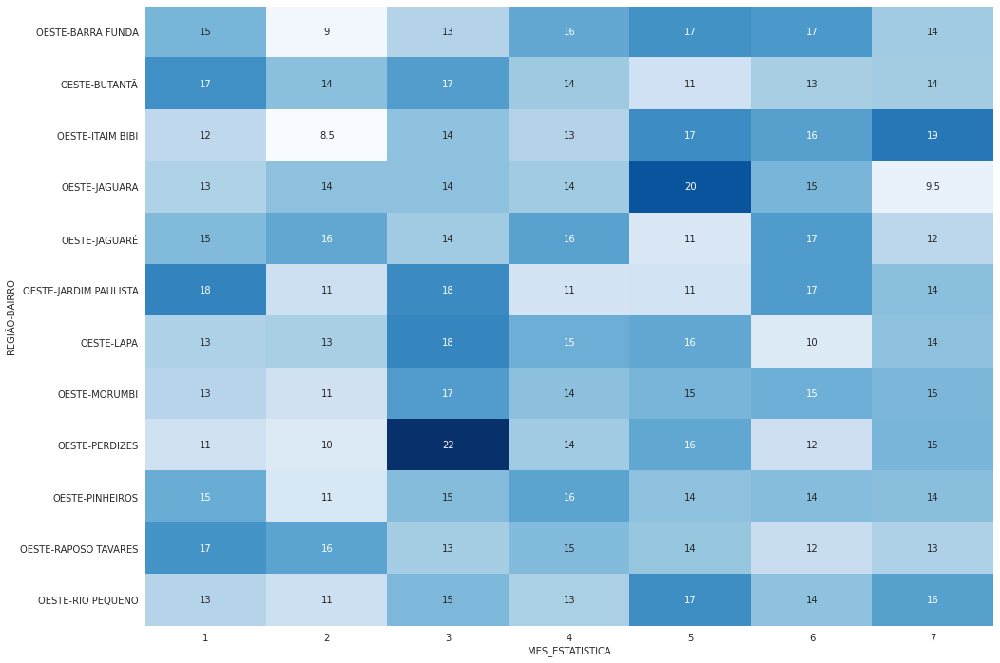

In [131]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_roubo_o.REGIÃO,database_roubo_o.BAIRRO], database_roubo_o.MES_ESTATISTICA, values=database_roubo_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de roubos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- os meses com maiores percentuais ds bairros são abril (PERDIZES) e maio (JAGUARA)

#### Análise de Ocorrência ROUBO na região CENTRAL

In [132]:
#Separando pela região CENTRAL
database_roubo_c = database_roubo[database_roubo['REGIÃO']== 'CENTRO'].reset_index()

In [133]:
database_roubo_c

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,0,1277,12/31/2022,1:30:00 PM,SÉ,"-23,55206965","-46,63604587",ROUBO,1,2023,27241.0,CENTRO
1,1,1278,12/31/2022,1:30:00 PM,SÉ,"-23,55206965","-46,63604587",ROUBO,1,2023,27241.0,CENTRO
2,2,1279,12/31/2022,9:00:00 PM,SÉ,NaN,NaN,ROUBO,1,2023,27241.0,CENTRO
3,3,1280,1/1/2023,8:20:00 AM,SÉ,"-23,55200559","-46,63442933",ROUBO,1,2023,27241.0,CENTRO
4,4,1282,12/29/2022,8:00:00 PM,SÉ,NaN,NaN,ROUBO,1,2023,27241.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...,...
10430,66575,260387,7/22/2023,1:30:00 PM,SANTA CECÍLIA,"-23,53203548","-46,66082558",ROUBO,7,2023,88795.0,CENTRO
10431,66615,260435,7/1/2023,4:50:00 AM,BOM RETIRO,"-23,52003102","-46,62563484",ROUBO,7,2023,39856.0,CENTRO
10432,68086,265430,7/20/2023,6:55:00 AM,BOM RETIRO,"-23,5169165","-46,6539684",ROUBO,7,2023,39856.0,CENTRO
10433,71192,278403,7/22/2023,9:30:00 PM,REPÚBLICA,NaN,NaN,ROUBO,7,2023,62203.0,CENTRO


In [134]:
x = database_roubo_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print((database_roubo_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)) / database_roubo_c.shape[0])

REGIÃO  BAIRRO       
CENTRO  REPÚBLICA        3690
        SÉ               1865
        CONSOLAÇÃO       1365
        BELA VISTA       1176
        SANTA CECÍLIA     763
        BOM RETIRO        673
        LIBERDADE         654
        CAMBUCI           249
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
CENTRO  REPÚBLICA        0.353618
        SÉ               0.178725
        CONSOLAÇÃO       0.130810
        BELA VISTA       0.112698
        SANTA CECÍLIA    0.073119
        BOM RETIRO       0.064494
        LIBERDADE        0.062674
        CAMBUCI          0.023862
Name: BAIRRO, dtype: float64


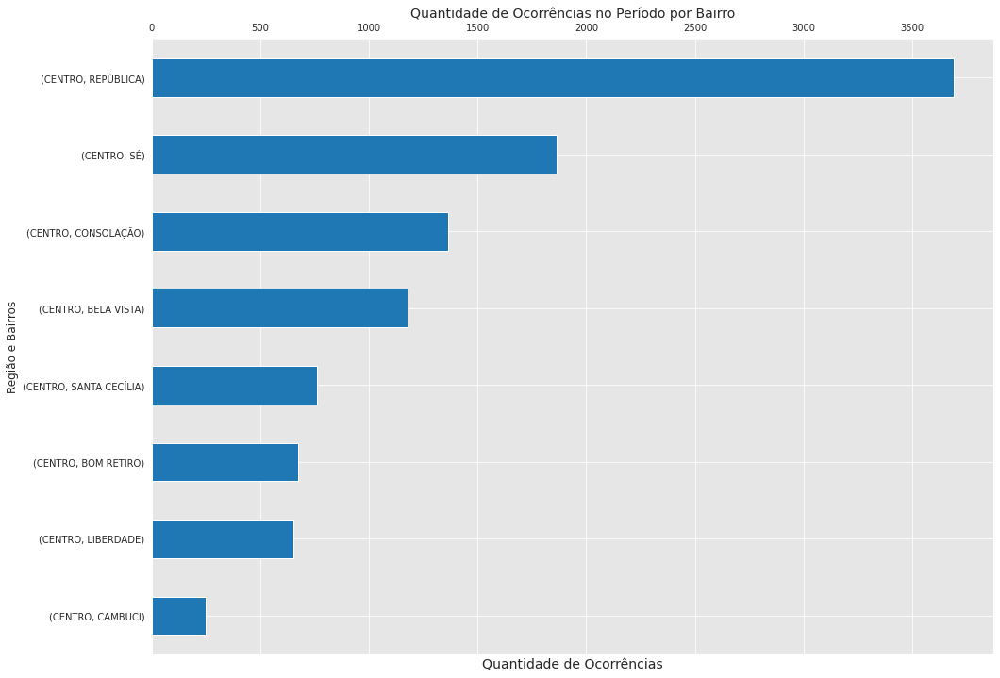

In [135]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 12))
ax = (database_roubo_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que o bairro com o maior número de ocorrências de roubos é REPÚBLICA com um percentual quase 100% maior do que o bairro da SÈ (2º posição). OS dois primeiros somados, correspondem a mais de 50% de todos os os roubos ocorridos da região no período.

In [136]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
roubo_cross_c = (pd.crosstab([database_roubo_c.REGIÃO,database_roubo_c.BAIRRO], database_roubo_c.MES_ESTATISTICA, values=database_roubo_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
roubo_cross_c.reset_index(inplace=True)
roubo_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,CENTRO,BELA VISTA,9.824561,9.243176,7.863425,10.696692,12.371889,15.696784,16.651334,11.269765
1,CENTRO,BOM RETIRO,6.608187,3.287841,5.328505,6.615060,8.565154,8.728943,7.267709,6.449449
2,CENTRO,CAMBUCI,1.988304,1.364764,2.638386,2.533427,2.269400,3.062787,3.219871,2.386200
3,CENTRO,CONSOLAÇÃO,13.040936,11.290323,12.571133,14.144968,12.884334,14.931087,13.339466,13.080977
4,CENTRO,LIBERDADE,5.730994,3.039702,5.018107,7.389163,7.979502,8.652374,7.635695,6.267369
5,CENTRO,REPÚBLICA,34.795322,45.409429,36.575272,33.567910,31.112738,30.857580,32.290708,35.361763
6,CENTRO,SANTA CECÍLIA,8.304094,7.940447,6.156234,7.670654,6.954612,6.584992,7.727691,7.311931
7,CENTRO,SÉ,19.707602,18.424318,23.848939,17.382125,17.862372,11.485452,11.867525,17.872544


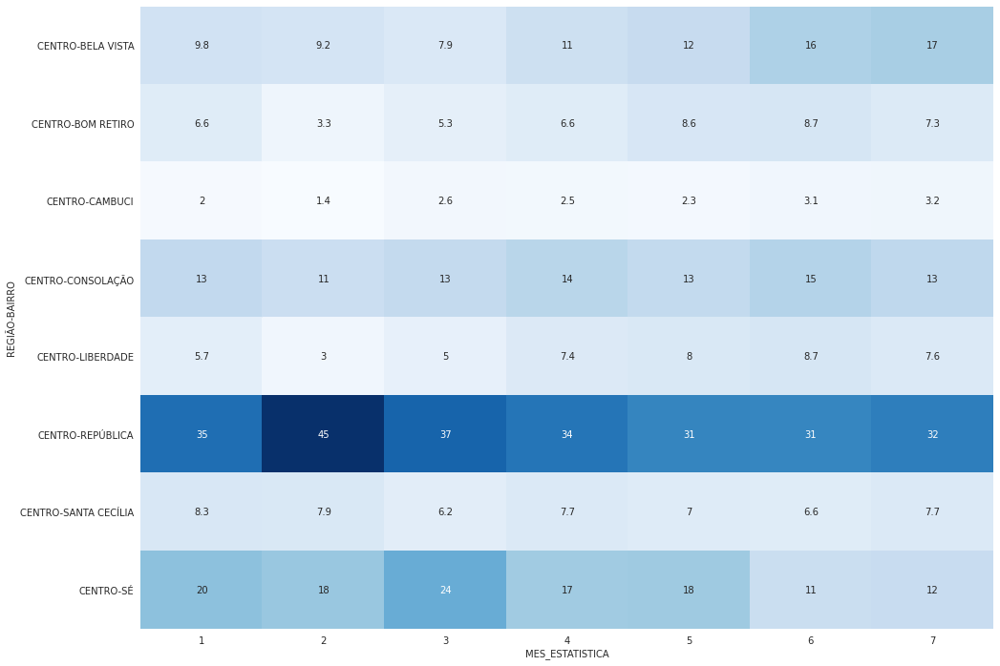

In [137]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_roubo_c.REGIÃO,database_roubo_c.BAIRRO], database_roubo_c.MES_ESTATISTICA, values=database_roubo_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro da REPÚBLICA é o bairro que mais contribuiu no percentual em todos os meses do período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros CAMBUCI  e BOM RETIRO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [138]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
roubo_cross_c = (pd.crosstab([database_roubo_c.REGIÃO,database_roubo_c.BAIRRO], database_roubo_c.MES_ESTATISTICA, values=database_roubo_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)
roubo_cross_c.reset_index(inplace=True)
roubo_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7
0,CENTRO,BELA VISTA,14.285714,12.670068,12.925170,12.925170,14.370748,17.431973,15.391156
1,CENTRO,BOM RETIRO,16.790490,7.875186,15.304606,13.967311,17.384844,16.939079,11.738484
2,CENTRO,CAMBUCI,13.654618,8.835341,20.481928,14.457831,12.449799,16.064257,14.056225
3,CENTRO,CONSOLAÇÃO,16.336996,13.333333,17.802198,14.725275,12.893773,14.285714,10.622711
4,CENTRO,LIBERDADE,14.984709,7.492355,14.831804,16.055046,16.666667,17.278287,12.691131
5,CENTRO,REPÚBLICA,16.124661,19.837398,19.159892,12.926829,11.517615,10.921409,9.512195
6,CENTRO,SANTA CECÍLIA,18.610747,16.775885,15.596330,14.285714,12.450852,11.271298,11.009174
7,CENTRO,SÉ,18.069705,15.924933,24.718499,13.243968,13.083110,8.042895,6.916890


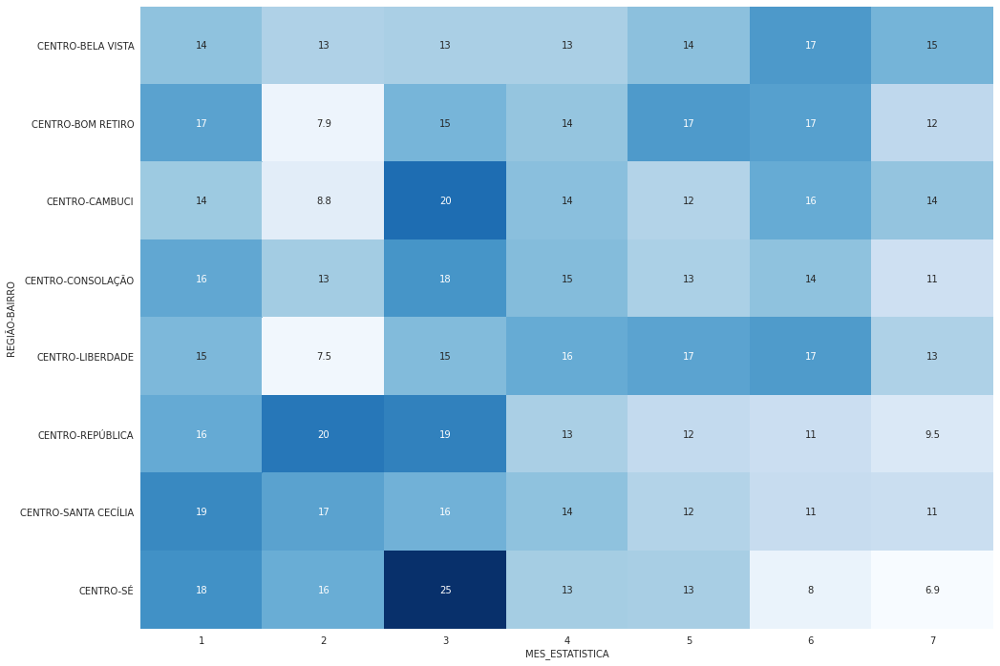

In [139]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_roubo_c.REGIÃO,database_roubo_c.BAIRRO], database_roubo_c.MES_ESTATISTICA, values=database_roubo_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de roubos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- muitos bairros apresentam percentuais elevados nos 3 primeiros meses, exceto CAMBUCI, SANTA CECÍLIA e LIBERDADE,  que em março apresentam queda;
- em abril e maio há um equilíbrio dos percentuais 
- os bairros REPÚBLICA e SÉ são os que apresentam os maiores valores percentuais

### Analisando Ocorrências: LESÃO CORPORAL

Com o intuito de realizar uma análise mais detalhada, o conjunto de dados será separado por tipo de ocorrência, onde agora será analisado a ocorrência LESÃO CORPORAL.

In [140]:
#Separando por tipo de ocorrência
database_lesao = database.loc[database['NATUREZA_APURADA']== 'LESÃO CORPORAL'].reset_index()
database_lesao

,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,98,1/25/2023,13:40:00,CIDADE LÍDER,0,0,LESÃO CORPORAL,1,2023,137277.0,LESTE
1,99,1/6/2023,16:18:00,JARDIM ÂNGELA,"-23,66578104","-46,73305184",LESÃO CORPORAL,1,2023,349210.0,SUL
2,100,1/9/2023,18:08:00,VILA MARIANA,"-23,5974964","-46,6439625",LESÃO CORPORAL,1,2023,131624.0,SUL
3,101,1/29/2023,11:42:00,JABAQUARA,"-23,63409929","-46,64301401",LESÃO CORPORAL,1,2023,230057.0,SUL
4,1235,12/27/2022,3:00:00 PM,SÉ,"-23,54879239","-46,63439988",LESÃO CORPORAL,1,2023,27241.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...
17187,284516,7/29/2023,10:00:00 PM,SAPOPEMBA,0,0,LESÃO CORPORAL,7,2023,291648.0,LESTE
17188,284517,7/30/2023,2:30:00 PM,SÃO LUCAS,0,0,LESÃO CORPORAL,7,2023,142744.0,LESTE
17189,284519,7/30/2023,9:00:00 PM,SAPOPEMBA,"-23,61365838","-46,51069089",LESÃO CORPORAL,7,2023,291648.0,LESTE
17190,284623,5/2/2023,NaN,MORUMBI,0,0,LESÃO CORPORAL,7,2023,54007.0,OESTE


In [141]:
#Agrupando e contando as ocorrências em cada mês
database.loc[database['NATUREZA_APURADA']== 'LESÃO CORPORAL'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()

MES_ESTATISTICA
1    2343
2    2307
3    2830
4    2445
5    2565
6    2394
7    2308
Name: ANO_ESTATISTICA, dtype: int64

In [142]:
#Percentual de ocorrências por mês
database.loc[database['NATUREZA_APURADA']== 'LESÃO CORPORAL'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()/database_lesao.shape[0]

MES_ESTATISTICA
1    0.136284
2    0.134190
3    0.164611
4    0.142217
5    0.149197
6    0.139251
7    0.134248
Name: ANO_ESTATISTICA, dtype: float64

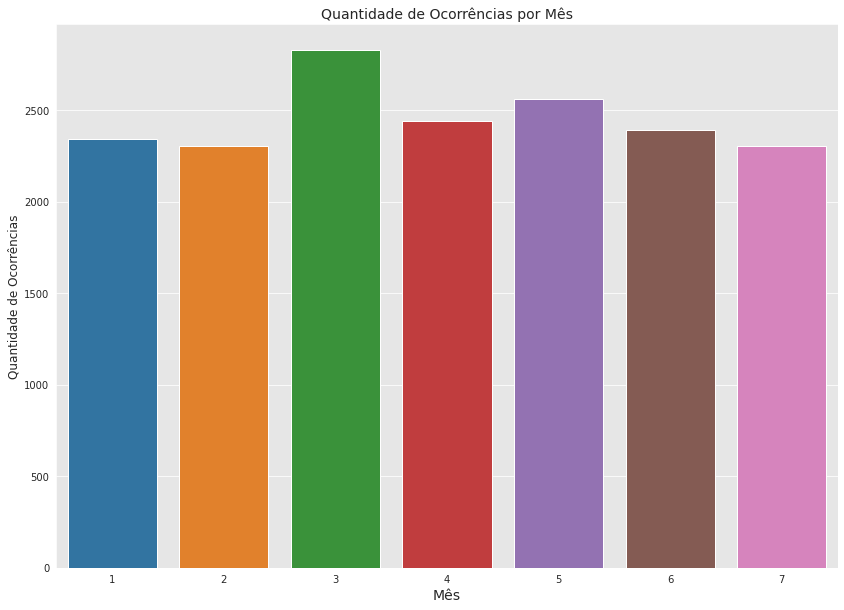

In [143]:
#Plotando o gráfico
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_lesao,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de lesão corporal totais distribuídas pelos meses em questão. Os meses de JANEIRO e FEVEREIRO aparecem empatados. Nota-se que o mês de  MARÇO se sobressai aos demais meses com cerca de 15% a mais em relação a ABRIL. O mês de maio e junho aparecem em segundo lugar com cerca de 13% do total de ocorências.

In [144]:
#Ocorrencias por região
database_lesao.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)

REGIÃO
LESTE     6277
SUL       4710
NORTE     3574
OESTE     1500
CENTRO    1131
Name: NATUREZA_APURADA, dtype: int64

In [145]:
#Percental de ocorrências por bairro e região
database_lesao.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)/database_lesao.shape[0]

REGIÃO
LESTE     0.365112
SUL       0.273965
NORTE     0.207887
OESTE     0.087250
CENTRO    0.065786
Name: NATUREZA_APURADA, dtype: float64

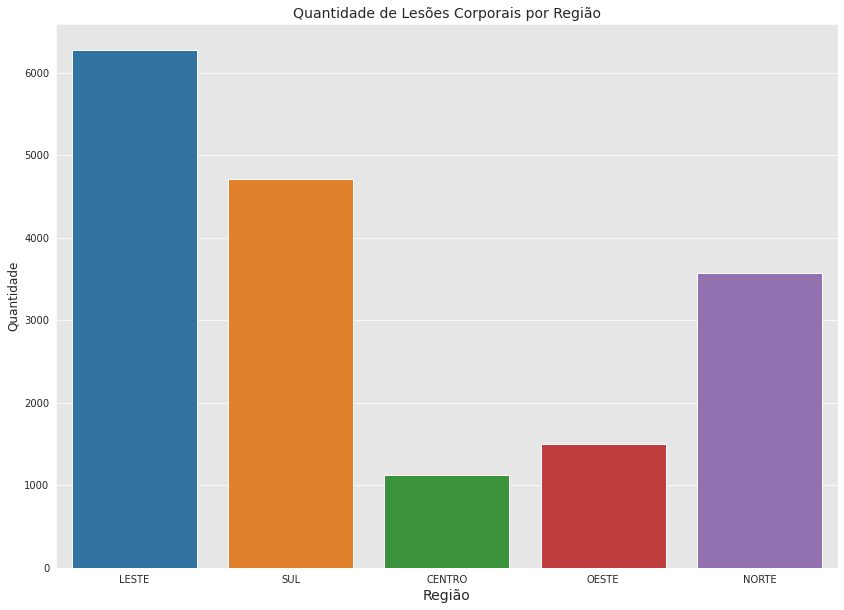

In [146]:
#Gráfico de ocorrências por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_lesao,x='REGIÃO')
ax.set_ylabel('Quantidade', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Lesões Corporais por Região', fontsize=14)
plt.show()

Acima o gráfico plotado demostra as regiões LESTE e SUL se destacam e muito das demais, onde demostra que cerca de 36% (LESTE) e 27%(SUL) dos casos. Somados os percentais das regiões LESTE e SUL tem-se que essas duas regiões respondem por quase 74% do total de ocorrências de lesão corporal, percentual possivelmente atrelado ao número de habitantes em cada região

In [147]:
#Percentual de ocorrências por região
database_lesao['BAIRRO'].value_counts()

JARDIM ÂNGELA         652
GRAJAÚ                577
ERMELINO MATARAZZO    546
CAPÃO REDONDO         542
CAMPO LIMPO           503
                     ... 
JARDIM SÃO LUÍS        46
JAGUARA                29
MARSILAC                7
JOSÉ BONIFÁCIO          2
CURSINO                 1
Name: BAIRRO, Length: 83, dtype: int64

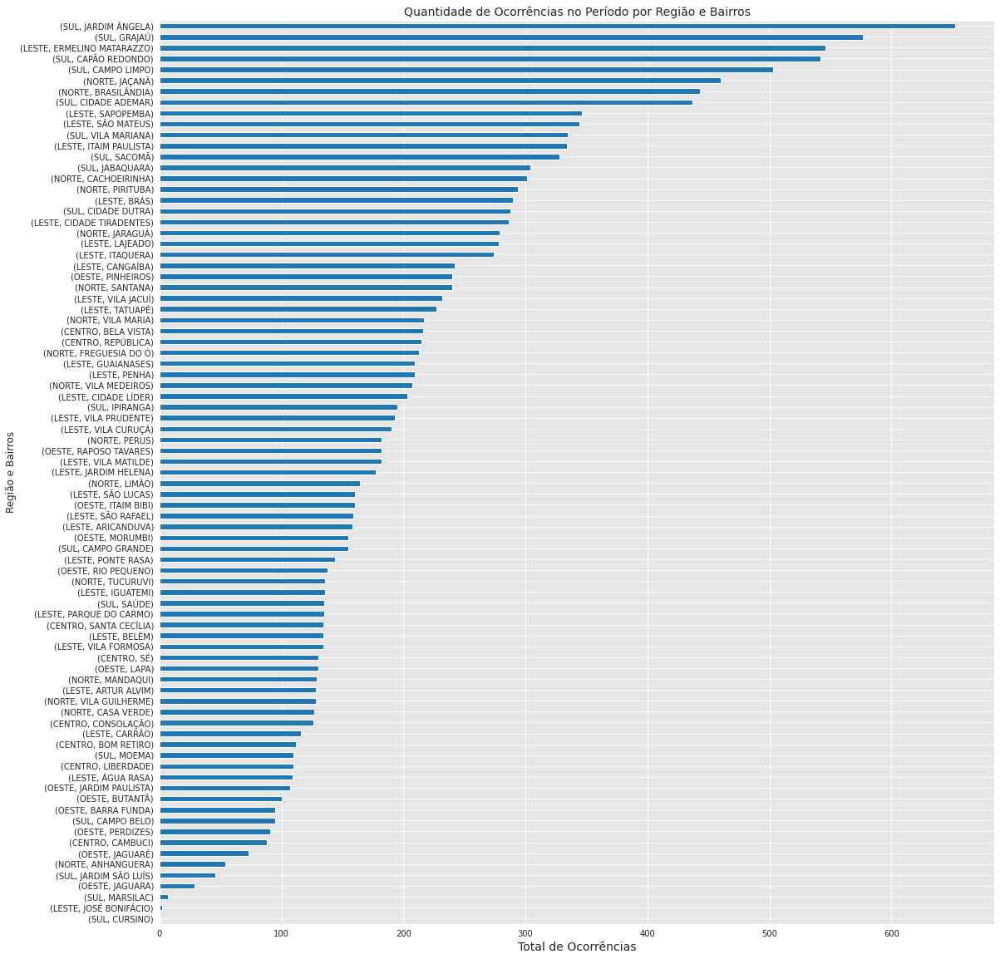

In [148]:
#Plotando o gráfico Quantidade de corrências no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(18, 20))
ax = (database_lesao.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Total de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Região e Bairros', fontsize=14)
ag.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de lesão corporal por região e bairro no período. Nota-se que os percentuais dos bairros estão próximos entre sí e dos 10 primeiros colocados, 5 são bairros da região SUL.

In [149]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_lesao.BAIRRO,database_lesao.REGIÃO], database_lesao.MES_ESTATISTICA, values=database_lesao.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7,Total
BAIRRO,REGIÃO,,,,,,,,
ANHANGUERA,NORTE,0.128041,0.216732,0.318021,0.327198,0.545809,0.334169,0.303293,0.314100
ARICANDUVA,LESTE,0.682885,0.866927,1.130742,1.104294,0.740741,0.960735,0.909879,0.919032
ARTUR ALVIM,LESTE,0.768246,0.910273,0.706714,0.654397,0.779727,0.793651,0.606586,0.744532
BARRA FUNDA,OESTE,0.554844,0.520156,0.388693,0.817996,0.584795,0.584795,0.433276,0.552583
BELA VISTA,CENTRO,1.109688,1.647161,1.130742,1.022495,0.857700,0.918964,2.209705,1.256398
...,...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,2.091336,1.733853,2.084806,1.963190,1.910331,1.921470,1.906412,1.948581
VILA MATILDE,LESTE,1.451131,1.170351,0.883392,1.104294,1.013645,0.918964,0.909879,1.058632
VILA MEDEIROS,NORTE,1.323090,1.257044,1.060071,1.308793,1.052632,1.044277,1.429809,1.204048


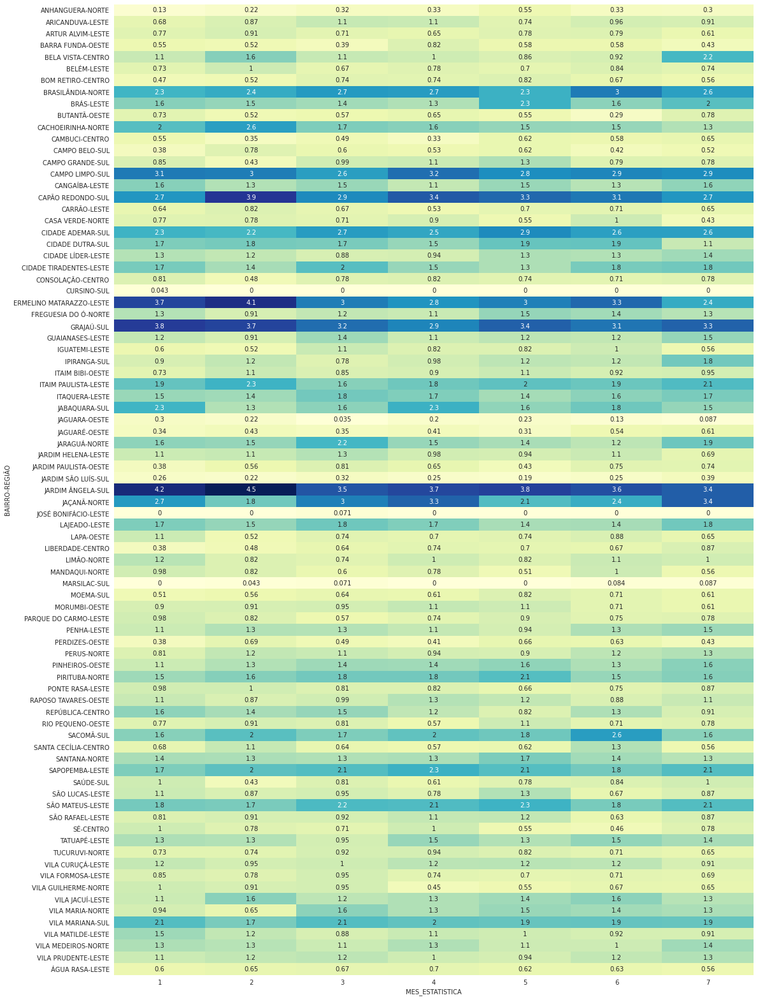

In [150]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(18,28))
sns.heatmap((pd.crosstab([database_lesao.BAIRRO,database_lesao.REGIÃO], database_lesao.MES_ESTATISTICA, values=database_lesao.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

         
|    JANEIRO      |   FEVEREIRO     |       MARÇO       |       ABRIL      |      MAIO        |       JUNHO       |      JULHO     |
|:---------------:|:---------------:|:-----------------:|:----------------:|:----------------:|:-----------------:|:---------------:|
|JD. ÂNGELA **4.2%** |JD. ÂNGELA **4.5%** |JD. ÂNGELA **3.5%** |JD. ÂNGELA **3.8%** |JD. ÂNGELA  **3.9%** |JD. ÂNGELA **3.6%** |JD. ÂNGELA  **3.4%**|
|GRAJAÚ **3.8%** |E.MATARAZZO **4.1%** |GRAJAÚ **3.2%** |JAÇANÃ  **5.4%** |GRAJAÚ **3.4%** |E.MATARAZZO  **3.2%** |GRAJAÚ **3.4%**|
|E.MATARAZZO **3.7%** |GRAJAÚ  **3.7%** |E.MATARAZZO  **3%** |GRAJAÚ  **2,9%** |CAPÃO RED. **3.1%** |GRAJAÚ **3.1%** |JAÇANÃ    **3.3%**|


Nota-se que o bairro JARDIM ÂNGELA aparece em primeiro lugar em todos os meses e o bairro GRAJAÚ aparece nos 7 meses do período. Interessante notar que em todo os meses os percentuais dos bairros apresentaram valores próximos entre sí. Praticamente todos os demais bairros apresentaram percentuais oscilando entre 1% e 2.5% durante todo o período. Outro fato importante é que todos os bairros destacados aqui pertencem às regiões LESTE e SUL (regiões com alta densidade demográfica e muitas comunidades)

In [151]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_lesao.BAIRRO,database_lesao.REGIÃO], database_lesao.MES_ESTATISTICA, values=database_lesao.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7
BAIRRO,REGIÃO,,,,,,,
ANHANGUERA,NORTE,5.555556,9.259259,16.666667,14.814815,25.925926,14.814815,12.962963
ARICANDUVA,LESTE,10.126582,12.658228,20.253165,17.088608,12.025316,14.556962,13.291139
ARTUR ALVIM,LESTE,14.062500,16.406250,15.625000,12.500000,15.625000,14.843750,10.937500
BARRA FUNDA,OESTE,13.684211,12.631579,11.578947,21.052632,15.789474,14.736842,10.526316
BELA VISTA,CENTRO,12.037037,17.592593,14.814815,11.574074,10.185185,10.185185,23.611111
...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,14.626866,11.940299,17.611940,14.328358,14.626866,13.731343,13.134328
VILA MATILDE,LESTE,18.681319,14.835165,13.736264,14.835165,14.285714,12.087912,11.538462
VILA MEDEIROS,NORTE,14.975845,14.009662,14.492754,15.458937,13.043478,12.077295,15.942029


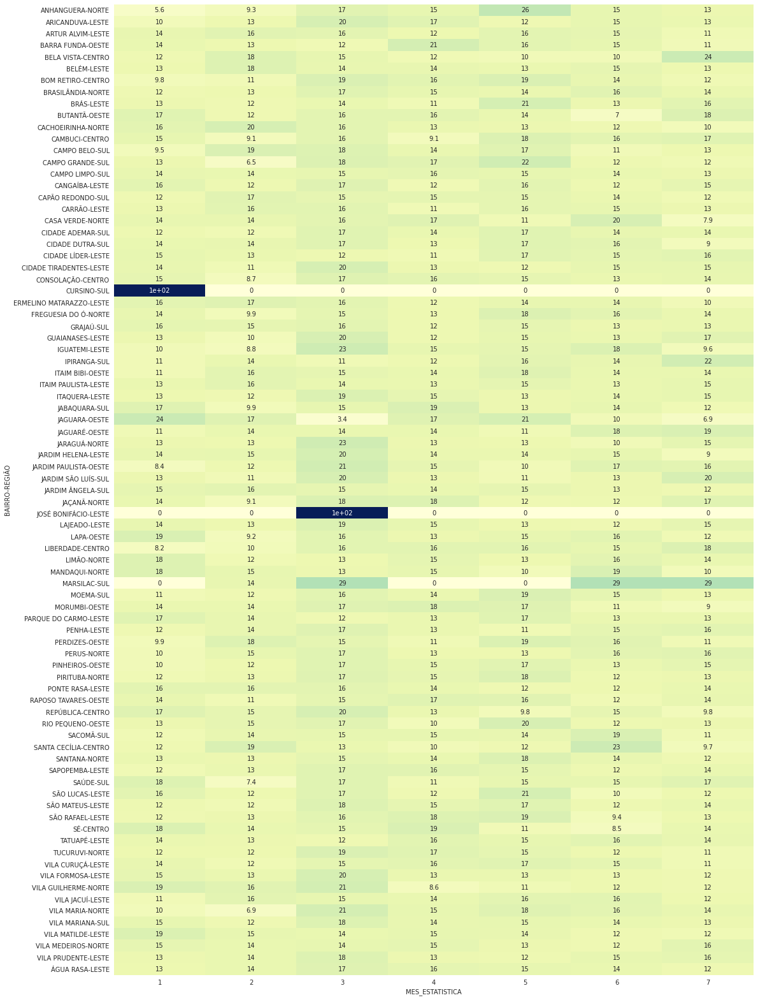

In [152]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(18,28))
sns.heatmap((pd.crosstab([database_lesao.BAIRRO,database_lesao.REGIÃO], database_lesao.MES_ESTATISTICA, values=database_lesao.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A mesma análise acima foi feita, porém agora analisando cada bairro ao longo do período (JANEIRO a JULHO), ou seja, em um determinado bairro, de todas as ocorrências de lesão corporal, quais os percentuais em cada mês em relação ao total. Alguns pontos importantes a serem ressaltados:

 - em praticamente todo o período percebe-se um eqilíbrio ao longo dos meses entre os percentuais dos bairros, exceto CURSINO e MARSILAC (ambos SUL) e JOSÉ BONIFÁCIO (LESTE) que apresentam os mínimos e máximos. 

#### Análise de Ocorrência LESÃO CORPORAL na região NORTE

In [153]:
#Separando pela região NORTE
database_lesao_n = database_lesao[database_lesao['REGIÃO']== 'NORTE'].reset_index()

In [154]:
database_lesao_n

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,495,16045,1/1/2023,6:44:00 AM,JARAGUÁ,"-23,45477575","-46,74926779",LESÃO CORPORAL,1,2023,218794.0,NORTE
1,497,16067,12/4/2022,6:30:00 PM,JARAGUÁ,"-23,45559257","-46,74886732",LESÃO CORPORAL,1,2023,218794.0,NORTE
2,498,16068,1/5/2023,5:30:00 PM,PIRITUBA,0,0,LESÃO CORPORAL,1,2023,171585.0,NORTE
3,499,16070,1/6/2023,5:00:16 PM,PIRITUBA,0,0,LESÃO CORPORAL,1,2023,171585.0,NORTE
4,501,16072,1/8/2023,NaN,PIRITUBA,"-23,5014738","-46,7476819",LESÃO CORPORAL,1,2023,171585.0,NORTE
...,...,...,...,...,...,...,...,...,...,...,...,...
3569,16086,268632,7/27/2023,6:04:00 AM,VILA MARIA,"-23,5222822","-46,5632475",LESÃO CORPORAL,7,2023,114185.0,NORTE
3570,16087,268633,7/29/2023,6:00:00 PM,VILA MARIA,"-23,51743371","-46,57031509",LESÃO CORPORAL,7,2023,114185.0,NORTE
3571,16088,268635,7/31/2023,5:53:00 PM,VILA MARIA,"-23,52229239","-46,57118497",LESÃO CORPORAL,7,2023,114185.0,NORTE
3572,16099,269012,7/7/2023,1:00:00 PM,SANTANA,"-23,5173387","-46,5352941",LESÃO CORPORAL,7,2023,111492.0,NORTE


In [155]:
x = database_lesao_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_lesao_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False) /database_lesao_n.shape[0] )

REGIÃO  BAIRRO        
NORTE   JAÇANÃ            460
        BRASILÂNDIA       443
        CACHOEIRINHA      301
        PIRITUBA          294
        JARAGUÁ           279
        SANTANA           240
        VILA MARIA        217
        FREGUESIA DO Ó    213
        VILA MEDEIROS     207
        PERUS             182
        LIMÃO             164
        TUCURUVI          136
        MANDAQUI          129
        VILA GUILHERME    128
        CASA VERDE        127
        ANHANGUERA         54
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        
NORTE   JAÇANÃ            0.128707
        BRASILÂNDIA       0.123951
        CACHOEIRINHA      0.084219
        PIRITUBA          0.082261
        JARAGUÁ           0.078064
        SANTANA           0.067152
        VILA MARIA        0.060716
        FREGUESIA DO Ó    0.059597
        VILA MEDEIROS     0.057918
        PERUS             0.050923
        LIMÃO             0.045887
        TUCURUVI          0.038053
        MANDAQUI          0

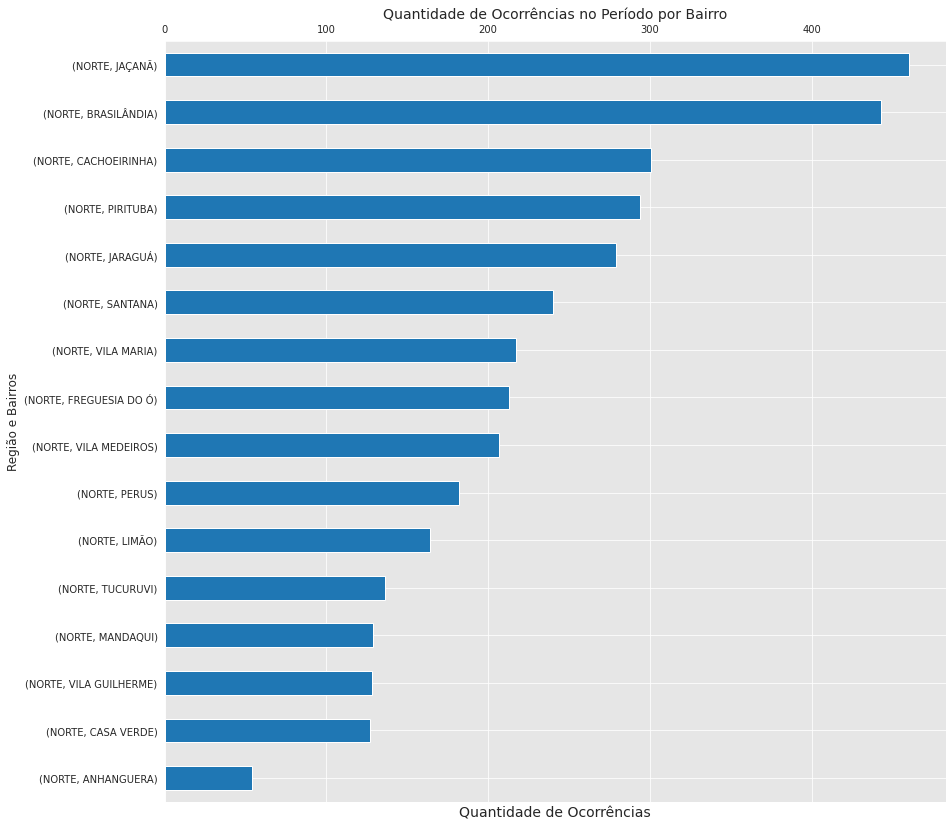

In [156]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_lesao_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região NORTE em todo o período. Nota-se que os bairros com os maiores números de ocorrências de lesão corporal são JAÇANÃ e BRASILÂNDIA  com percentuais próximos entre sí.

In [157]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
lesao_cross_n = pd.crosstab([database_lesao_n.REGIÃO,database_lesao_n.BAIRRO], database_lesao_n.MES_ESTATISTICA, values=database_lesao_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
lesao_cross_n.reset_index(inplace=True)
lesao_cross_n

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,NORTE,ANHANGUERA,0.621118,1.103753,1.453958,1.532567,2.750491,1.587302,1.446281,1.510912
1,NORTE,BRASILÂNDIA,10.973085,12.362031,12.277868,12.452107,11.787819,14.484127,12.396694,12.395076
2,NORTE,CACHOEIRINHA,9.937888,13.245033,7.754443,7.662835,7.662083,7.142857,6.198347,8.421936
3,NORTE,CASA VERDE,3.726708,3.973510,3.231018,4.214559,2.750491,4.960317,2.066116,3.553442
4,NORTE,FREGUESIA DO Ó,6.211180,4.635762,5.331179,5.172414,7.662083,6.746032,5.991736,5.959709
5,NORTE,JARAGUÁ,7.660455,7.726269,10.177706,7.088123,6.876228,5.753968,8.884298,7.806379
6,NORTE,JAÇANÃ,13.043478,9.271523,13.731826,15.517241,10.609037,11.309524,16.115702,12.870733
7,NORTE,LIMÃO,6.004141,4.194260,3.392569,4.789272,4.125737,5.158730,4.752066,4.588696
8,NORTE,MANDAQUI,4.761905,4.194260,2.746365,3.639847,2.554028,4.960317,2.685950,3.609401
9,NORTE,PERUS,3.933747,5.960265,5.008078,4.406130,4.518664,5.753968,6.198347,5.092334


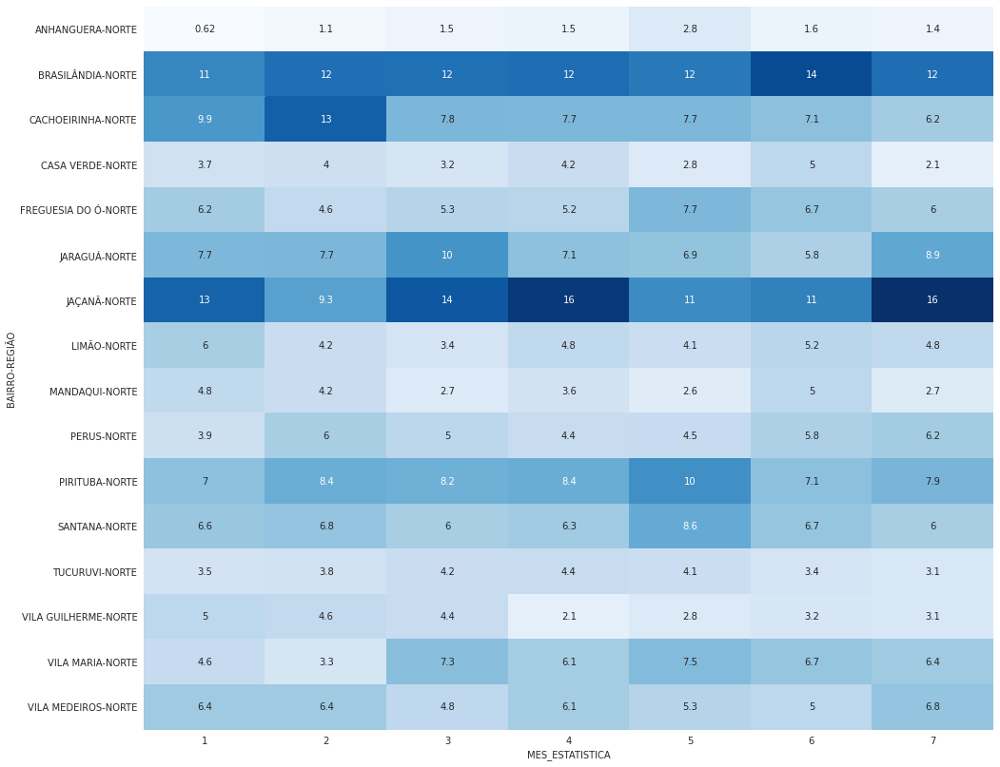

In [158]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_lesao_n.BAIRRO,database_lesao_n.REGIÃO], database_lesao_n.MES_ESTATISTICA, values=database_lesao_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro de JACANÃ e BRASILÂNDIA são os bairros que mais contribuiram no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já o menor percentual é o bairro ANHANGUERA

In [159]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_lesao_n.REGIÃO,database_lesao_n.BAIRRO], database_lesao_n.MES_ESTATISTICA, values=database_lesao_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                1          2          3          4          5  \
REGIÃO BAIRRO                                                                  
NORTE  ANHANGUERA       5.555556   9.259259  16.666667  14.814815  25.925926   
       BRASILÂNDIA     11.963883  12.641084  17.155756  14.672686  13.544018   
       CACHOEIRINHA    15.946844  19.933555  15.946844  13.289037  12.956811   
       CASA VERDE      14.173228  14.173228  15.748031  17.322835  11.023622   
       FREGUESIA DO Ó  14.084507   9.859155  15.492958  12.676056  18.309859   
       JARAGUÁ         13.261649  12.544803  22.580645  13.261649  12.544803   
       JAÇANÃ          13.695652   9.130435  18.478261  17.608696  11.739130   
       LIMÃO           17.682927  11.585366  12.804878  15.243902  12.804878   
       MANDAQUI        17.829457  14.728682  13.178295  14.728682  10.077519   
       PERUS           10.439560  14.835165  17.032967  12.637363  12.637363   
       PIRITUBA        11.564626  12.925170  17.346939  14.965986  18.027211   
       SANTANA         13.333333  12.916667  15.416667  13.750000  18.333333   
       TUCURUVI        12.500000  12.500000  19.117647  16.911765  15.441176   
       VILA GUILHERME  18.750000  16.406250  21.093750   8.593750  10.937500   
       VILA MARIA      10.138249   6.912442  20.737327  14.746544  17.511521   
       VILA MEDEIROS   14.975845  14.009662  14.492754  15.458937  13.043478   

MES_ESTATISTICA                6          7  
REGIÃO BAIRRO                                
NORTE  ANHANGUERA      14.814815  12.962963  
       BRASILÂNDIA     16.478555  13.544018  
       CACHOEIRINHA    11.960133   9.966777  
       CASA VERDE      19.685039   7.874016  
       FREGUESIA DO Ó  15.962441  13.615023  
       JARAGUÁ         10.394265  15.412186  
       JAÇANÃ          12.391304  16.956522  
       LIMÃO           15.853659  14.024390  
       MANDAQUI        19.379845  10.077519  
       PERUS           15.934066  16.483516  
       PIRITUBA        12.244898  12.925170  
       SANTANA         14.166667  12.083333  
       TUCURUVI        12.500000  11.029412  
       VILA GUILHERME  12.500000  11.718750  
       VILA MARIA      15.668203  14.285714  
       VILA MEDEIROS   12.077295  15.942029

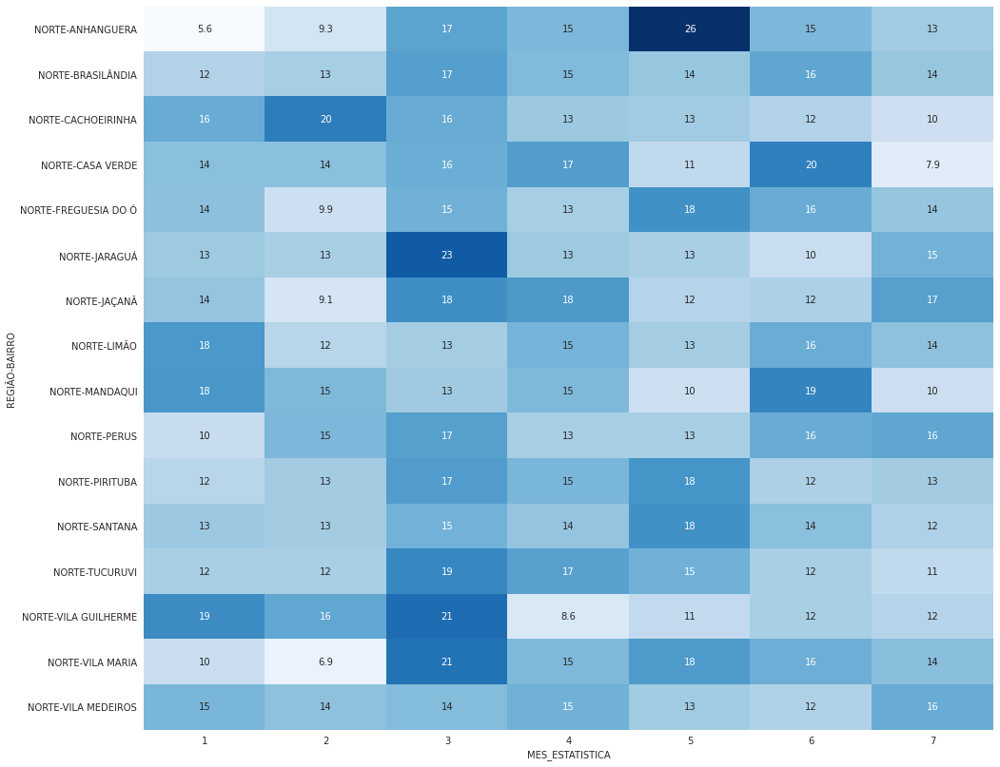

In [160]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_lesao_n.REGIÃO,database_lesao_n.BAIRRO], database_lesao_n.MES_ESTATISTICA, values=database_lesao_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de lesão corporal nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada (exceto ANHANGUERA)
- vale ressaltar o bairro São Domingos que teve um percentual de 5,6% foi também o que apresentou o maior percentual na distribuição dos meses (28%), no mês de maio.
- em março pratiacmente todos os bairros apresentaram aumento em seus percentuais

#### Análise de Ocorrência LESÃO CORPORAL na região SUL

In [161]:
#Separando pela região SUL
database_lesao_s = database_lesao[database_lesao['REGIÃO']== 'SUL'].reset_index()

In [162]:
database_lesao_s

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,1,99,1/6/2023,16:18:00,JARDIM ÂNGELA,"-23,66578104","-46,73305184",LESÃO CORPORAL,1,2023,349210.0,SUL
1,2,100,1/9/2023,18:08:00,VILA MARIANA,"-23,5974964","-46,6439625",LESÃO CORPORAL,1,2023,131624.0,SUL
2,3,101,1/29/2023,11:42:00,JABAQUARA,"-23,63409929","-46,64301401",LESÃO CORPORAL,1,2023,230057.0,SUL
3,120,5574,7/29/2022,11:10:10 PM,VILA MARIANA,"-23,57451067","-46,6372811",LESÃO CORPORAL,1,2023,131624.0,SUL
4,124,5585,1/9/2023,NaN,IPIRANGA,0,0,LESÃO CORPORAL,1,2023,113158.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...,...
4705,16581,277357,7/17/2023,5:30:00 PM,CAMPO GRANDE,"-23,6770392","-46,6813878",LESÃO CORPORAL,7,2023,107661.0,SUL
4706,16582,277358,7/24/2023,8:43:00 PM,CAMPO GRANDE,"-23,66624189","-46,69212001",LESÃO CORPORAL,7,2023,107661.0,SUL
4707,16583,277359,7/24/2023,9:20:00 PM,CAMPO GRANDE,"-23,65987816","-46,69696888",LESÃO CORPORAL,7,2023,107661.0,SUL
4708,16584,277360,7/29/2023,NaN,CAMPO GRANDE,"-23,6871834","-46,680542",LESÃO CORPORAL,7,2023,107661.0,SUL


In [163]:
x = database_lesao_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_lesao_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/ database_lesao_s.shape[0])

REGIÃO  BAIRRO         
SUL     JARDIM ÂNGELA      652
        GRAJAÚ             577
        CAPÃO REDONDO      542
        CAMPO LIMPO        503
        CIDADE ADEMAR      437
        VILA MARIANA       335
        SACOMÃ             328
        JABAQUARA          304
        CIDADE DUTRA       288
        IPIRANGA           195
        CAMPO GRANDE       155
        SAÚDE              135
        MOEMA              110
        CAMPO BELO          95
        JARDIM SÃO LUÍS     46
        MARSILAC             7
        CURSINO              1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
SUL     JARDIM ÂNGELA      0.138429
        GRAJAÚ             0.122505
        CAPÃO REDONDO      0.115074
        CAMPO LIMPO        0.106794
        CIDADE ADEMAR      0.092781
        VILA MARIANA       0.071125
        SACOMÃ             0.069639
        JABAQUARA          0.064544
        CIDADE DUTRA       0.061146
        IPIRANGA           0.041401
        CAMPO GRANDE       0.032909
  

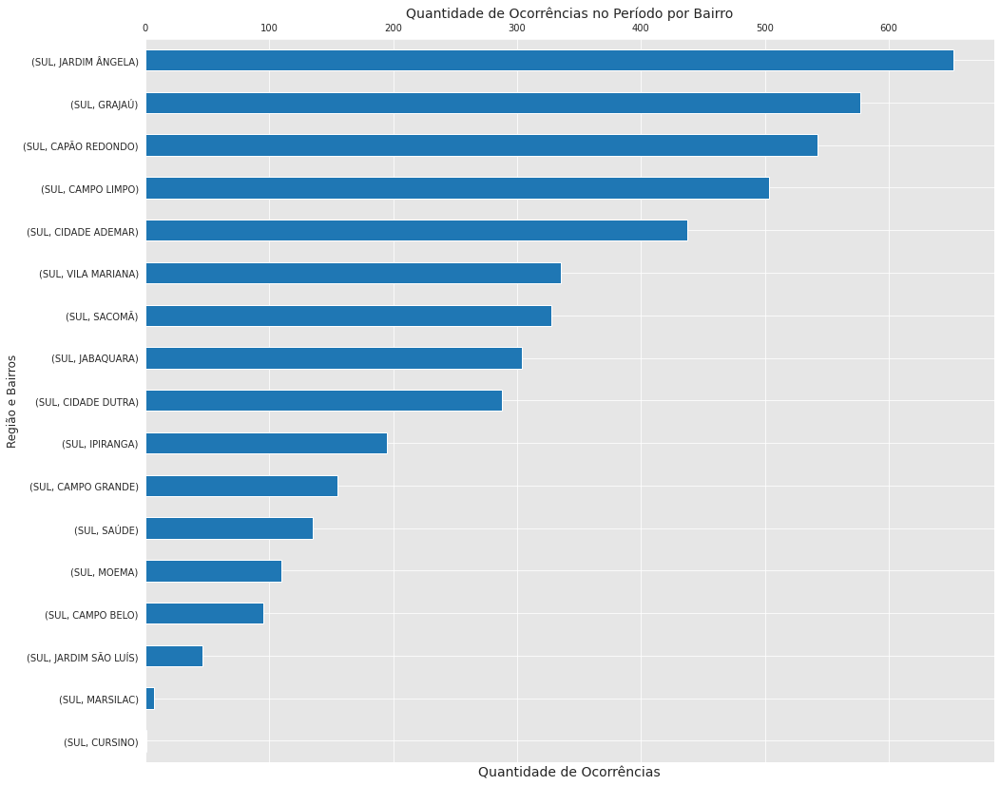

In [164]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_lesao_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região SUL em todo o período. Nota-se que os bairros com o maior número de ocorrências de lesão corporal são JARDIM ÂNGELA, GRAJAÚ e CAPÃO REDONDO com um percentual muito acima dos demais bairros.

In [165]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
lesao_cross_s = pd.crosstab([database_lesao_s.REGIÃO,database_lesao_s.BAIRRO], database_lesao_s.MES_ESTATISTICA, values=database_lesao_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
lesao_cross_s.reset_index(inplace=True)
lesao_cross_s

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,SUL,CAMPO BELO,1.382488,2.795031,2.294197,1.928783,2.203857,1.497006,1.980198,2.016985
1,SUL,CAMPO GRANDE,3.072197,1.552795,3.778677,3.857567,4.683196,2.844311,2.970297,3.290870
2,SUL,CAMPO LIMPO,11.059908,10.869565,9.986505,11.572700,10.055096,10.479042,10.891089,10.679406
3,SUL,CAPÃO REDONDO,9.831029,14.130435,11.066127,12.462908,11.570248,11.077844,10.396040,11.507431
4,SUL,CIDADE ADEMAR,8.294931,7.919255,10.121457,9.050445,10.192837,9.281437,9.900990,9.278132
5,SUL,CIDADE DUTRA,6.144393,6.366460,6.612686,5.489614,6.749311,6.886228,4.290429,6.114650
6,SUL,CURSINO,0.153610,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.021231
7,SUL,GRAJAÚ,13.824885,13.354037,12.280702,10.682493,11.845730,11.227545,12.706271,12.250531
8,SUL,IPIRANGA,3.225806,4.192547,2.968961,3.560831,4.269972,4.191617,6.930693,4.140127
9,SUL,JABAQUARA,8.141321,4.658385,6.072874,8.456973,5.509642,6.586826,5.775578,6.454352


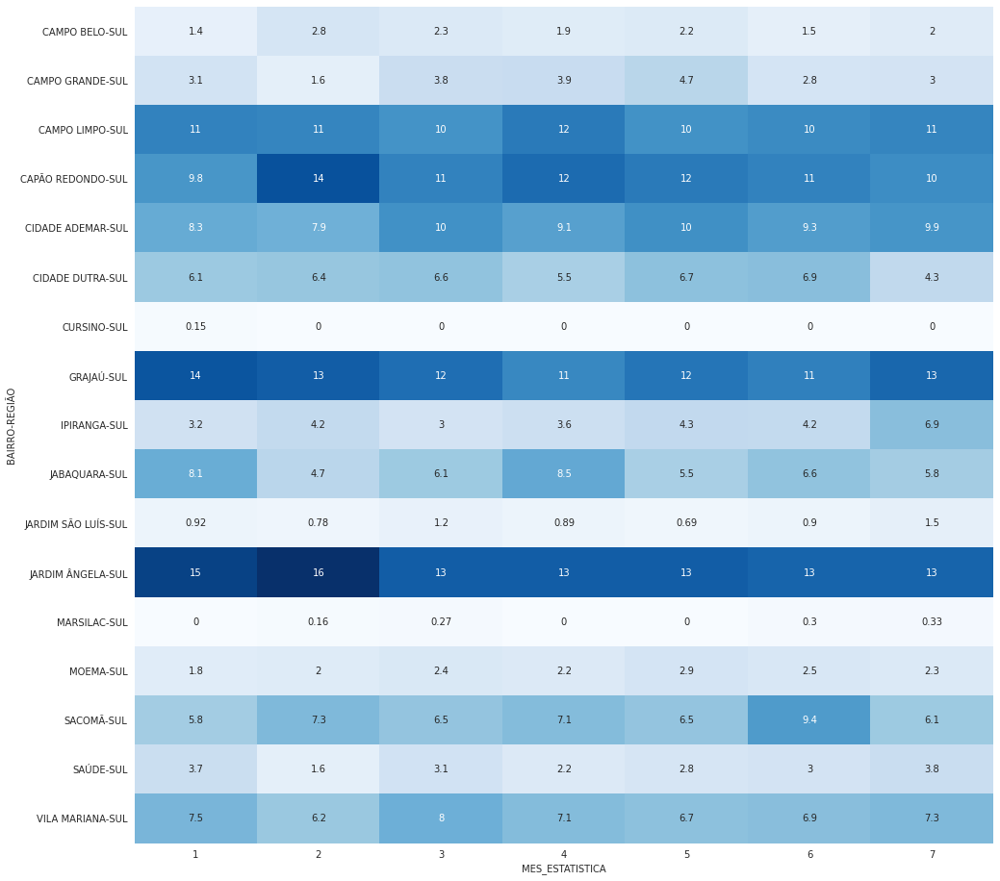

In [166]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_lesao_s.BAIRRO,database_lesao_s.REGIÃO], database_lesao_s.MES_ESTATISTICA, values=database_lesao_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - os bairros JARDIM ANGELA, GRAJAÚ, CAMPO LIMPO e CAPÃO REDONDO realmente saltam aos olhos seus percentuais em relação aos demais bairros, perdurando durante todo o período;
 - já os menores percentuais são os bairros MARSILAC e CURSINO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [167]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_lesao_s.REGIÃO,database_lesao_s.BAIRRO], database_lesao_s.MES_ESTATISTICA, values=database_lesao_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                  1          2          3          4  \
REGIÃO BAIRRO                                                         
SUL    CAMPO BELO         9.473684  18.947368  17.894737  13.684211   
       CAMPO GRANDE      12.903226   6.451613  18.064516  16.774194   
       CAMPO LIMPO       14.314115  13.916501  14.711730  15.506958   
       CAPÃO REDONDO     11.808118  16.789668  15.129151  15.498155   
       CIDADE ADEMAR     12.356979  11.670481  17.162471  13.958810   
       CIDADE DUTRA      13.888889  14.236111  17.013889  12.847222   
       CURSINO          100.000000   0.000000   0.000000   0.000000   
       GRAJAÚ            15.597920  14.904679  15.771231  12.478336   
       IPIRANGA          10.769231  13.846154  11.282051  12.307692   
       JABAQUARA         17.434211   9.868421  14.802632  18.750000   
       JARDIM SÃO LUÍS   13.043478  10.869565  19.565217  13.043478   
       JARDIM ÂNGELA     15.030675  15.950920  15.184049  13.803681   
       MARSILAC           0.000000  14.285714  28.571429   0.000000   
       MOEMA             10.909091  11.818182  16.363636  13.636364   
       SACOMÃ            11.585366  14.329268  14.634146  14.634146   
       SAÚDE             17.777778   7.407407  17.037037  11.111111   
       VILA MARIANA      14.626866  11.940299  17.611940  14.328358   

MES_ESTATISTICA                 5          6          7  
REGIÃO BAIRRO                                            
SUL    CAMPO BELO       16.842105  10.526316  12.631579  
       CAMPO GRANDE     21.935484  12.258065  11.612903  
       CAMPO LIMPO      14.512922  13.916501  13.121272  
       CAPÃO REDONDO    15.498155  13.653137  11.623616  
       CIDADE ADEMAR    16.933638  14.187643  13.729977  
       CIDADE DUTRA     17.013889  15.972222   9.027778  
       CURSINO           0.000000   0.000000   0.000000  
       GRAJAÚ           14.904679  12.998267  13.344887  
       IPIRANGA         15.897436  14.358974  21.538462  
       JABAQUARA        13.157895  14.473684  11.513158  
       JARDIM SÃO LUÍS  10.869565  13.043478  19.565217  
       JARDIM ÂNGELA    14.877301  13.190184  11.963190  
       MARSILAC          0.000000  28.571429  28.571429  
       MOEMA            19.090909  15.454545  12.727273  
       SACOMÃ           14.329268  19.207317  11.280488  
       SAÚDE            14.814815  14.814815  17.037037  
       VILA MARIANA     14.626866  13.731343  13.134328

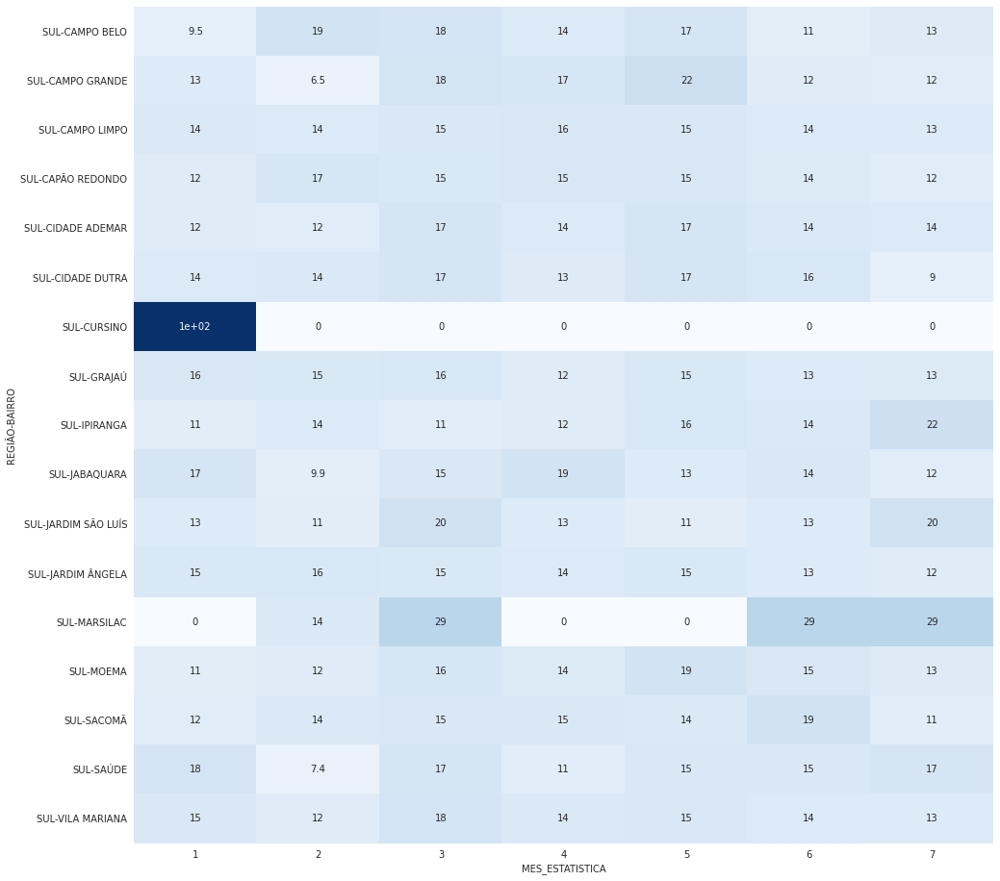

In [168]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_lesao_s.REGIÃO,database_lesao_s.BAIRRO], database_lesao_s.MES_ESTATISTICA, values=database_lesao_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de lesão corporal nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- os bairros MARSILAC e CURSINO são os que apresentaram o menores percentuais e também  maior (CURSINO)

#### Análise de Ocorrência LESÃO CORPORAL na região LESTE

In [169]:
#Separando pela região LESTE
database_lesao_l = database_lesao[database_lesao['REGIÃO']== 'LESTE'].reset_index()

In [170]:
database_lesao_l

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,0,98,1/25/2023,13:40:00,CIDADE LÍDER,0,0,LESÃO CORPORAL,1,2023,137277.0,LESTE
1,141,6078,2/22/2023,4:24:00,BRÁS,"-23,55432025","-46,61252981",LESÃO CORPORAL,1,2023,33770.0,LESTE
2,142,6087,1/10/2022,20:40:18,BRÁS,"-23,54857441","-46,6162523",LESÃO CORPORAL,1,2023,33770.0,LESTE
3,143,6089,1/4/2023,7:45:04 AM,BRÁS,"-23,54328274","-46,61648398",LESÃO CORPORAL,1,2023,33770.0,LESTE
4,144,6090,1/4/2023,12:00:00 PM,BRÁS,0,0,LESÃO CORPORAL,1,2023,33770.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
6272,17185,284514,7/30/2023,10:00:00 AM,SAPOPEMBA,0,0,LESÃO CORPORAL,7,2023,291648.0,LESTE
6273,17186,284515,7/30/2023,11:30:00 AM,SAPOPEMBA,"-23,60174971","-46,52595045",LESÃO CORPORAL,7,2023,291648.0,LESTE
6274,17187,284516,7/29/2023,10:00:00 PM,SAPOPEMBA,0,0,LESÃO CORPORAL,7,2023,291648.0,LESTE
6275,17188,284517,7/30/2023,2:30:00 PM,SÃO LUCAS,0,0,LESÃO CORPORAL,7,2023,142744.0,LESTE


In [171]:
x = database_lesao_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_lesao_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_lesao_l.shape[0])

REGIÃO  BAIRRO            
LESTE   ERMELINO MATARAZZO    546
        SAPOPEMBA             346
        SÃO MATEUS            344
        ITAIM PAULISTA        334
        BRÁS                  290
        CIDADE TIRADENTES     286
        LAJEADO               278
        ITAQUERA              274
        CANGAÍBA              242
        VILA JACUÍ            232
        TATUAPÉ               227
        GUAIANASES            209
        PENHA                 209
        CIDADE LÍDER          203
        VILA PRUDENTE         193
        VILA CURUÇÁ           190
        VILA MATILDE          182
        JARDIM HELENA         177
        SÃO LUCAS             160
        SÃO RAFAEL            159
        ARICANDUVA            158
        PONTE RASA            144
        IGUATEMI              136
        PARQUE DO CARMO       135
        BELÉM                 134
        VILA FORMOSA          134
        ARTUR ALVIM           128
        CARRÃO                116
        ÁGUA RASA    

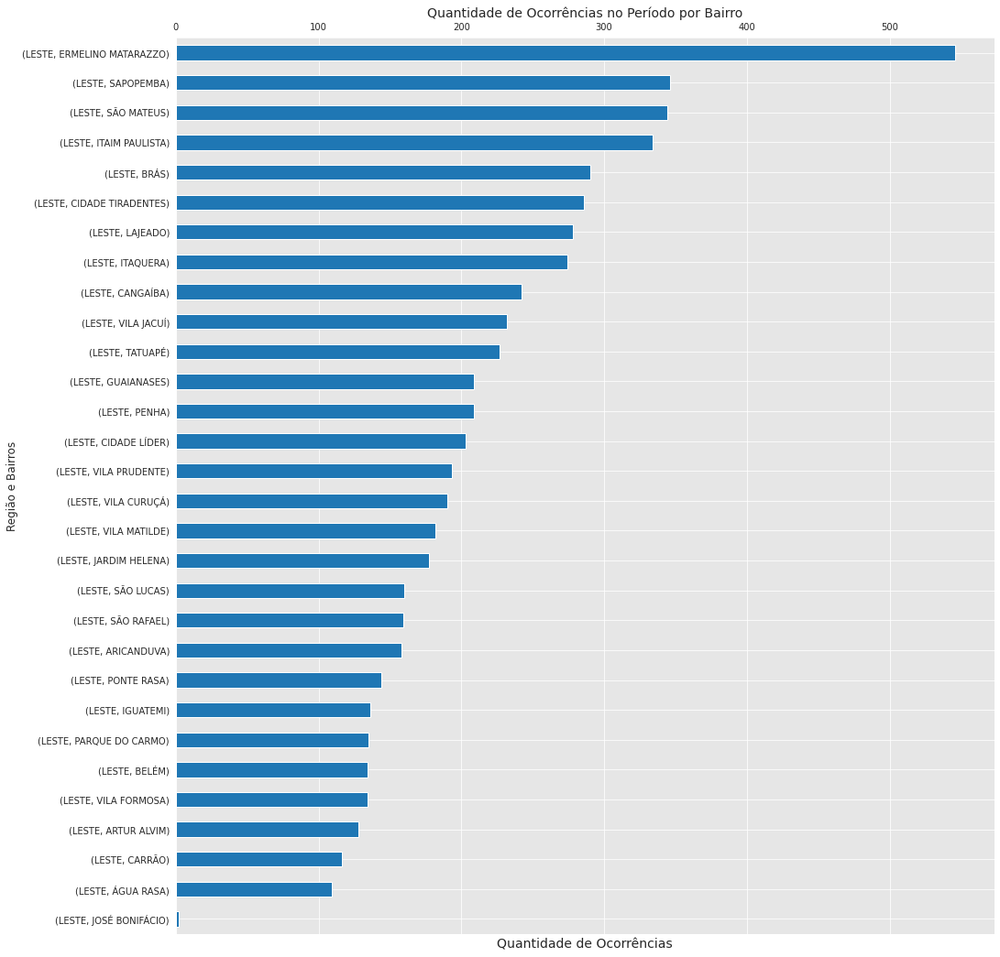

In [172]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 18))
ax = (database_lesao_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região LESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de lesão corporal é ERMELINO MATARAZZO com números bema cima do segundo colocado.

In [173]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
lesao_cross_l = (pd.crosstab([database_lesao_l.REGIÃO,database_furto_l.BAIRRO], database_lesao_l.MES_ESTATISTICA, values=database_lesao_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
lesao_cross_l.reset_index(inplace=True)
lesao_cross_l

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,LESTE,ARICANDUVA,0.814901,0.700117,0.095877,0.000000,11.689692,7.068366,1.300236,3.122511
1,LESTE,ARTUR ALVIM,0.232829,1.516919,0.095877,12.903226,9.351753,0.231750,1.773050,3.711964
2,LESTE,BELÉM,7.566938,0.000000,5.944391,0.000000,0.000000,0.811124,4.846336,2.787956
3,LESTE,BRÁS,61.233993,0.000000,0.862895,0.000000,0.000000,7.879490,43.144208,15.421380
4,LESTE,CANGAÍBA,9.662398,0.000000,4.985618,0.230415,0.000000,0.000000,8.156028,3.281823
5,LESTE,CARRÃO,0.000000,12.602100,1.246405,0.000000,0.318810,0.115875,0.000000,1.991397
6,LESTE,CIDADE LÍDER,0.000000,0.000000,0.000000,0.000000,0.956429,10.544612,0.000000,1.593118
7,LESTE,CIDADE TIRADENTES,0.000000,0.000000,0.000000,0.000000,2.975558,15.643105,0.000000,2.596782
8,LESTE,ERMELINO MATARAZZO,0.116414,0.000000,0.479386,44.009217,0.000000,0.000000,0.000000,6.181297
9,LESTE,GUAIANASES,0.000000,0.000000,1.054650,0.000000,17.853348,0.579374,0.000000,2.931337


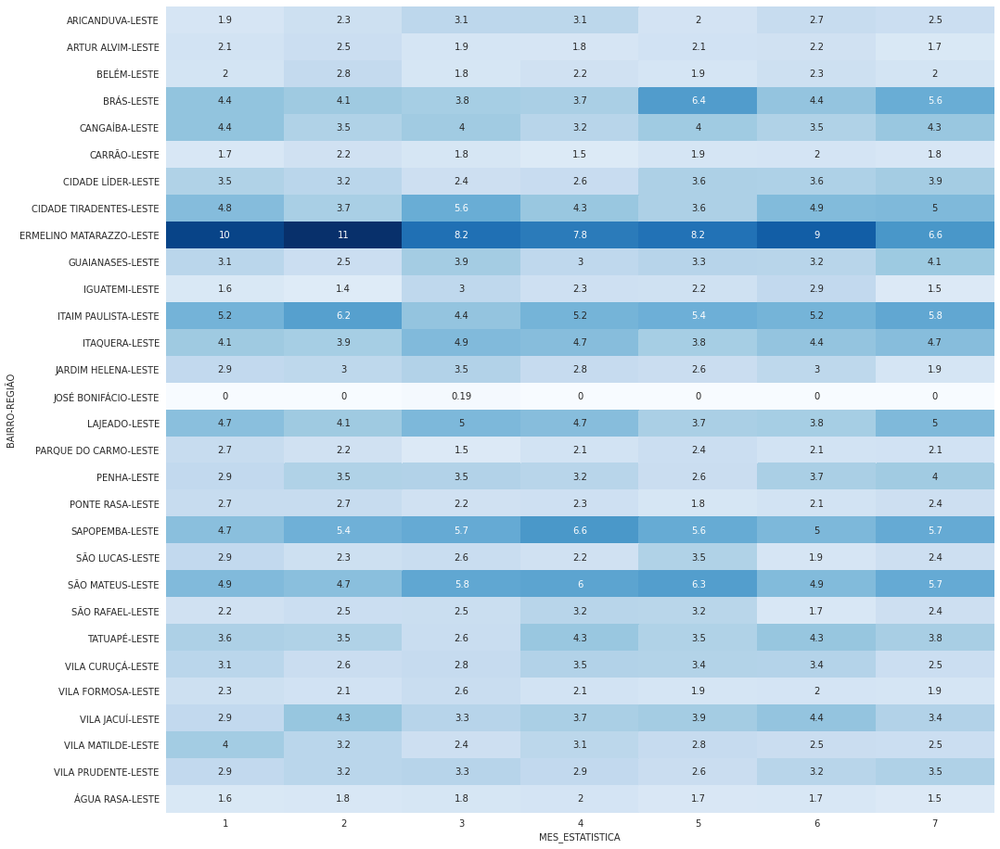

In [174]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_lesao_l.BAIRRO,database_lesao_l.REGIÃO], database_lesao_l.MES_ESTATISTICA, values=database_lesao_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - comproando o exposto acima,o bairro ERMELINO MATARAZZO é o que mais contribuiu no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros JOSÉ BONIFÁCIO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [175]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_lesao_l.REGIÃO,database_lesao_l.BAIRRO], database_lesao_l.MES_ESTATISTICA, values=database_lesao_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                    1          2           3          4  \
REGIÃO BAIRRO                                                            
LESTE  ARICANDUVA          10.126582  12.658228   20.253165  17.088608   
       ARTUR ALVIM         14.062500  16.406250   15.625000  12.500000   
       BELÉM               12.686567  17.910448   14.179104  14.179104   
       BRÁS                13.103448  12.068966   13.793103  11.034483   
       CANGAÍBA            15.702479  12.396694   17.355372  11.570248   
       CARRÃO              12.931034  16.379310   16.379310  11.206897   
       CIDADE LÍDER        14.778325  13.300493   12.315271  11.330049   
       CIDADE TIRADENTES   14.335664  11.188811   20.279720  12.937063   
       ERMELINO MATARAZZO  15.934066  17.216117   15.750916  12.454212   
       GUAIANASES          12.918660  10.047847   19.617225  12.440191   
       IGUATEMI            10.294118   8.823529   22.794118  14.705882   
       ITAIM PAULISTA      13.473054  15.868263   13.772455  13.473054   
       ITAQUERA            12.773723  12.043796   18.613139  14.963504   
       JARDIM HELENA       14.124294  14.689266   20.338983  13.559322   
       JOSÉ BONIFÁCIO       0.000000   0.000000  100.000000   0.000000   
       LAJEADO             14.388489  12.589928   18.705036  14.748201   
       PARQUE DO CARMO     17.037037  14.074074   11.851852  13.333333   
       PENHA               11.961722  14.354067   17.224880  13.397129   
       PONTE RASA          15.972222  15.972222   15.972222  13.888889   
       SAPOPEMBA           11.560694  13.294798   17.052023  16.473988   
       SÃO LUCAS           15.625000  12.500000   16.875000  11.875000   
       SÃO MATEUS          12.209302  11.627907   17.732558  15.116279   
       SÃO RAFAEL          11.949686  13.207547   16.352201  17.610063   
       TATUAPÉ             13.656388  13.215859   11.894273  16.299559   
       VILA CURUÇÁ         14.210526  11.578947   15.263158  15.789474   
       VILA FORMOSA        14.925373  13.432836   20.149254  13.432836   
       VILA JACUÍ          10.775862  15.948276   14.655172  13.793103   
       VILA MATILDE        18.681319  14.835165   13.736264  14.835165   
       VILA PRUDENTE       12.953368  13.989637   17.616580  12.953368   
       ÁGUA RASA           12.844037  13.761468   17.431193  15.596330   

MES_ESTATISTICA                    5          6          7  
REGIÃO BAIRRO                                               
LESTE  ARICANDUVA          12.025316  14.556962  13.291139  
       ARTUR ALVIM         15.625000  14.843750  10.937500  
       BELÉM               13.432836  14.925373  12.686567  
       BRÁS                20.689655  13.103448  16.206897  
       CANGAÍBA            15.702479  12.396694  14.876033  
       CARRÃO              15.517241  14.655172  12.931034  
       CIDADE LÍDER        16.748768  15.270936  16.256158  
       CIDADE TIRADENTES   11.888112  14.685315  14.685315  
       ERMELINO MATARAZZO  14.102564  14.285714  10.256410  
       GUAIANASES          14.832536  13.397129  16.746411  
       IGUATEMI            15.441176  18.382353   9.558824  
       ITAIM PAULISTA      15.269461  13.473054  14.670659  
       ITAQUERA            13.138686  13.868613  14.598540  
       JARDIM HELENA       13.559322  14.689266   9.039548  
       JOSÉ BONIFÁCIO       0.000000   0.000000   0.000000  
       LAJEADO             12.589928  11.870504  15.107914  
       PARQUE DO CARMO     17.037037  13.333333  13.333333  
       PENHA               11.483254  15.311005  16.267943  
       PONTE RASA          11.805556  12.500000  13.888889  
       SAPOPEMBA           15.317919  12.427746  13.872832  
       SÃO LUCAS           20.625000  10.000000  12.500000  
       SÃO MATEUS          17.151163  12.209302  13.953488  
       SÃO RAFAEL          18.867925   9.433962  12.578616  
       TATUAPÉ             14.537445  16.299559  14.096916  
       VILA CURUÇÁ         16.842105  15.2631

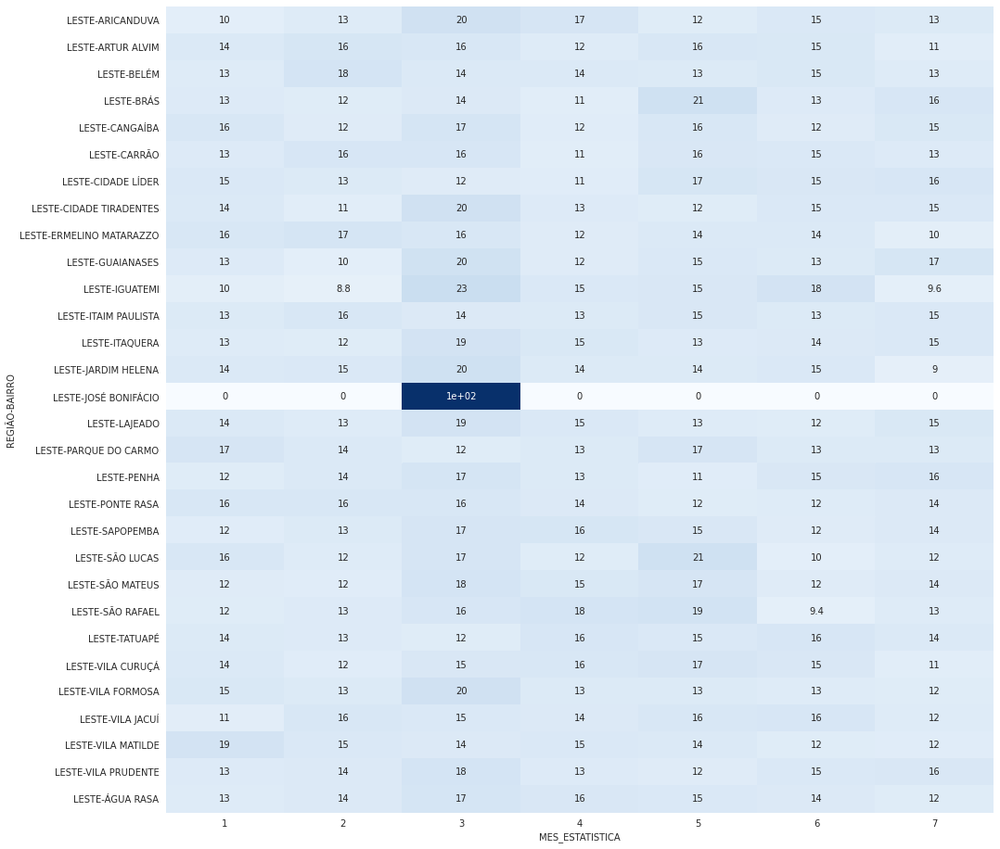

In [176]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_lesao_l.REGIÃO,database_lesao_l.BAIRRO], database_lesao_l.MES_ESTATISTICA, values=database_lesao_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de lesão corporal nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- nos meses de janeiro e março alguns bairros apresentam uma elevação nos percentuais;
- O bairo JOSÉ BONIFÁCIO apresenta o menor valor (0% - fevereiro) e o maior valor (100% - março)

#### Análise de Ocorrência LESÃO CORPORAL na região OESTE

In [177]:
#Separando pela região OESTE
database_lesao_o = database_lesao[database_lesao['REGIÃO']== 'OESTE'].reset_index()

In [178]:
database_lesao_o

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,206,8810,12/28/2022,8:10:00 AM,JARDIM PAULISTA,"-23,5741176","-46,6555982",LESÃO CORPORAL,1,2023,90279.0,OESTE
1,208,8812,1/10/2023,7:18:00 PM,JARDIM PAULISTA,0,0,LESÃO CORPORAL,1,2023,90279.0,OESTE
2,210,8814,1/21/2023,6:05:00 AM,JARDIM PAULISTA,"-23,5647351","-46,6565081",LESÃO CORPORAL,1,2023,90279.0,OESTE
3,211,8815,1/28/2023,2:00:00 AM,JARDIM PAULISTA,"-23,56505595","-46,66912044",LESÃO CORPORAL,1,2023,90279.0,OESTE
4,212,8816,1/30/2023,10:40:00 AM,JARDIM PAULISTA,NaN,NaN,LESÃO CORPORAL,1,2023,90279.0,OESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
1495,16030,268238,7/2/2023,NaN,JARDIM PAULISTA,0,0,LESÃO CORPORAL,7,2023,90279.0,OESTE
1496,16039,268248,7/7/2023,2:00:00 PM,JARDIM PAULISTA,0,0,LESÃO CORPORAL,7,2023,90279.0,OESTE
1497,16593,277965,7/2/2023,9:17:00 PM,PINHEIROS,0,0,LESÃO CORPORAL,7,2023,65509.0,OESTE
1498,16594,277972,7/9/2023,7:46:00 PM,PINHEIROS,0,0,LESÃO CORPORAL,7,2023,65509.0,OESTE


In [179]:
x = database_lesao_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_lesao_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_lesao_o.shape[0])

REGIÃO  BAIRRO         
OESTE   PINHEIROS          240
        RAPOSO TAVARES     182
        ITAIM BIBI         160
        MORUMBI            155
        RIO PEQUENO        138
        LAPA               130
        JARDIM PAULISTA    107
        BUTANTÃ            100
        BARRA FUNDA         95
        PERDIZES            91
        JAGUARÉ             73
        JAGUARA             29
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
OESTE   PINHEIROS          0.160000
        RAPOSO TAVARES     0.121333
        ITAIM BIBI         0.106667
        MORUMBI            0.103333
        RIO PEQUENO        0.092000
        LAPA               0.086667
        JARDIM PAULISTA    0.071333
        BUTANTÃ            0.066667
        BARRA FUNDA        0.063333
        PERDIZES           0.060667
        JAGUARÉ            0.048667
        JAGUARA            0.019333
Name: BAIRRO, dtype: float64


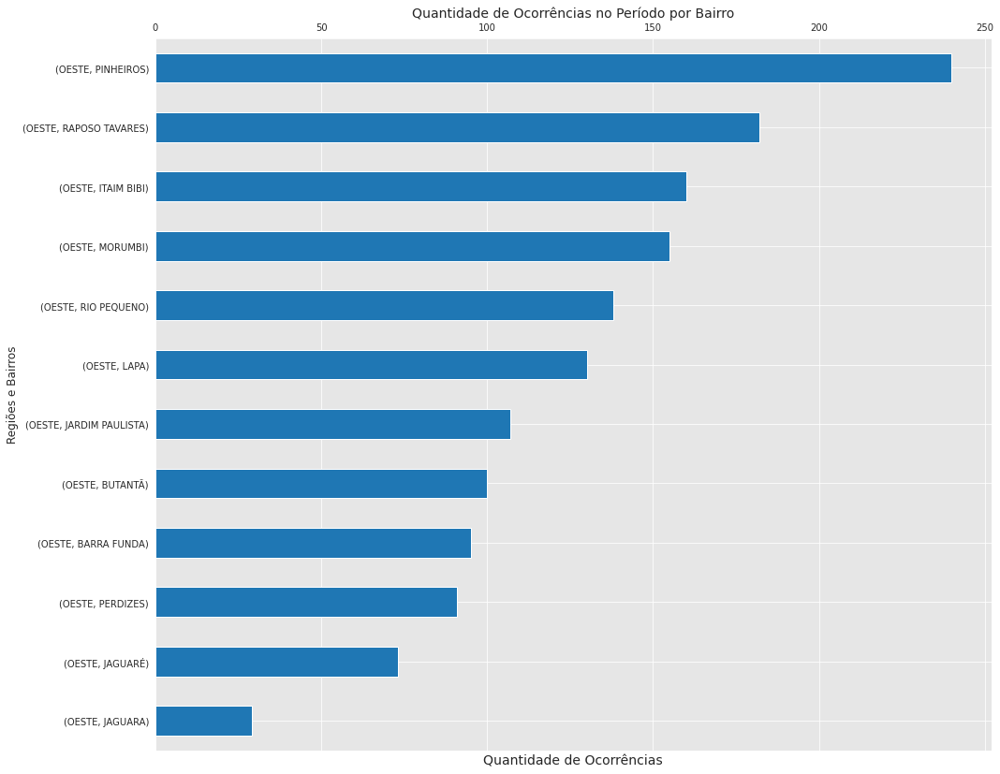

In [180]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_lesao_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Regiões e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região OESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de lesão corporal é PINHEIROs com um percentual 15% maior do que o bairro RAPOSO TAVARES (2º posição). Percebe-se que os demais bairros apresentam valores próximos entre si.

In [181]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
lesao_cross_o = (pd.crosstab([database_lesao_o.BAIRRO,database_lesao_o.REGIÃO], database_lesao_o.MES_ESTATISTICA, values=database_lesao_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
lesao_cross_o.reset_index(inplace=True)
lesao_cross_o

MES_ESTATISTICA,BAIRRO,REGIÃO,1,2,3,4,5,6,7,Total
0,BARRA FUNDA,OESTE,6.666667,6.091371,4.602510,8.928571,6.198347,7.0,4.926108,6.333333
1,BUTANTÃ,OESTE,8.717949,6.091371,6.694561,7.142857,5.785124,3.5,8.866995,6.666667
2,ITAIM BIBI,OESTE,8.717949,12.690355,10.041841,9.821429,11.570248,11.0,10.837438,10.666667
3,JAGUARA,OESTE,3.589744,2.538071,0.418410,2.232143,2.479339,1.5,0.985222,1.933333
4,JAGUARÉ,OESTE,4.102564,5.076142,4.184100,4.464286,3.305785,6.5,6.896552,4.866667
5,JARDIM PAULISTA,OESTE,4.615385,6.598985,9.623431,7.142857,4.545455,9.0,8.374384,7.133333
6,LAPA,OESTE,12.820513,6.091371,8.786611,7.589286,7.851240,10.5,7.389163,8.666667
7,MORUMBI,OESTE,10.769231,10.659898,11.297071,12.500000,11.157025,8.5,6.896552,10.333333
8,PERDIZES,OESTE,4.615385,8.121827,5.857741,4.464286,7.024793,7.5,4.926108,6.066667
9,PINHEIROS,OESTE,12.820513,15.228426,17.154812,15.625000,16.528926,16.0,18.226601,16.000000


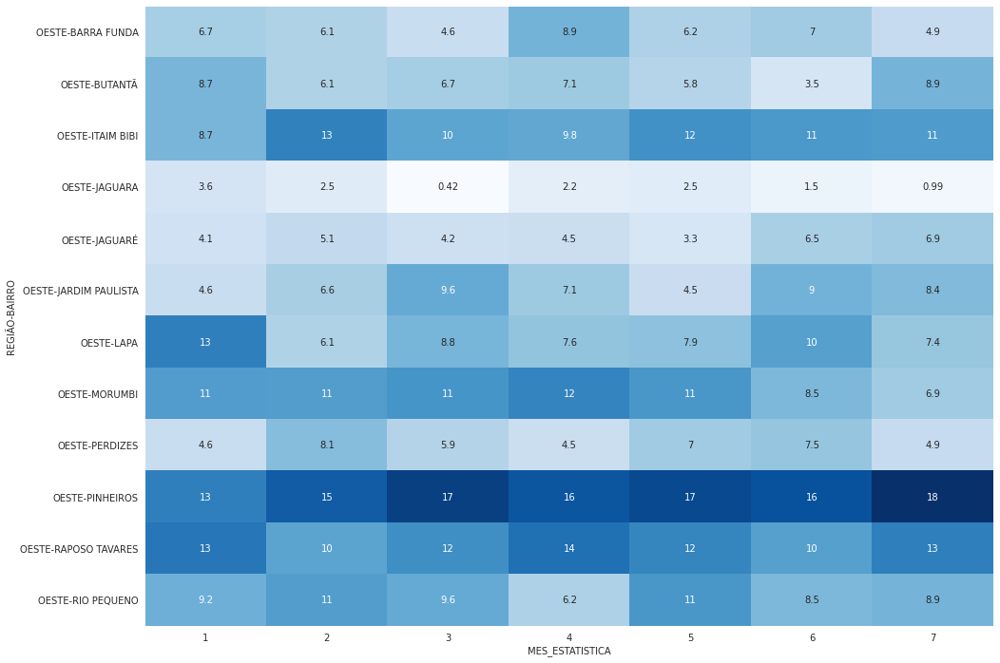

In [182]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_lesao_o.REGIÃO,database_lesao_o.BAIRRO], database_lesao_o.MES_ESTATISTICA, values=database_lesao_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro do PINHEIROS é o bairro que mais contribuiu no percentual em todos os meses do período, apresentando o maior percentual em todos os meses, enqanto RAPOSO TAVARES apresenta valores altos a partir de maio;
 - já os menores percentuais são os bairros JAGUARA  e JAGUARÉ
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [183]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_lesao_o.REGIÃO,database_lesao_o.BAIRRO], database_lesao_o.MES_ESTATISTICA, values=database_lesao_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
OESTE  BARRA FUNDA      13.684211  12.631579  11.578947  21.052632  15.789474   
       BUTANTÃ          17.000000  12.000000  16.000000  16.000000  14.000000   
       ITAIM BIBI       10.625000  15.625000  15.000000  13.750000  17.500000   
       JAGUARA          24.137931  17.241379   3.448276  17.241379  20.689655   
       JAGUARÉ          10.958904  13.698630  13.698630  13.698630  10.958904   
       JARDIM PAULISTA   8.411215  12.149533  21.495327  14.953271  10.280374   
       LAPA             19.230769   9.230769  16.153846  13.076923  14.615385   
       MORUMBI          13.548387  13.548387  17.419355  18.064516  17.419355   
       PERDIZES          9.890110  17.582418  15.384615  10.989011  18.681319   
       PINHEIROS        10.416667  12.500000  17.083333  14.583333  16.666667   
       RAPOSO TAVARES   14.285714  10.989011  15.384615  17.032967  16.483516   
       RIO PEQUENO      13.043478  15.217391  16.666667  10.144928  19.565217   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
OESTE  BARRA FUNDA      14.736842  10.526316  
       BUTANTÃ           7.000000  18.000000  
       ITAIM BIBI       13.750000  13.750000  
       JAGUARA          10.344828   6.896552  
       JAGUARÉ          17.808219  19.178082  
       JARDIM PAULISTA  16.822430  15.887850  
       LAPA             16.153846  11.538462  
       MORUMBI          10.967742   9.032258  
       PERDIZES         16.483516  10.989011  
       PINHEIROS        13.333333  15.416667  
       RAPOSO TAVARES   11.538462  14.285714  
       RIO PEQUENO      12.318841  13.043478

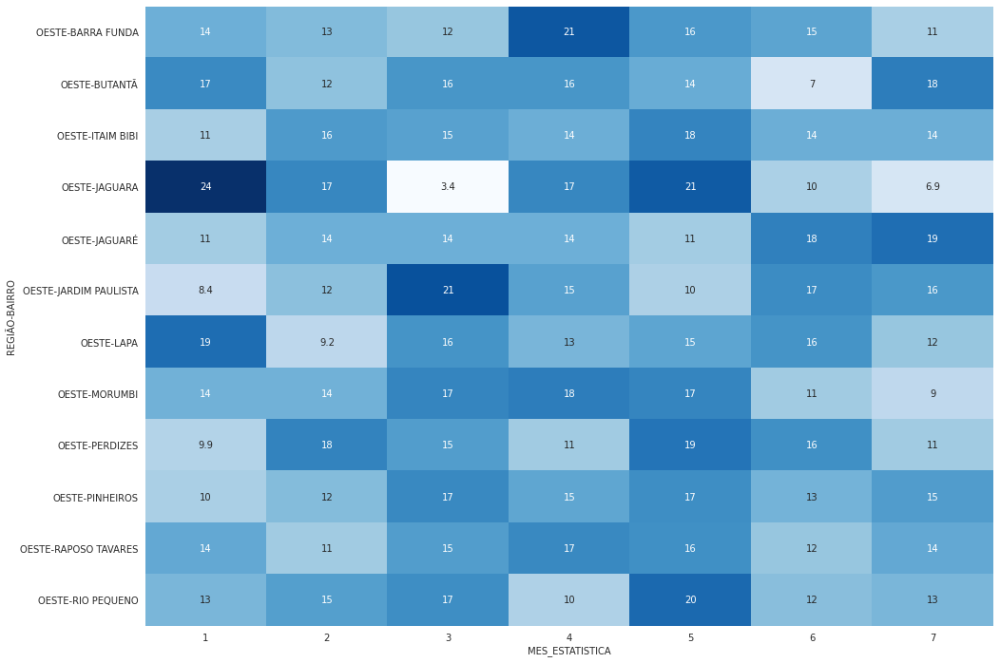

In [184]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_lesao_o.REGIÃO,database_lesao_o.BAIRRO], database_lesao_o.MES_ESTATISTICA, values=database_lesao_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de lesão corporal nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro.

#### Análise de Ocorrência LESÃO CORPORAL na região CENTRAL

In [185]:
#Separando pela região CENTRAL
database_lesao_c = database_lesao[database_lesao['REGIÃO']== 'CENTRO'].reset_index()

In [186]:
database_lesao_c

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,4,1235,12/27/2022,3:00:00 PM,SÉ,"-23,54879239","-46,63439988",LESÃO CORPORAL,1,2023,27241.0,CENTRO
1,5,1248,1/1/2023,8:20:00 AM,SÉ,"-23,55200559","-46,63442933",LESÃO CORPORAL,1,2023,27241.0,CENTRO
2,6,1250,1/3/2023,3:00:00 PM,SÉ,"-23,5512014","-46,63404686",LESÃO CORPORAL,1,2023,27241.0,CENTRO
3,7,1251,1/9/2023,7:40:28 AM,SÉ,"-23,5512014","-46,63404686",LESÃO CORPORAL,1,2023,27241.0,CENTRO
4,8,1252,1/9/2023,2:00:00 PM,SÉ,"-23,54879239","-46,63439988",LESÃO CORPORAL,1,2023,27241.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...,...
1126,15122,252747,7/25/2023,9:57:00 AM,BELA VISTA,"-23,5587291","-46,6599622",LESÃO CORPORAL,7,2023,73508.0,CENTRO
1127,15125,252750,7/29/2023,12:57:00 PM,BELA VISTA,"-23,5657393","-46,6512379",LESÃO CORPORAL,7,2023,73508.0,CENTRO
1128,15171,253937,7/20/2023,2:00:34 PM,LIBERDADE,0,0,LESÃO CORPORAL,7,2023,73170.0,CENTRO
1129,15407,260218,7/10/2023,10:00:00 AM,SANTA CECÍLIA,0,0,LESÃO CORPORAL,7,2023,88795.0,CENTRO


In [187]:
x = database_lesao_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_lesao_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_lesao_c.shape[0])

REGIÃO  BAIRRO       
CENTRO  BELA VISTA       216
        REPÚBLICA        215
        SANTA CECÍLIA    134
        SÉ               130
        CONSOLAÇÃO       126
        BOM RETIRO       112
        LIBERDADE        110
        CAMBUCI           88
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
CENTRO  BELA VISTA       0.190981
        REPÚBLICA        0.190097
        SANTA CECÍLIA    0.118479
        SÉ               0.114943
        CONSOLAÇÃO       0.111406
        BOM RETIRO       0.099027
        LIBERDADE        0.097259
        CAMBUCI          0.077807
Name: BAIRRO, dtype: float64


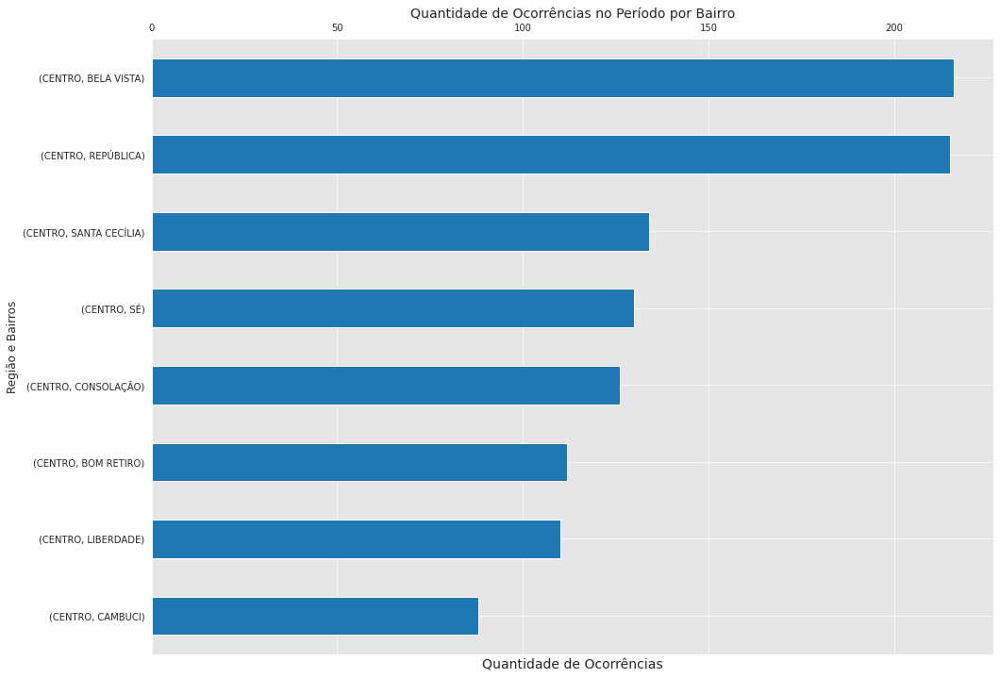

In [188]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 12))
ax = (database_lesao_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que o bairro com o maior número de ocorrências de lesão corporal é REPÚBLICA e BELA VISTA. OS dois primeiros somados, correspondem a mais de 40% de todos os as ocorrências da região no período.

In [189]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
lesao_cross_c = (pd.crosstab([database_lesao_c.REGIÃO,database_lesao_c.BAIRRO], database_lesao_c.MES_ESTATISTICA, values=database_lesao_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
lesao_cross_c.reset_index(inplace=True)
lesao_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,CENTRO,BELA VISTA,16.774194,24.358974,17.021277,15.923567,14.965986,13.836478,30.177515,19.098143
1,CENTRO,BOM RETIRO,7.096774,7.692308,11.170213,11.464968,14.285714,10.062893,7.692308,9.902741
2,CENTRO,CAMBUCI,8.387097,5.128205,7.446809,5.095541,10.884354,8.805031,8.875740,7.780725
3,CENTRO,CONSOLAÇÃO,12.258065,7.051282,11.702128,12.738854,12.925170,10.691824,10.650888,11.140584
4,CENTRO,LIBERDADE,5.806452,7.051282,9.574468,11.464968,12.244898,10.062893,11.834320,9.725906
5,CENTRO,REPÚBLICA,23.870968,20.512821,22.872340,18.471338,14.285714,20.125786,12.426036,19.009726
6,CENTRO,SANTA CECÍLIA,10.322581,16.666667,9.574468,8.917197,10.884354,19.496855,7.692308,11.847922
7,CENTRO,SÉ,15.483871,11.538462,10.638298,15.923567,9.523810,6.918239,10.650888,11.494253


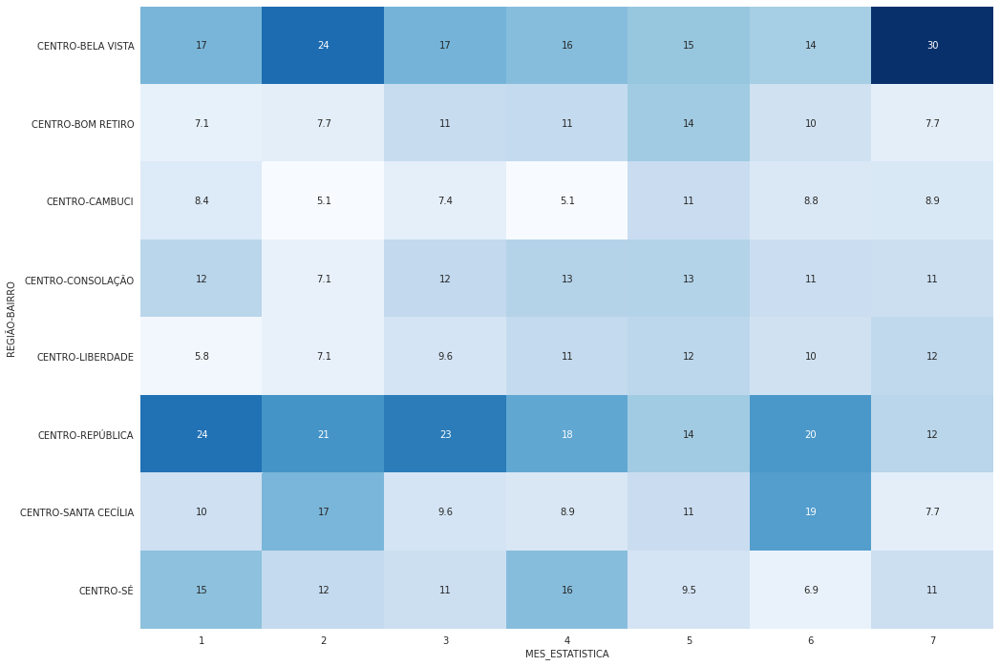

In [190]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_lesao_c.REGIÃO,database_lesao_c.BAIRRO], database_lesao_c.MES_ESTATISTICA, values=database_lesao_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro da REPÚBLICA e BELA VISTA são os que mais contribuiram no percentual em todos os meses do período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros CAMBUCI  e BOM RETIRO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [191]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_lesao_c.REGIÃO,database_lesao_c.BAIRRO], database_lesao_c.MES_ESTATISTICA, values=database_lesao_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA               1          2          3          4          5  \
REGIÃO BAIRRO                                                                 
CENTRO BELA VISTA     12.037037  17.592593  14.814815  11.574074  10.185185   
       BOM RETIRO      9.821429  10.714286  18.750000  16.071429  18.750000   
       CAMBUCI        14.772727   9.090909  15.909091   9.090909  18.181818   
       CONSOLAÇÃO     15.079365   8.730159  17.460317  15.873016  15.079365   
       LIBERDADE       8.181818  10.000000  16.363636  16.363636  16.363636   
       REPÚBLICA      17.209302  14.883721  20.000000  13.488372   9.767442   
       SANTA CECÍLIA  11.940299  19.402985  13.432836  10.447761  11.940299   
       SÉ             18.461538  13.846154  15.384615  19.230769  10.769231   

MES_ESTATISTICA               6          7  
REGIÃO BAIRRO                               
CENTRO BELA VISTA     10.185185  23.611111  
       BOM RETIRO     14.285714  11.607143  
       CAMBUCI        15.909091  17.045455  
       CONSOLAÇÃO     13.492063  14.285714  
       LIBERDADE      14.545455  18.181818  
       REPÚBLICA      14.883721   9.767442  
       SANTA CECÍLIA  23.134328   9.701493  
       SÉ              8.461538  13.846154

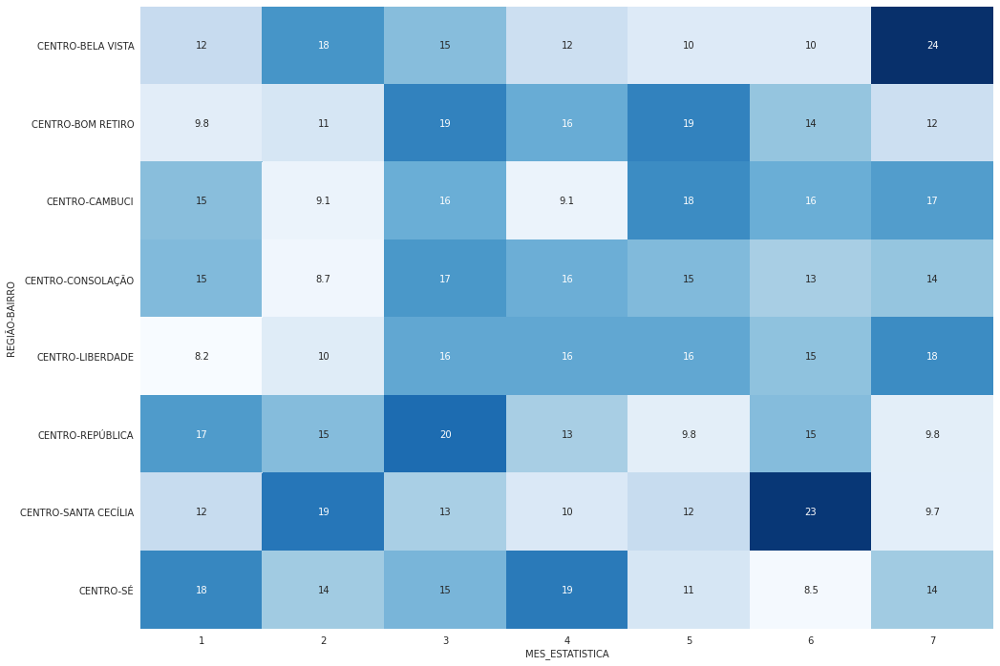

In [192]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_lesao_c.REGIÃO,database_lesao_c.BAIRRO], database_lesao_c.MES_ESTATISTICA, values=database_lesao_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de lesão corporal nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- em abril e maio há um equilíbrio dos percentuais 
- os bairros SANTA CECÍLIA e BELA VISTA são os que apresentam os maiores valores percentuais

### Analisando Ocorrências: ACIDENTE DE TRÂNSITO

Com o intuito de realizar uma análise mais detalhada, o conjunto de dados será separado por tipo de ocorrência, onde agora será analisado a ocorrência ACIDENTE DE TRÂNSITO.

In [193]:
#Separando por tipo de ocorrência
database_ac_tr = database.loc[database['NATUREZA_APURADA']== 'ACIDENTE DE TRÂNSITO'].reset_index()
database_ac_tr

,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,1,1/1/2023,1:20:00,RAPOSO TAVARES,"-23,58404575","-46,78334339",ACIDENTE DE TRÂNSITO,1,2023,109052.0,OESTE
1,2,1/1/2023,3:05:00,CIDADE LÍDER,"-23,58206873","-46,49064622",ACIDENTE DE TRÂNSITO,1,2023,137277.0,LESTE
2,3,1/1/2023,5:44:00,VILA JACUÍ,"-23,50658","-46,4561998",ACIDENTE DE TRÂNSITO,1,2023,147166.0,LESTE
3,4,1/1/2023,7:00:29,ANHANGUERA,"-23,44048142","-46,79551178",ACIDENTE DE TRÂNSITO,1,2023,88677.0,NORTE
4,5,1/1/2023,10:00:00,LAJEADO,"-23,53027508","-46,41549436",ACIDENTE DE TRÂNSITO,1,2023,177828.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...
6149,284819,7/29/2023,3:32:00 AM,SACOMÃ,"-23,60745319","-46,59564297",ACIDENTE DE TRÂNSITO,7,2023,266814.0,SUL
6150,284820,7/30/2023,2:40:00 AM,CACHOEIRINHA,"-23,4624974","-46,6609035",ACIDENTE DE TRÂNSITO,7,2023,147821.0,NORTE
6151,284821,7/30/2023,4:30:00 AM,MOEMA,"-23,59924922","-46,65091036",ACIDENTE DE TRÂNSITO,7,2023,89785.0,SUL
6152,284823,7/31/2023,12:10:00 PM,MANDAQUI,"-23,47980042","-46,65004107",ACIDENTE DE TRÂNSITO,7,2023,109384.0,NORTE


In [194]:
#Agrupando e contando as ocorrências em cada mês
database.loc[database['NATUREZA_APURADA']== 'ACIDENTE DE TRÂNSITO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()

MES_ESTATISTICA
1    810
2    773
3    985
4    850
5    904
6    920
7    912
Name: ANO_ESTATISTICA, dtype: int64

In [195]:
#Percentual de ocorrências por mês
database.loc[database['NATUREZA_APURADA']== 'ACIDENTE DE TRÂNSITO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()/database_ac_tr.shape[0]

MES_ESTATISTICA
1    0.131622
2    0.125609
3    0.160058
4    0.138122
5    0.146896
6    0.149496
7    0.148196
Name: ANO_ESTATISTICA, dtype: float64

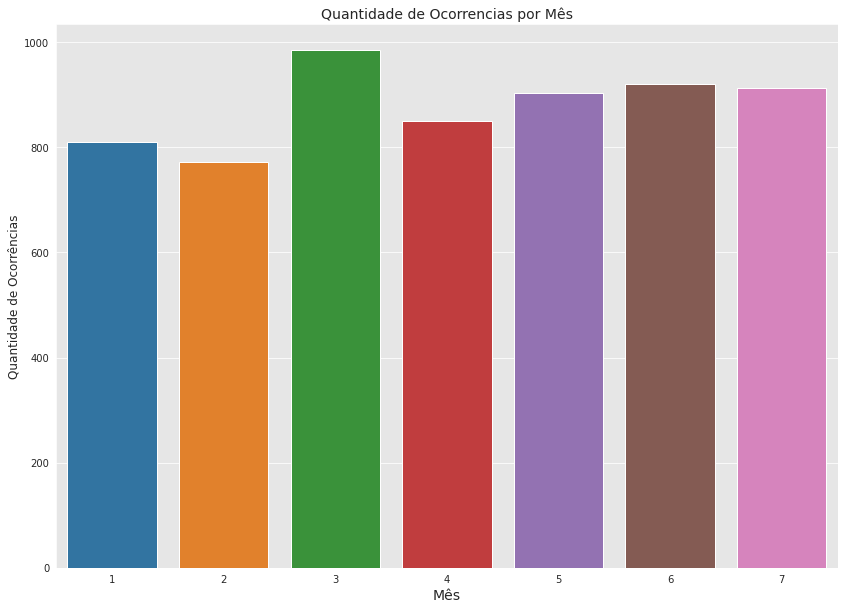

In [196]:
#Plotando o gráfico
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_ac_tr,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrencias por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de acidente de trânsito totais distribuídas pelos meses em questão. Os meses de JANEIRO e FEVEREIRO aparecem com valores bem próximos. Nota-se que o mês de  MARÇO se sobressai aos demais meses com cerca de 30% em relação a FEVEREIRO. O mês de maio,junho e julho aparecem em segundo lugar com cerca de 13% do total de ocorências.

In [197]:
#Ocorrencias por região
database_ac_tr.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)

REGIÃO
LESTE     1835
SUL       1761
NORTE     1287
OESTE      933
CENTRO     338
Name: NATUREZA_APURADA, dtype: int64

In [198]:
#Percental de ocorrências por bairro e região
database_ac_tr.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)/database_ac_tr.shape[0]

REGIÃO
LESTE     0.298180
SUL       0.286155
NORTE     0.209132
OESTE     0.151609
CENTRO    0.054924
Name: NATUREZA_APURADA, dtype: float64

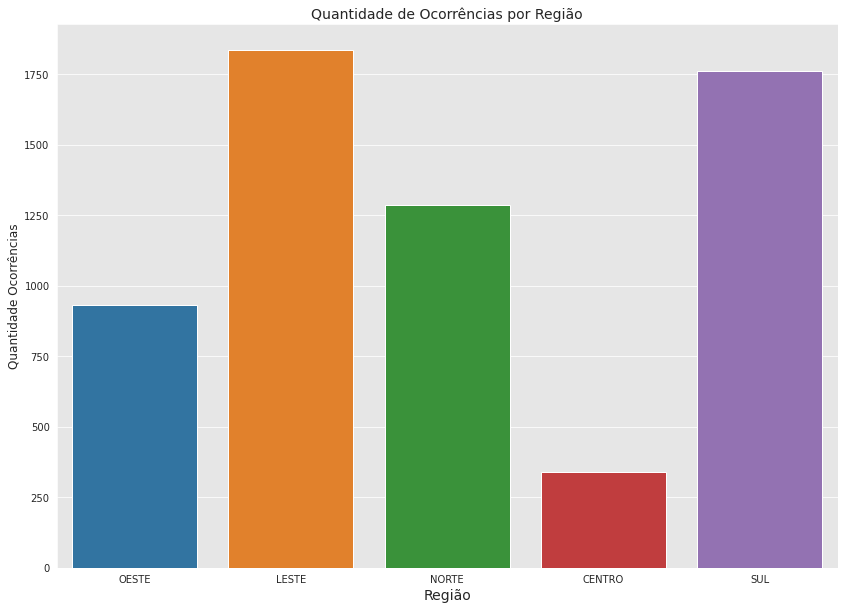

In [199]:
#Gráfico de ocorrências por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_ac_tr,x='REGIÃO')
ax.set_ylabel('Quantidade Ocorrências', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Região', fontsize=14)
plt.show()

Acima o gráfico plotado demostra as regiões LESTE e SUL se destacam e muito das demais, onde demostra que cerca de 29% (LESTE) e 28%(SUL) dos casos. Somados os percentais das regiões LESTE e SUL tem-se que essas duas regiões respondem por quase 58% do total de ocorrências de acidente de trânsito, percentual possivelmente atrelado ao número de habitantes em cada região.

In [200]:
#Ocorrencias por região
database_ac_tr['BAIRRO'].value_counts()

JARDIM ÂNGELA     220
PINHEIROS         193
CAMPO LIMPO       183
CAPÃO REDONDO     150
VILA MARIANA      145
                 ... 
IGUATEMI           24
JAGUARA            22
SANTA CECÍLIA      22
MARSILAC            4
JOSÉ BONIFÁCIO      3
Name: BAIRRO, Length: 82, dtype: int64

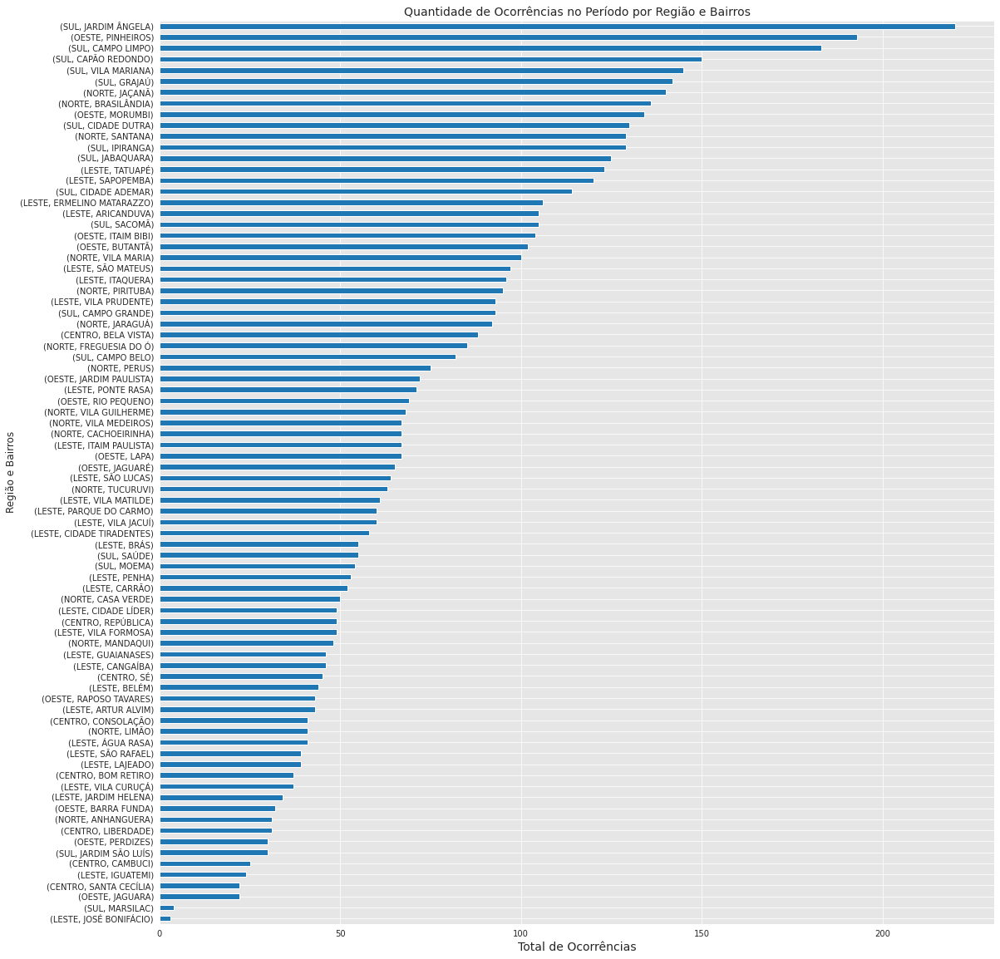

In [201]:
#Plotando o gráfico Quantidade de ocorrências no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(18, 20))
ax = (database_ac_tr.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Total de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Região e Bairros', fontsize=14)
ag.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado da quantidade de lesões corporais por região e bairro no período. Apenas o JARDIM ÂNGELA se encoltra acima das 200 ocorrências de acidente de trânsito no período Nota-se que dos 10 bairros 6 são das regiões sul.

In [202]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_ac_tr.BAIRRO,database_ac_tr.REGIÃO], database_ac_tr.MES_ESTATISTICA, values=database_ac_tr.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7,Total
BAIRRO,REGIÃO,,,,,,,,
ANHANGUERA,NORTE,0.617284,0.388098,0.304569,0.588235,0.442478,0.760870,0.438596,0.503737
ARICANDUVA,LESTE,2.098765,2.069858,1.725888,1.411765,1.216814,2.173913,1.315789,1.706207
ARTUR ALVIM,LESTE,0.740741,0.258732,0.609137,1.176471,0.774336,0.652174,0.657895,0.698733
BARRA FUNDA,OESTE,0.370370,0.905563,0.609137,0.705882,0.221239,0.652174,0.219298,0.519987
BELA VISTA,CENTRO,1.481481,1.034929,1.624365,2.000000,1.438053,1.413043,0.986842,1.429964
...,...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,2.222222,1.811125,2.944162,2.117647,2.654867,2.608696,1.973684,2.356191
VILA MATILDE,LESTE,0.864198,1.293661,1.421320,0.705882,0.331858,1.413043,0.877193,0.991225
VILA MEDEIROS,NORTE,0.864198,1.293661,1.725888,1.529412,0.884956,0.434783,0.877193,1.088723


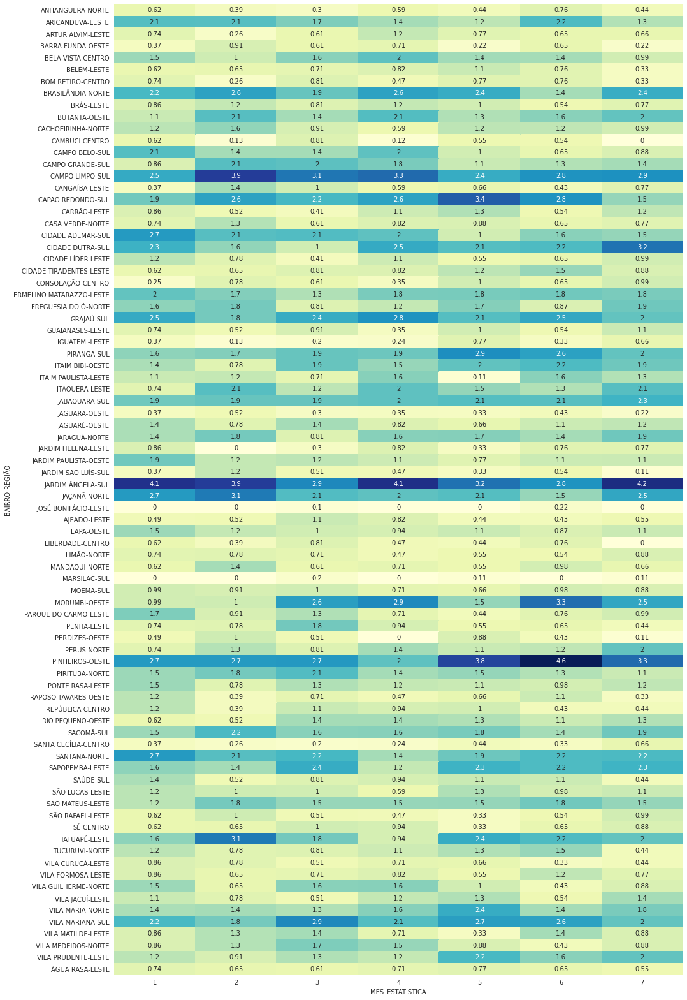

In [203]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(16,28))
sns.heatmap((pd.crosstab([database_ac_tr.BAIRRO,database_ac_tr.REGIÃO], database_ac_tr.MES_ESTATISTICA, values=database_ac_tr.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de acidente de trânsito nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de acidentes de trânsito registrados em cada mês. Algumas pontos importantes que valem ressaltar:

         
|    JANEIRO      |   FEVEREIRO     |       MARÇO       |       ABRIL      |      MAIO        |       JUNHO       |      JULHO     |
|:---------------:|:---------------:|:-----------------:|:----------------:|:----------------:|:-----------------:|:---------------:|
|JD. ÂNGELA **4.2%** |JD. ÂNGELA **3.9%** |CAMPO LIMPO **3.1%** |JD. ÂNGELA **4.1%** |PINHEIROS  **3.8%** |PINHEIROS **4.6%** |JD. ÂNGELA  **4.2%**|
|JAÇANÃ **2.8%** |JAÇANÃ **3.1%** |JD. ÂNGELA **2.9%** |CAMPO LIMPO  **3.3%** |CAPÃO RED. **3.4%** |MOEMA  **3.3%** |PINHEIROS **3.3%**|
|PINHEIROS  **2.7%** |TATUAPÉ  **3.1%** |V. MARIANA **2.9%** |MORUMBI  **2.9%** |JD. ÂNGELA  **3.2%** |JD. ÂNGELA **2.8%** |CIDADE ADEMAR **3.2%**|


Nota-se que o bairro JARDIM ÂNGELA aparece  em todos os meses e o bairro PINHEIROS aparece em 4 dos 7 meses do período. Interessante notar que os meses de janeiro, abril, junho e julho o bairros que ocupam o primeiro lugar em cada mês apresenta um percentual bem mais eleado que os demais. Praticamente todos os demais bairros apresentaram percentuais oscilando entre 1% e 2.5% durante todo o período. Outro fato importante é que ba parte dos bairros destacados na tabela pertencem às regiões OESTE e SUL.

In [204]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_ac_tr.BAIRRO,database_ac_tr.REGIÃO], database_ac_tr.MES_ESTATISTICA, values=database_ac_tr.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7
BAIRRO,REGIÃO,,,,,,,
ANHANGUERA,NORTE,16.129032,9.677419,9.677419,16.129032,12.903226,22.580645,12.903226
ARICANDUVA,LESTE,16.190476,15.238095,16.190476,11.428571,10.476190,19.047619,11.428571
ARTUR ALVIM,LESTE,13.953488,4.651163,13.953488,23.255814,16.279070,13.953488,13.953488
BARRA FUNDA,OESTE,9.375000,21.875000,18.750000,18.750000,6.250000,18.750000,6.250000
BELA VISTA,CENTRO,13.636364,9.090909,18.181818,19.318182,14.772727,14.772727,10.227273
...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,12.413793,9.655172,20.000000,12.413793,16.551724,16.551724,12.413793
VILA MATILDE,LESTE,11.475410,16.393443,22.950820,9.836066,4.918033,21.311475,13.114754
VILA MEDEIROS,NORTE,10.447761,14.925373,25.373134,19.402985,11.940299,5.970149,11.940299


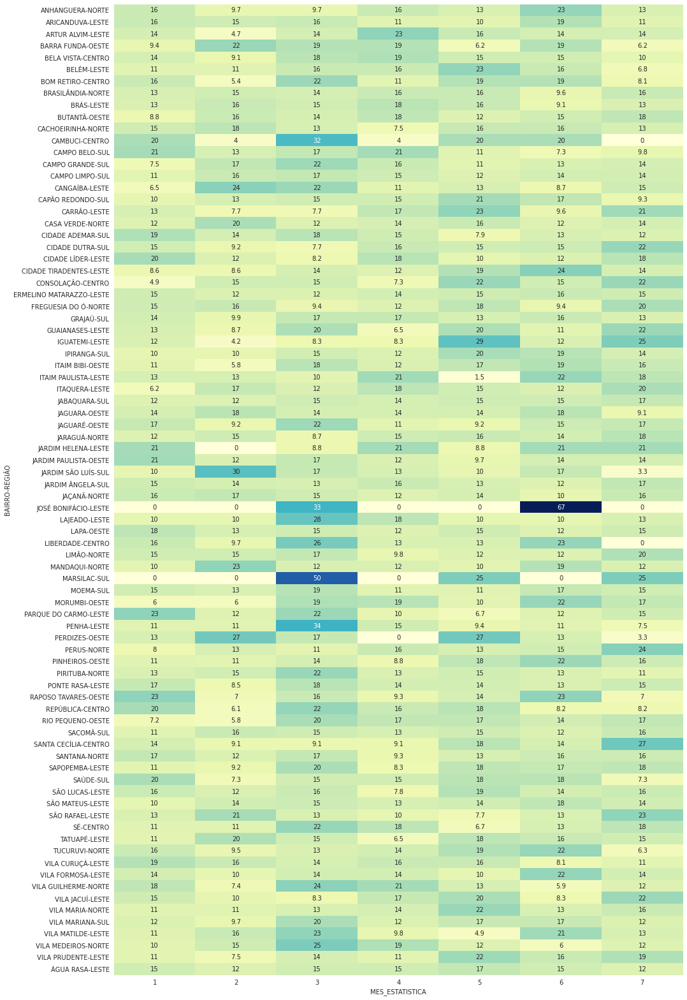

In [205]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(16,28))
sns.heatmap((pd.crosstab([database_ac_tr.BAIRRO,database_ac_tr.REGIÃO], database_ac_tr.MES_ESTATISTICA, values=database_ac_tr.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A mesma análise acima foi feita, porém agora analisando cada bairro ao longo do período (JANEIRO a JULHO), ou seja, em um determinado bairro, de todas as ocorrências de acidente de trânsito, quais os percentuais em cada mês em relação ao total. Alguns pontos importantes a serem ressaltados:

 - em praticamente todo o período percebe-se um eqilíbrio ao longo dos meses entre os percentuais dos bairros, exceto MARSILAC (ambos SUL) e JOSÉ BONIFÁCIO (LESTE) que apresentam os mínimos e máximos. 
 - o mês de março apresenta a maior quantidade de bairros com aumento percentual

#### Análise de Ocorrência ACIDENTE DE TRÂNSITO na região NORTE

In [206]:
#Separando pela região NORTE
database_ac_tr_n = database_ac_tr[database_ac_tr['REGIÃO']== 'NORTE'].reset_index()

In [207]:
database_ac_tr_n

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,3,4,1/1/2023,7:00:29,ANHANGUERA,"-23,44048142","-46,79551178",ACIDENTE DE TRÂNSITO,1,2023,88677.0,NORTE
1,6,7,1/2/2023,16:30:00,JAÇANÃ,"-23,4719532","-46,5642811",ACIDENTE DE TRÂNSITO,1,2023,96412.0,NORTE
2,8,10,1/7/2023,4:12:00,BRASILÂNDIA,"-23,52742902","-46,74007052",ACIDENTE DE TRÂNSITO,1,2023,287033.0,NORTE
3,17,21,1/15/2023,1:42:00,CACHOEIRINHA,"-23,47055736","-46,66560794",ACIDENTE DE TRÂNSITO,1,2023,147821.0,NORTE
4,18,22,1/15/2023,21:30:00,ANHANGUERA,"-23,44048142","-46,79551178",ACIDENTE DE TRÂNSITO,1,2023,88677.0,NORTE
...,...,...,...,...,...,...,...,...,...,...,...,...
1282,6145,284814,7/27/2023,1:10:00 PM,SANTANA,"-23,48576663","-46,63843407",ACIDENTE DE TRÂNSITO,7,2023,111492.0,NORTE
1283,6147,284816,7/28/2023,4:20:00 AM,ANHANGUERA,"-23,44480245","-46,77837964",ACIDENTE DE TRÂNSITO,7,2023,88677.0,NORTE
1284,6148,284817,7/28/2023,12:45:00 PM,JAÇANÃ,"-23,4719532","-46,5642811",ACIDENTE DE TRÂNSITO,7,2023,96412.0,NORTE
1285,6150,284820,7/30/2023,2:40:00 AM,CACHOEIRINHA,"-23,4624974","-46,6609035",ACIDENTE DE TRÂNSITO,7,2023,147821.0,NORTE


In [208]:
x = database_ac_tr_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_ac_tr_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_ac_tr_n.shape[0])

REGIÃO  BAIRRO        
NORTE   JAÇANÃ            140
        BRASILÂNDIA       136
        SANTANA           129
        VILA MARIA        100
        PIRITUBA           95
        JARAGUÁ            92
        FREGUESIA DO Ó     85
        PERUS              75
        VILA GUILHERME     68
        CACHOEIRINHA       67
        VILA MEDEIROS      67
        TUCURUVI           63
        CASA VERDE         50
        MANDAQUI           48
        LIMÃO              41
        ANHANGUERA         31
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        
NORTE   JAÇANÃ            0.108780
        BRASILÂNDIA       0.105672
        SANTANA           0.100233
        VILA MARIA        0.077700
        PIRITUBA          0.073815
        JARAGUÁ           0.071484
        FREGUESIA DO Ó    0.066045
        PERUS             0.058275
        VILA GUILHERME    0.052836
        CACHOEIRINHA      0.052059
        VILA MEDEIROS     0.052059
        TUCURUVI          0.048951
        CASA VERDE        0

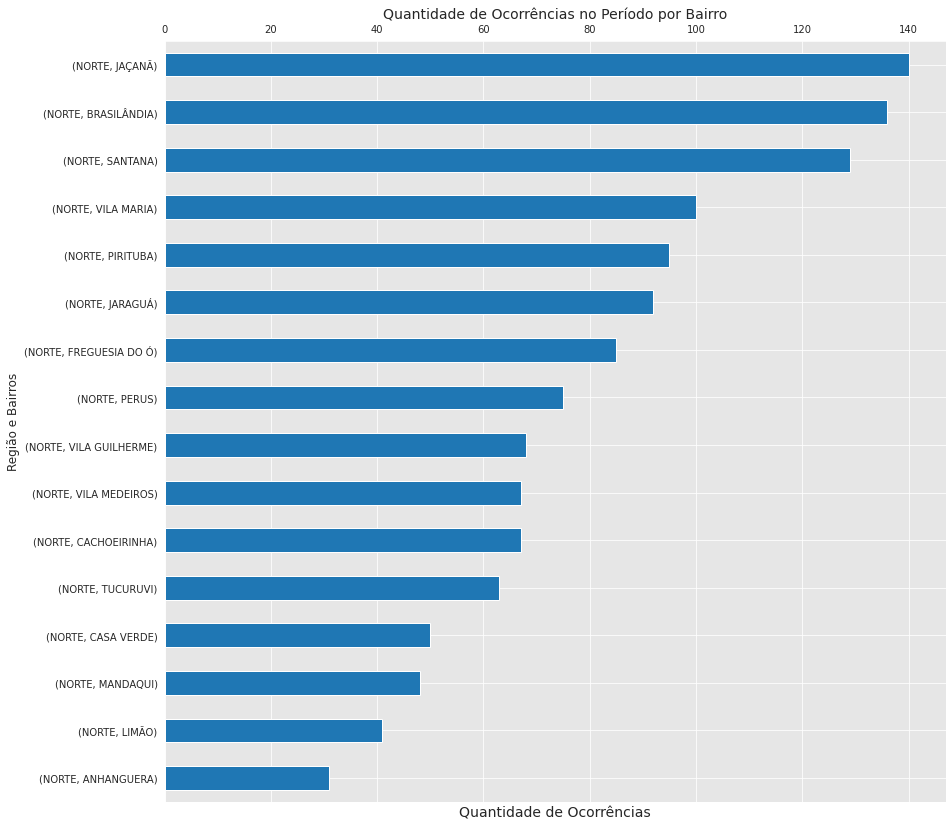

In [209]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_ac_tr_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região NORTE em todo o período. Nota-se que os bairros com os maiores números de ocorrências de acidente de trânsito são JAÇANÃ, BRASILÂNDIA e SANTANA que juntos, somam mais de 30% do total de ocorrências.

In [210]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
transito_cross_n = (pd.crosstab([database_ac_tr_n.REGIÃO,database_ac_tr_n.BAIRRO], database_ac_tr_n.MES_ESTATISTICA, values=database_ac_tr_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
transito_cross_n.reset_index(inplace=True)
transito_cross_n

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,NORTE,ANHANGUERA,2.840909,1.612903,1.562500,2.840909,2.040816,4.268293,2.030457,2.408702
1,NORTE,BRASILÂNDIA,10.227273,10.752688,9.895833,12.500000,11.224490,7.926829,11.167513,10.567211
2,NORTE,CACHOEIRINHA,5.681818,6.451613,4.687500,2.840909,5.612245,6.707317,4.568528,5.205905
3,NORTE,CASA VERDE,3.409091,5.376344,3.125000,3.977273,4.081633,3.658537,3.553299,3.885004
4,NORTE,FREGUESIA DO Ó,7.386364,7.526882,4.166667,5.681818,7.653061,4.878049,8.629442,6.604507
5,NORTE,JARAGUÁ,6.250000,7.526882,4.166667,7.954545,7.653061,7.926829,8.629442,7.148407
6,NORTE,JAÇANÃ,12.500000,12.903226,10.937500,9.659091,9.693878,8.536585,11.675127,10.878011
7,NORTE,LIMÃO,3.409091,3.225806,3.645833,2.272727,2.551020,3.048780,4.060914,3.185703
8,NORTE,MANDAQUI,2.840909,5.913978,3.125000,3.409091,2.551020,5.487805,3.045685,3.729604
9,NORTE,PERUS,3.409091,5.376344,4.166667,6.818182,5.102041,6.707317,9.137056,5.827506


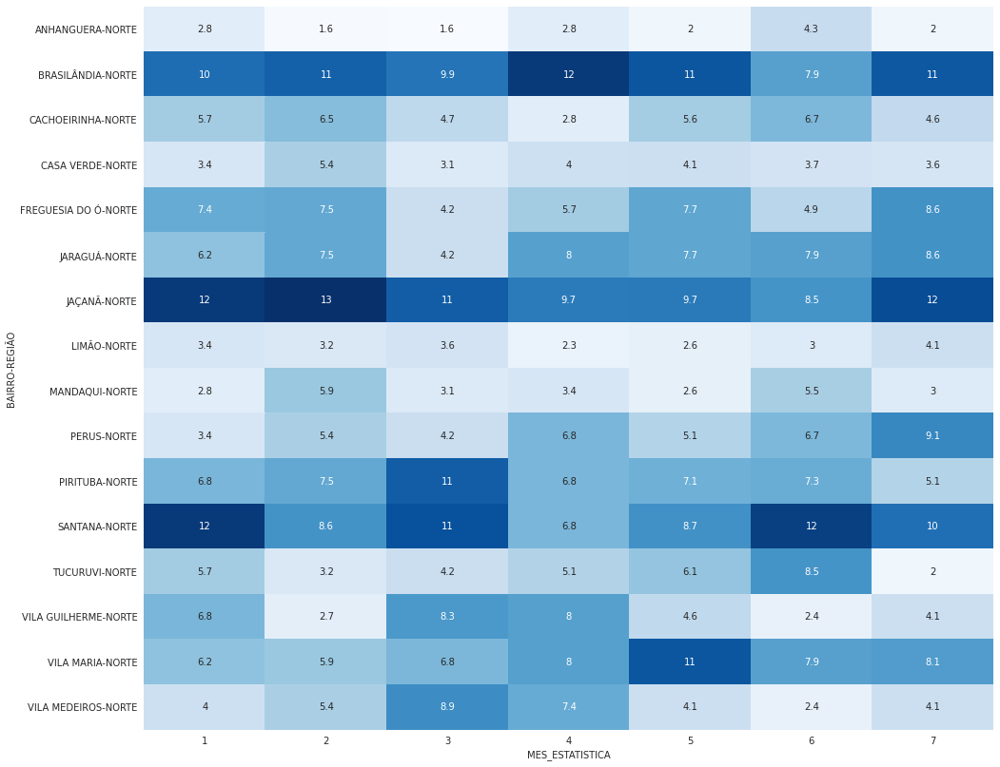

In [211]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_ac_tr_n.BAIRRO,database_ac_tr_n.REGIÃO], database_ac_tr_n.MES_ESTATISTICA, values=database_ac_tr_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro de JACANÃ e BRASILÂNDIA são os bairros que mais contribuiram no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já o menor percentual é o bairro ANHANGUERA

In [212]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_ac_tr_n.REGIÃO,database_ac_tr_n.BAIRRO], database_ac_tr_n.MES_ESTATISTICA, values=database_ac_tr_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                1          2          3          4          5  \
REGIÃO BAIRRO                                                                  
NORTE  ANHANGUERA      16.129032   9.677419   9.677419  16.129032  12.903226   
       BRASILÂNDIA     13.235294  14.705882  13.970588  16.176471  16.176471   
       CACHOEIRINHA    14.925373  17.910448  13.432836   7.462687  16.417910   
       CASA VERDE      12.000000  20.000000  12.000000  14.000000  16.000000   
       FREGUESIA DO Ó  15.294118  16.470588   9.411765  11.764706  17.647059   
       JARAGUÁ         11.956522  15.217391   8.695652  15.217391  16.304348   
       JAÇANÃ          15.714286  17.142857  15.000000  12.142857  13.571429   
       LIMÃO           14.634146  14.634146  17.073171   9.756098  12.195122   
       MANDAQUI        10.416667  22.916667  12.500000  12.500000  10.416667   
       PERUS            8.000000  13.333333  10.666667  16.000000  13.333333   
       PIRITUBA        12.631579  14.736842  22.105263  12.631579  14.736842   
       SANTANA         17.054264  12.403101  17.054264   9.302326  13.178295   
       TUCURUVI        15.873016   9.523810  12.698413  14.285714  19.047619   
       VILA GUILHERME  17.647059   7.352941  23.529412  20.588235  13.235294   
       VILA MARIA      11.000000  11.000000  13.000000  14.000000  22.000000   
       VILA MEDEIROS   10.447761  14.925373  25.373134  19.402985  11.940299   

MES_ESTATISTICA                6          7  
REGIÃO BAIRRO                                
NORTE  ANHANGUERA      22.580645  12.903226  
       BRASILÂNDIA      9.558824  16.176471  
       CACHOEIRINHA    16.417910  13.432836  
       CASA VERDE      12.000000  14.000000  
       FREGUESIA DO Ó   9.411765  20.000000  
       JARAGUÁ         14.130435  18.478261  
       JAÇANÃ          10.000000  16.428571  
       LIMÃO           12.195122  19.512195  
       MANDAQUI        18.750000  12.500000  
       PERUS           14.666667  24.000000  
       PIRITUBA        12.631579  10.526316  
       SANTANA         15.503876  15.503876  
       TUCURUVI        22.222222   6.349206  
       VILA GUILHERME   5.882353  11.764706  
       VILA MARIA      13.000000  16.000000  
       VILA MEDEIROS    5.970149  11.940299

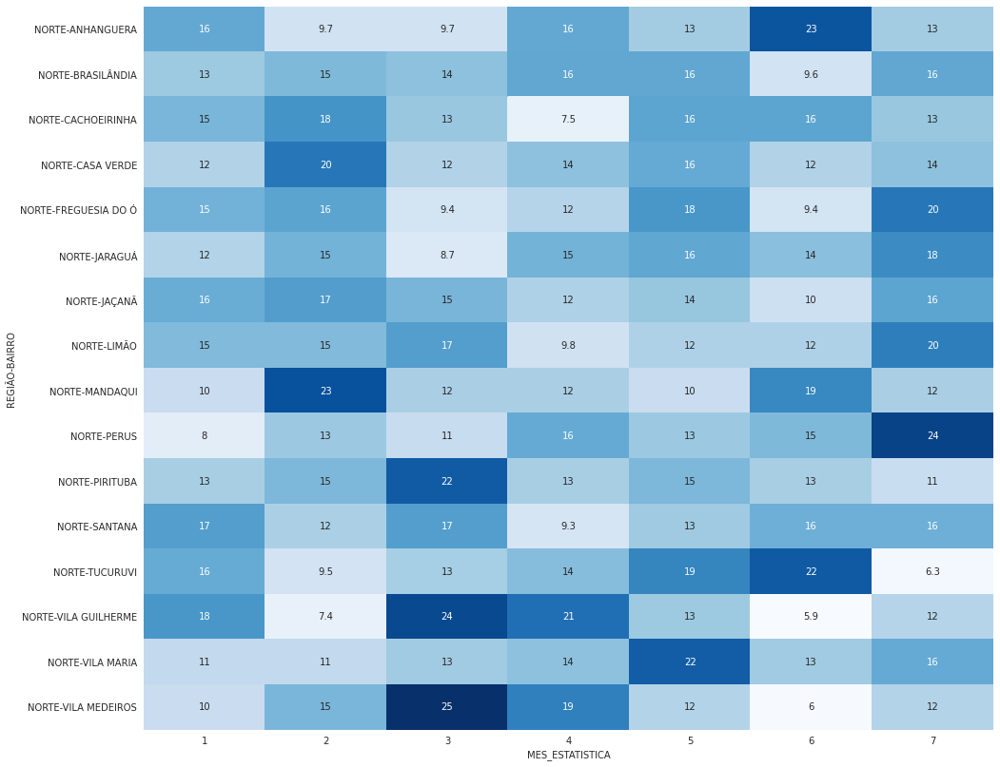

In [213]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_ac_tr_n.REGIÃO,database_ac_tr_n.BAIRRO], database_ac_tr_n.MES_ESTATISTICA, values=database_ac_tr_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de acidente de trânsito nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada (exceto ANHANGUERA)
- vale ressaltar o bairro São Domingos que teve um percentual de 5,6% foi também o que apresentou o maior percentual na distribuição dos meses (28%), no mês de maio.
- em março pratiacamente todos os bairros apresentaram aumento em seus percentuais

#### Análise de Ocorrência ACIDENTE DE TRÂNSITO na região SUL

In [214]:
#Separando pela região SUL
database_ac_tr_s = database_ac_tr[database_ac_tr['REGIÃO']== 'SUL'].reset_index()

In [215]:
database_ac_tr_s

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,9,11,1/7/2023,12:55:00,CIDADE DUTRA,"-23,7129429","-46,69856",ACIDENTE DE TRÂNSITO,1,2023,205532.0,SUL
1,10,12,1/10/2023,17:25:23,SAÚDE,"-23,618162","-46,6278979",ACIDENTE DE TRÂNSITO,1,2023,133796.0,SUL
2,11,13,1/13/2023,3:55:00,SAÚDE,"-23,61407186","-46,63816919",ACIDENTE DE TRÂNSITO,1,2023,133796.0,SUL
3,22,27,1/8/2023,10:00:00,MOEMA,"-23,59863836","-46,67171017",ACIDENTE DE TRÂNSITO,1,2023,89785.0,SUL
4,31,41,1/28/2023,19:26:56,CIDADE ADEMAR,"-23,6448392","-46,6720089",ACIDENTE DE TRÂNSITO,1,2023,290143.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...,...
1756,6141,284807,7/24/2023,2:04:00 PM,IPIRANGA,"-23,60016845","-46,60107692",ACIDENTE DE TRÂNSITO,7,2023,113158.0,SUL
1757,6142,284809,7/25/2023,7:52:27 AM,CIDADE DUTRA,"-23,7081603","-46,7126959",ACIDENTE DE TRÂNSITO,7,2023,205532.0,SUL
1758,6149,284819,7/29/2023,3:32:00 AM,SACOMÃ,"-23,60745319","-46,59564297",ACIDENTE DE TRÂNSITO,7,2023,266814.0,SUL
1759,6151,284821,7/30/2023,4:30:00 AM,MOEMA,"-23,59924922","-46,65091036",ACIDENTE DE TRÂNSITO,7,2023,89785.0,SUL


In [216]:
x = database_ac_tr_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_ac_tr_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_ac_tr_s.shape[0])

REGIÃO  BAIRRO         
SUL     JARDIM ÂNGELA      220
        CAMPO LIMPO        183
        CAPÃO REDONDO      150
        VILA MARIANA       145
        GRAJAÚ             142
        CIDADE DUTRA       130
        IPIRANGA           129
        JABAQUARA          125
        CIDADE ADEMAR      114
        SACOMÃ             105
        CAMPO GRANDE        93
        CAMPO BELO          82
        SAÚDE               55
        MOEMA               54
        JARDIM SÃO LUÍS     30
        MARSILAC             4
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
SUL     JARDIM ÂNGELA      0.124929
        CAMPO LIMPO        0.103918
        CAPÃO REDONDO      0.085179
        VILA MARIANA       0.082340
        GRAJAÚ             0.080636
        CIDADE DUTRA       0.073822
        IPIRANGA           0.073254
        JABAQUARA          0.070982
        CIDADE ADEMAR      0.064736
        SACOMÃ             0.059625
        CAMPO GRANDE       0.052811
        CAMPO BELO         0.0465

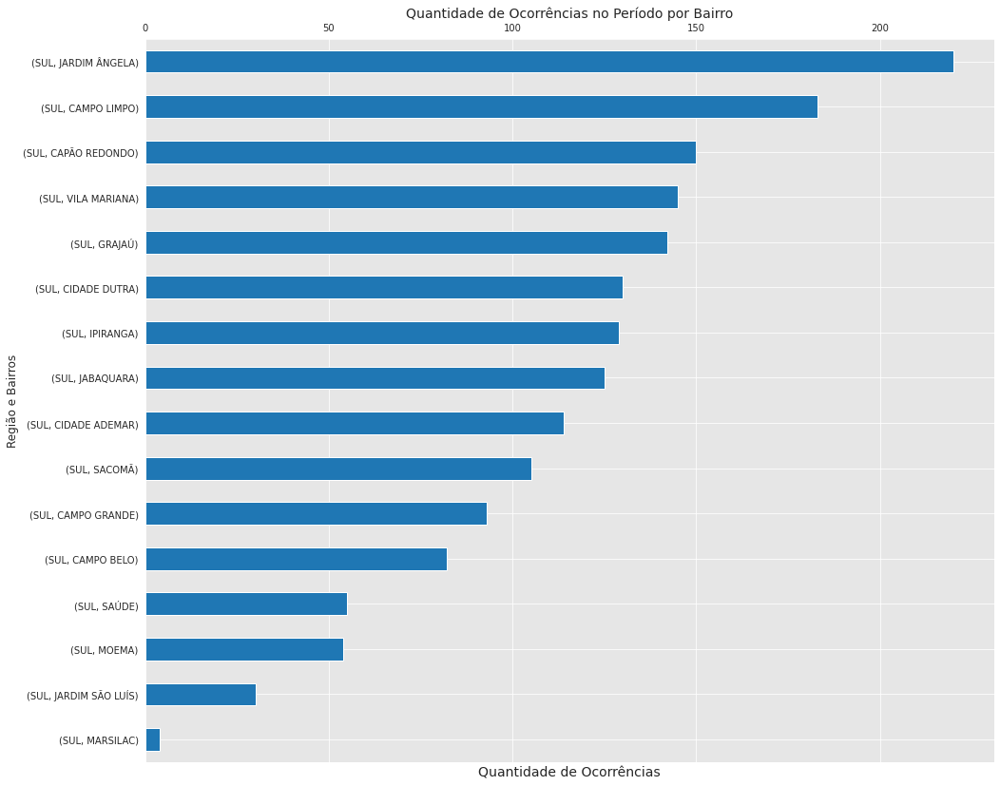

In [217]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_ac_tr_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico das ocorrências de acidente de trânsito somente na região SUL em todo o período. Nota-se que os bairros com o maior número de ocorrências são JARDIM ÂNGELA e CAMPO LIMPO com um percentual muito acima dos demais bairros.

In [218]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
transito_cross_s = (pd.crosstab([database_ac_tr_s.REGIÃO,database_ac_tr_s.BAIRRO], database_ac_tr_s.MES_ESTATISTICA, values=database_ac_tr_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
transito_cross_s.reset_index(inplace=True)
transito_cross_s

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,SUL,CAMPO BELO,7.296137,4.824561,5.017921,6.488550,3.557312,2.325581,3.225806,4.656445
1,SUL,CAMPO GRANDE,3.004292,7.017544,7.168459,5.725191,3.952569,4.651163,5.241935,5.281090
2,SUL,CAMPO LIMPO,8.583691,13.157895,11.111111,10.687023,8.695652,10.077519,10.483871,10.391823
3,SUL,CAPÃO REDONDO,6.437768,8.771930,7.885305,8.396947,12.252964,10.077519,5.645161,8.517888
4,SUL,CIDADE ADEMAR,9.442060,7.017544,7.526882,6.488550,3.557312,5.813953,5.645161,6.473595
5,SUL,CIDADE DUTRA,8.154506,5.263158,3.584229,8.015267,7.509881,7.751938,11.693548,7.382169
6,SUL,GRAJAÚ,8.583691,6.140351,8.602151,9.160305,7.509881,8.914729,7.258065,8.063600
7,SUL,IPIRANGA,5.579399,5.701754,6.810036,6.106870,10.276680,9.302326,7.258065,7.325383
8,SUL,JABAQUARA,6.437768,6.578947,6.810036,6.488550,7.509881,7.364341,8.467742,7.098240
9,SUL,JARDIM SÃO LUÍS,1.287554,3.947368,1.792115,1.526718,1.185771,1.937984,0.403226,1.703578


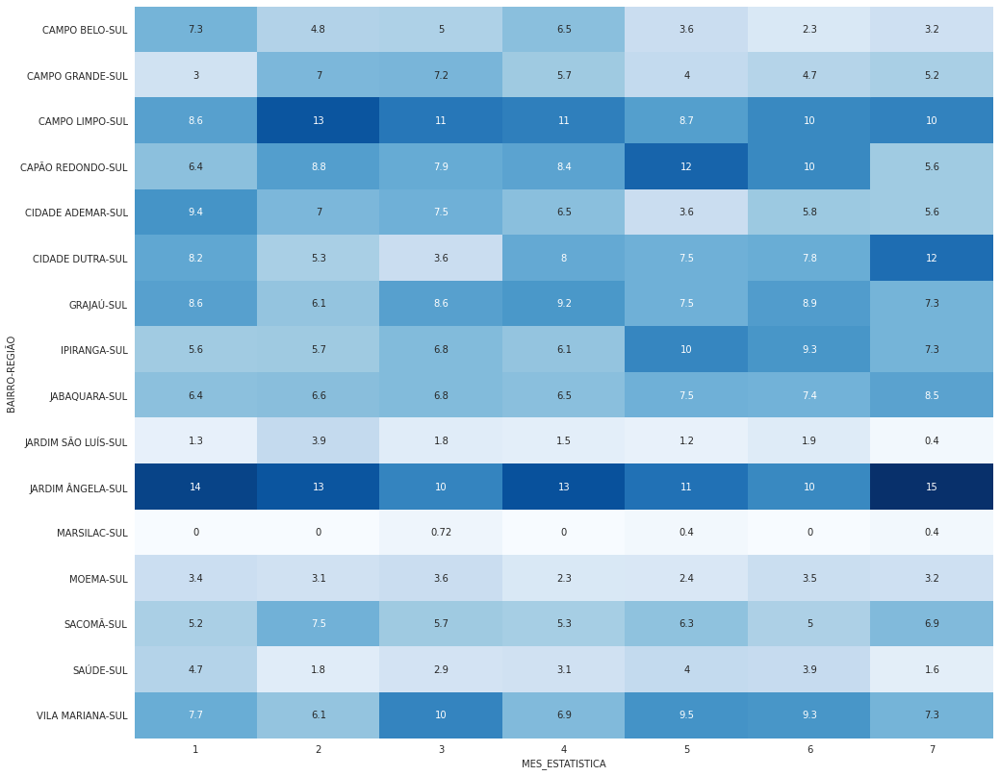

In [219]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_ac_tr_s.BAIRRO,database_ac_tr_s.REGIÃO], database_ac_tr_s.MES_ESTATISTICA, values=database_ac_tr_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - os bairros JARDIM ANGELA e CAMPO LIMPO realmente saltam aos olhos seus percentuais em relação aos demais bairros, perdurando durante todo o período;
 - já os menores percentuais são os bairros MARSILAC e SÃO LUiS
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [220]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_ac_tr_s.REGIÃO,database_ac_tr_s.BAIRRO], database_ac_tr_s.MES_ESTATISTICA, values=database_ac_tr_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
SUL    CAMPO BELO       20.731707  13.414634  17.073171  20.731707  10.975610   
       CAMPO GRANDE      7.526882  17.204301  21.505376  16.129032  10.752688   
       CAMPO LIMPO      10.928962  16.393443  16.939891  15.300546  12.021858   
       CAPÃO REDONDO    10.000000  13.333333  14.666667  14.666667  20.666667   
       CIDADE ADEMAR    19.298246  14.035088  18.421053  14.912281   7.894737   
       CIDADE DUTRA     14.615385   9.230769   7.692308  16.153846  14.615385   
       GRAJAÚ           14.084507   9.859155  16.901408  16.901408  13.380282   
       IPIRANGA         10.077519  10.077519  14.728682  12.403101  20.155039   
       JABAQUARA        12.000000  12.000000  15.200000  13.600000  15.200000   
       JARDIM SÃO LUÍS  10.000000  30.000000  16.666667  13.333333  10.000000   
       JARDIM ÂNGELA    15.000000  13.636364  13.181818  15.909091  13.181818   
       MARSILAC          0.000000   0.000000  50.000000   0.000000  25.000000   
       MOEMA            14.814815  12.962963  18.518519  11.111111  11.111111   
       SACOMÃ           11.428571  16.190476  15.238095  13.333333  15.238095   
       SAÚDE            20.000000   7.272727  14.545455  14.545455  18.181818   
       VILA MARIANA     12.413793   9.655172  20.000000  12.413793  16.551724   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
SUL    CAMPO BELO        7.317073   9.756098  
       CAMPO GRANDE     12.903226  13.978495  
       CAMPO LIMPO      14.207650  14.207650  
       CAPÃO REDONDO    17.333333   9.333333  
       CIDADE ADEMAR    13.157895  12.280702  
       CIDADE DUTRA     15.384615  22.307692  
       GRAJAÚ           16.197183  12.676056  
       IPIRANGA         18.604651  13.953488  
       JABAQUARA        15.200000  16.800000  
       JARDIM SÃO LUÍS  16.666667   3.333333  
       JARDIM ÂNGELA    11.818182  17.272727  
       MARSILAC          0.000000  25.000000  
       MOEMA            16.666667  14.814815  
       SACOMÃ           12.380952  16.190476  
       SAÚDE            18.181818   7.272727  
       VILA MARIANA     16.551724  12.413793

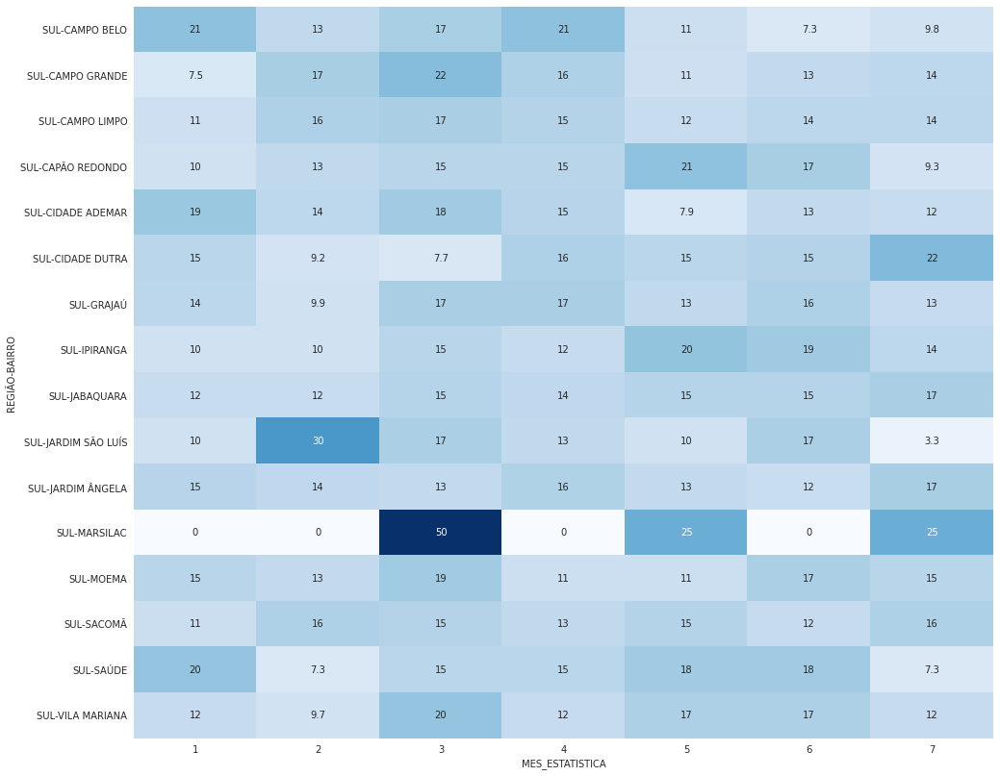

In [221]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_ac_tr_s.REGIÃO,database_ac_tr_s.BAIRRO], database_ac_tr_s.MES_ESTATISTICA, values=database_ac_tr_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de acidente de trânsito nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- os bairros MARSILAC e SÃO LUIS são os que apresentaram o menores percentuais e também  maior (MARSILAC)

#### Análise de Ocorrência ACIDENTE DE TRÂNSITO na região LESTE

In [222]:
#Separando pela região LESTE
database_ac_tr_l = database_ac_tr[database_ac_tr['REGIÃO']== 'LESTE'].reset_index()

In [223]:
database_ac_tr_l

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,1,2,1/1/2023,3:05:00,CIDADE LÍDER,"-23,58206873","-46,49064622",ACIDENTE DE TRÂNSITO,1,2023,137277.0,LESTE
1,2,3,1/1/2023,5:44:00,VILA JACUÍ,"-23,50658","-46,4561998",ACIDENTE DE TRÂNSITO,1,2023,147166.0,LESTE
2,4,5,1/1/2023,10:00:00,LAJEADO,"-23,53027508","-46,41549436",ACIDENTE DE TRÂNSITO,1,2023,177828.0,LESTE
3,7,9,1/5/2023,18:30:00,PARQUE DO CARMO,"-23,56666207","-46,46513389",ACIDENTE DE TRÂNSITO,1,2023,72625.0,LESTE
4,12,14,1/13/2023,5:18:00,SÃO LUCAS,"-23,60813476","-46,5232954",ACIDENTE DE TRÂNSITO,1,2023,142744.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
1830,6120,284783,7/8/2023,10:09:00 AM,PARQUE DO CARMO,"-23,56800259","-46,47318633",ACIDENTE DE TRÂNSITO,7,2023,72625.0,LESTE
1831,6122,284785,7/9/2023,4:00:00 AM,ERMELINO MATARAZZO,"-23,52669603","-46,4680076",ACIDENTE DE TRÂNSITO,7,2023,119872.0,LESTE
1832,6124,284787,7/9/2023,1:18:00 AM,ITAIM PAULISTA,"-23,50015022","-46,39214653",ACIDENTE DE TRÂNSITO,7,2023,238478.0,LESTE
1833,6126,284790,7/14/2023,3:30:00 AM,BELÉM,"-23,54055","-46,5854",ACIDENTE DE TRÂNSITO,7,2023,49876.0,LESTE


In [224]:
x = database_ac_tr_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_ac_tr_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_ac_tr_l.shape[0])

REGIÃO  BAIRRO            
LESTE   TATUAPÉ               123
        SAPOPEMBA             120
        ERMELINO MATARAZZO    106
        ARICANDUVA            105
        SÃO MATEUS             97
        ITAQUERA               96
        VILA PRUDENTE          93
        PONTE RASA             71
        ITAIM PAULISTA         67
        SÃO LUCAS              64
        VILA MATILDE           61
        PARQUE DO CARMO        60
        VILA JACUÍ             60
        CIDADE TIRADENTES      58
        BRÁS                   55
        PENHA                  53
        CARRÃO                 52
        CIDADE LÍDER           49
        VILA FORMOSA           49
        CANGAÍBA               46
        GUAIANASES             46
        BELÉM                  44
        ARTUR ALVIM            43
        ÁGUA RASA              41
        LAJEADO                39
        SÃO RAFAEL             39
        VILA CURUÇÁ            37
        JARDIM HELENA          34
        IGUATEMI     

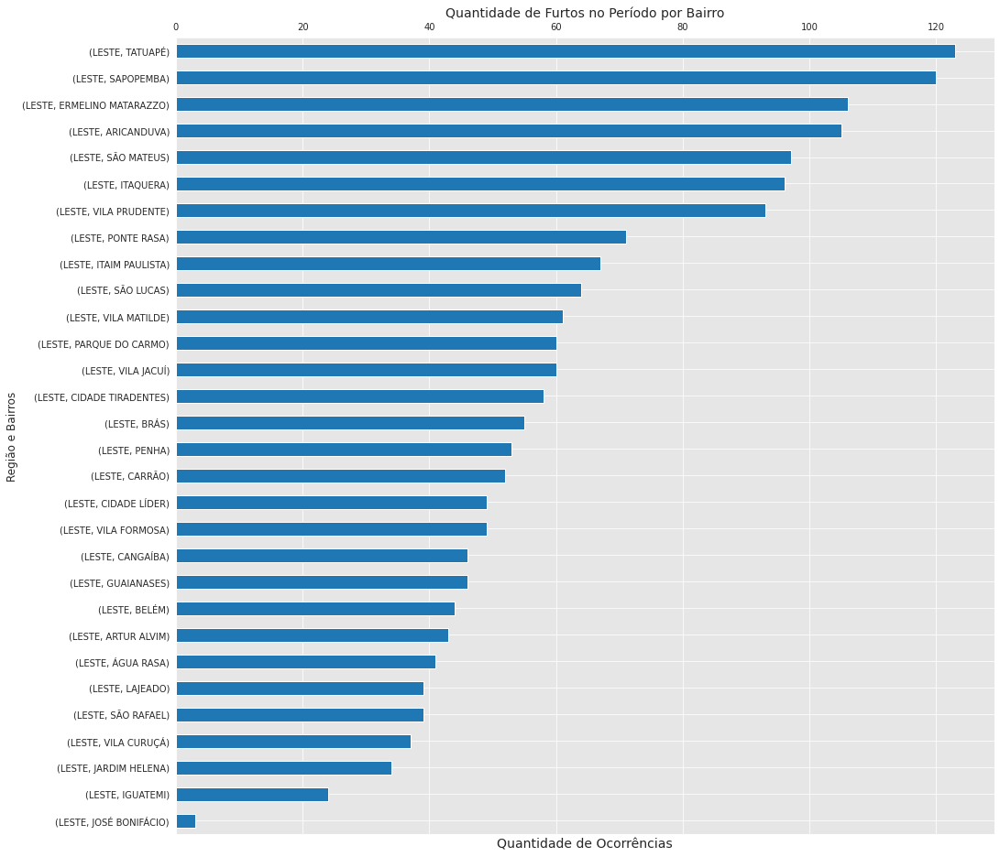

In [225]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 16))
ax = (database_ac_tr_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Furtos no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região LESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de acidente de trânsito é TATUAPÉ e SAPOPEMBA com números bema acima dos demais.

In [226]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
transito_cross_l = (pd.crosstab([database_ac_tr_l.REGIÃO,database_ac_tr_l.BAIRRO], database_ac_tr_l.MES_ESTATISTICA, values=database_ac_tr_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
transito_cross_l.reset_index(inplace=True)
transito_cross_l

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,LESTE,ARICANDUVA,7.083333,7.017544,5.902778,4.938272,4.089219,7.194245,4.152249,5.722071
1,LESTE,ARTUR ALVIM,2.500000,0.877193,2.083333,4.115226,2.602230,2.158273,2.076125,2.343324
2,LESTE,BELÉM,2.083333,2.192982,2.430556,2.880658,3.717472,2.517986,1.038062,2.397820
3,LESTE,BRÁS,2.916667,3.947368,2.777778,4.115226,3.345725,1.798561,2.422145,2.997275
4,LESTE,CANGAÍBA,1.250000,4.824561,3.472222,2.057613,2.230483,1.438849,2.422145,2.506812
5,LESTE,CARRÃO,2.916667,1.754386,1.388889,3.703704,4.460967,1.798561,3.806228,2.833787
6,LESTE,CIDADE LÍDER,4.166667,2.631579,1.388889,3.703704,1.858736,2.158273,3.114187,2.670300
7,LESTE,CIDADE TIRADENTES,2.083333,2.192982,2.777778,2.880658,4.089219,5.035971,2.768166,3.160763
8,LESTE,ERMELINO MATARAZZO,6.666667,5.701754,4.513889,6.172840,5.947955,6.115108,5.536332,5.776567
9,LESTE,GUAIANASES,2.500000,1.754386,3.125000,1.234568,3.345725,1.798561,3.460208,2.506812


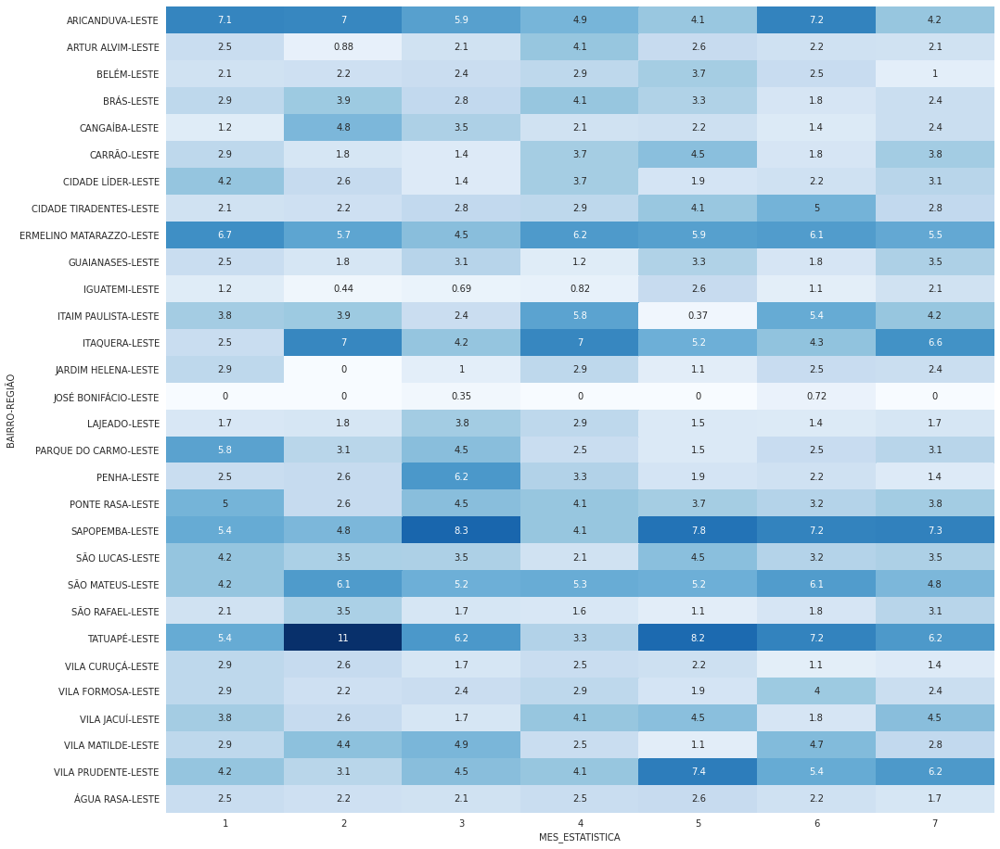

In [227]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_ac_tr_l.BAIRRO,database_ac_tr_l.REGIÃO], database_ac_tr_l.MES_ESTATISTICA, values=database_ac_tr_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - comproando o exposto acima,o bairro TATUAPÉ é o que mais contribuiu no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros JOSÉ BONIFÁCIO

In [228]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_ac_tr_l.REGIÃO,database_ac_tr_l.BAIRRO], database_ac_tr_l.MES_ESTATISTICA, values=database_ac_tr_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                    1          2          3          4  \
REGIÃO BAIRRO                                                           
LESTE  ARICANDUVA          16.190476  15.238095  16.190476  11.428571   
       ARTUR ALVIM         13.953488   4.651163  13.953488  23.255814   
       BELÉM               11.363636  11.363636  15.909091  15.909091   
       BRÁS                12.727273  16.363636  14.545455  18.181818   
       CANGAÍBA             6.521739  23.913043  21.739130  10.869565   
       CARRÃO              13.461538   7.692308   7.692308  17.307692   
       CIDADE LÍDER        20.408163  12.244898   8.163265  18.367347   
       CIDADE TIRADENTES    8.620690   8.620690  13.793103  12.068966   
       ERMELINO MATARAZZO  15.094340  12.264151  12.264151  14.150943   
       GUAIANASES          13.043478   8.695652  19.565217   6.521739   
       IGUATEMI            12.500000   4.166667   8.333333   8.333333   
       ITAIM PAULISTA      13.432836  13.432836  10.447761  20.895522   
       ITAQUERA             6.250000  16.666667  12.500000  17.708333   
       JARDIM HELENA       20.588235   0.000000   8.823529  20.588235   
       JOSÉ BONIFÁCIO       0.000000   0.000000  33.333333   0.000000   
       LAJEADO             10.256410  10.256410  28.205128  17.948718   
       PARQUE DO CARMO     23.333333  11.666667  21.666667  10.000000   
       PENHA               11.320755  11.320755  33.962264  15.094340   
       PONTE RASA          16.901408   8.450704  18.309859  14.084507   
       SAPOPEMBA           10.833333   9.166667  20.000000   8.333333   
       SÃO LUCAS           15.625000  12.500000  15.625000   7.812500   
       SÃO MATEUS          10.309278  14.432990  15.463918  13.402062   
       SÃO RAFAEL          12.820513  20.512821  12.820513  10.256410   
       TATUAPÉ             10.569106  19.512195  14.634146   6.504065   
       VILA CURUÇÁ         18.918919  16.216216  13.513514  16.216216   
       VILA FORMOSA        14.285714  10.204082  14.285714  14.285714   
       VILA JACUÍ          15.000000  10.000000   8.333333  16.666667   
       VILA MATILDE        11.475410  16.393443  22.950820   9.836066   
       VILA PRUDENTE       10.752688   7.526882  13.978495  10.752688   
       ÁGUA RASA           14.634146  12.195122  14.634146  14.634146   

MES_ESTATISTICA                    5          6          7  
REGIÃO BAIRRO                                               
LESTE  ARICANDUVA          10.476190  19.047619  11.428571  
       ARTUR ALVIM         16.279070  13.953488  13.953488  
       BELÉM               22.727273  15.909091   6.818182  
       BRÁS                16.363636   9.090909  12.727273  
       CANGAÍBA            13.043478   8.695652  15.217391  
       CARRÃO              23.076923   9.615385  21.153846  
       CIDADE LÍDER        10.204082  12.244898  18.367347  
       CIDADE TIRADENTES   18.965517  24.137931  13.793103  
       ERMELINO MATARAZZO  15.094340  16.037736  15.094340  
       GUAIANASES          19.565217  10.869565  21.739130  
       IGUATEMI            29.166667  12.500000  25.000000  
       ITAIM PAULISTA       1.492537  22.388060  17.910448  
       ITAQUERA            14.583333  12.500000  19.791667  
       JARDIM HELENA        8.823529  20.588235  20.588235  
       JOSÉ BONIFÁCIO       0.000000  66.666667   0.000000  
       LAJEADO             10.256410  10.256410  12.820513  
       PARQUE DO CARMO      6.666667  11.666667  15.000000  
       PENHA                9.433962  11.320755   7.547170  
       PONTE RASA          14.084507  12.676056  15.492958  
       SAPOPEMBA           17.500000  16.666667  17.500000  
       SÃO LUCAS           18.750000  14.062500  15.625000  
       SÃO MATEUS          14.432990  17.525773  14.432990  
       SÃO RAFAEL           7.692308  12.820513  23.076923  
       TATUAPÉ             17.886179  16.260163  14.634146  
       VILA CURUÇÁ         16.216216   8.108108  10.810811  
       VILA FORM

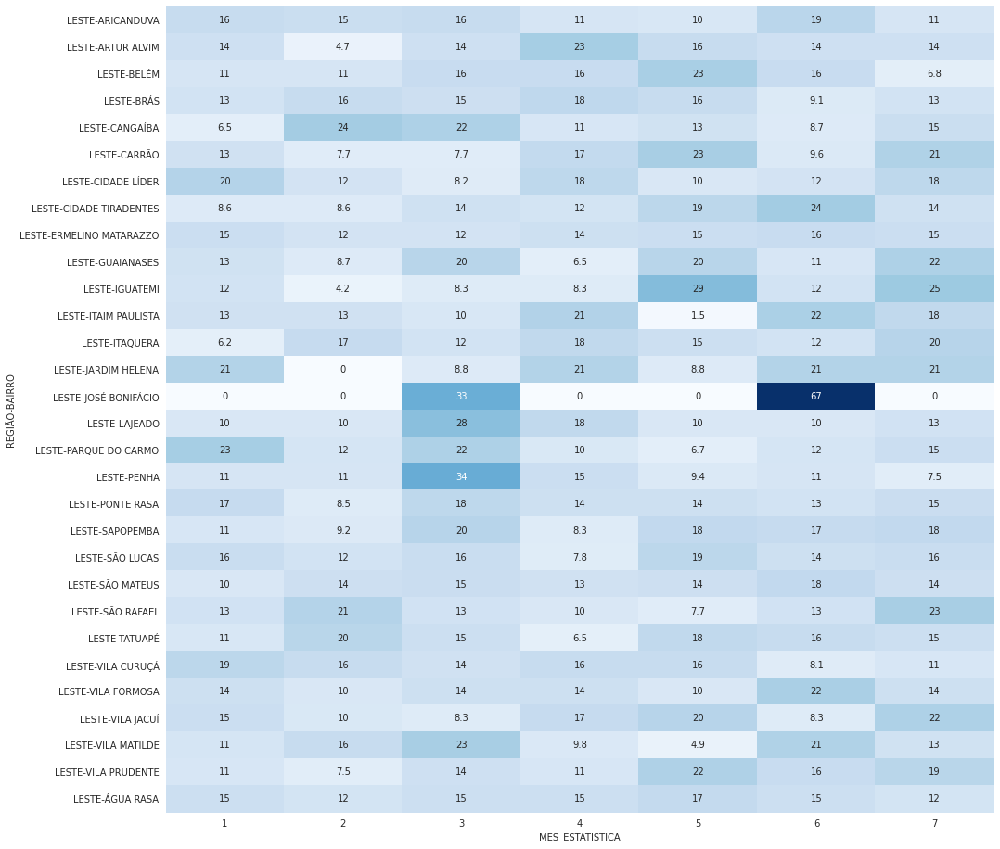

In [229]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_ac_tr_l.REGIÃO,database_ac_tr_l.BAIRRO], database_ac_tr_l.MES_ESTATISTICA, values=database_ac_tr_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de acidente de trânsito nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- nos meses de janeiro e março alguns bairros apresentam uma elevação nos percentuais;
- O bairo JOSÉ BONIFÁCIO apresenta o menor valor (0% - fevereiro) e o maior valor (100% - junho)

#### Análise de Ocorrência ACIDENTE DE TRÂNSITO na região OESTE

In [230]:
#Separando pela região OESTE
database_ac_tr_o = database_ac_tr[database_ac_tr['REGIÃO']== 'OESTE'].reset_index()

In [231]:
database_ac_tr_o

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,0,1,1/1/2023,1:20:00,RAPOSO TAVARES,"-23,58404575","-46,78334339",ACIDENTE DE TRÂNSITO,1,2023,109052.0,OESTE
1,20,25,1/18/2023,12:10:00,PINHEIROS,"-23,5881718","-46,6927218",ACIDENTE DE TRÂNSITO,1,2023,65509.0,OESTE
2,27,34,1/22/2023,3:15:00,MORUMBI,"-23,61331543","-46,70092673",ACIDENTE DE TRÂNSITO,1,2023,54007.0,OESTE
3,28,35,1/22/2023,20:23:00,PINHEIROS,"-23,4840328","-46,4340142",ACIDENTE DE TRÂNSITO,1,2023,65509.0,OESTE
4,29,36,1/24/2023,23:51:00,JAGUARÉ,"-23,55806588","-46,74605394",ACIDENTE DE TRÂNSITO,1,2023,56292.0,OESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
928,6108,284768,7/2/2023,9:08:00 AM,RAPOSO TAVARES,"-23,58357204","-46,77891723",ACIDENTE DE TRÂNSITO,7,2023,109052.0,OESTE
929,6111,284771,7/3/2023,7:15:00 AM,PINHEIROS,"-23,4845825","-46,4266939",ACIDENTE DE TRÂNSITO,7,2023,65509.0,OESTE
930,6112,284772,7/3/2023,3:30:00 PM,BUTANTÃ,"-23,57022424","-46,71159737",ACIDENTE DE TRÂNSITO,7,2023,53424.0,OESTE
931,6133,284798,NaN,9:20:57 AM,MORUMBI,"-23,60323972","-46,74470114",ACIDENTE DE TRÂNSITO,7,2023,54007.0,OESTE


In [232]:
x = database_ac_tr_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_ac_tr_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_ac_tr_o.shape[0])

REGIÃO  BAIRRO         
OESTE   PINHEIROS          193
        MORUMBI            134
        ITAIM BIBI         104
        BUTANTÃ            102
        JARDIM PAULISTA     72
        RIO PEQUENO         69
        LAPA                67
        JAGUARÉ             65
        RAPOSO TAVARES      43
        BARRA FUNDA         32
        PERDIZES            30
        JAGUARA             22
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
OESTE   PINHEIROS          0.206860
        MORUMBI            0.143623
        ITAIM BIBI         0.111468
        BUTANTÃ            0.109325
        JARDIM PAULISTA    0.077170
        RIO PEQUENO        0.073955
        LAPA               0.071811
        JAGUARÉ            0.069668
        RAPOSO TAVARES     0.046088
        BARRA FUNDA        0.034298
        PERDIZES           0.032154
        JAGUARA            0.023580
Name: BAIRRO, dtype: float64


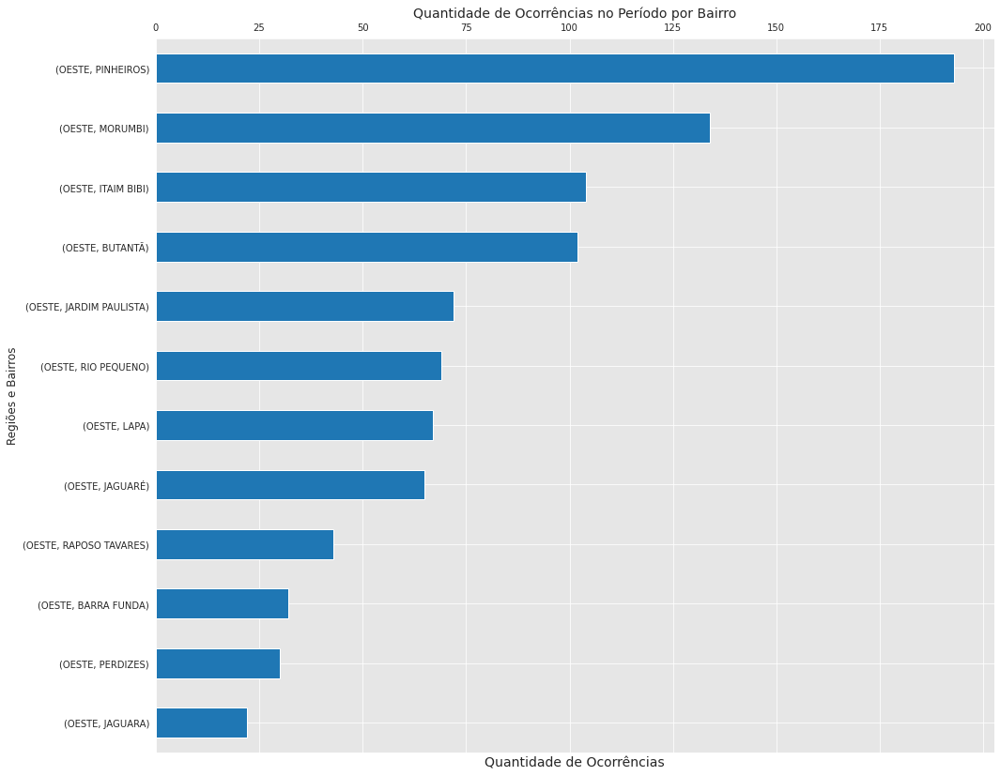

In [233]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_ac_tr_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Regiões e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região OESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de acidente de trânsito é PINHEIROS com um percentual 35% maior do que o bairro MORUMBI (2º posição). Percebe-se que os demais bairros apresentam valores próximos entre si.

In [234]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
transito_cross_o = (pd.crosstab([database_ac_tr_o.BAIRRO,database_ac_tr_o.REGIÃO], database_ac_tr_o.MES_ESTATISTICA, values=database_ac_tr_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
transito_cross_o.reset_index(inplace=True)
transito_cross_o

MES_ESTATISTICA,BAIRRO,REGIÃO,1,2,3,4,5,6,7,Total
0,BARRA FUNDA,OESTE,2.654867,6.930693,3.821656,4.918033,1.515152,3.550296,1.438849,3.429796
1,BUTANTÃ,OESTE,7.964602,15.841584,8.917197,14.754098,9.090909,8.875740,12.949640,10.932476
2,ITAIM BIBI,OESTE,9.734513,5.940594,12.101911,10.655738,13.636364,11.834320,12.230216,11.146838
3,JAGUARA,OESTE,2.654867,3.960396,1.910828,2.459016,2.272727,2.366864,1.438849,2.357985
4,JAGUARÉ,OESTE,9.734513,5.940594,8.917197,5.737705,4.545455,5.917160,7.913669,6.966774
5,JARDIM PAULISTA,OESTE,13.274336,8.910891,7.643312,7.377049,5.303030,5.917160,7.194245,7.717042
6,LAPA,OESTE,10.619469,8.910891,6.369427,6.557377,7.575758,4.733728,7.194245,7.181136
7,MORUMBI,OESTE,7.079646,7.920792,16.560510,20.491803,10.606061,17.751479,16.546763,14.362272
8,PERDIZES,OESTE,3.539823,7.920792,3.184713,0.000000,6.060606,2.366864,0.719424,3.215434
9,PINHEIROS,OESTE,19.469027,20.792079,17.197452,13.934426,25.757576,24.852071,21.582734,20.685959


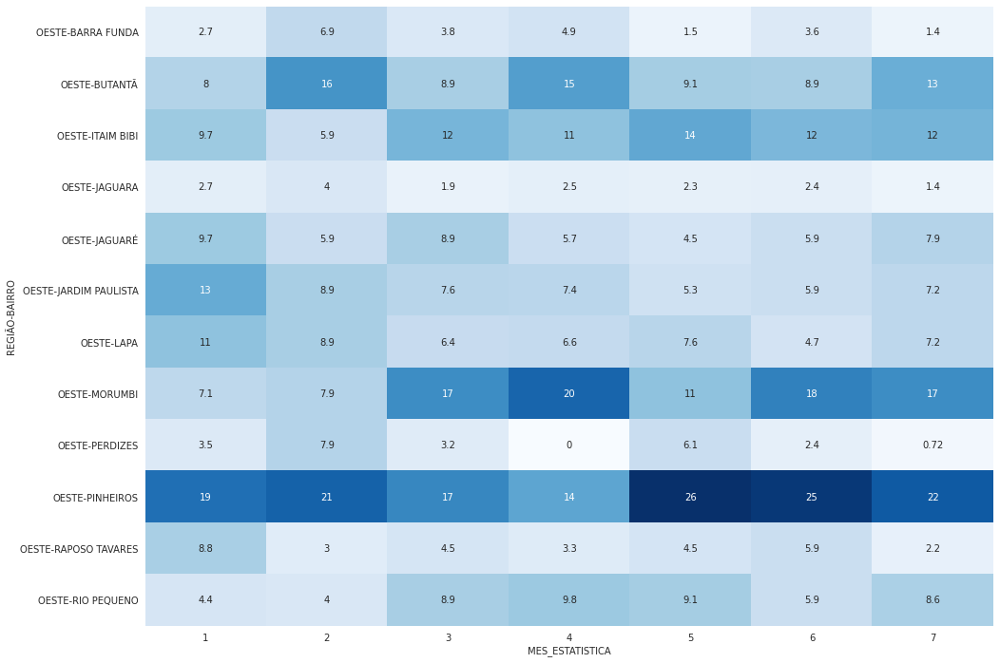

In [235]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_ac_tr_o.REGIÃO,database_ac_tr_o.BAIRRO], database_ac_tr_o.MES_ESTATISTICA, values=database_ac_tr_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro do PINHEIROS é o bairro que mais contribuiu no percentual em todos os meses do período, apresentando o maior percentual em todos os meses, enquanto MORUMBI apresenta valores altos a partir de maio;
 - já os menores percentuais são os bairros JAGUARA  e PERDIZES
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [236]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_ac_tr_o.REGIÃO,database_ac_tr_o.BAIRRO], database_ac_tr_o.MES_ESTATISTICA, values=database_ac_tr_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
OESTE  BARRA FUNDA       9.375000  21.875000  18.750000  18.750000   6.250000   
       BUTANTÃ           8.823529  15.686275  13.725490  17.647059  11.764706   
       ITAIM BIBI       10.576923   5.769231  18.269231  12.500000  17.307692   
       JAGUARA          13.636364  18.181818  13.636364  13.636364  13.636364   
       JAGUARÉ          16.923077   9.230769  21.538462  10.769231   9.230769   
       JARDIM PAULISTA  20.833333  12.500000  16.666667  12.500000   9.722222   
       LAPA             17.910448  13.432836  14.925373  11.940299  14.925373   
       MORUMBI           5.970149   5.970149  19.402985  18.656716  10.447761   
       PERDIZES         13.333333  26.666667  16.666667   0.000000  26.666667   
       PINHEIROS        11.398964  10.880829  13.989637   8.808290  17.616580   
       RAPOSO TAVARES   23.255814   6.976744  16.279070   9.302326  13.953488   
       RIO PEQUENO       7.246377   5.797101  20.289855  17.391304  17.391304   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
OESTE  BARRA FUNDA      18.750000   6.250000  
       BUTANTÃ          14.705882  17.647059  
       ITAIM BIBI       19.230769  16.346154  
       JAGUARA          18.181818   9.090909  
       JAGUARÉ          15.384615  16.923077  
       JARDIM PAULISTA  13.888889  13.888889  
       LAPA             11.940299  14.925373  
       MORUMBI          22.388060  17.164179  
       PERDIZES         13.333333   3.333333  
       PINHEIROS        21.761658  15.544041  
       RAPOSO TAVARES   23.255814   6.976744  
       RIO PEQUENO      14.492754  17.391304

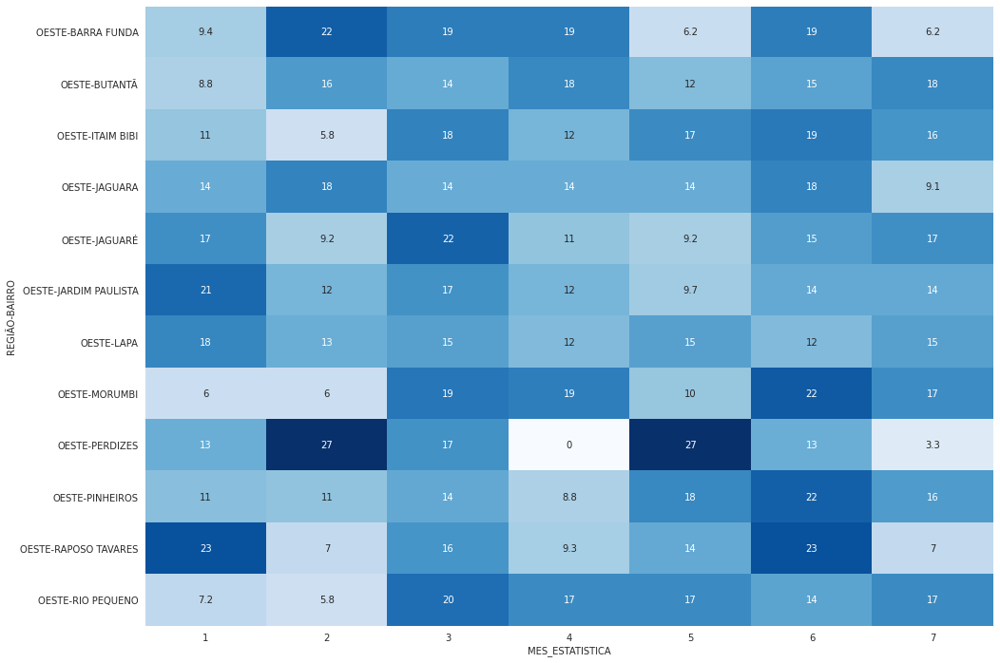

In [237]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_ac_tr_o.REGIÃO,database_ac_tr_o.BAIRRO], database_ac_tr_o.MES_ESTATISTICA, values=database_ac_tr_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de acidente de trânsito nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro onde mostra que em janeio e fevereiro apresenta altos valores em PERDIZES e RAPOSO TAVARES e em maio e junho, apresentando aumento nos mesmos bairros

#### Análise de Ocorrência ACIDENTE DE TRÂNSITO na região CENTRAL

In [238]:
#Separando pela região CENTRAL
database_ac_tr_c = database_ac_tr[database_ac_tr['REGIÃO']== 'CENTRO'].reset_index()

In [239]:
database_ac_tr_c

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,5,6,1/1/2023,20:45:00,SÉ,"-23,55160617","-46,6324797",ACIDENTE DE TRÂNSITO,1,2023,27241.0,CENTRO
1,13,15,1/13/2023,6:15:00,BELA VISTA,"-23,5545661","-46,6443021",ACIDENTE DE TRÂNSITO,1,2023,73508.0,CENTRO
2,24,30,1/19/2023,10:40:50,REPÚBLICA,"-23,53998438","-46,63632532",ACIDENTE DE TRÂNSITO,1,2023,62203.0,CENTRO
3,26,33,1/22/2023,9:32:00,CONSOLAÇÃO,"-23,54275928","-46,64890639",ACIDENTE DE TRÂNSITO,1,2023,57076.0,CENTRO
4,37,48,1/10/2023,12:38:00,BELA VISTA,"-23,55534744","-46,6446456",ACIDENTE DE TRÂNSITO,1,2023,73508.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...,...
333,6110,284770,7/3/2023,12:32:59 AM,BELA VISTA,"-23,55465161","-46,64469296",ACIDENTE DE TRÂNSITO,7,2023,73508.0,CENTRO
334,6115,284776,7/5/2023,7:27:00 PM,SANTA CECÍLIA,"-23,53475343","-46,64383452",ACIDENTE DE TRÂNSITO,7,2023,88795.0,CENTRO
335,6130,284795,7/17/2023,12:00:00 PM,BOM RETIRO,"-23,52291679","-46,63032883",ACIDENTE DE TRÂNSITO,7,2023,39856.0,CENTRO
336,6135,284800,7/20/2023,10:16:00 PM,BOM RETIRO,"-23,520692","-46,635938",ACIDENTE DE TRÂNSITO,7,2023,39856.0,CENTRO


In [240]:
x = database_ac_tr_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_ac_tr_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_ac_tr_c.shape[0])

REGIÃO  BAIRRO       
CENTRO  BELA VISTA       88
        REPÚBLICA        49
        SÉ               45
        CONSOLAÇÃO       41
        BOM RETIRO       37
        LIBERDADE        31
        CAMBUCI          25
        SANTA CECÍLIA    22
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
CENTRO  BELA VISTA       0.260355
        REPÚBLICA        0.144970
        SÉ               0.133136
        CONSOLAÇÃO       0.121302
        BOM RETIRO       0.109467
        LIBERDADE        0.091716
        CAMBUCI          0.073964
        SANTA CECÍLIA    0.065089
Name: BAIRRO, dtype: float64


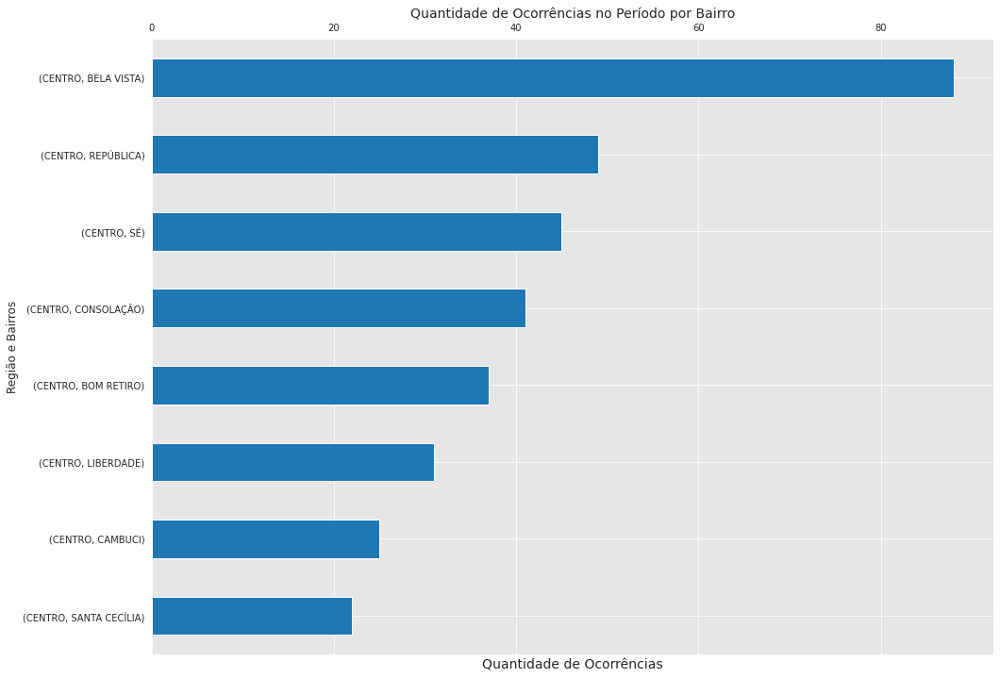

In [241]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 12))
ax = (database_ac_tr_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que o bairro com o maior número de ocorrências de acidente de trânsito é BELA VISTA com 26% do total de ocorrências. Os demais bairros apresentam valores próximos entre si.

In [242]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
transito_cross_c = (pd.crosstab([database_ac_tr_c.REGIÃO,database_furto_c.BAIRRO], database_ac_tr_c.MES_ESTATISTICA, values=database_ac_tr_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
transito_cross_c.reset_index(inplace=True)
transito_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,CENTRO,BELA VISTA,0.000000,0.0,0.000000,2.127660,0.000000,3.921569,0.000000,0.887574
1,CENTRO,BOM RETIRO,2.083333,0.0,1.449275,0.000000,0.000000,0.000000,2.564103,0.887574
2,CENTRO,CAMBUCI,0.000000,0.0,1.449275,0.000000,0.000000,0.000000,0.000000,0.295858
3,CENTRO,LIBERDADE,18.750000,20.0,30.434783,27.659574,16.666667,21.568627,23.076923,23.076923
4,CENTRO,REPÚBLICA,0.000000,0.0,1.449275,2.127660,1.851852,0.000000,0.000000,0.887574
5,CENTRO,SÉ,79.166667,80.0,65.217391,68.085106,81.481481,74.509804,74.358974,73.964497


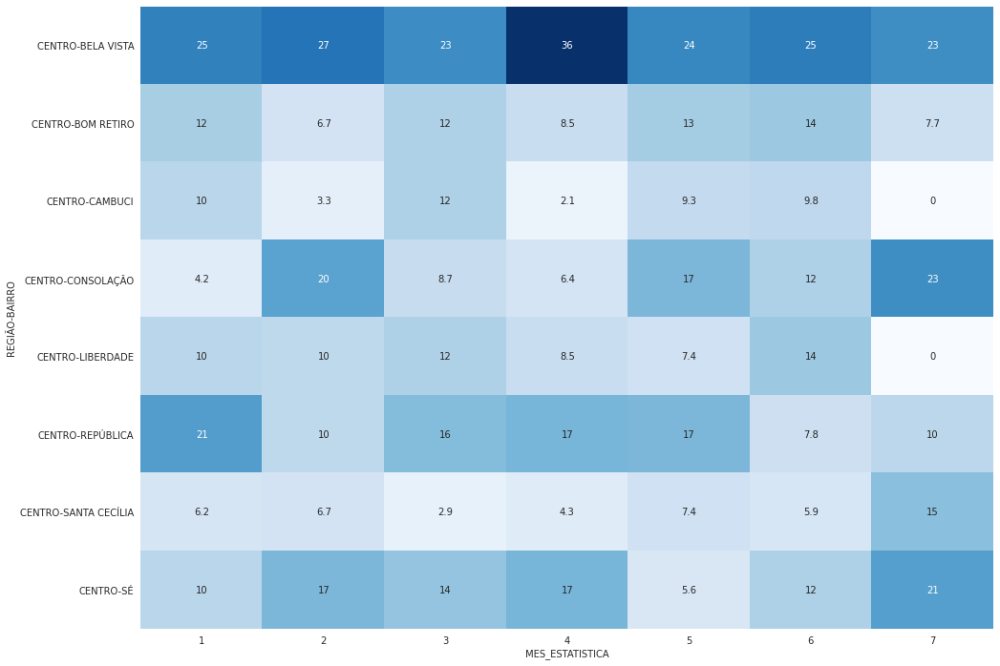

In [243]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_ac_tr_c.REGIÃO,database_ac_tr_c.BAIRRO], database_ac_tr_c.MES_ESTATISTICA, values=database_ac_tr_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro da REPÚBLICA e BELA VISTA são os que mais contribuiram no percentual em todos os meses do período, apresentando o maior percentual em todos os meses;
 - já os menores percentuais são os bairros CAMBUCI  e BOM RETIRO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [244]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_ac_tr_c.REGIÃO,database_ac_tr_c.BAIRRO], database_ac_tr_c.MES_ESTATISTICA, values=database_ac_tr_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA               1          2          3          4          5  \
REGIÃO BAIRRO                                                                 
CENTRO BELA VISTA     13.636364   9.090909  18.181818  19.318182  14.772727   
       BOM RETIRO     16.216216   5.405405  21.621622  10.810811  18.918919   
       CAMBUCI        20.000000   4.000000  32.000000   4.000000  20.000000   
       CONSOLAÇÃO      4.878049  14.634146  14.634146   7.317073  21.951220   
       LIBERDADE      16.129032   9.677419  25.806452  12.903226  12.903226   
       REPÚBLICA      20.408163   6.122449  22.448980  16.326531  18.367347   
       SANTA CECÍLIA  13.636364   9.090909   9.090909   9.090909  18.181818   
       SÉ             11.111111  11.111111  22.222222  17.777778   6.666667   

MES_ESTATISTICA               6          7  
REGIÃO BAIRRO                               
CENTRO BELA VISTA     14.772727  10.227273  
       BOM RETIRO     18.918919   8.108108  
       CAMBUCI        20.000000   0.000000  
       CONSOLAÇÃO     14.634146  21.951220  
       LIBERDADE      22.580645   0.000000  
       REPÚBLICA       8.163265   8.163265  
       SANTA CECÍLIA  13.636364  27.272727  
       SÉ             13.333333  17.777778

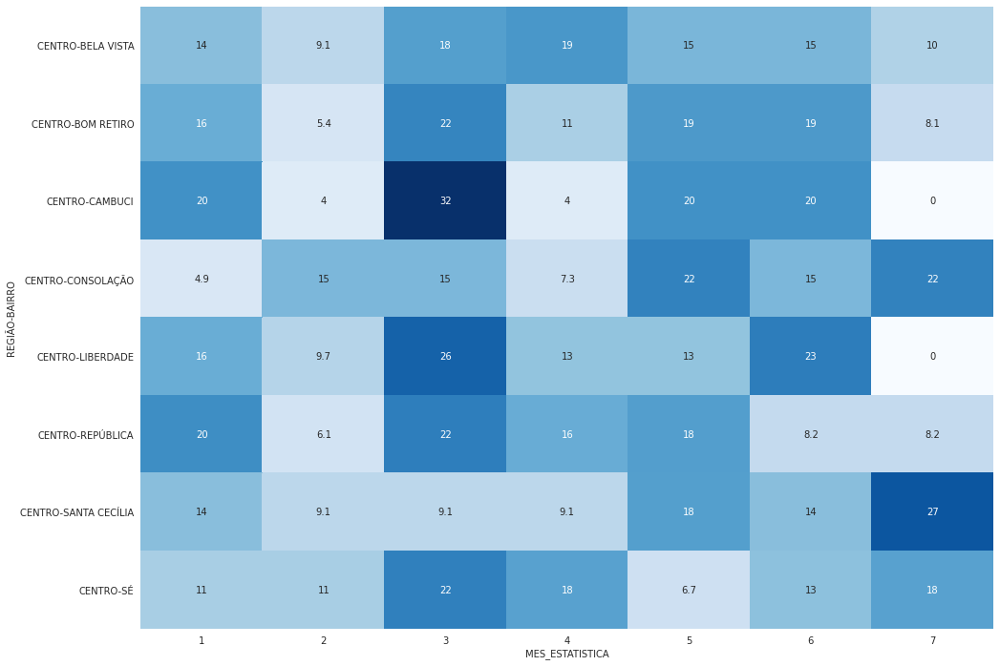

In [245]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_ac_tr_c.REGIÃO,database_ac_tr_c.BAIRRO], database_ac_tr_c.MES_ESTATISTICA, values=database_ac_tr_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências de acidente de trânsito separados por bairro, onde verifica-se um grande aumento quase generalizado no mês de março em todos os bairros.

### Analisando Ocorrências: ESTUPRO

Com o intuito de realizar uma análise mais detalhada, o conjunto de dados será separado por tipo de ocorrência, onde agora será analisado a ocorrência ESTUPRO.

In [246]:
#Separando por tipo de ocorrência
database_est = database.loc[database['NATUREZA_APURADA']== 'ESTUPRO'].reset_index()
database_est

,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,102,1/12/2023,9:00:19 PM,SÉ,0,0,ESTUPRO,1,2023,27241.0,CENTRO
1,1779,1/9/2023,4:00:47 PM,BOM RETIRO,0,0,ESTUPRO,1,2023,39856.0,CENTRO
2,1780,1/20/2023,7:00:57 PM,BOM RETIRO,0,0,ESTUPRO,1,2023,39856.0,CENTRO
3,2164,1/1/2023,6:39:00 AM,REPÚBLICA,0,0,ESTUPRO,1,2023,62203.0,CENTRO
4,2165,1/19/2023,NaN,REPÚBLICA,0,0,ESTUPRO,1,2023,62203.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...
1453,284027,7/5/2023,5:45:00 AM,SAPOPEMBA,0,0,ESTUPRO,7,2023,291648.0,LESTE
1454,284028,7/18/2023,NaN,SÃO MATEUS,0,0,ESTUPRO,7,2023,156398.0,LESTE
1455,284029,7/29/2023,5:00:00 PM,SÃO MATEUS,0,0,ESTUPRO,7,2023,156398.0,LESTE
1456,284311,10/25/2018,2:25:05 PM,SÃO LUCAS,0,0,ESTUPRO,7,2023,142744.0,LESTE


In [247]:
#Agrupando e contando as ocorrências em cada mês
database.loc[database['NATUREZA_APURADA']== 'ESTUPRO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()

MES_ESTATISTICA
1    194
2    223
3    260
4    202
5    215
6    191
7    173
Name: ANO_ESTATISTICA, dtype: int64

In [248]:
#Percentual de ocorrências por mês
database.loc[database['NATUREZA_APURADA']== 'ESTUPRO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()/database_est.shape[0]

MES_ESTATISTICA
1    0.133059
2    0.152949
3    0.178326
4    0.138546
5    0.147462
6    0.131001
7    0.118656
Name: ANO_ESTATISTICA, dtype: float64

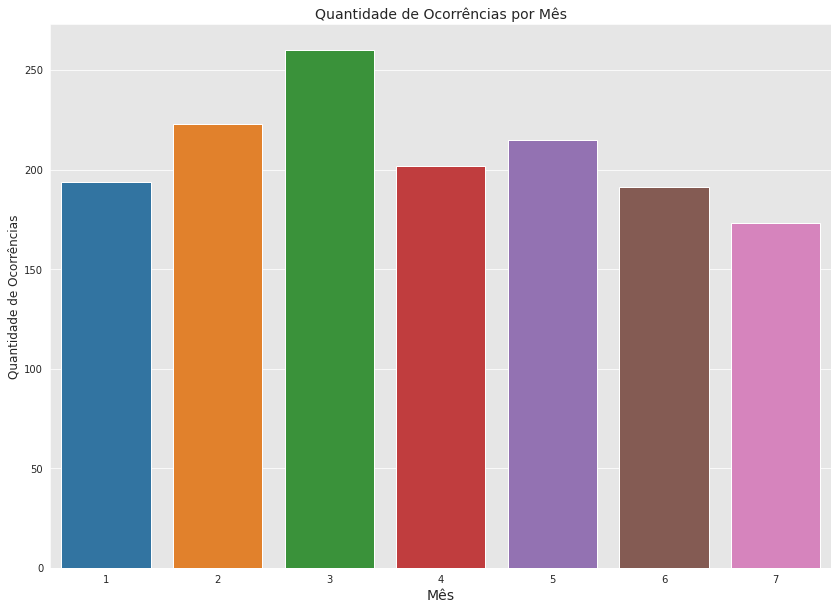

In [249]:
#Plotando o gráfico
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_est,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de estupro totais distribuídas pelos meses em questão. Percebe-se quem há uma linear crescente de JANEIRO a MARÇO (pico). Nota-se que o mês de  MARÇO se sobressai aos demais meses com cerca de 13% a mais em relação a FEVEREIRO. Após ABRIL nota-se uma linear decrescente ao longo dos meses.

In [250]:
#Ocorrencias por região
database_est.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)

REGIÃO
LESTE     570
SUL       405
NORTE     279
OESTE     127
CENTRO     77
Name: NATUREZA_APURADA, dtype: int64

In [251]:
#Percental de ocorrências por bairro e região
database_est.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)/database_est.shape[0]

REGIÃO
LESTE     0.390947
SUL       0.277778
NORTE     0.191358
OESTE     0.087106
CENTRO    0.052812
Name: NATUREZA_APURADA, dtype: float64

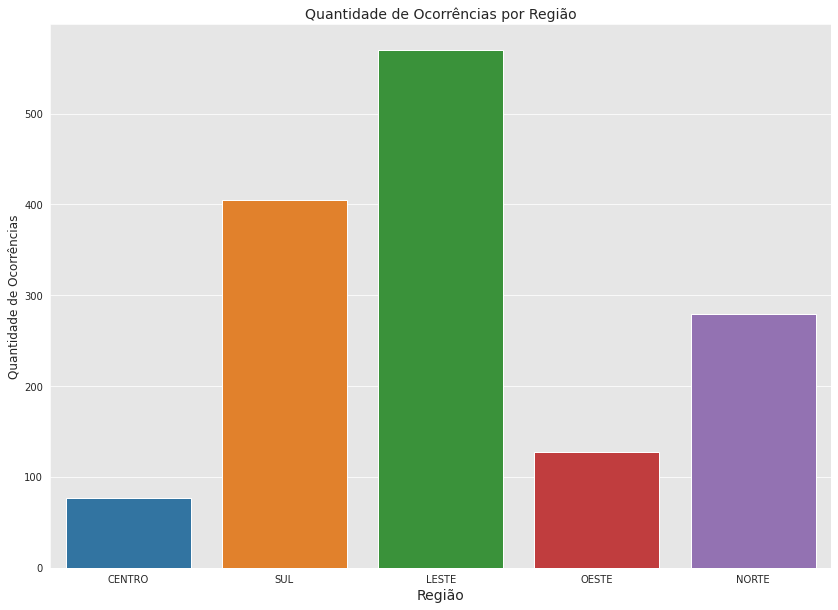

In [252]:
#Gráfico de ocorrências por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_est,x='REGIÃO')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Região', fontsize=14)
plt.show()

Acima o gráfico plotado demostra as regiões LESTE e SUL se destacam e muito das demais, onde demostra que cerca de 39% (LESTE) e 27%(SUL) dos casos. Somados os percentais das regiões LESTE e SUL tem-se que essas duas regiões respondem por quase 70% do total de ocorrências de estupro, percentual possivelmente atrelado ao número de habitantes em cada região.

In [253]:
#Ocorrencias por região
database_est['BAIRRO'].value_counts()

GRAJAÚ           67
JARDIM ÂNGELA    63
CAPÃO REDONDO    49
CAMPO LIMPO      49
BRASILÂNDIA      46
                 ..
BARRA FUNDA       4
MOEMA             3
JAGUARA           3
MARSILAC          3
SÃO DOMINGOS      1
Name: BAIRRO, Length: 82, dtype: int64

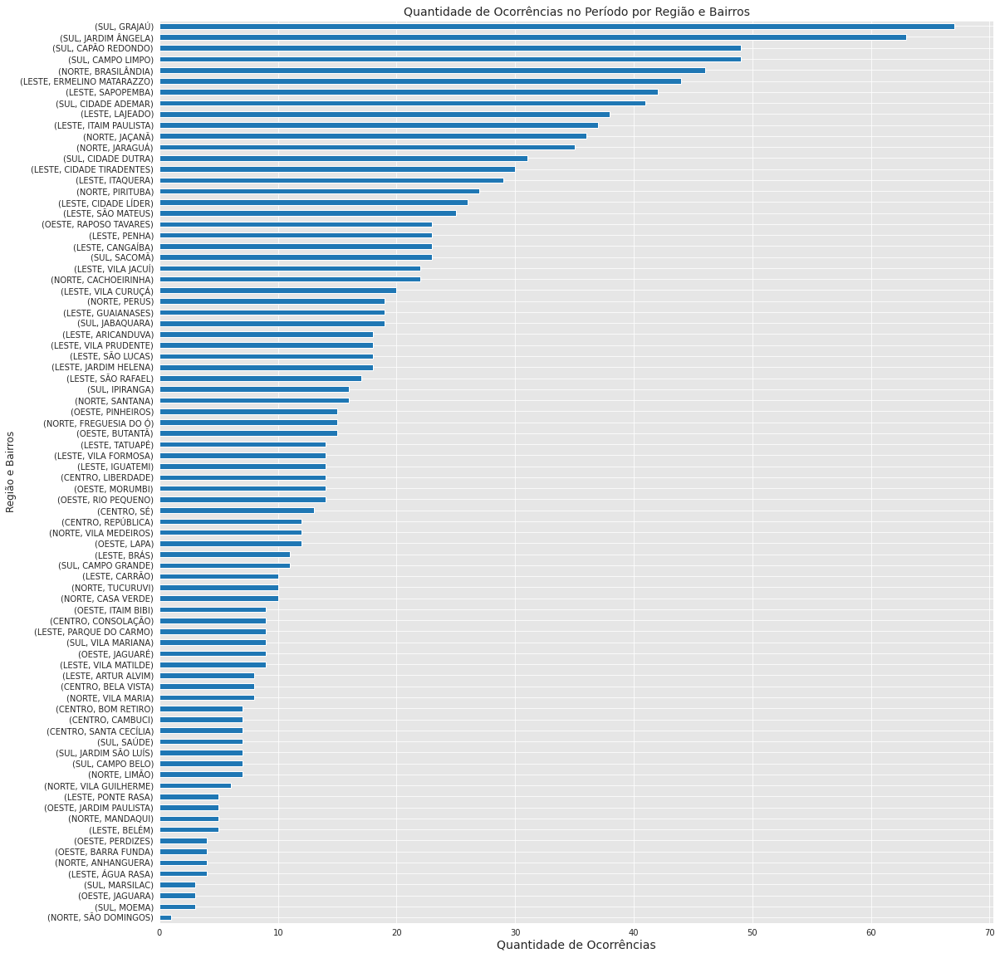

In [254]:
#Plotando o gráfico Quantidade de ocorrências no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(18, 20))
ax = (database_est.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Região e Bairros', fontsize=14)
ag.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de estupro por região e bairro no período onde percebe-se que os bairros GRAJAÚ e JARDIM ÂNGELA apresentam valores bem acima dos demais bairros. Nota-se que dos 10 bairros 5 são das regiões SUL.

In [255]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_est.BAIRRO,database_est.REGIÃO], database_est.MES_ESTATISTICA, values=database_est.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7,Total
BAIRRO,REGIÃO,,,,,,,,
ANHANGUERA,NORTE,0.515464,0.000000,0.000000,0.495050,0.930233,0.000000,0.000000,0.274348
ARICANDUVA,LESTE,0.000000,1.793722,1.538462,0.000000,0.930233,2.094241,2.312139,1.234568
ARTUR ALVIM,LESTE,1.030928,1.345291,0.000000,0.000000,0.465116,0.523560,0.578035,0.548697
BARRA FUNDA,OESTE,0.515464,0.448430,0.384615,0.000000,0.000000,0.000000,0.578035,0.274348
BELA VISTA,CENTRO,2.061856,0.896861,0.000000,0.000000,0.465116,0.000000,0.578035,0.548697
...,...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,2.061856,0.000000,1.153846,0.000000,0.930233,0.000000,0.000000,0.617284
VILA MATILDE,LESTE,0.515464,0.448430,1.153846,0.495050,0.465116,0.523560,0.578035,0.617284
VILA MEDEIROS,NORTE,0.000000,1.345291,0.769231,0.000000,2.325581,0.523560,0.578035,0.823045


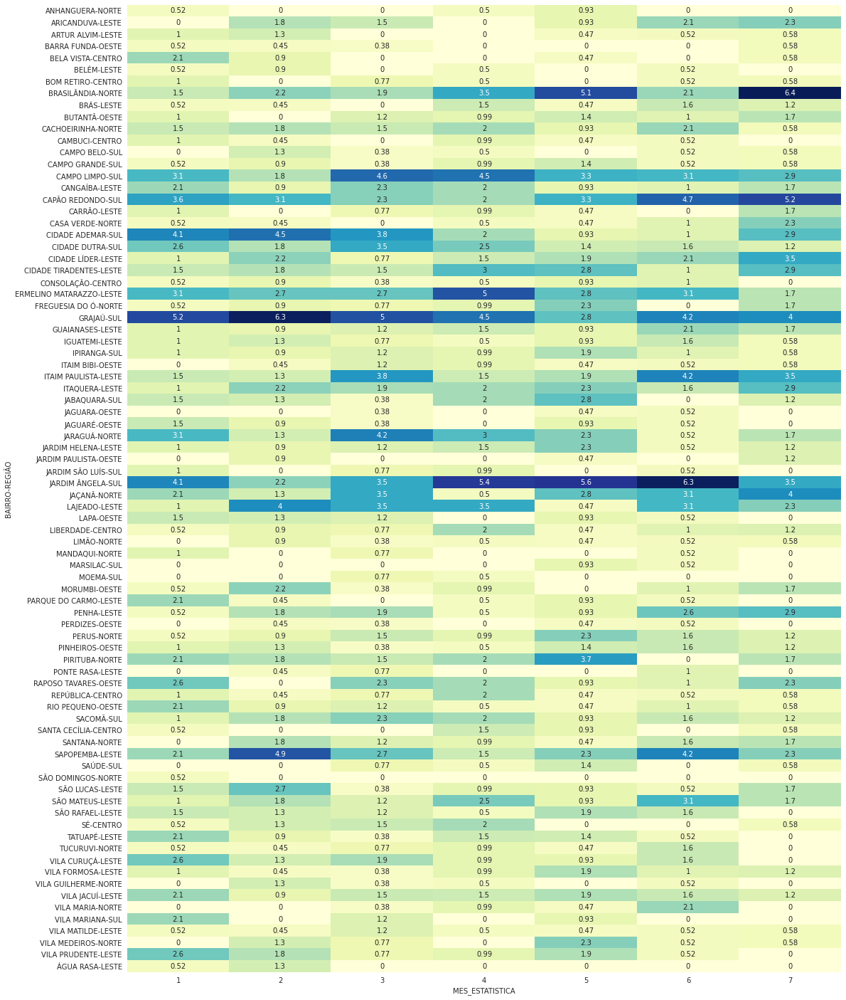

In [256]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(18,25))
sns.heatmap((pd.crosstab([database_est.BAIRRO,database_est.REGIÃO], database_est.MES_ESTATISTICA, values=database_est.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de estupro nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de estupros registrados em cada mês. Algumas pontos importantes que valem ressaltar:

         
|    JANEIRO      |   FEVEREIRO     |       MARÇO       |       ABRIL      |      MAIO        |       JUNHO       |      JULHO     |
|:---------------:|:---------------:|:-----------------:|:----------------:|:----------------:|:-----------------:|:---------------:|
|GRAJAÚ **5.2%** |GRAJAÚ **6.3%** |GRAJAÚ **5%** |JD. ÂNGELA **5.4%** |JD. ÂNGELA **7.9%** |JD. ÂNGELA **5.6%** |BRASILÂNDIA  **6.4%**|
|JD. ÂNGELA **4.1%** |SAPOPEMBA **4.9%** |CAMPO LIMPO **4.6%** |E. MATARAZZO **5%** |BRASILÂNDIA **5.1%** |CAPÃO RED  **6.5%** |CAPÃO RED **5.2%**|
|CIDADE ADEMAR **4.1%** |CIDADE ADEMAR **4.5%** |JARAGUÁ **4.2%** |GRAJAÚ  **4.5%** |PIRITUBA  **3.7%** |GRAJAÚ **5.8%** |JAÇANÃ **4%**|


Nota-se que os bairros JARDIM ÂNGELA aparece EM 5 dos 7 meses do período. Maio é o mês onde as diferenças entre os percentuais dos bairros na tabela são os maiores. Praticamente todos os demais bairros apresentaram percentuais oscilando entre 0.5% e 4% durante todo o período. Outro fato importante é que quase 80% dos bairros da tabela pertencem á região SUL.

In [257]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_est.BAIRRO,database_est.REGIÃO], database_est.MES_ESTATISTICA, values=database_est.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7
BAIRRO,REGIÃO,,,,,,,
ANHANGUERA,NORTE,25.000000,0.000000,0.000000,25.000000,50.000000,0.000000,0.000000
ARICANDUVA,LESTE,0.000000,22.222222,22.222222,0.000000,11.111111,22.222222,22.222222
ARTUR ALVIM,LESTE,25.000000,37.500000,0.000000,0.000000,12.500000,12.500000,12.500000
BARRA FUNDA,OESTE,25.000000,25.000000,25.000000,0.000000,0.000000,0.000000,25.000000
BELA VISTA,CENTRO,50.000000,25.000000,0.000000,0.000000,12.500000,0.000000,12.500000
...,...,...,...,...,...,...,...,...
VILA MARIANA,SUL,44.444444,0.000000,33.333333,0.000000,22.222222,0.000000,0.000000
VILA MATILDE,LESTE,11.111111,11.111111,33.333333,11.111111,11.111111,11.111111,11.111111
VILA MEDEIROS,NORTE,0.000000,25.000000,16.666667,0.000000,41.666667,8.333333,8.333333


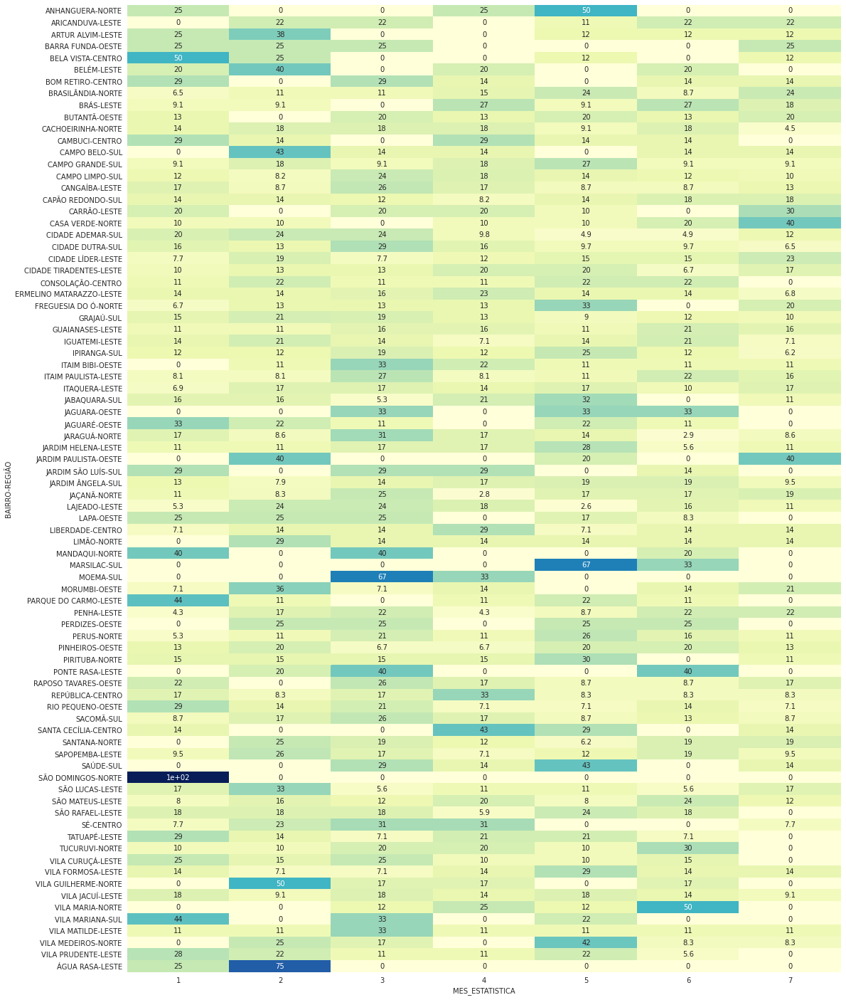

In [258]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(18,25))
sns.heatmap((pd.crosstab([database_est.BAIRRO,database_est.REGIÃO], database_est.MES_ESTATISTICA, values=database_est.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A mesma análise acima foi feita, porém agora analisando cada bairro ao longo do período (JANEIRO a JULHO), ou seja, em um determinado bairro, de todas as ocorrências de estupro, quais os percentuais em cada mês em relação ao total. Alguns pontos importantes a serem ressaltados:

 - de todos os bairros listados, 14 deles apresentam 50% dos casos nos primeiros 2 meses do período
 - o mês de março e maio apresentam a maior quantidade de bairros com aumento percentual

#### Análise de Ocorrência ESTUPRO na região NORTE

In [259]:
#Separando pela região NORTE
database_est_n = database_est[database_est['REGIÃO']== 'NORTE'].reset_index()

In [260]:
database_est_n

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,32,15885,1/7/2023,7:00:38 AM,JARAGUÁ,0,0,ESTUPRO,1,2023,218794.0,NORTE
1,33,15886,1/24/2023,22:40:52,SÃO DOMINGOS,0,0,ESTUPRO,1,2023,86703.0,NORTE
2,41,17275,1/1/2023,8:12:00 AM,ANHANGUERA,0,0,ESTUPRO,1,2023,88677.0,NORTE
3,42,17277,1/10/2023,3:40:00 AM,PERUS,0,0,ESTUPRO,1,2023,91725.0,NORTE
4,43,17278,1/16/2023,12:35:00 AM,JARAGUÁ,0,0,ESTUPRO,1,2023,218794.0,NORTE
...,...,...,...,...,...,...,...,...,...,...,...,...
274,1358,268029,7/18/2023,NaN,JARAGUÁ,0,0,ESTUPRO,7,2023,218794.0,NORTE
275,1359,268030,1/1/2017,3:00:00 PM,BRASILÂNDIA,0,0,ESTUPRO,7,2023,287033.0,NORTE
276,1360,268031,7/14/2023,NaN,BRASILÂNDIA,0,0,ESTUPRO,7,2023,287033.0,NORTE
277,1361,268032,7/19/2023,11:40:00 AM,JARAGUÁ,0,0,ESTUPRO,7,2023,218794.0,NORTE


In [261]:
x = database_est_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_est_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_est_n.shape[0])

REGIÃO  BAIRRO        
NORTE   BRASILÂNDIA       46
        JAÇANÃ            36
        JARAGUÁ           35
        PIRITUBA          27
        CACHOEIRINHA      22
        PERUS             19
        SANTANA           16
        FREGUESIA DO Ó    15
        VILA MEDEIROS     12
        CASA VERDE        10
        TUCURUVI          10
        VILA MARIA         8
        LIMÃO              7
        VILA GUILHERME     6
        MANDAQUI           5
        ANHANGUERA         4
        SÃO DOMINGOS       1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        
NORTE   BRASILÂNDIA       0.164875
        JAÇANÃ            0.129032
        JARAGUÁ           0.125448
        PIRITUBA          0.096774
        CACHOEIRINHA      0.078853
        PERUS             0.068100
        SANTANA           0.057348
        FREGUESIA DO Ó    0.053763
        VILA MEDEIROS     0.043011
        CASA VERDE        0.035842
        TUCURUVI          0.035842
        VILA MARIA        0.028674
        LIMÃO 

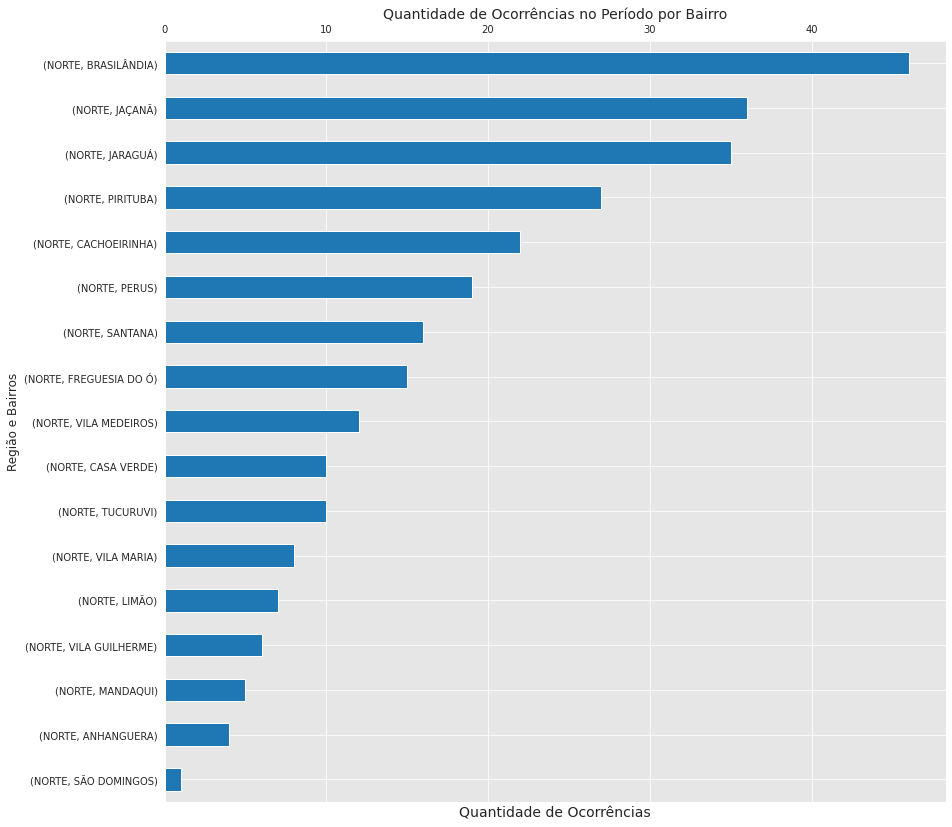

In [262]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_est_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico de ocorrências de estupro somente na região NORTE em todo o período. Nota-se que os bairros com os maiores números de ocorrências são BRASILÂNDIA, JAÇANÃ e JARAGUÁ que juntos, somam mais de 40% do total de ocorrências.

In [263]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
estupro_cross_n = (pd.crosstab([database_est_n.REGIÃO,database_est_n.BAIRRO], database_est_n.MES_ESTATISTICA, values=database_est_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
estupro_cross_n.reset_index(inplace=True)
estupro_cross_n

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,NORTE,ANHANGUERA,3.571429,0.000000,0.000000,2.777778,3.703704,0.000000,0.000000,1.433692
1,NORTE,BRASILÂNDIA,10.714286,13.513514,9.803922,19.444444,20.370370,11.764706,28.205128,16.487455
2,NORTE,CACHOEIRINHA,10.714286,10.810811,7.843137,11.111111,3.703704,11.764706,2.564103,7.885305
3,NORTE,CASA VERDE,3.571429,2.702703,0.000000,2.777778,1.851852,5.882353,10.256410,3.584229
4,NORTE,FREGUESIA DO Ó,3.571429,5.405405,3.921569,5.555556,9.259259,0.000000,7.692308,5.376344
5,NORTE,JARAGUÁ,21.428571,8.108108,21.568627,16.666667,9.259259,2.941176,7.692308,12.544803
6,NORTE,JAÇANÃ,14.285714,8.108108,17.647059,2.777778,11.111111,17.647059,17.948718,12.903226
7,NORTE,LIMÃO,0.000000,5.405405,1.960784,2.777778,1.851852,2.941176,2.564103,2.508961
8,NORTE,MANDAQUI,7.142857,0.000000,3.921569,0.000000,0.000000,2.941176,0.000000,1.792115
9,NORTE,PERUS,3.571429,5.405405,7.843137,5.555556,9.259259,8.823529,5.128205,6.810036


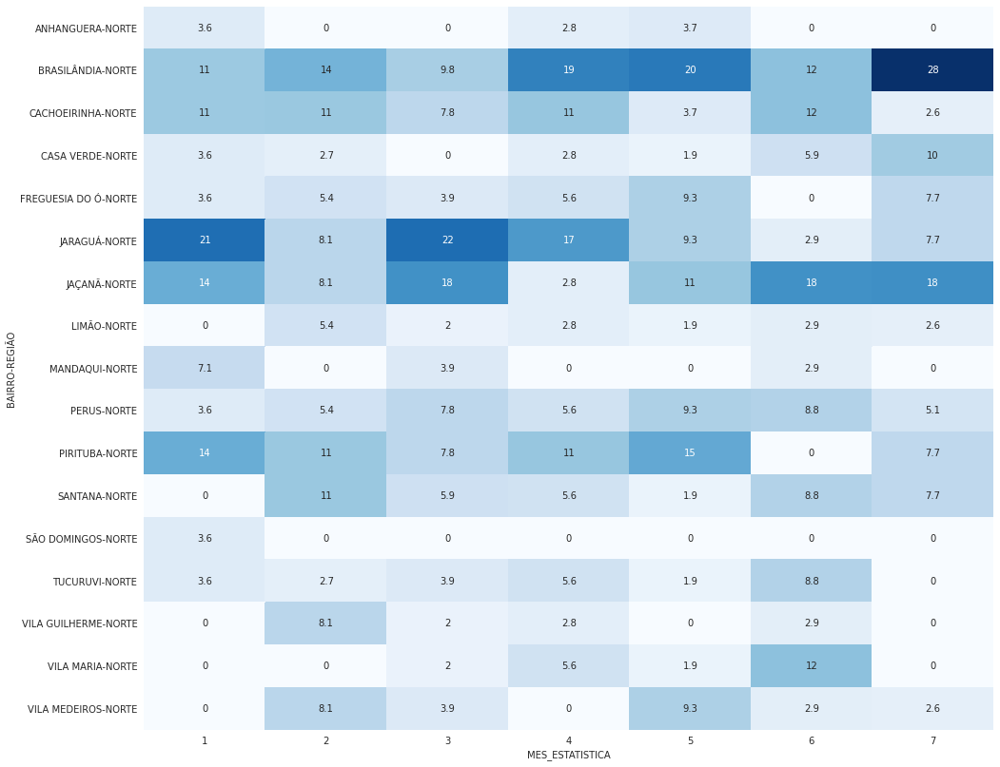

In [264]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_est_n.BAIRRO,database_est_n.REGIÃO], database_est_n.MES_ESTATISTICA, values=database_est_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro de JACANÃ e BRASILÂNDIA são os bairros que mais contribuiram no percentual em todos os meses do  período, apresentando o maior percentual em todos os meses;
 - já o menor percentual é o bairro SÃO DOMINGOS

In [265]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_est_n.REGIÃO,database_est_n.BAIRRO], database_est_n.MES_ESTATISTICA, values=database_est_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
NORTE  ANHANGUERA       25.000000   0.000000   0.000000  25.000000  50.000000   
       BRASILÂNDIA       6.521739  10.869565  10.869565  15.217391  23.913043   
       CACHOEIRINHA     13.636364  18.181818  18.181818  18.181818   9.090909   
       CASA VERDE       10.000000  10.000000   0.000000  10.000000  10.000000   
       FREGUESIA DO Ó    6.666667  13.333333  13.333333  13.333333  33.333333   
       JARAGUÁ          17.142857   8.571429  31.428571  17.142857  14.285714   
       JAÇANÃ           11.111111   8.333333  25.000000   2.777778  16.666667   
       LIMÃO             0.000000  28.571429  14.285714  14.285714  14.285714   
       MANDAQUI         40.000000   0.000000  40.000000   0.000000   0.000000   
       PERUS             5.263158  10.526316  21.052632  10.526316  26.315789   
       PIRITUBA         14.814815  14.814815  14.814815  14.814815  29.629630   
       SANTANA           0.000000  25.000000  18.750000  12.500000   6.250000   
       SÃO DOMINGOS    100.000000   0.000000   0.000000   0.000000   0.000000   
       TUCURUVI         10.000000  10.000000  20.000000  20.000000  10.000000   
       VILA GUILHERME    0.000000  50.000000  16.666667  16.666667   0.000000   
       VILA MARIA        0.000000   0.000000  12.500000  25.000000  12.500000   
       VILA MEDEIROS     0.000000  25.000000  16.666667   0.000000  41.666667   

MES_ESTATISTICA                6          7  
REGIÃO BAIRRO                                
NORTE  ANHANGUERA       0.000000   0.000000  
       BRASILÂNDIA      8.695652  23.913043  
       CACHOEIRINHA    18.181818   4.545455  
       CASA VERDE      20.000000  40.000000  
       FREGUESIA DO Ó   0.000000  20.000000  
       JARAGUÁ          2.857143   8.571429  
       JAÇANÃ          16.666667  19.444444  
       LIMÃO           14.285714  14.285714  
       MANDAQUI        20.000000   0.000000  
       PERUS           15.789474  10.526316  
       PIRITUBA         0.000000  11.111111  
       SANTANA         18.750000  18.750000  
       SÃO DOMINGOS     0.000000   0.000000  
       TUCURUVI        30.000000   0.000000  
       VILA GUILHERME  16.666667   0.000000  
       VILA MARIA      50.000000   0.000000  
       VILA MEDEIROS    8.333333   8.333333

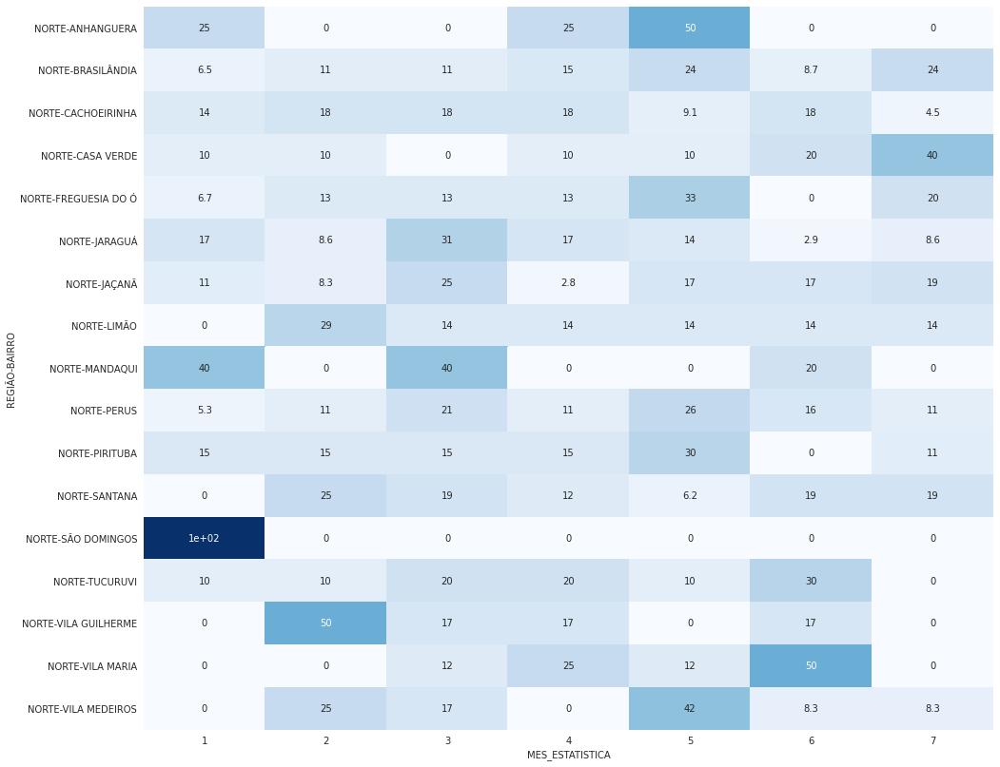

In [266]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_est_n.REGIÃO,database_est_n.BAIRRO], database_est_n.MES_ESTATISTICA, values=database_est_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de estupro nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. 

#### Análise de Ocorrência ESTUPRO na região SUL

In [267]:
#Separando pela região SUL
database_est_s = database_est[database_est['REGIÃO']== 'SUL'].reset_index()

In [268]:
database_est_s

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,10,5331,12/15/2022,9:00:00 AM,VILA MARIANA,0,0,ESTUPRO,1,2023,131624.0,SUL
1,16,9054,1/16/2023,5:00:00 AM,VILA MARIANA,0,0,ESTUPRO,1,2023,131624.0,SUL
2,17,9630,12/30/2022,NaN,IPIRANGA,0,0,ESTUPRO,1,2023,113158.0,SUL
3,18,10726,1/20/2023,9:24:00 AM,JABAQUARA,0,0,ESTUPRO,1,2023,230057.0,SUL
4,19,10727,1/24/2023,10:34:00 AM,JABAQUARA,0,0,ESTUPRO,1,2023,230057.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...,...
400,1399,276133,7/15/2023,NaN,JARDIM ÂNGELA,0,0,ESTUPRO,7,2023,349210.0,SUL
401,1400,276134,7/10/2023,NaN,JARDIM ÂNGELA,0,0,ESTUPRO,7,2023,349210.0,SUL
402,1401,276713,7/20/2023,NaN,CIDADE ADEMAR,0,0,ESTUPRO,7,2023,290143.0,SUL
403,1402,276714,2/6/2023,9:30:00 PM,CIDADE ADEMAR,0,0,ESTUPRO,7,2023,290143.0,SUL


In [269]:
x = database_est_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_est_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_est_s.shape[0])

REGIÃO  BAIRRO         
SUL     GRAJAÚ             67
        JARDIM ÂNGELA      63
        CAMPO LIMPO        49
        CAPÃO REDONDO      49
        CIDADE ADEMAR      41
        CIDADE DUTRA       31
        SACOMÃ             23
        JABAQUARA          19
        IPIRANGA           16
        CAMPO GRANDE       11
        VILA MARIANA        9
        CAMPO BELO          7
        JARDIM SÃO LUÍS     7
        SAÚDE               7
        MARSILAC            3
        MOEMA               3
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
SUL     GRAJAÚ             0.165432
        JARDIM ÂNGELA      0.155556
        CAMPO LIMPO        0.120988
        CAPÃO REDONDO      0.120988
        CIDADE ADEMAR      0.101235
        CIDADE DUTRA       0.076543
        SACOMÃ             0.056790
        JABAQUARA          0.046914
        IPIRANGA           0.039506
        CAMPO GRANDE       0.027160
        VILA MARIANA       0.022222
        CAMPO BELO         0.017284
        JARDI

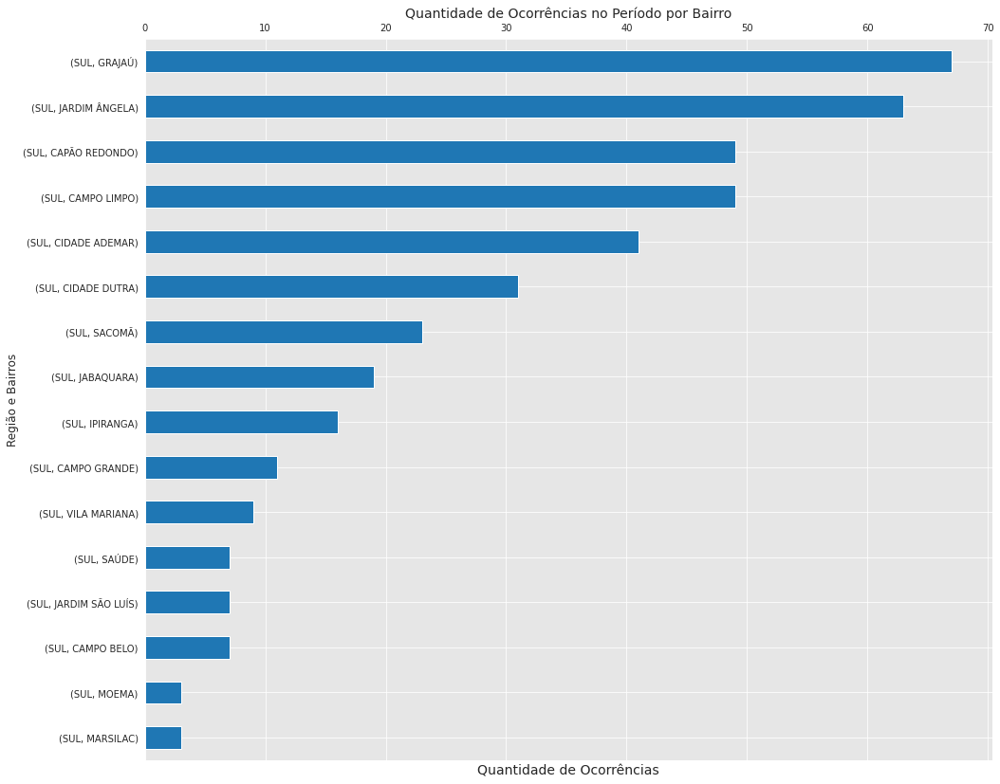

In [270]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_est_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico das ocorrências de estupro somente na região SUL em todo o período. Nota-se que os bairros com o maior número de ocorrências são JARDIM ÂNGELA e GRAJAÚ com um percentual muito acima dos demais bairros.

In [271]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
estupro_cross_s = (pd.crosstab([database_est_s.REGIÃO,database_est_s.BAIRRO], database_est_s.MES_ESTATISTICA, values=database_est_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
estupro_cross_s.reset_index(inplace=True)
estupro_cross_s

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,SUL,CAMPO BELO,0.000000,5.172414,1.25,1.694915,0.000000,2.040816,2.380952,1.728395
1,SUL,CAMPO GRANDE,1.724138,3.448276,1.25,3.389831,5.084746,2.040816,2.380952,2.716049
2,SUL,CAMPO LIMPO,10.344828,6.896552,15.00,15.254237,11.864407,12.244898,11.904762,12.098765
3,SUL,CAPÃO REDONDO,12.068966,12.068966,7.50,6.779661,11.864407,18.367347,21.428571,12.098765
4,SUL,CIDADE ADEMAR,13.793103,17.241379,12.50,6.779661,3.389831,4.081633,11.904762,10.123457
5,SUL,CIDADE DUTRA,8.620690,6.896552,11.25,8.474576,5.084746,6.122449,4.761905,7.654321
6,SUL,GRAJAÚ,17.241379,24.137931,16.25,15.254237,10.169492,16.326531,16.666667,16.543210
7,SUL,IPIRANGA,3.448276,3.448276,3.75,3.389831,6.779661,4.081633,2.380952,3.950617
8,SUL,JABAQUARA,5.172414,5.172414,1.25,6.779661,10.169492,0.000000,4.761905,4.691358
9,SUL,JARDIM SÃO LUÍS,3.448276,0.000000,2.50,3.389831,0.000000,2.040816,0.000000,1.728395


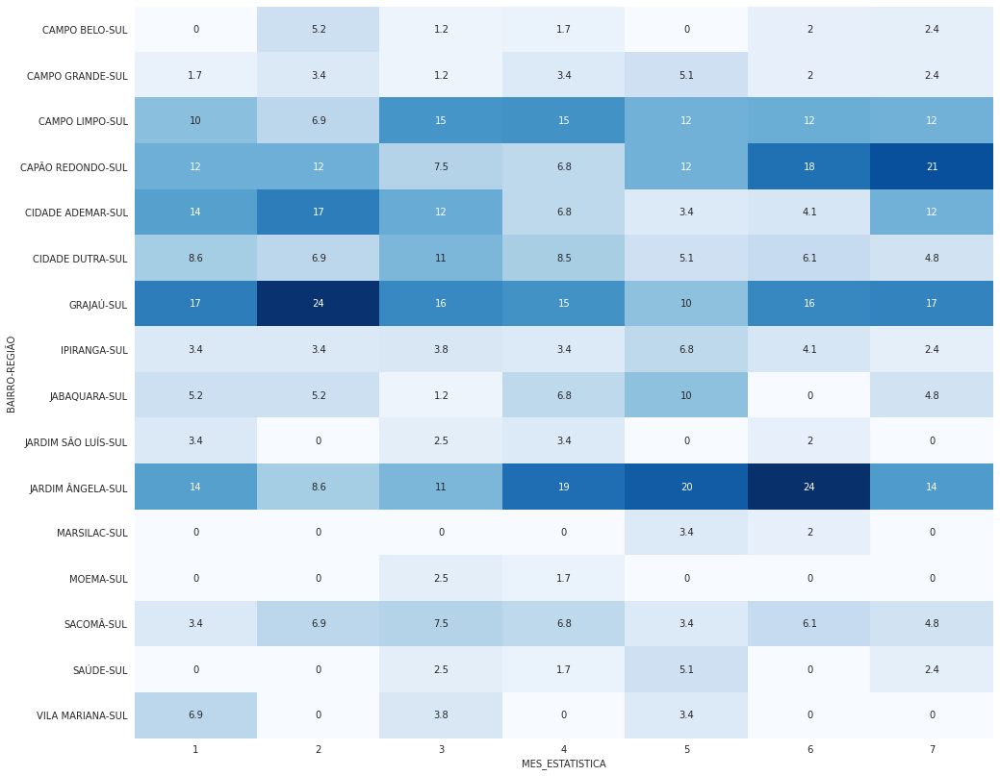

In [272]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_est_s.BAIRRO,database_est_s.REGIÃO], database_est_s.MES_ESTATISTICA, values=database_est_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - os bairros JARDIM ANGELA e CGRAJAÚ realmente saltam aos olhos seus percentuais em relação aos demais bairros, perdurando durante todo o período;
 - já os menores percentuais são os bairros MARSILAC e SVILA MARIANA
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [273]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_est_s.REGIÃO,database_est_s.BAIRRO], database_est_s.MES_ESTATISTICA, values=database_est_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
SUL    CAMPO BELO        0.000000  42.857143  14.285714  14.285714   0.000000   
       CAMPO GRANDE      9.090909  18.181818   9.090909  18.181818  27.272727   
       CAMPO LIMPO      12.244898   8.163265  24.489796  18.367347  14.285714   
       CAPÃO REDONDO    14.285714  14.285714  12.244898   8.163265  14.285714   
       CIDADE ADEMAR    19.512195  24.390244  24.390244   9.756098   4.878049   
       CIDADE DUTRA     16.129032  12.903226  29.032258  16.129032   9.677419   
       GRAJAÚ           14.925373  20.895522  19.402985  13.432836   8.955224   
       IPIRANGA         12.500000  12.500000  18.750000  12.500000  25.000000   
       JABAQUARA        15.789474  15.789474   5.263158  21.052632  31.578947   
       JARDIM SÃO LUÍS  28.571429   0.000000  28.571429  28.571429   0.000000   
       JARDIM ÂNGELA    12.698413   7.936508  14.285714  17.460317  19.047619   
       MARSILAC          0.000000   0.000000   0.000000   0.000000  66.666667   
       MOEMA             0.000000   0.000000  66.666667  33.333333   0.000000   
       SACOMÃ            8.695652  17.391304  26.086957  17.391304   8.695652   
       SAÚDE             0.000000   0.000000  28.571429  14.285714  42.857143   
       VILA MARIANA     44.444444   0.000000  33.333333   0.000000  22.222222   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
SUL    CAMPO BELO       14.285714  14.285714  
       CAMPO GRANDE      9.090909   9.090909  
       CAMPO LIMPO      12.244898  10.204082  
       CAPÃO REDONDO    18.367347  18.367347  
       CIDADE ADEMAR     4.878049  12.195122  
       CIDADE DUTRA      9.677419   6.451613  
       GRAJAÚ           11.940299  10.447761  
       IPIRANGA         12.500000   6.250000  
       JABAQUARA         0.000000  10.526316  
       JARDIM SÃO LUÍS  14.285714   0.000000  
       JARDIM ÂNGELA    19.047619   9.523810  
       MARSILAC         33.333333   0.000000  
       MOEMA             0.000000   0.000000  
       SACOMÃ           13.043478   8.695652  
       SAÚDE             0.000000  14.285714  
       VILA MARIANA      0.000000   0.000000

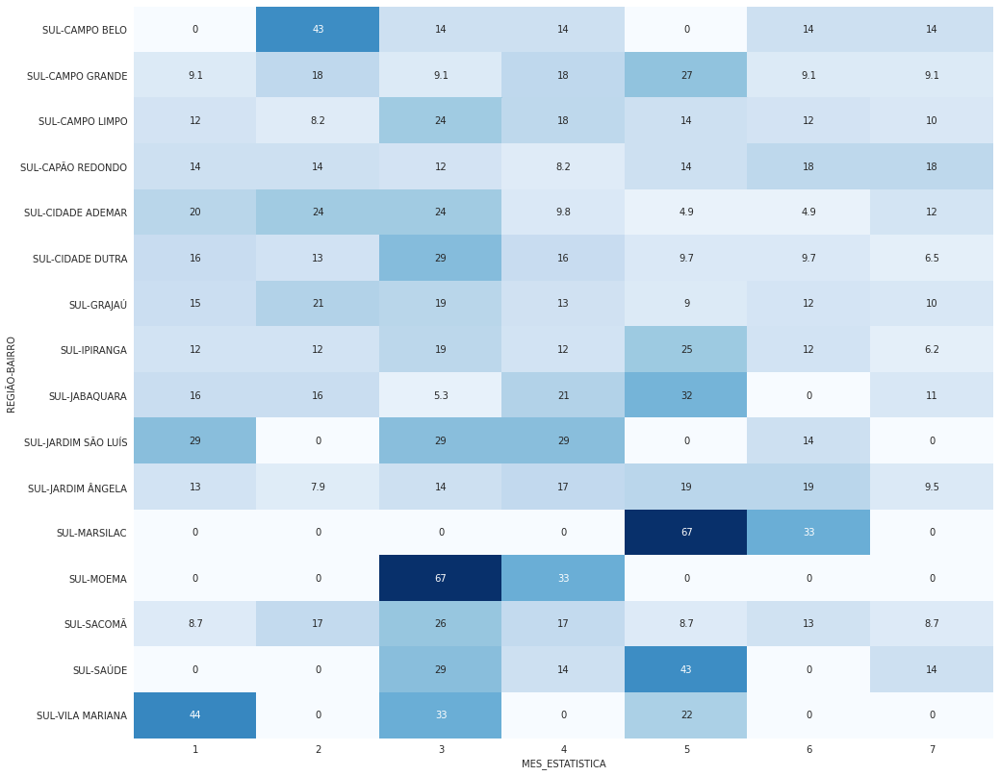

In [274]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_est_s.REGIÃO,database_est_s.BAIRRO], database_est_s.MES_ESTATISTICA, values=database_est_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de estupro nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. Alguns pontos importantes a serem ressaltados:

- praticamente todos os bairros ao longo dos meses apresentam uma distribuição percentual equilibrada
- o bairro MARSILAC e MOEMA apresentam 0% em 5 dos 7 meses também apresentam o maior percentual no mês de maio (MARSILAC) e março (MOEMA)

#### Análise de Ocorrência ESTUPRO na região LESTE

In [275]:
#Separando pela região LESTE
database_est_l = database_est[database_est['REGIÃO']== 'LESTE'].reset_index()

In [276]:
database_est_l

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,12,5699,1/8/2023,12:00:00 PM,BRÁS,0,0,ESTUPRO,1,2023,33770.0,LESTE
1,82,23983,11/3/2022,NaN,CANGAÍBA,0,0,ESTUPRO,1,2023,138562.0,LESTE
2,83,23984,12/23/2022,12:00:00 PM,CANGAÍBA,0,0,ESTUPRO,1,2023,138562.0,LESTE
3,84,23985,1/15/2023,NaN,PENHA,0,0,ESTUPRO,1,2023,128986.0,LESTE
4,85,23986,1/22/2023,NaN,CANGAÍBA,0,0,ESTUPRO,1,2023,138562.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
565,1453,284027,7/5/2023,5:45:00 AM,SAPOPEMBA,0,0,ESTUPRO,7,2023,291648.0,LESTE
566,1454,284028,7/18/2023,NaN,SÃO MATEUS,0,0,ESTUPRO,7,2023,156398.0,LESTE
567,1455,284029,7/29/2023,5:00:00 PM,SÃO MATEUS,0,0,ESTUPRO,7,2023,156398.0,LESTE
568,1456,284311,10/25/2018,2:25:05 PM,SÃO LUCAS,0,0,ESTUPRO,7,2023,142744.0,LESTE


In [277]:
x = database_est_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_est_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_est_l.shape[0])

REGIÃO  BAIRRO            
LESTE   ERMELINO MATARAZZO    44
        SAPOPEMBA             42
        LAJEADO               38
        ITAIM PAULISTA        37
        CIDADE TIRADENTES     30
        ITAQUERA              29
        CIDADE LÍDER          26
        SÃO MATEUS            25
        CANGAÍBA              23
        PENHA                 23
        VILA JACUÍ            22
        VILA CURUÇÁ           20
        GUAIANASES            19
        SÃO LUCAS             18
        VILA PRUDENTE         18
        JARDIM HELENA         18
        ARICANDUVA            18
        SÃO RAFAEL            17
        IGUATEMI              14
        TATUAPÉ               14
        VILA FORMOSA          14
        BRÁS                  11
        CARRÃO                10
        PARQUE DO CARMO        9
        VILA MATILDE           9
        ARTUR ALVIM            8
        BELÉM                  5
        PONTE RASA             5
        ÁGUA RASA              4
Name: BAIRRO, dt

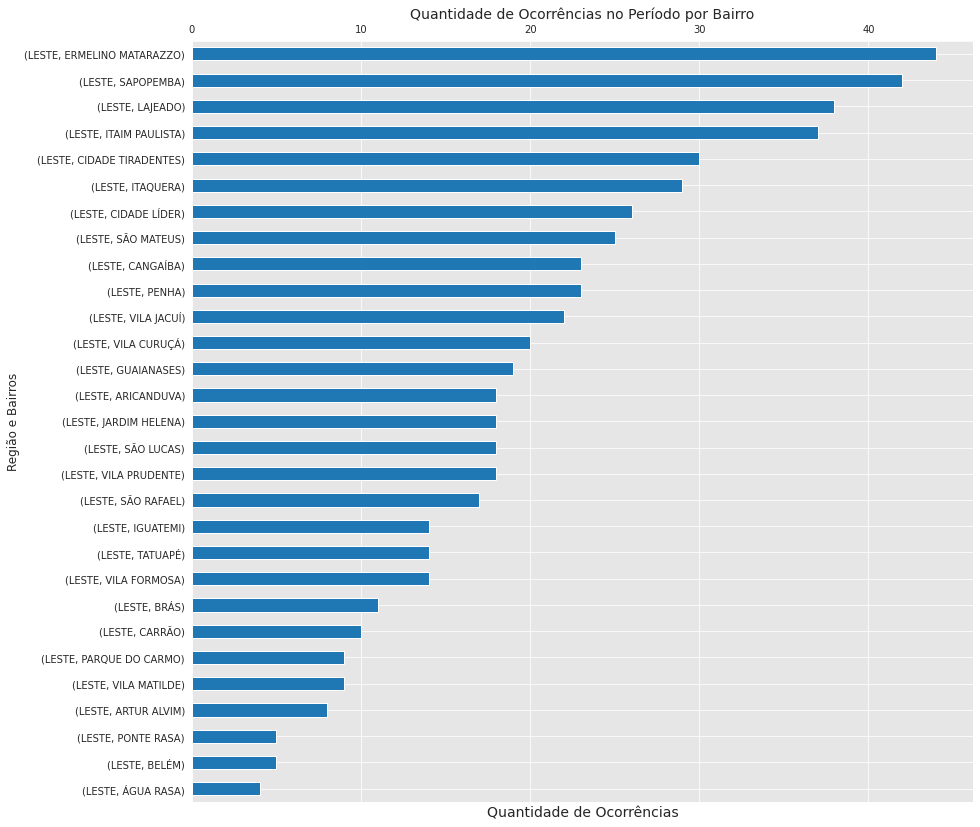

In [278]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_est_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região LESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de estupro é SAPOPEMBA e ERMELINO MATARAZZO.

In [279]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
estupro_cross_l = pd.crosstab([database_est_l.REGIÃO,database_est_l.BAIRRO], database_est_l.MES_ESTATISTICA, values=database_est_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
estupro_cross_l.reset_index(inplace=True)
estupro_cross_l

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,LESTE,ARICANDUVA,0.000000,4.123711,4.255319,0.000000,2.597403,4.705882,5.882353,3.157895
1,LESTE,ARTUR ALVIM,2.739726,3.092784,0.000000,0.000000,1.298701,1.176471,1.470588,1.403509
2,LESTE,BELÉM,1.369863,2.061856,0.000000,1.315789,0.000000,1.176471,0.000000,0.877193
3,LESTE,BRÁS,1.369863,1.030928,0.000000,3.947368,1.298701,3.529412,2.941176,1.929825
4,LESTE,CANGAÍBA,5.479452,2.061856,6.382979,5.263158,2.597403,2.352941,4.411765,4.035088
5,LESTE,CARRÃO,2.739726,0.000000,2.127660,2.631579,1.298701,0.000000,4.411765,1.754386
6,LESTE,CIDADE LÍDER,2.739726,5.154639,2.127660,3.947368,5.194805,4.705882,8.823529,4.561404
7,LESTE,CIDADE TIRADENTES,4.109589,4.123711,4.255319,7.894737,7.792208,2.352941,7.352941,5.263158
8,LESTE,ERMELINO MATARAZZO,8.219178,6.185567,7.446809,13.157895,7.792208,7.058824,4.411765,7.719298
9,LESTE,GUAIANASES,2.739726,2.061856,3.191489,3.947368,2.597403,4.705882,4.411765,3.333333


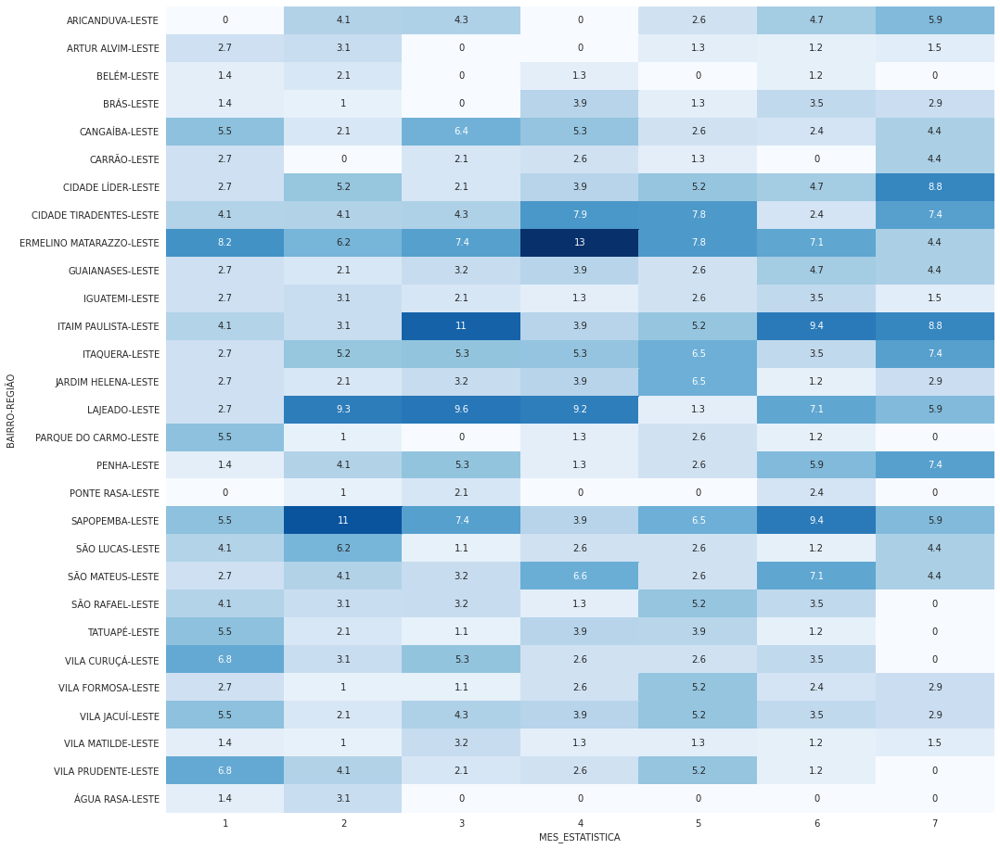

In [280]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_est_l.BAIRRO,database_est_l.REGIÃO], database_est_l.MES_ESTATISTICA, values=database_est_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - os bairros com os maiores percentuais são SAPOPEMBA, ERMELINO MATARAZZO e LAJEADO;
 - os meses com os maiores percentuais são fevereiro, março e abril
 - já os menores percentuais é no bairro ÁGUA RASA

In [281]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_est_l.REGIÃO,database_est_l.BAIRRO], database_est_l.MES_ESTATISTICA, values=database_est_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                    1          2          3          4  \
REGIÃO BAIRRO                                                           
LESTE  ARICANDUVA           0.000000  22.222222  22.222222   0.000000   
       ARTUR ALVIM         25.000000  37.500000   0.000000   0.000000   
       BELÉM               20.000000  40.000000   0.000000  20.000000   
       BRÁS                 9.090909   9.090909   0.000000  27.272727   
       CANGAÍBA            17.391304   8.695652  26.086957  17.391304   
       CARRÃO              20.000000   0.000000  20.000000  20.000000   
       CIDADE LÍDER         7.692308  19.230769   7.692308  11.538462   
       CIDADE TIRADENTES   10.000000  13.333333  13.333333  20.000000   
       ERMELINO MATARAZZO  13.636364  13.636364  15.909091  22.727273   
       GUAIANASES          10.526316  10.526316  15.789474  15.789474   
       IGUATEMI            14.285714  21.428571  14.285714   7.142857   
       ITAIM PAULISTA       8.108108   8.108108  27.027027   8.108108   
       ITAQUERA             6.896552  17.241379  17.241379  13.793103   
       JARDIM HELENA       11.111111  11.111111  16.666667  16.666667   
       LAJEADO              5.263158  23.684211  23.684211  18.421053   
       PARQUE DO CARMO     44.444444  11.111111   0.000000  11.111111   
       PENHA                4.347826  17.391304  21.739130   4.347826   
       PONTE RASA           0.000000  20.000000  40.000000   0.000000   
       SAPOPEMBA            9.523810  26.190476  16.666667   7.142857   
       SÃO LUCAS           16.666667  33.333333   5.555556  11.111111   
       SÃO MATEUS           8.000000  16.000000  12.000000  20.000000   
       SÃO RAFAEL          17.647059  17.647059  17.647059   5.882353   
       TATUAPÉ             28.571429  14.285714   7.142857  21.428571   
       VILA CURUÇÁ         25.000000  15.000000  25.000000  10.000000   
       VILA FORMOSA        14.285714   7.142857   7.142857  14.285714   
       VILA JACUÍ          18.181818   9.090909  18.181818  13.636364   
       VILA MATILDE        11.111111  11.111111  33.333333  11.111111   
       VILA PRUDENTE       27.777778  22.222222  11.111111  11.111111   
       ÁGUA RASA           25.000000  75.000000   0.000000   0.000000   

MES_ESTATISTICA                    5          6          7  
REGIÃO BAIRRO                                               
LESTE  ARICANDUVA          11.111111  22.222222  22.222222  
       ARTUR ALVIM         12.500000  12.500000  12.500000  
       BELÉM                0.000000  20.000000   0.000000  
       BRÁS                 9.090909  27.272727  18.181818  
       CANGAÍBA             8.695652   8.695652  13.043478  
       CARRÃO              10.000000   0.000000  30.000000  
       CIDADE LÍDER        15.384615  15.384615  23.076923  
       CIDADE TIRADENTES   20.000000   6.666667  16.666667  
       ERMELINO MATARAZZO  13.636364  13.636364   6.818182  
       GUAIANASES          10.526316  21.052632  15.789474  
       IGUATEMI            14.285714  21.428571   7.142857  
       ITAIM PAULISTA      10.810811  21.621622  16.216216  
       ITAQUERA            17.241379  10.344828  17.241379  
       JARDIM HELENA       27.777778   5.555556  11.111111  
       LAJEADO              2.631579  15.789474  10.526316  
       PARQUE DO CARMO     22.222222  11.111111   0.000000  
       PENHA                8.695652  21.739130  21.739130  
       PONTE RASA           0.000000  40.000000   0.000000  
       SAPOPEMBA           11.904762  19.047619   9.523810  
       SÃO LUCAS           11.111111   5.555556  16.666667  
       SÃO MATEUS           8.000000  24.000000  12.000000  
       SÃO RAFAEL          23.529412  17.647059   0.000000  
       TATUAPÉ             21.428571   7.142857   0.000000  
       VILA CURUÇÁ         10.000000  15.000000   0.000000  
       VILA FORMOSA        28.571429  14.285714  14.285714  
       VILA JACUÍ          18.181818  13.636364   9.090909  
       VILA MATILDE        1

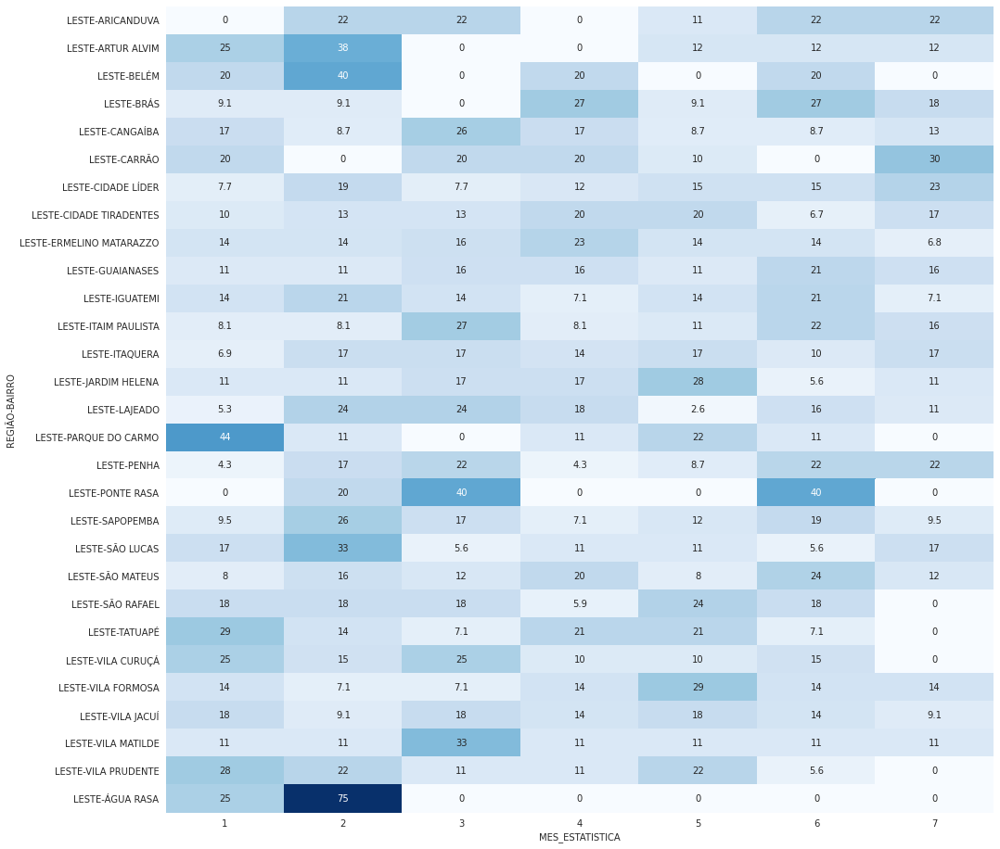

In [282]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_est_l.REGIÃO,database_est_l.BAIRRO], database_est_l.MES_ESTATISTICA, values=database_est_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de estupro nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro.

#### Análise de Ocorrência ESTUPRO na região OESTE

In [283]:
#Separando pela região OESTE
database_est_o = database_est[database_est['REGIÃO']== 'OESTE'].reset_index()

In [284]:
database_est_o

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,26,12744,1/10/2023,8:00:00 PM,LAPA,0,0,ESTUPRO,1,2023,66909.0,OESTE
1,27,12745,1/28/2023,3:59:00 PM,LAPA,0,0,ESTUPRO,1,2023,66909.0,OESTE
2,28,12746,9/1/2022,NaN,LAPA,0,0,ESTUPRO,1,2023,66909.0,OESTE
3,29,13281,12/31/2022,11:30:00 PM,PINHEIROS,0,0,ESTUPRO,1,2023,65509.0,OESTE
4,30,13282,1/16/2023,2:00:40 AM,PINHEIROS,0,0,ESTUPRO,1,2023,65509.0,OESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
122,1322,262805,7/7/2023,7:00:00 AM,RAPOSO TAVARES,0,0,ESTUPRO,7,2023,109052.0,OESTE
123,1323,262806,7/10/2023,NaN,RAPOSO TAVARES,0,0,ESTUPRO,7,2023,109052.0,OESTE
124,1324,262807,7/6/2023,8:00:00 PM,RAPOSO TAVARES,0,0,ESTUPRO,7,2023,109052.0,OESTE
125,1325,262808,7/29/2023,NaN,RAPOSO TAVARES,0,0,ESTUPRO,7,2023,109052.0,OESTE


In [285]:
x = database_est_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_est_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_est_o.shape[0])

REGIÃO  BAIRRO         
OESTE   RAPOSO TAVARES     23
        BUTANTÃ            15
        PINHEIROS          15
        MORUMBI            14
        RIO PEQUENO        14
        LAPA               12
        ITAIM BIBI          9
        JAGUARÉ             9
        JARDIM PAULISTA     5
        BARRA FUNDA         4
        PERDIZES            4
        JAGUARA             3
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
OESTE   RAPOSO TAVARES     0.181102
        BUTANTÃ            0.118110
        PINHEIROS          0.118110
        MORUMBI            0.110236
        RIO PEQUENO        0.110236
        LAPA               0.094488
        ITAIM BIBI         0.070866
        JAGUARÉ            0.070866
        JARDIM PAULISTA    0.039370
        BARRA FUNDA        0.031496
        PERDIZES           0.031496
        JAGUARA            0.023622
Name: BAIRRO, dtype: float64


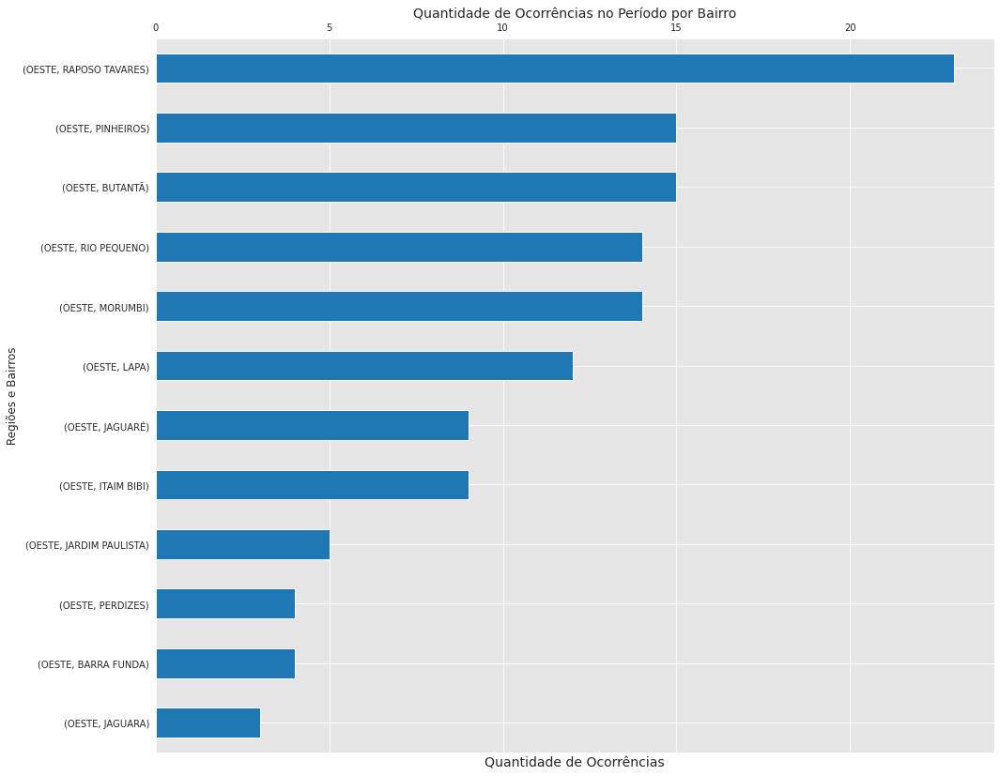

In [286]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_est_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Regiões e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região OESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de estupro é RAPOSO TAVARES  com um percentual 65% maior do que o bairro PINHEIROS (2º posição). Percebe-se que os demais bairros apresentam valores próximos entre si.

In [287]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
estupro_cross_o = pd.crosstab([database_est_o.BAIRRO,database_est_o.REGIÃO], database_est_o.MES_ESTATISTICA, values=database_est_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
estupro_cross_o.reset_index(inplace=True)
estupro_cross_o

MES_ESTATISTICA,BAIRRO,REGIÃO,1,2,3,4,5,6,7,Total
0,BARRA FUNDA,OESTE,4.761905,5.0,4.166667,0.000000,0.000000,0.00,5.882353,3.149606
1,BUTANTÃ,OESTE,9.523810,0.0,12.500000,16.666667,17.647059,12.50,17.647059,11.811024
2,ITAIM BIBI,OESTE,0.000000,5.0,12.500000,16.666667,5.882353,6.25,5.882353,7.086614
3,JAGUARA,OESTE,0.000000,0.0,4.166667,0.000000,5.882353,6.25,0.000000,2.362205
4,JAGUARÉ,OESTE,14.285714,10.0,4.166667,0.000000,11.764706,6.25,0.000000,7.086614
5,JARDIM PAULISTA,OESTE,0.000000,10.0,0.000000,0.000000,5.882353,0.00,11.764706,3.937008
6,LAPA,OESTE,14.285714,15.0,12.500000,0.000000,11.764706,6.25,0.000000,9.448819
7,MORUMBI,OESTE,4.761905,25.0,4.166667,16.666667,0.000000,12.50,17.647059,11.023622
8,PERDIZES,OESTE,0.000000,5.0,4.166667,0.000000,5.882353,6.25,0.000000,3.149606
9,PINHEIROS,OESTE,9.523810,15.0,4.166667,8.333333,17.647059,18.75,11.764706,11.811024


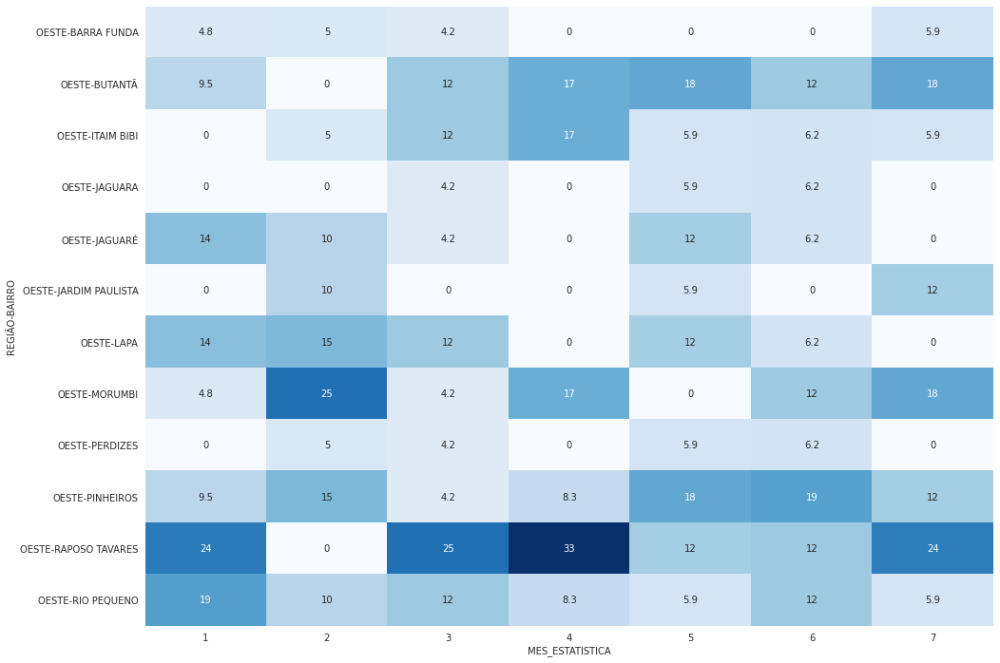

In [288]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_est_o.REGIÃO,database_est_o.BAIRRO], database_est_o.MES_ESTATISTICA, values=database_est_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - o bairro de RAPOSO TAVARES é o bairro que mais contribuiu no percentual em todos os meses do período, apresentando o maior percentual em todos os meses, enquanto PINHEIROS apresenta valores altos a partir de maio;
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [289]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_est_o.REGIÃO,database_est_o.BAIRRO], database_est_o.MES_ESTATISTICA, values=database_est_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                 1          2          3          4          5  \
REGIÃO BAIRRO                                                                   
OESTE  BARRA FUNDA      25.000000  25.000000  25.000000   0.000000   0.000000   
       BUTANTÃ          13.333333   0.000000  20.000000  13.333333  20.000000   
       ITAIM BIBI        0.000000  11.111111  33.333333  22.222222  11.111111   
       JAGUARA           0.000000   0.000000  33.333333   0.000000  33.333333   
       JAGUARÉ          33.333333  22.222222  11.111111   0.000000  22.222222   
       JARDIM PAULISTA   0.000000  40.000000   0.000000   0.000000  20.000000   
       LAPA             25.000000  25.000000  25.000000   0.000000  16.666667   
       MORUMBI           7.142857  35.714286   7.142857  14.285714   0.000000   
       PERDIZES          0.000000  25.000000  25.000000   0.000000  25.000000   
       PINHEIROS        13.333333  20.000000   6.666667   6.666667  20.000000   
       RAPOSO TAVARES   21.739130   0.000000  26.086957  17.391304   8.695652   
       RIO PEQUENO      28.571429  14.285714  21.428571   7.142857   7.142857   

MES_ESTATISTICA                 6          7  
REGIÃO BAIRRO                                 
OESTE  BARRA FUNDA       0.000000  25.000000  
       BUTANTÃ          13.333333  20.000000  
       ITAIM BIBI       11.111111  11.111111  
       JAGUARA          33.333333   0.000000  
       JAGUARÉ          11.111111   0.000000  
       JARDIM PAULISTA   0.000000  40.000000  
       LAPA              8.333333   0.000000  
       MORUMBI          14.285714  21.428571  
       PERDIZES         25.000000   0.000000  
       PINHEIROS        20.000000  13.333333  
       RAPOSO TAVARES    8.695652  17.391304  
       RIO PEQUENO      14.285714   7.142857

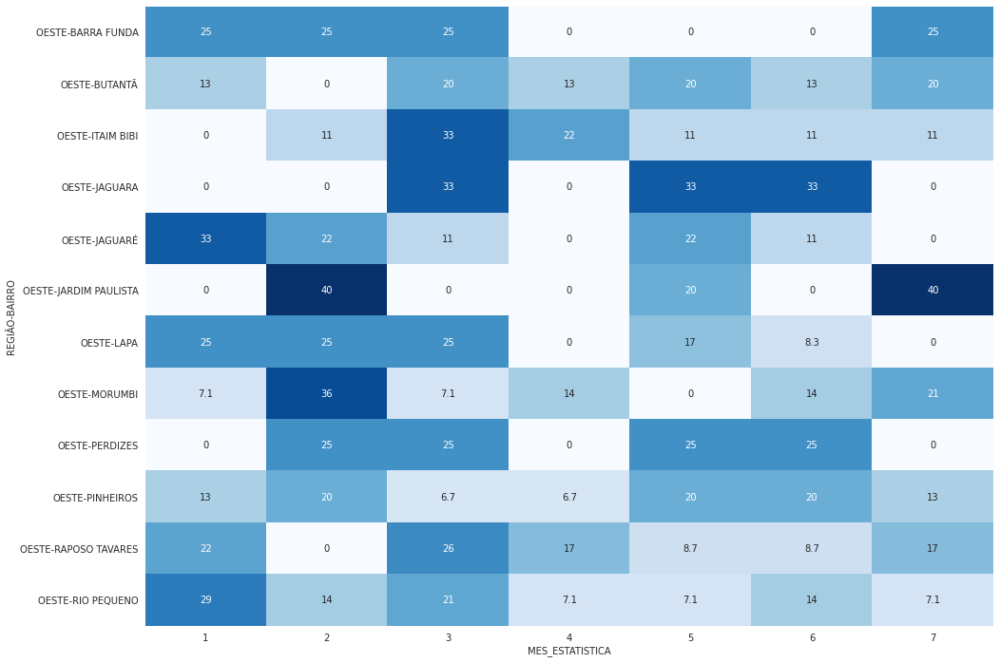

In [290]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_est_o.REGIÃO,database_est_o.BAIRRO], database_est_o.MES_ESTATISTICA, values=database_est_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de estupro nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro onde mostra que em janeio e fevereiro apresenta altos valores em PERDIZES e RAPOSO TAVARES e em maio e junho, apresentando aumento nos mesmos bairros

#### Análise de Ocorrência ESTUPRO na região CENTRAL

In [291]:
#Separando pela região CENTRAL
database_est_c = database_est[database_est['REGIÃO']== 'CENTRO'].reset_index()

In [292]:
database_est_c

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,0,102,1/12/2023,9:00:19 PM,SÉ,0,0,ESTUPRO,1,2023,27241.0,CENTRO
1,1,1779,1/9/2023,4:00:47 PM,BOM RETIRO,0,0,ESTUPRO,1,2023,39856.0,CENTRO
2,2,1780,1/20/2023,7:00:57 PM,BOM RETIRO,0,0,ESTUPRO,1,2023,39856.0,CENTRO
3,3,2164,1/1/2023,6:39:00 AM,REPÚBLICA,0,0,ESTUPRO,1,2023,62203.0,CENTRO
4,4,2165,1/19/2023,NaN,REPÚBLICA,0,0,ESTUPRO,1,2023,62203.0,CENTRO
...,...,...,...,...,...,...,...,...,...,...,...,...
72,1287,246501,7/2/2023,2:25:00 PM,REPÚBLICA,0,0,ESTUPRO,7,2023,62203.0,CENTRO
73,1289,248661,6/5/2023,1:30:00 PM,BELA VISTA,0,0,ESTUPRO,7,2023,73508.0,CENTRO
74,1290,249289,7/2/2023,2:30:16 PM,LIBERDADE,0,0,ESTUPRO,7,2023,73170.0,CENTRO
75,1291,249290,2/14/2023,11:00:00 PM,LIBERDADE,0,0,ESTUPRO,7,2023,73170.0,CENTRO


In [293]:
x = database_est_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_est_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_est_c.shape[0])

REGIÃO  BAIRRO       
CENTRO  LIBERDADE        14
        SÉ               13
        REPÚBLICA        12
        CONSOLAÇÃO        9
        BELA VISTA        8
        BOM RETIRO        7
        CAMBUCI           7
        SANTA CECÍLIA     7
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
CENTRO  LIBERDADE        0.181818
        SÉ               0.168831
        REPÚBLICA        0.155844
        CONSOLAÇÃO       0.116883
        BELA VISTA       0.103896
        BOM RETIRO       0.090909
        CAMBUCI          0.090909
        SANTA CECÍLIA    0.090909
Name: BAIRRO, dtype: float64


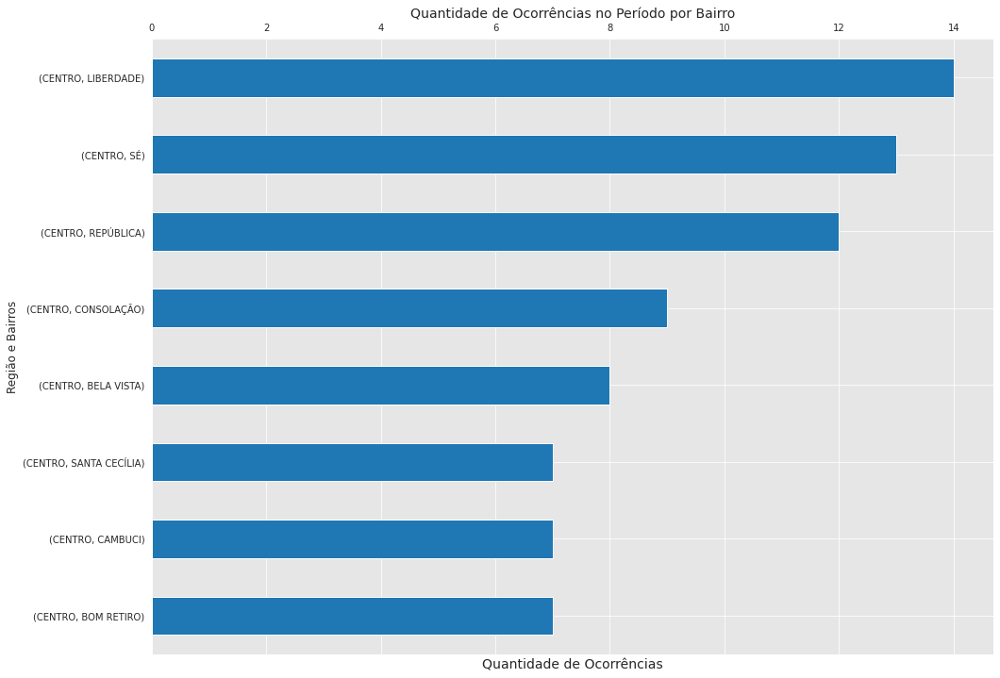

In [294]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 12))
ax = (database_est_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que os bairros com o maior número de ocorrências de estupro são LIBERDADE, SÉ, e REPÚBLICA. Os demais bairros apresentam valores próximos entre si.

In [295]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
estupro_cross_c = (pd.crosstab([database_est_c.REGIÃO,database_est_c.BAIRRO], database_est_c.MES_ESTATISTICA, values=database_est_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
estupro_cross_c.reset_index(inplace=True)
estupro_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,CENTRO,BELA VISTA,28.571429,18.181818,0.000000,0.000000,12.5,0.000000,14.285714,10.389610
1,CENTRO,BOM RETIRO,14.285714,0.000000,18.181818,5.263158,0.0,14.285714,14.285714,9.090909
2,CENTRO,CAMBUCI,14.285714,9.090909,0.000000,10.526316,12.5,14.285714,0.000000,9.090909
3,CENTRO,CONSOLAÇÃO,7.142857,18.181818,9.090909,5.263158,25.0,28.571429,0.000000,11.688312
4,CENTRO,LIBERDADE,7.142857,18.181818,18.181818,21.052632,12.5,28.571429,28.571429,18.181818
5,CENTRO,REPÚBLICA,14.285714,9.090909,18.181818,21.052632,12.5,14.285714,14.285714,15.584416
6,CENTRO,SANTA CECÍLIA,7.142857,0.000000,0.000000,15.789474,25.0,0.000000,14.285714,9.090909
7,CENTRO,SÉ,7.142857,27.272727,36.363636,21.052632,0.0,0.000000,14.285714,16.883117


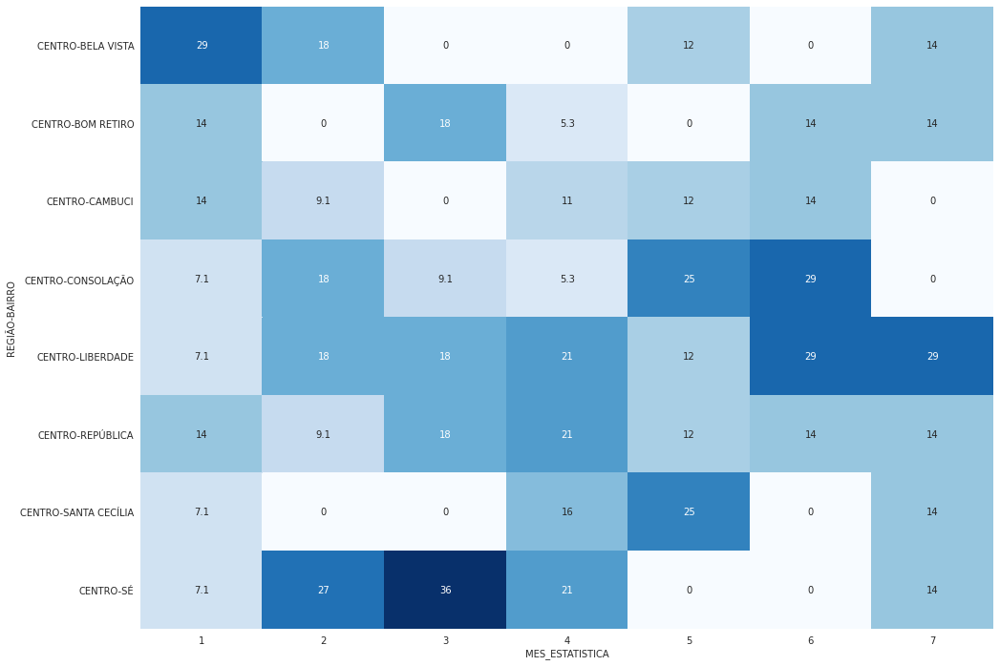

In [296]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_est_c.REGIÃO,database_est_c.BAIRRO], database_est_c.MES_ESTATISTICA, values=database_est_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - so bairros da REPÚBLICA e BELA VISTA apresentam valores altos nos dois primeiros meses; SÉ, LIBERDADE e  REPÚBLICA apresentam alto números no meio do período e CONSOLAÇÃO e LIBERDADE no final do período
 - já os menores percentuais é BOM RETIRO
 - à exceção dos mencionado acima, os demais bairros apresentam percentuais bem próximos entre si

In [297]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_est_c.REGIÃO,database_est_c.BAIRRO], database_est_c.MES_ESTATISTICA, values=database_est_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA               1          2          3          4          5  \
REGIÃO BAIRRO                                                                 
CENTRO BELA VISTA     50.000000  25.000000   0.000000   0.000000  12.500000   
       BOM RETIRO     28.571429   0.000000  28.571429  14.285714   0.000000   
       CAMBUCI        28.571429  14.285714   0.000000  28.571429  14.285714   
       CONSOLAÇÃO     11.111111  22.222222  11.111111  11.111111  22.222222   
       LIBERDADE       7.142857  14.285714  14.285714  28.571429   7.142857   
       REPÚBLICA      16.666667   8.333333  16.666667  33.333333   8.333333   
       SANTA CECÍLIA  14.285714   0.000000   0.000000  42.857143  28.571429   
       SÉ              7.692308  23.076923  30.769231  30.769231   0.000000   

MES_ESTATISTICA               6          7  
REGIÃO BAIRRO                               
CENTRO BELA VISTA      0.000000  12.500000  
       BOM RETIRO     14.285714  14.285714  
       CAMBUCI        14.285714   0.000000  
       CONSOLAÇÃO     22.222222   0.000000  
       LIBERDADE      14.285714  14.285714  
       REPÚBLICA       8.333333   8.333333  
       SANTA CECÍLIA   0.000000  14.285714  
       SÉ              0.000000   7.692308

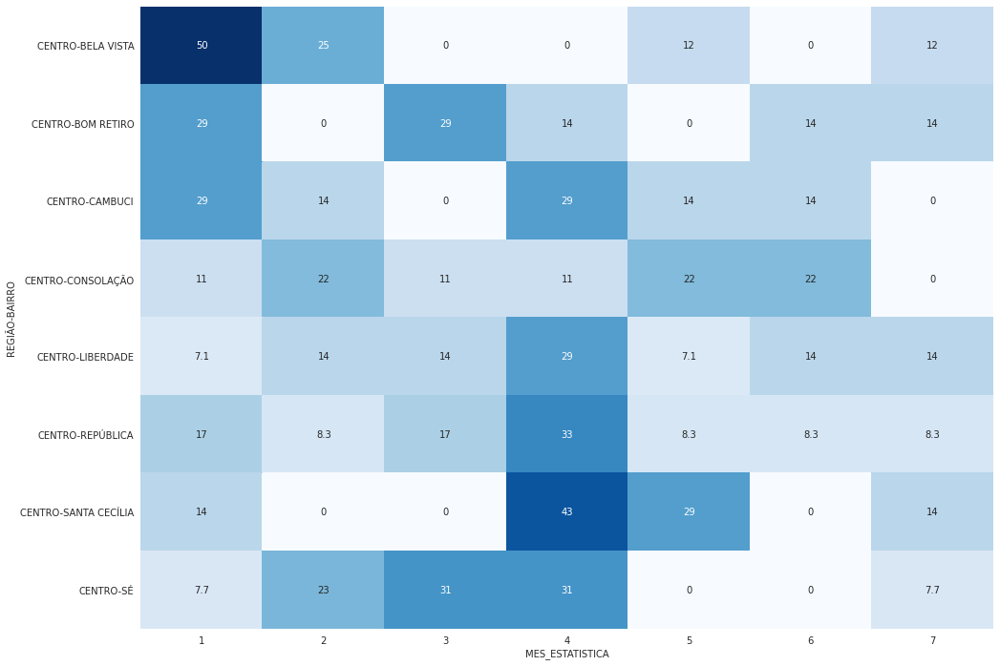

In [298]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_est_c.REGIÃO,database_est_c.BAIRRO], database_est_c.MES_ESTATISTICA, values=database_est_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de estupro nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro, onde verifica-se um grande aumento quase generalizado no mês de abril em todos os bairros.

### Analisando Ocorrências: HOMICÍDIO

Com o intuito de realizar uma análise mais detalhada, o conjunto de dados será separado por tipo de ocorrência, onde agora será analisado a ocorrência HOMICÍDIO.

In [299]:
#Separando por tipo de ocorrência
database_homic = database.loc[database['NATUREZA_APURADA']== 'HOMICÍDIO'].reset_index()
database_homic

,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,50,1/26/2023,5:55:00,PERUS,NaN,NaN,HOMICÍDIO,1,2023,91725.0,NORTE
1,51,12/31/2022,23:51:00,CAMPO LIMPO,NaN,NaN,HOMICÍDIO,1,2023,233057.0,SUL
2,52,1/1/2023,5:00:00,LIBERDADE,"-23,56192055","-46,62395599",HOMICÍDIO,1,2023,73170.0,CENTRO
3,54,1/1/2023,5:51:00,JARDIM ÂNGELA,"-23,66022977","-46,75487178",HOMICÍDIO,1,2023,349210.0,SUL
4,55,1/1/2023,23:45:00,GRAJAÚ,"-23,7532485","-46,69715545",HOMICÍDIO,1,2023,398040.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...
233,284641,5/6/2023,19:02:00,ITAIM PAULISTA,0,0,HOMICÍDIO,5,2023,238478.0,LESTE
234,284642,5/11/2023,15:20:00,SANTANA,"-23,50076","-46,6259081",HOMICÍDIO,5,2023,111492.0,NORTE
235,284643,4/18/2023,7:30:00,JABAQUARA,"-23,65309721","-46,64486597",HOMICÍDIO,5,2023,230057.0,SUL
236,284645,7/6/2023,10:30:00 AM,PERDIZES,"-23,52932154","-46,68020585",HOMICÍDIO,7,2023,114669.0,OESTE


In [300]:
#Agrupando e contando as ocorrências em cada mês
database.loc[database['NATUREZA_APURADA']== 'HOMICÍDIO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()

MES_ESTATISTICA
1    37
2    28
3    35
4    46
5    37
6    33
7    22
Name: ANO_ESTATISTICA, dtype: int64

In [301]:
#Percentual de ocorrências por mês
database.loc[database['NATUREZA_APURADA']== 'HOMICÍDIO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()/database_homic.shape[0]

MES_ESTATISTICA
1    0.155462
2    0.117647
3    0.147059
4    0.193277
5    0.155462
6    0.138655
7    0.092437
Name: ANO_ESTATISTICA, dtype: float64

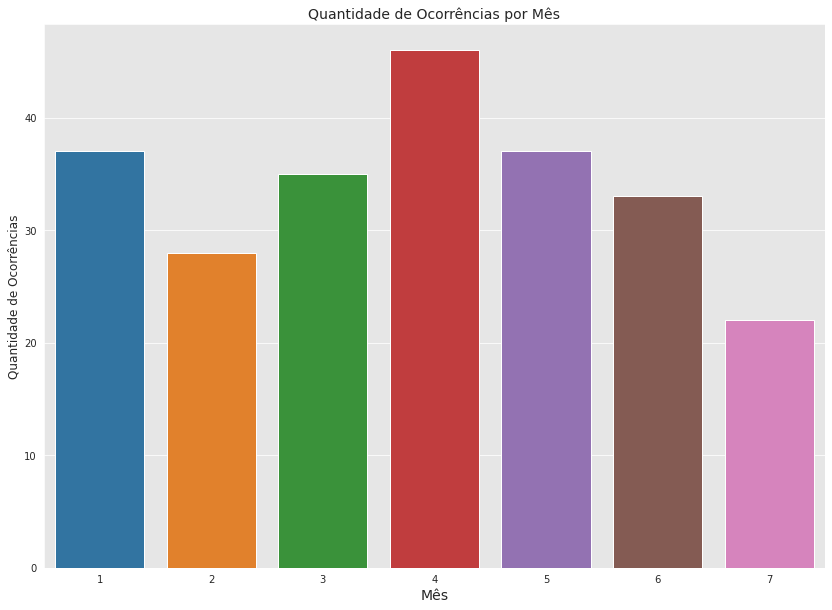

In [302]:
#Plotando o gráfico
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_homic,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade das ocorrências de homicídio totais distribuídas pelos meses em questão. Percecebe-se os meses de JANEIRO, MARÇO, MAIO e JUNHO apresentam valores bem próximos. As exceções não os meses de FEVEREIRO com uma queda em comparação com JANEIRO e o mês de ABRIL apresentando uma grande elevação dos valores comparado com o mês anterior. JULHO apresenta o menor valor do período. 

In [303]:
#Ocorrencias por região
database_homic.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)

REGIÃO
SUL       74
LESTE     61
NORTE     44
OESTE     32
CENTRO    27
Name: NATUREZA_APURADA, dtype: int64

In [304]:
#Percental de ocorrências por bairro e região
database_homic.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)/database_homic.shape[0]

REGIÃO
SUL       0.310924
LESTE     0.256303
NORTE     0.184874
OESTE     0.134454
CENTRO    0.113445
Name: NATUREZA_APURADA, dtype: float64

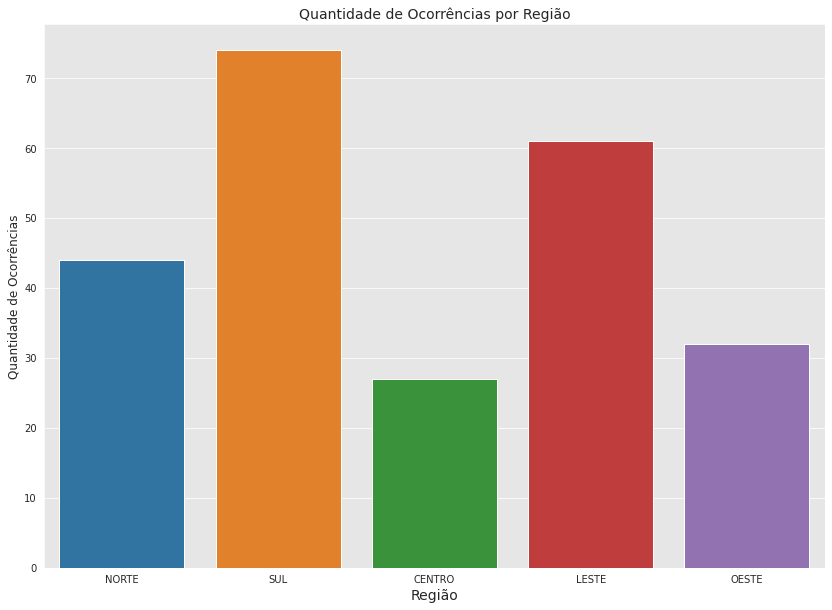

In [305]:
#Gráfico de ocorrências por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_homic,x='REGIÃO')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Região', fontsize=14)
plt.show()

In [306]:
#Ocorrencias por região
database_homic['BAIRRO'].value_counts()

JARDIM ÂNGELA    17
CAMPO LIMPO      14
JAÇANÃ            9
CAPÃO REDONDO     8
BRASILÂNDIA       8
                 ..
VILA MATILDE      1
ARICANDUVA        1
VILA CURUÇÁ       1
LAPA              1
MOEMA             1
Name: BAIRRO, Length: 63, dtype: int64

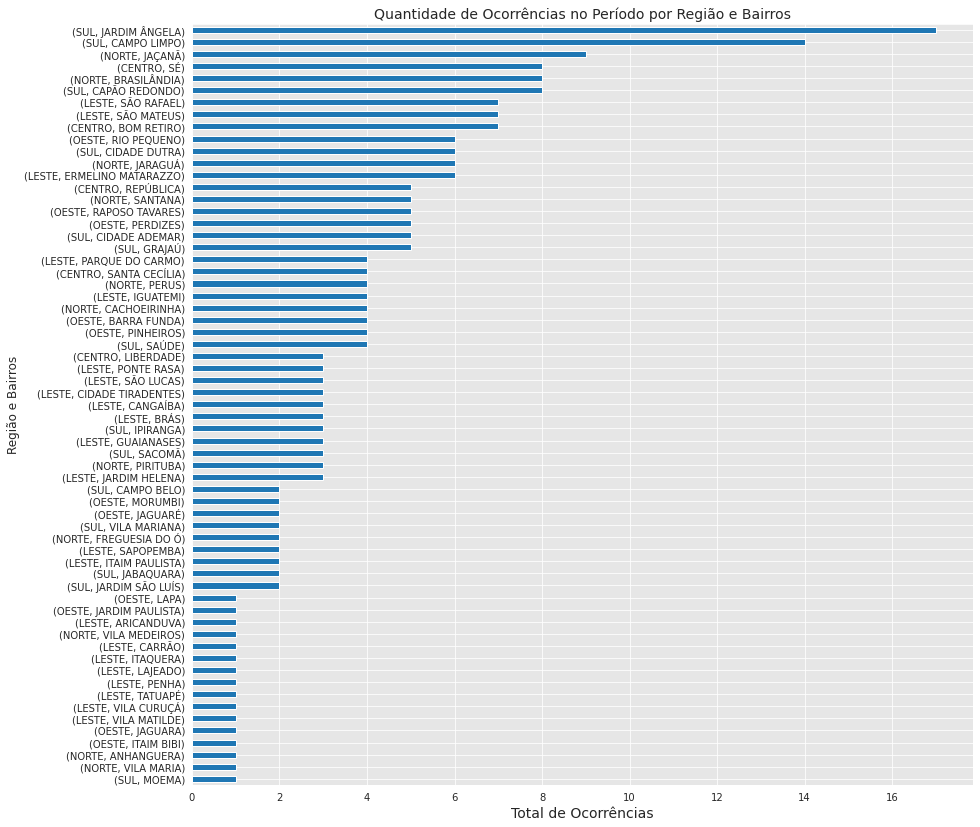

In [307]:
#Plotando o gráfico Quantidade de ocorrências no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_homic.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Total de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Região e Bairros', fontsize=14)
ag.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de homicídio por região e bairro no período onde percebe-se que os bairros JARDIM ÂNGELA e CAMPO LIMPO apresentam valores bem acima dos demais bairros. 

In [308]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_homic.BAIRRO,database_homic.REGIÃO], database_homic.MES_ESTATISTICA, values=database_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7,Total
BAIRRO,REGIÃO,,,,,,,,
ANHANGUERA,NORTE,0.000000,0.000000,0.000000,0.000000,2.702703,0.000000,0.000000,0.420168
ARICANDUVA,LESTE,0.000000,0.000000,0.000000,0.000000,2.702703,0.000000,0.000000,0.420168
BARRA FUNDA,OESTE,2.702703,0.000000,0.000000,2.173913,0.000000,0.000000,9.090909,1.680672
BOM RETIRO,CENTRO,5.405405,0.000000,5.714286,0.000000,2.702703,3.030303,4.545455,2.941176
BRASILÂNDIA,NORTE,0.000000,7.142857,5.714286,4.347826,0.000000,3.030303,4.545455,3.361345
...,...,...,...,...,...,...,...,...,...
VILA CURUÇÁ,LESTE,0.000000,0.000000,0.000000,0.000000,0.000000,3.030303,0.000000,0.420168
VILA MARIA,NORTE,0.000000,0.000000,0.000000,2.173913,0.000000,0.000000,0.000000,0.420168
VILA MARIANA,SUL,0.000000,0.000000,0.000000,2.173913,0.000000,0.000000,4.545455,0.840336


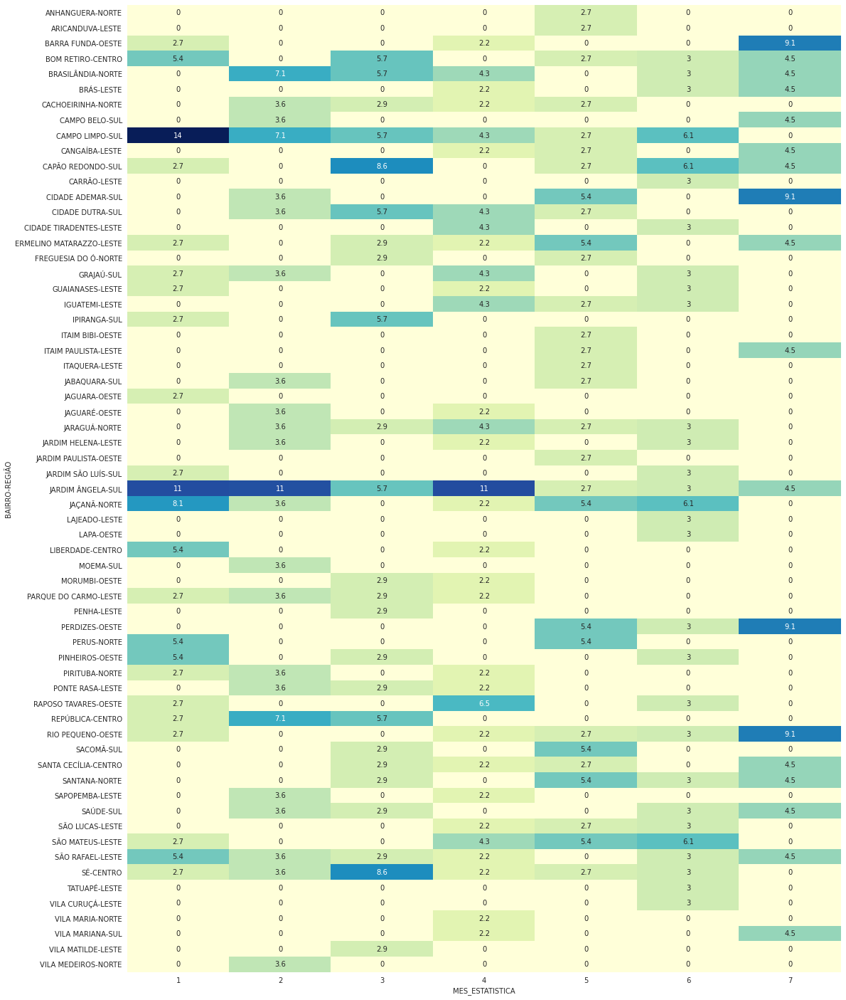

In [309]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(18,25))
sns.heatmap((pd.crosstab([database_homic.BAIRRO,database_homic.REGIÃO], database_homic.MES_ESTATISTICA, values=database_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de estupros registrados em cada mês. Algumas pontos importantes que valem ressaltar:

         
|    JANEIRO      |   FEVEREIRO     |       MARÇO       |       ABRIL      |      MAIO        |       JUNHO       |      JULHO     |
|:---------------:|:---------------:|:-----------------:|:----------------:|:----------------:|:-----------------:|:---------------:|
|CAMPO LIMPO **14%** |JD. ÂNGELA **11%** |CAPÃO RED  **8.6%** |JD. ÂNGELA **11%** |CID. ADEMAR **5.4%** |JAÇANÃ **6.1%** |CID. ADEMAR  **6.1%**|
|JD. ÂNGELA **11%** |CAMPO LIMPO **7.1%** |SÉ  **8.6%** |R. TAVARES **6.6%** |JAÇANÃ **5.4%** |CAPÃO RED  **6.1%** |PERDIZES **6.1%**|
|JAÇANÃ **8%** |BRASILÂNDIA **7.1%** |CAMPO LIMPO **5.7%** |CAMPO LIMPO  **4.3%** |SANTANA  **5.4%** |CAMPO LIMPO **6.1%** |RIO PEQUENO **6.1%**|


Analisando as distribuições de ocorrênias pelos bairros em cada mês, notase que em todos os meses pelo há pelo menos 1 bairro da região SUL na tabela com os maiores percentuais Praticamente todos os demais bairros apresentaram percentuais oscilando entre 0% e 3% durante todo o período.

In [310]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_homic.BAIRRO,database_homic.REGIÃO], database_homic.MES_ESTATISTICA, values=database_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7
BAIRRO,REGIÃO,,,,,,,
ANHANGUERA,NORTE,0.000000,0.0,0.000000,0.0,100.000000,0.000000,0.000000
ARICANDUVA,LESTE,0.000000,0.0,0.000000,0.0,100.000000,0.000000,0.000000
BARRA FUNDA,OESTE,25.000000,0.0,0.000000,25.0,0.000000,0.000000,50.000000
BOM RETIRO,CENTRO,28.571429,0.0,28.571429,0.0,14.285714,14.285714,14.285714
BRASILÂNDIA,NORTE,0.000000,25.0,25.000000,25.0,0.000000,12.500000,12.500000
...,...,...,...,...,...,...,...,...
VILA CURUÇÁ,LESTE,0.000000,0.0,0.000000,0.0,0.000000,100.000000,0.000000
VILA MARIA,NORTE,0.000000,0.0,0.000000,100.0,0.000000,0.000000,0.000000
VILA MARIANA,SUL,0.000000,0.0,0.000000,50.0,0.000000,0.000000,50.000000


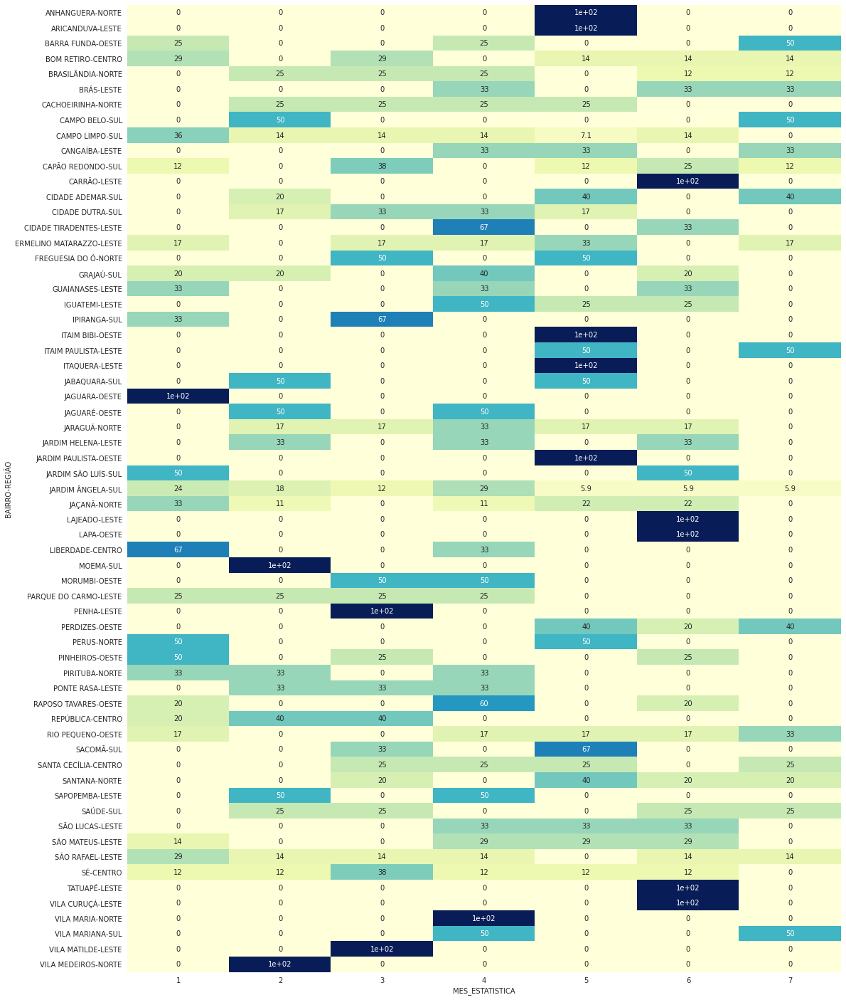

In [311]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(18,25))
sns.heatmap((pd.crosstab([database_homic.BAIRRO,database_homic.REGIÃO], database_homic.MES_ESTATISTICA, values=database_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A mesma análise acima foi feita, porém agora analisando cada bairro ao longo do período (JANEIRO a JULHO), ou seja, em um determinado bairro, de todas as ocorrências de homicídio, quais os percentuais em cada mês em relação ao total. Alguns pontos importantes a serem ressaltados:

 - de todos os bairros listados, 17 deles apresentam 50% dos casos nos primeiros 2 meses do período
 - o mês de abril e maio apresentam a maior quantidade de bairros com aumento percentual

#### Análise de Ocorrência HOMICÍDIO na região NORTE

In [312]:
#Separando pela região NORTE
database_homic_n = database_homic[database_homic['REGIÃO']== 'NORTE'].reset_index()

In [313]:
database_homic_n

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,0,50,1/26/2023,5:55:00,PERUS,NaN,NaN,HOMICÍDIO,1,2023,91725.0,NORTE
1,5,56,1/2/2023,7:37:00,JAÇANÃ,"-23,42657441","-46,58729082",HOMICÍDIO,1,2023,96412.0,NORTE
2,16,71,1/14/2023,20:57:00,JAÇANÃ,"-23,44643001","-46,58985529",HOMICÍDIO,1,2023,96412.0,NORTE
3,29,86,1/27/2023,16:30:00,JAÇANÃ,"-23,41934919","-46,57954335",HOMICÍDIO,1,2023,96412.0,NORTE
4,30,87,1/27/2023,20:10:00,PIRITUBA,"-23,50745639","-46,7081391",HOMICÍDIO,1,2023,171585.0,NORTE
5,35,92,1/29/2023,12:45:00,PERUS,"-23,4015957","-46,74732866",HOMICÍDIO,1,2023,91725.0,NORTE
6,45,60658,2/10/2023,10:56:00 PM,BRASILÂNDIA,"-23,52909924","-46,73902687",HOMICÍDIO,2,2023,287033.0,NORTE
7,47,62924,2/21/2023,2:18:00 PM,CACHOEIRINHA,"-23,4596147","-46,6616986",HOMICÍDIO,2,2023,147821.0,NORTE
8,48,63325,2/25/2023,12:45:00 AM,VILA MEDEIROS,"-23,49528915","-46,59271721",HOMICÍDIO,2,2023,122483.0,NORTE
9,49,63798,2/24/2023,3:26:00 PM,BRASILÂNDIA,"-23,46384169","-46,69324527",HOMICÍDIO,2,2023,287033.0,NORTE


In [314]:
x = database_homic_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_homic_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_homic_n.shape[0])

REGIÃO  BAIRRO        
NORTE   JAÇANÃ            9
        BRASILÂNDIA       8
        JARAGUÁ           6
        SANTANA           5
        CACHOEIRINHA      4
        PERUS             4
        PIRITUBA          3
        FREGUESIA DO Ó    2
        ANHANGUERA        1
        VILA MARIA        1
        VILA MEDEIROS     1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        
NORTE   JAÇANÃ            0.204545
        BRASILÂNDIA       0.181818
        JARAGUÁ           0.136364
        SANTANA           0.113636
        CACHOEIRINHA      0.090909
        PERUS             0.090909
        PIRITUBA          0.068182
        FREGUESIA DO Ó    0.045455
        ANHANGUERA        0.022727
        VILA MARIA        0.022727
        VILA MEDEIROS     0.022727
Name: BAIRRO, dtype: float64


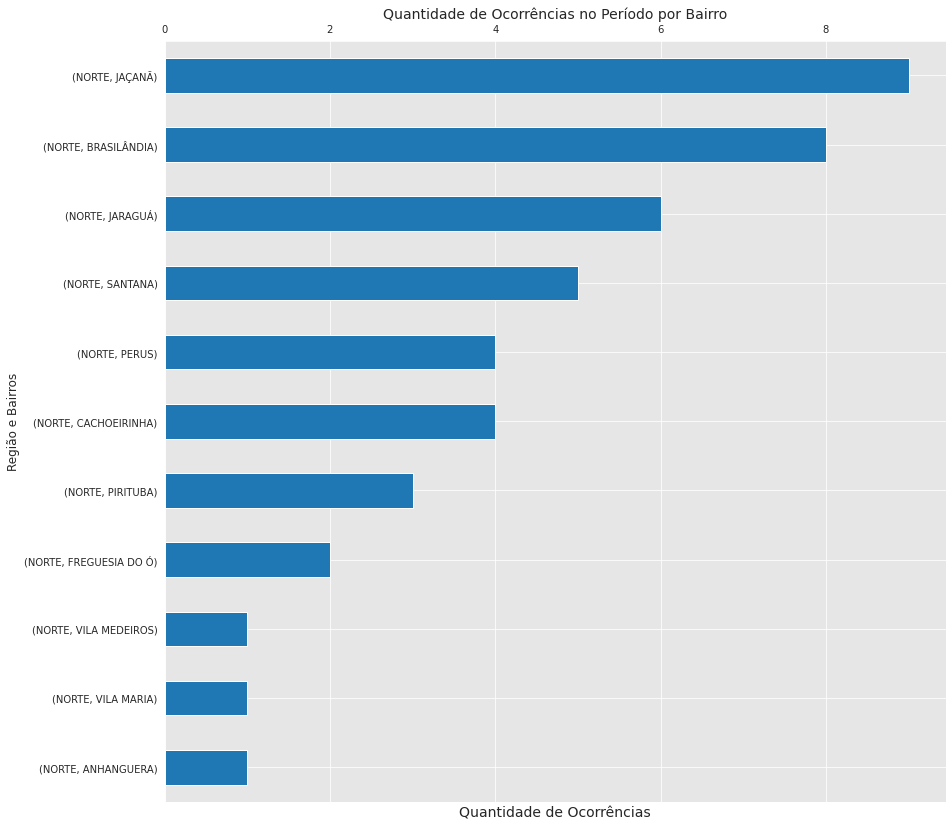

In [315]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_homic_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico de ocorrências de homicídio somente na região NORTE em todo o período. Nota-se que os bairros com os maiores números de ocorrências são BRASILÂNDIA, JAÇANÃ e JARAGUÁ que juntos, somam mais de 50% do total de ocorrências.

In [316]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
homicidio_cross_n = (pd.crosstab([database_homic_n.REGIÃO,database_homic_n.BAIRRO], database_homic_n.MES_ESTATISTICA, values=database_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
homicidio_cross_n.reset_index(inplace=True)
homicidio_cross_n

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,NORTE,ANHANGUERA,0.000000,0.000000,0.000000,0.0,10.0,0.0,0.0,2.272727
1,NORTE,BRASILÂNDIA,0.000000,28.571429,33.333333,25.0,0.0,20.0,50.0,18.181818
2,NORTE,CACHOEIRINHA,0.000000,14.285714,16.666667,12.5,10.0,0.0,0.0,9.090909
3,NORTE,FREGUESIA DO Ó,0.000000,0.000000,16.666667,0.0,10.0,0.0,0.0,4.545455
4,NORTE,JARAGUÁ,0.000000,14.285714,16.666667,25.0,10.0,20.0,0.0,13.636364
5,NORTE,JAÇANÃ,50.000000,14.285714,0.000000,12.5,20.0,40.0,0.0,20.454545
6,NORTE,PERUS,33.333333,0.000000,0.000000,0.0,20.0,0.0,0.0,9.090909
7,NORTE,PIRITUBA,16.666667,14.285714,0.000000,12.5,0.0,0.0,0.0,6.818182
8,NORTE,SANTANA,0.000000,0.000000,16.666667,0.0,20.0,20.0,50.0,11.363636
9,NORTE,VILA MARIA,0.000000,0.000000,0.000000,12.5,0.0,0.0,0.0,2.272727


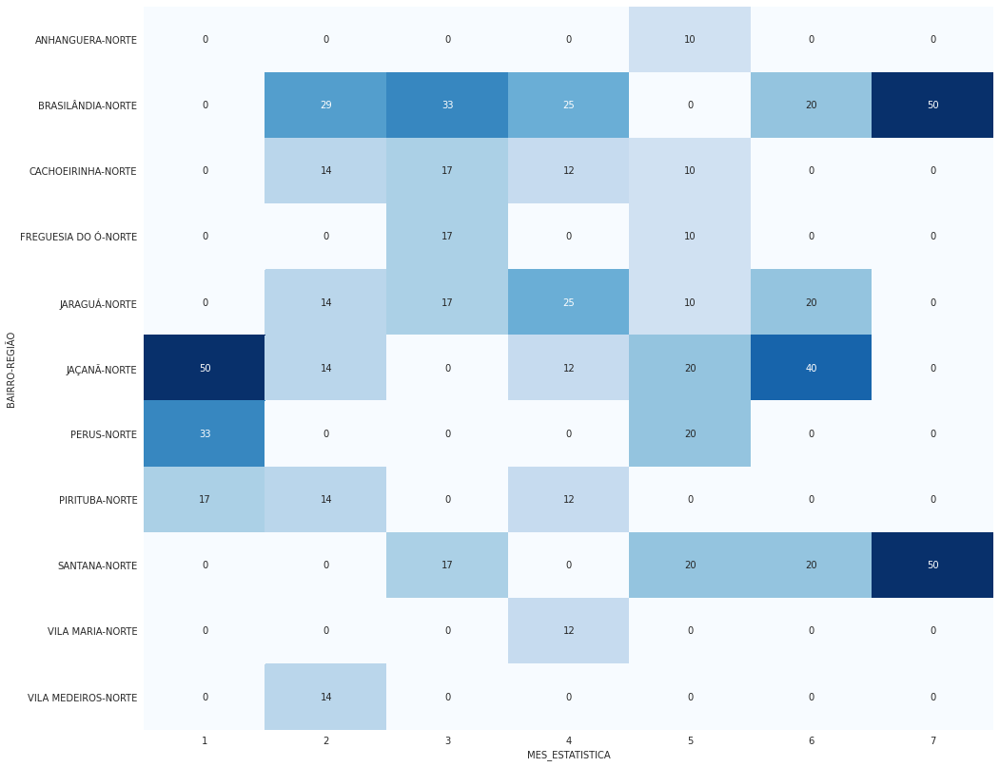

In [317]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_homic_n.BAIRRO,database_homic_n.REGIÃO], database_homic_n.MES_ESTATISTICA, values=database_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - percebe-se que os meses extremos (JANEIRO e JULHO) sao so que mais concentram as ocorrênias em poucos bairros. JANEIRO: PERUS e JAÇANÃ e JULHO: BRASILÂNDIA e SANTANA.
 - as ocorrências do meio do período se concentram nos bairros BRASILÂNDIA e SANTANA

In [318]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_homic_n.REGIÃO,database_homic_n.BAIRRO], database_homic_n.MES_ESTATISTICA, values=database_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                1           2          3           4  \
REGIÃO BAIRRO                                                         
NORTE  ANHANGUERA       0.000000    0.000000   0.000000    0.000000   
       BRASILÂNDIA      0.000000   25.000000  25.000000   25.000000   
       CACHOEIRINHA     0.000000   25.000000  25.000000   25.000000   
       FREGUESIA DO Ó   0.000000    0.000000  50.000000    0.000000   
       JARAGUÁ          0.000000   16.666667  16.666667   33.333333   
       JAÇANÃ          33.333333   11.111111   0.000000   11.111111   
       PERUS           50.000000    0.000000   0.000000    0.000000   
       PIRITUBA        33.333333   33.333333   0.000000   33.333333   
       SANTANA          0.000000    0.000000  20.000000    0.000000   
       VILA MARIA       0.000000    0.000000   0.000000  100.000000   
       VILA MEDEIROS    0.000000  100.000000   0.000000    0.000000   

MES_ESTATISTICA                 5          6     7  
REGIÃO BAIRRO                                       
NORTE  ANHANGUERA      100.000000   0.000000   0.0  
       BRASILÂNDIA       0.000000  12.500000  12.5  
       CACHOEIRINHA     25.000000   0.000000   0.0  
       FREGUESIA DO Ó   50.000000   0.000000   0.0  
       JARAGUÁ          16.666667  16.666667   0.0  
       JAÇANÃ           22.222222  22.222222   0.0  
       PERUS            50.000000   0.000000   0.0  
       PIRITUBA          0.000000   0.000000   0.0  
       SANTANA          40.000000  20.000000  20.0  
       VILA MARIA        0.000000   0.000000   0.0  
       VILA MEDEIROS     0.000000   0.000000   0.0

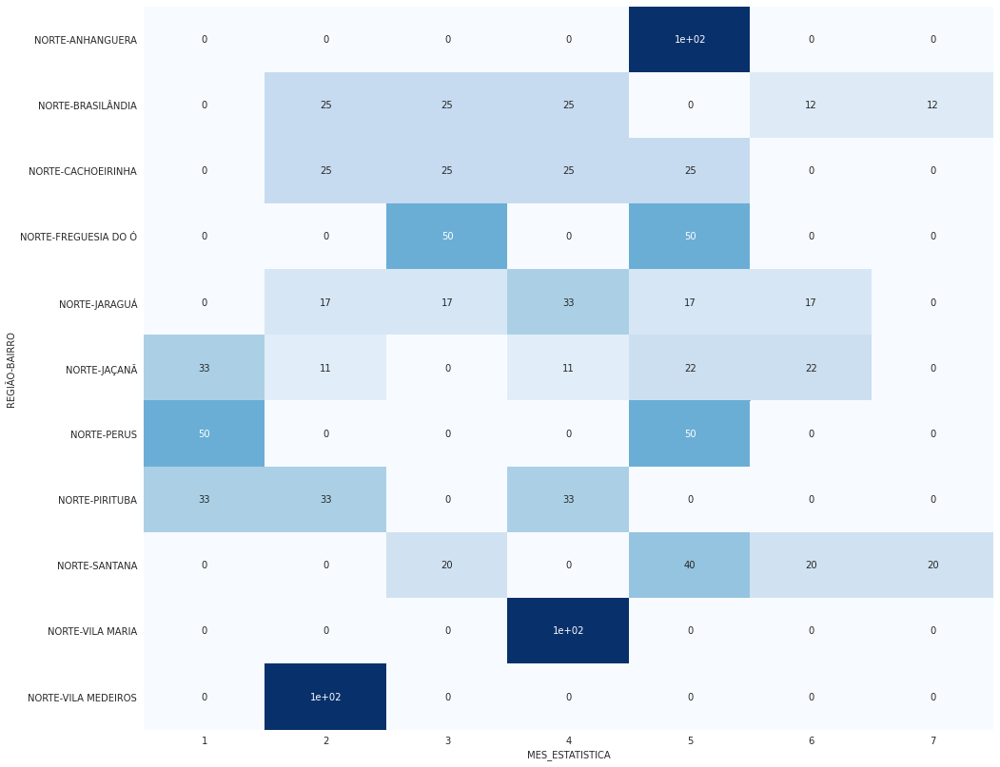

In [319]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_homic_n.REGIÃO,database_homic_n.BAIRRO], database_homic_n.MES_ESTATISTICA, values=database_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. 

#### Análise de Ocorrência HOMICÍDIO na região SUL

In [320]:
#Separando pela região SUL
database_homic_s = database_homic[database_homic['REGIÃO']== 'SUL'].reset_index()

In [321]:
database_homic_s

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,1,51,12/31/2022,23:51:00,CAMPO LIMPO,NaN,NaN,HOMICÍDIO,1,2023,233057.0,SUL
1,3,54,1/1/2023,5:51:00,JARDIM ÂNGELA,"-23,66022977","-46,75487178",HOMICÍDIO,1,2023,349210.0,SUL
2,4,55,1/1/2023,23:45:00,GRAJAÚ,"-23,7532485","-46,69715545",HOMICÍDIO,1,2023,398040.0,SUL
3,6,58,1/5/2023,19:36:00,IPIRANGA,"-23,584341","-46,6115761",HOMICÍDIO,1,2023,113158.0,SUL
4,9,61,1/8/2023,6:00:00,CAMPO LIMPO,"-23,6350116","-46,7756357",HOMICÍDIO,1,2023,233057.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...,...
69,222,276392,7/25/2023,11:52:00 PM,JARDIM ÂNGELA,"-23,6449532","-46,73060599",HOMICÍDIO,7,2023,349210.0,SUL
70,229,284637,3/29/2023,9:45:00 PM,SAÚDE,"-23,618162","-46,6278979",HOMICÍDIO,3,2023,133796.0,SUL
71,230,284638,4/13/2023,18:25:00,VILA MARIANA,"-23,62858644","-46,62500425",HOMICÍDIO,4,2023,131624.0,SUL
72,235,284643,4/18/2023,7:30:00,JABAQUARA,"-23,65309721","-46,64486597",HOMICÍDIO,5,2023,230057.0,SUL


In [322]:
x = database_homic_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_homic_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_homic_s.shape[0])

REGIÃO  BAIRRO         
SUL     JARDIM ÂNGELA      17
        CAMPO LIMPO        14
        CAPÃO REDONDO       8
        CIDADE DUTRA        6
        CIDADE ADEMAR       5
        GRAJAÚ              5
        SAÚDE               4
        IPIRANGA            3
        SACOMÃ              3
        CAMPO BELO          2
        JABAQUARA           2
        JARDIM SÃO LUÍS     2
        VILA MARIANA        2
        MOEMA               1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
SUL     JARDIM ÂNGELA      0.229730
        CAMPO LIMPO        0.189189
        CAPÃO REDONDO      0.108108
        CIDADE DUTRA       0.081081
        CIDADE ADEMAR      0.067568
        GRAJAÚ             0.067568
        SAÚDE              0.054054
        IPIRANGA           0.040541
        SACOMÃ             0.040541
        CAMPO BELO         0.027027
        JABAQUARA          0.027027
        JARDIM SÃO LUÍS    0.027027
        VILA MARIANA       0.027027
        MOEMA              0.013514
N

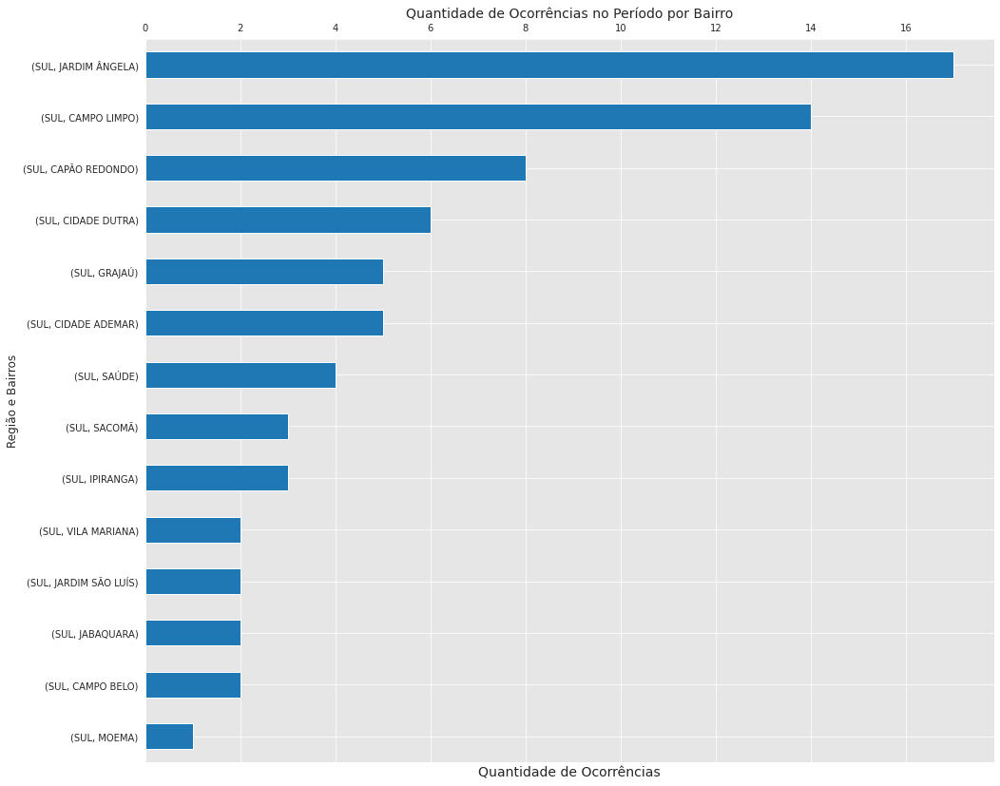

In [323]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_homic_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico das ocorrências de homicídio somente na região SUL em todo o período. Nota-se que os bairros com o maior número de ocorrências são JARDIM ÂNGELA e CAMPO LIMPO com um percentual muito acima dos demais bairros.

In [324]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
homicidio_cross_s = (pd.crosstab([database_homic_s.REGIÃO,database_homic_s.BAIRRO], database_homic_s.MES_ESTATISTICA, values=database_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
homicidio_cross_s.reset_index(inplace=True)
homicidio_cross_s

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,SUL,CAMPO BELO,0.000000,8.333333,0.000000,0.000000,0.000000,0.0,14.285714,2.702703
1,SUL,CAMPO LIMPO,38.461538,16.666667,15.384615,16.666667,11.111111,25.0,0.000000,18.918919
2,SUL,CAPÃO REDONDO,7.692308,0.000000,23.076923,0.000000,11.111111,25.0,14.285714,10.810811
3,SUL,CIDADE ADEMAR,0.000000,8.333333,0.000000,0.000000,22.222222,0.0,28.571429,6.756757
4,SUL,CIDADE DUTRA,0.000000,8.333333,15.384615,16.666667,11.111111,0.0,0.000000,8.108108
5,SUL,GRAJAÚ,7.692308,8.333333,0.000000,16.666667,0.000000,12.5,0.000000,6.756757
6,SUL,IPIRANGA,7.692308,0.000000,15.384615,0.000000,0.000000,0.0,0.000000,4.054054
7,SUL,JABAQUARA,0.000000,8.333333,0.000000,0.000000,11.111111,0.0,0.000000,2.702703
8,SUL,JARDIM SÃO LUÍS,7.692308,0.000000,0.000000,0.000000,0.000000,12.5,0.000000,2.702703
9,SUL,JARDIM ÂNGELA,30.769231,25.000000,15.384615,41.666667,11.111111,12.5,14.285714,22.972973


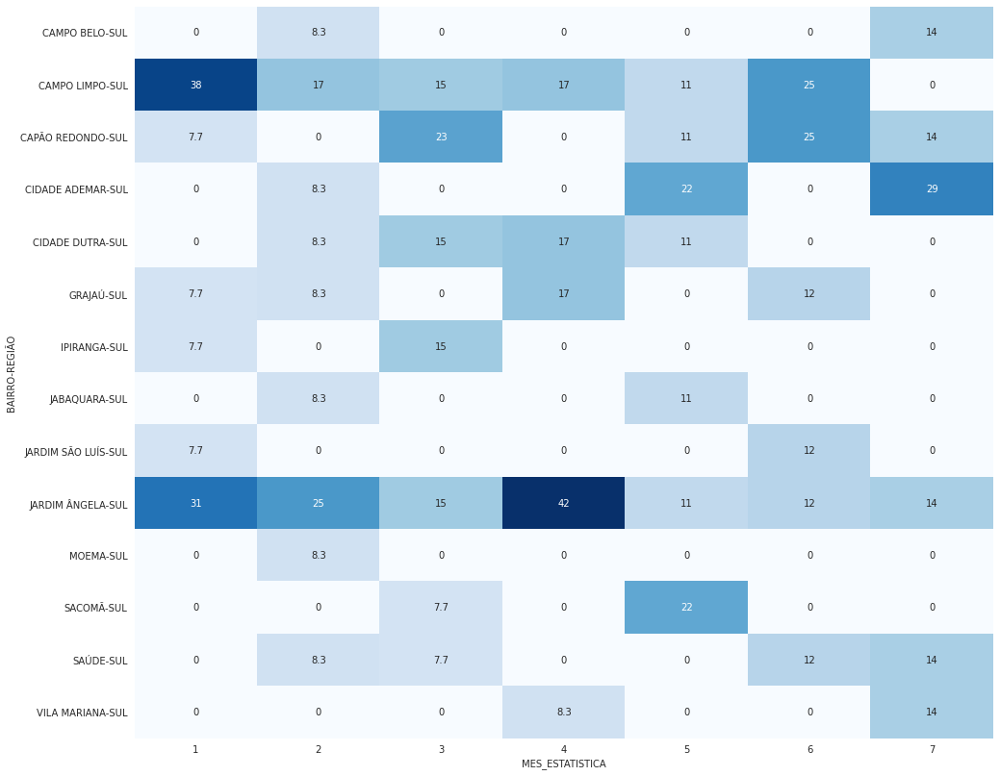

In [325]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_homic_s.BAIRRO,database_homic_s.REGIÃO], database_homic_s.MES_ESTATISTICA, values=database_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

- só o bairro CAMPO LIMPO foi responsável por 38% de todas as ocorrências no mês de JANEIRO e em geral esse bairro apresenta os maiores percentuais ao longo do período
- no mês de abril o JARDIM ÂNGELA foi responsável por 42% de todas as ocorrências no mês

In [326]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_homic_s.REGIÃO,database_homic_s.BAIRRO], database_homic_s.MES_ESTATISTICA, values=database_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                 1           2          3          4  \
REGIÃO BAIRRO                                                         
SUL    CAMPO BELO        0.000000   50.000000   0.000000   0.000000   
       CAMPO LIMPO      35.714286   14.285714  14.285714  14.285714   
       CAPÃO REDONDO    12.500000    0.000000  37.500000   0.000000   
       CIDADE ADEMAR     0.000000   20.000000   0.000000   0.000000   
       CIDADE DUTRA      0.000000   16.666667  33.333333  33.333333   
       GRAJAÚ           20.000000   20.000000   0.000000  40.000000   
       IPIRANGA         33.333333    0.000000  66.666667   0.000000   
       JABAQUARA         0.000000   50.000000   0.000000   0.000000   
       JARDIM SÃO LUÍS  50.000000    0.000000   0.000000   0.000000   
       JARDIM ÂNGELA    23.529412   17.647059  11.764706  29.411765   
       MOEMA             0.000000  100.000000   0.000000   0.000000   
       SACOMÃ            0.000000    0.000000  33.333333   0.000000   
       SAÚDE             0.000000   25.000000  25.000000   0.000000   
       VILA MARIANA      0.000000    0.000000   0.000000  50.000000   

MES_ESTATISTICA                 5          6          7  
REGIÃO BAIRRO                                            
SUL    CAMPO BELO        0.000000   0.000000  50.000000  
       CAMPO LIMPO       7.142857  14.285714   0.000000  
       CAPÃO REDONDO    12.500000  25.000000  12.500000  
       CIDADE ADEMAR    40.000000   0.000000  40.000000  
       CIDADE DUTRA     16.666667   0.000000   0.000000  
       GRAJAÚ            0.000000  20.000000   0.000000  
       IPIRANGA          0.000000   0.000000   0.000000  
       JABAQUARA        50.000000   0.000000   0.000000  
       JARDIM SÃO LUÍS   0.000000  50.000000   0.000000  
       JARDIM ÂNGELA     5.882353   5.882353   5.882353  
       MOEMA             0.000000   0.000000   0.000000  
       SACOMÃ           66.666667   0.000000   0.000000  
       SAÚDE             0.000000  25.000000  25.000000  
       VILA MARIANA      0.000000   0.000000  50.000000

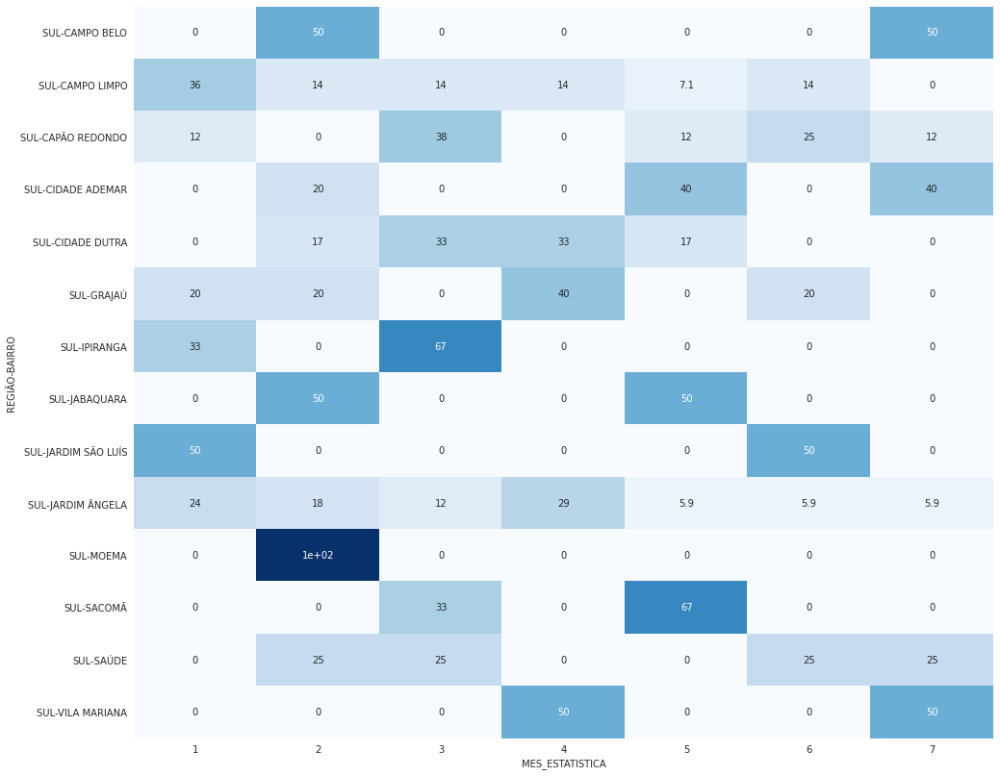

In [327]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_homic_s.REGIÃO,database_homic_s.BAIRRO], database_homic_s.MES_ESTATISTICA, values=database_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro.

#### Análise de Ocorrência HOMICÍDIO na região LESTE

In [328]:
#Separando pela região LESTE
database_homic_l = database_homic[database_homic['REGIÃO']== 'LESTE'].reset_index()

In [329]:
database_homic_l

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,7,59,1/6/2023,1:00:00,ERMELINO MATARAZZO,NaN,NaN,HOMICÍDIO,1,2023,119872.0,LESTE
1,8,60,1/7/2023,6:05:00,PARQUE DO CARMO,"-23,56656862","-46,451713",HOMICÍDIO,1,2023,72625.0,LESTE
2,19,74,1/15/2023,7:11:00,SÃO RAFAEL,"-23,62182111","-46,46731504",HOMICÍDIO,1,2023,163761.0,LESTE
3,22,77,1/17/2023,Ignorado,SÃO MATEUS,"-23,60758581","-46,46740472",HOMICÍDIO,1,2023,156398.0,LESTE
4,23,78,1/18/2023,2:36:00,SÃO RAFAEL,0,0,HOMICÍDIO,1,2023,163761.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
56,225,280151,7/31/2023,5:07:50 PM,ERMELINO MATARAZZO,"-23,5189007","-46,45546107",HOMICÍDIO,7,2023,119872.0,LESTE
57,226,283598,7/30/2023,4:17:00 PM,SÃO RAFAEL,0,0,HOMICÍDIO,7,2023,163761.0,LESTE
58,228,284636,2/13/2023,4:25:00 PM,PARQUE DO CARMO,"-23,55577117","-46,46116922",HOMICÍDIO,2,2023,72625.0,LESTE
59,231,284639,4/12/2023,21:56:00,PARQUE DO CARMO,"-23,5770671","-46,4162608",HOMICÍDIO,4,2023,72625.0,LESTE


In [330]:
x = database_homic_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_homic_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_homic_l.shape[0])

REGIÃO  BAIRRO            
LESTE   SÃO MATEUS            7
        SÃO RAFAEL            7
        ERMELINO MATARAZZO    6
        IGUATEMI              4
        PARQUE DO CARMO       4
        GUAIANASES            3
        PONTE RASA            3
        JARDIM HELENA         3
        SÃO LUCAS             3
        CIDADE TIRADENTES     3
        CANGAÍBA              3
        BRÁS                  3
        ITAIM PAULISTA        2
        SAPOPEMBA             2
        ARICANDUVA            1
        CARRÃO                1
        ITAQUERA              1
        LAJEADO               1
        PENHA                 1
        TATUAPÉ               1
        VILA CURUÇÁ           1
        VILA MATILDE          1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO            
LESTE   SÃO MATEUS            0.114754
        SÃO RAFAEL            0.114754
        ERMELINO MATARAZZO    0.098361
        IGUATEMI              0.065574
        PARQUE DO CARMO       0.065574
        GUAIANASES  

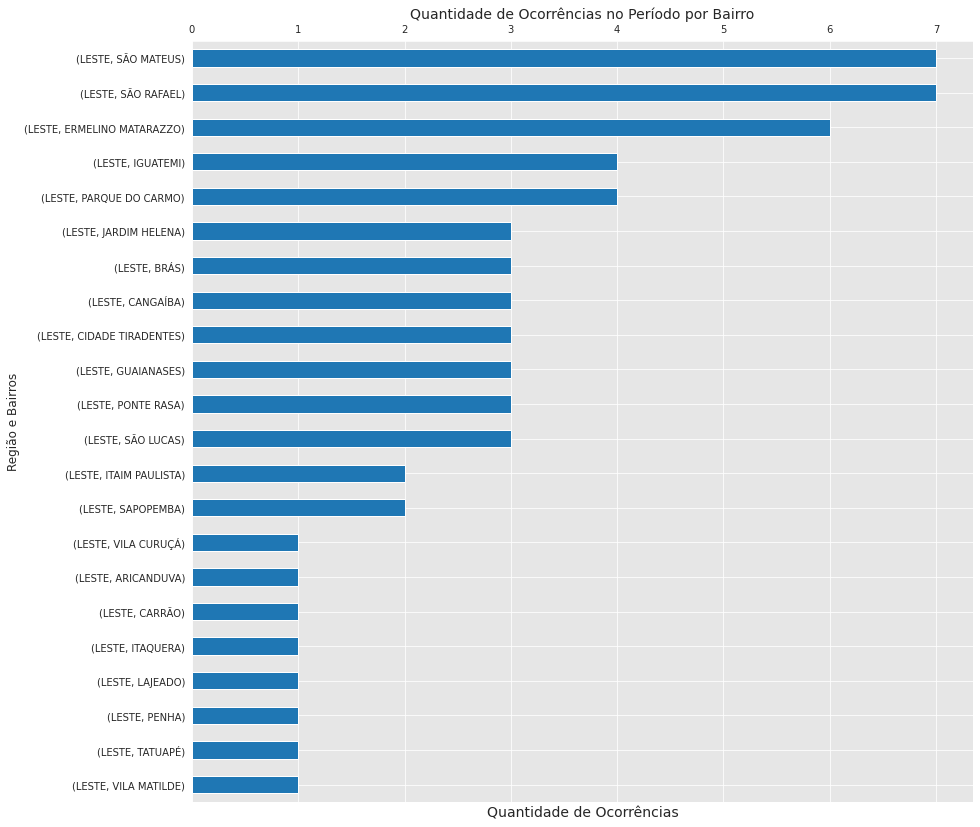

In [331]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_homic_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região LESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de homicídio é SÃO MATEUS e SÃO RAFAEL.

In [332]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
homicidio_cross_l = pd.crosstab([database_homic_l.REGIÃO,database_homic_l.BAIRRO], database_homic_l.MES_ESTATISTICA, values=database_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
homicidio_cross_l.reset_index(inplace=True)
homicidio_cross_l

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,LESTE,ARICANDUVA,0.000000,0.0,0.000000,0.00,10.0,0.000000,0.0,1.639344
1,LESTE,BRÁS,0.000000,0.0,0.000000,6.25,0.0,7.692308,20.0,4.918033
2,LESTE,CANGAÍBA,0.000000,0.0,0.000000,6.25,10.0,0.000000,20.0,4.918033
3,LESTE,CARRÃO,0.000000,0.0,0.000000,0.00,0.0,7.692308,0.0,1.639344
4,LESTE,CIDADE TIRADENTES,0.000000,0.0,0.000000,12.50,0.0,7.692308,0.0,4.918033
5,LESTE,ERMELINO MATARAZZO,16.666667,0.0,16.666667,6.25,20.0,0.000000,20.0,9.836066
6,LESTE,GUAIANASES,16.666667,0.0,0.000000,6.25,0.0,7.692308,0.0,4.918033
7,LESTE,IGUATEMI,0.000000,0.0,0.000000,12.50,10.0,7.692308,0.0,6.557377
8,LESTE,ITAIM PAULISTA,0.000000,0.0,0.000000,0.00,10.0,0.000000,20.0,3.278689
9,LESTE,ITAQUERA,0.000000,0.0,0.000000,0.00,10.0,0.000000,0.0,1.639344


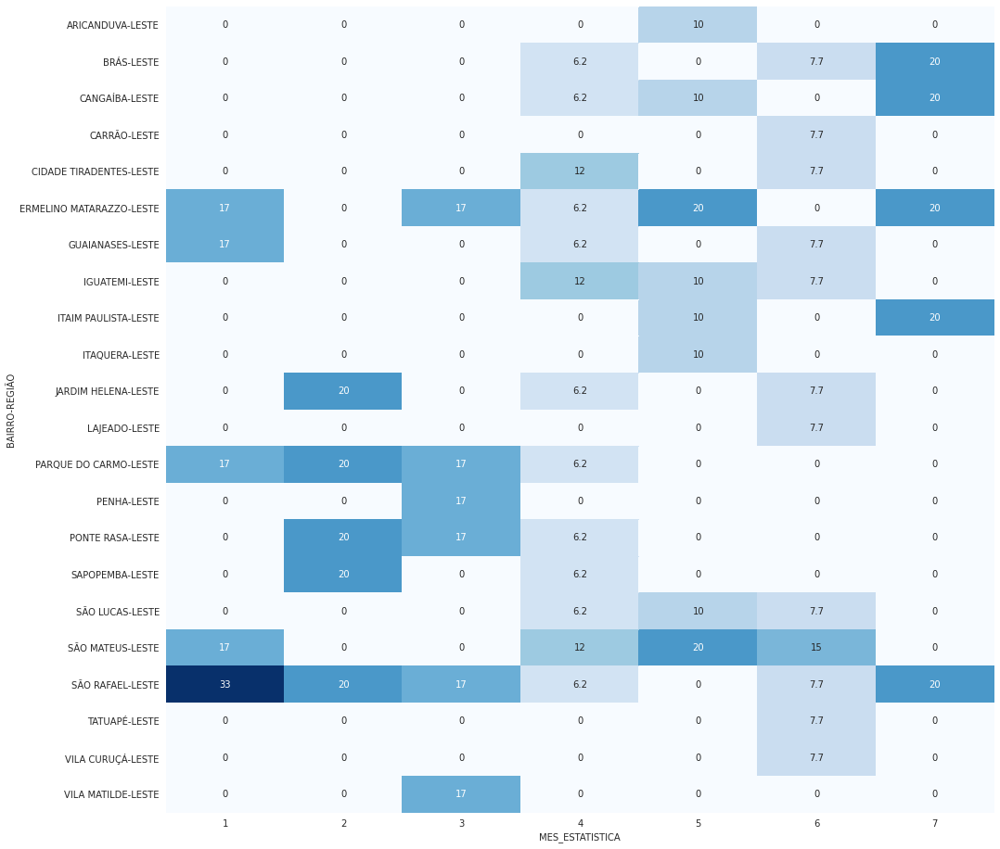

In [333]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_homic_l.BAIRRO,database_homic_l.REGIÃO], database_homic_l.MES_ESTATISTICA, values=database_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - boa parte dos bairros apresentam altos percentuais nos primeiros 3 meses do período;

In [334]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_homic_l.REGIÃO,database_homic_l.BAIRRO], database_homic_l.MES_ESTATISTICA, values=database_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                    1          2           3          4  \
REGIÃO BAIRRO                                                            
LESTE  ARICANDUVA           0.000000   0.000000    0.000000   0.000000   
       BRÁS                 0.000000   0.000000    0.000000  33.333333   
       CANGAÍBA             0.000000   0.000000    0.000000  33.333333   
       CARRÃO               0.000000   0.000000    0.000000   0.000000   
       CIDADE TIRADENTES    0.000000   0.000000    0.000000  66.666667   
       ERMELINO MATARAZZO  16.666667   0.000000   16.666667  16.666667   
       GUAIANASES          33.333333   0.000000    0.000000  33.333333   
       IGUATEMI             0.000000   0.000000    0.000000  50.000000   
       ITAIM PAULISTA       0.000000   0.000000    0.000000   0.000000   
       ITAQUERA             0.000000   0.000000    0.000000   0.000000   
       JARDIM HELENA        0.000000  33.333333    0.000000  33.333333   
       LAJEADO              0.000000   0.000000    0.000000   0.000000   
       PARQUE DO CARMO     25.000000  25.000000   25.000000  25.000000   
       PENHA                0.000000   0.000000  100.000000   0.000000   
       PONTE RASA           0.000000  33.333333   33.333333  33.333333   
       SAPOPEMBA            0.000000  50.000000    0.000000  50.000000   
       SÃO LUCAS            0.000000   0.000000    0.000000  33.333333   
       SÃO MATEUS          14.285714   0.000000    0.000000  28.571429   
       SÃO RAFAEL          28.571429  14.285714   14.285714  14.285714   
       TATUAPÉ              0.000000   0.000000    0.000000   0.000000   
       VILA CURUÇÁ          0.000000   0.000000    0.000000   0.000000   
       VILA MATILDE         0.000000   0.000000  100.000000   0.000000   

MES_ESTATISTICA                     5           6          7  
REGIÃO BAIRRO                                                 
LESTE  ARICANDUVA          100.000000    0.000000   0.000000  
       BRÁS                  0.000000   33.333333  33.333333  
       CANGAÍBA             33.333333    0.000000  33.333333  
       CARRÃO                0.000000  100.000000   0.000000  
       CIDADE TIRADENTES     0.000000   33.333333   0.000000  
       ERMELINO MATARAZZO   33.333333    0.000000  16.666667  
       GUAIANASES            0.000000   33.333333   0.000000  
       IGUATEMI             25.000000   25.000000   0.000000  
       ITAIM PAULISTA       50.000000    0.000000  50.000000  
       ITAQUERA            100.000000    0.000000   0.000000  
       JARDIM HELENA         0.000000   33.333333   0.000000  
       LAJEADO               0.000000  100.000000   0.000000  
       PARQUE DO CARMO       0.000000    0.000000   0.000000  
       PENHA                 0.000000    0.000000   0.000000  
       PONTE RASA            0.000000    0.000000   0.000000  
       SAPOPEMBA             0.000000    0.000000   0.000000  
       SÃO LUCAS            33.333333   33.333333   0.000000  
       SÃO MATEUS           28.571429   28.571429   0.000000  
       SÃO RAFAEL            0.000000   14.285714  14.285714  
       TATUAPÉ               0.000000  100.000000   0.000000  
       VILA CURUÇÁ           0.000000  100.000000   0.000000  
       VILA MATILDE          0.000000    0.000000   0.000000

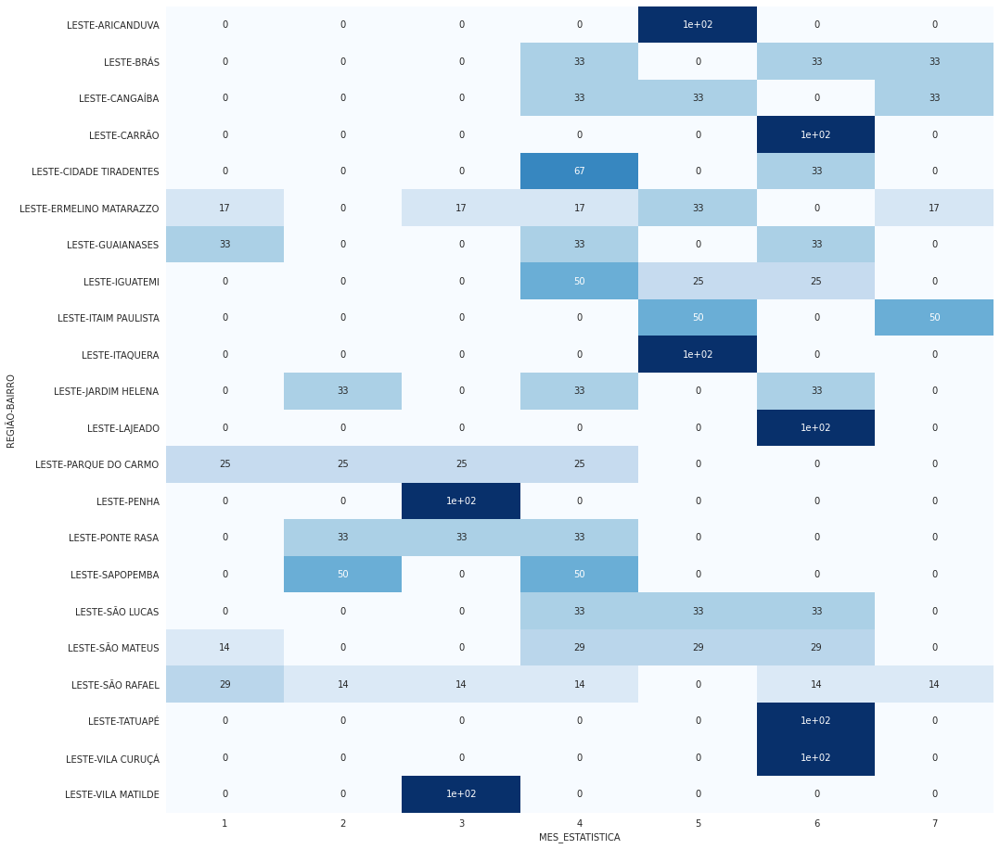

In [335]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_homic_l.REGIÃO,database_homic_l.BAIRRO], database_homic_l.MES_ESTATISTICA, values=database_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. 

- boa parte das ocorrências aconteceram nos últimos 4 meses do período

#### Análise de Ocorrência HOMICÍDIO na região OESTE

In [336]:
#Separando pela região OESTE
database_homic_o = database_homic[database_homic['REGIÃO']== 'OESTE'].reset_index()

In [337]:
database_homic_o

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,14,68,1/13/2023,3:44:00,JAGUARA,"-23,51702325","-46,74698803",HOMICÍDIO,1,2023,23759.0,OESTE
1,17,72,1/15/2023,3:14:00,RAPOSO TAVARES,"-23,59654239","-46,76300026",HOMICÍDIO,1,2023,109052.0,OESTE
2,20,75,1/15/2023,19:20:00,RIO PEQUENO,"-23,57388624","-46,7620599",HOMICÍDIO,1,2023,124671.0,OESTE
3,25,82,1/21/2023,5:56:00,BARRA FUNDA,"-23,5321855","-46,66209801",HOMICÍDIO,1,2023,16808.0,OESTE
4,32,89,1/28/2023,15:02:00,PINHEIROS,"-23,55542701","-46,7051589",HOMICÍDIO,1,2023,65509.0,OESTE
5,36,93,1/29/2023,22:30:00,PINHEIROS,"-23,4897259","-46,427889",HOMICÍDIO,1,2023,65509.0,OESTE
6,46,60868,2/2/2023,8:13:00 AM,JAGUARÉ,"-23,5343964","-46,7483901",HOMICÍDIO,2,2023,56292.0,OESTE
7,74,97814,3/27/2023,7:15:00 AM,MORUMBI,"-23,59246541","-46,736387",HOMICÍDIO,3,2023,54007.0,OESTE
8,83,105710,3/19/2023,NaN,PINHEIROS,0,0,HOMICÍDIO,3,2023,65509.0,OESTE
9,99,138813,4/10/2023,11:09:00 AM,BARRA FUNDA,"-23,52180946","-46,66456061",HOMICÍDIO,4,2023,16808.0,OESTE


In [338]:
x = database_homic_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_homic_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_homic_o.shape[0])

REGIÃO  BAIRRO         
OESTE   RIO PEQUENO        6
        PERDIZES           5
        RAPOSO TAVARES     5
        BARRA FUNDA        4
        PINHEIROS          4
        JAGUARÉ            2
        MORUMBI            2
        ITAIM BIBI         1
        JAGUARA            1
        JARDIM PAULISTA    1
        LAPA               1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO         
OESTE   RIO PEQUENO        0.18750
        PERDIZES           0.15625
        RAPOSO TAVARES     0.15625
        BARRA FUNDA        0.12500
        PINHEIROS          0.12500
        JAGUARÉ            0.06250
        MORUMBI            0.06250
        ITAIM BIBI         0.03125
        JAGUARA            0.03125
        JARDIM PAULISTA    0.03125
        LAPA               0.03125
Name: BAIRRO, dtype: float64


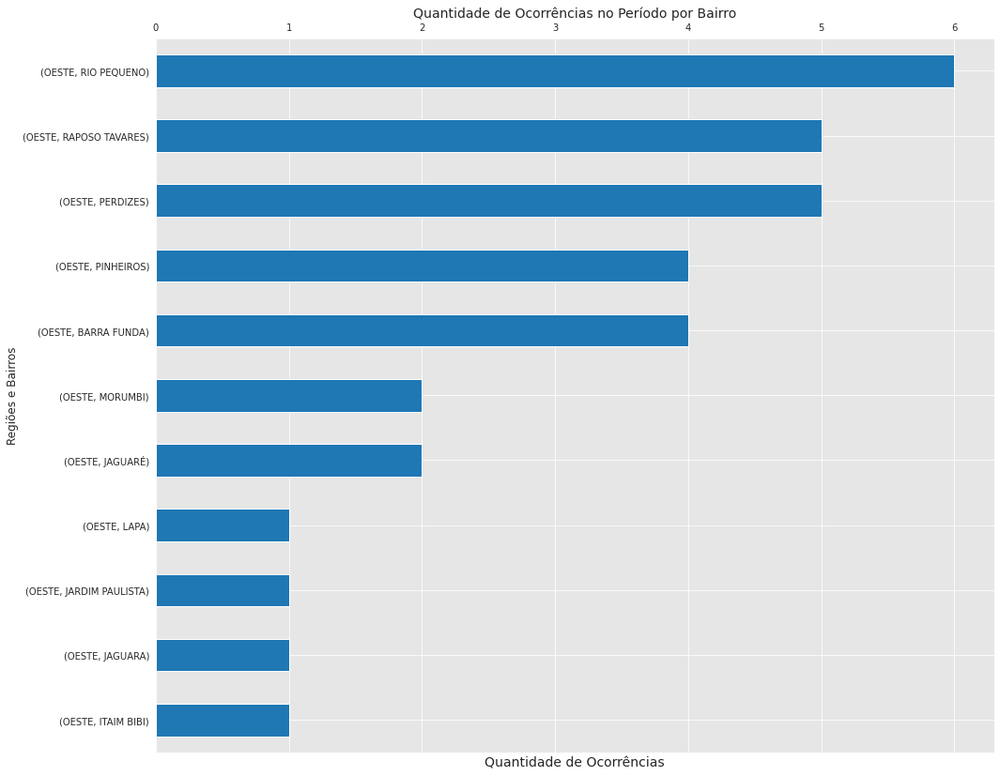

In [339]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_homic_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Regiões e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que o bairro com o maior número de ocorrências de homicídio é RIO PEQUENO  com um percentual 20% maior do que o bairro RAPOSO TAVARES (2º posição). Percebe-se que os demais bairros apresentam valores próximos entre si.

In [340]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
homicidio_cross_o = pd.crosstab([database_homic_o.BAIRRO,database_homic_o.REGIÃO], database_homic_o.MES_ESTATISTICA, values=database_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
homicidio_cross_o.reset_index(inplace=True)
homicidio_cross_o

MES_ESTATISTICA,BAIRRO,REGIÃO,1,2,3,4,5,6,7,Total
0,BARRA FUNDA,OESTE,16.666667,0.0,0.0,14.285714,0.0,0.0,33.333333,12.500
1,ITAIM BIBI,OESTE,0.000000,0.0,0.0,0.000000,20.0,0.0,0.000000,3.125
2,JAGUARA,OESTE,16.666667,0.0,0.0,0.000000,0.0,0.0,0.000000,3.125
3,JAGUARÉ,OESTE,0.000000,100.0,0.0,14.285714,0.0,0.0,0.000000,6.250
4,JARDIM PAULISTA,OESTE,0.000000,0.0,0.0,0.000000,20.0,0.0,0.000000,3.125
5,LAPA,OESTE,0.000000,0.0,0.0,0.000000,0.0,20.0,0.000000,3.125
6,MORUMBI,OESTE,0.000000,0.0,50.0,14.285714,0.0,0.0,0.000000,6.250
7,PERDIZES,OESTE,0.000000,0.0,0.0,0.000000,40.0,20.0,33.333333,15.625
8,PINHEIROS,OESTE,33.333333,0.0,50.0,0.000000,0.0,20.0,0.000000,12.500
9,RAPOSO TAVARES,OESTE,16.666667,0.0,0.0,42.857143,0.0,20.0,0.000000,15.625


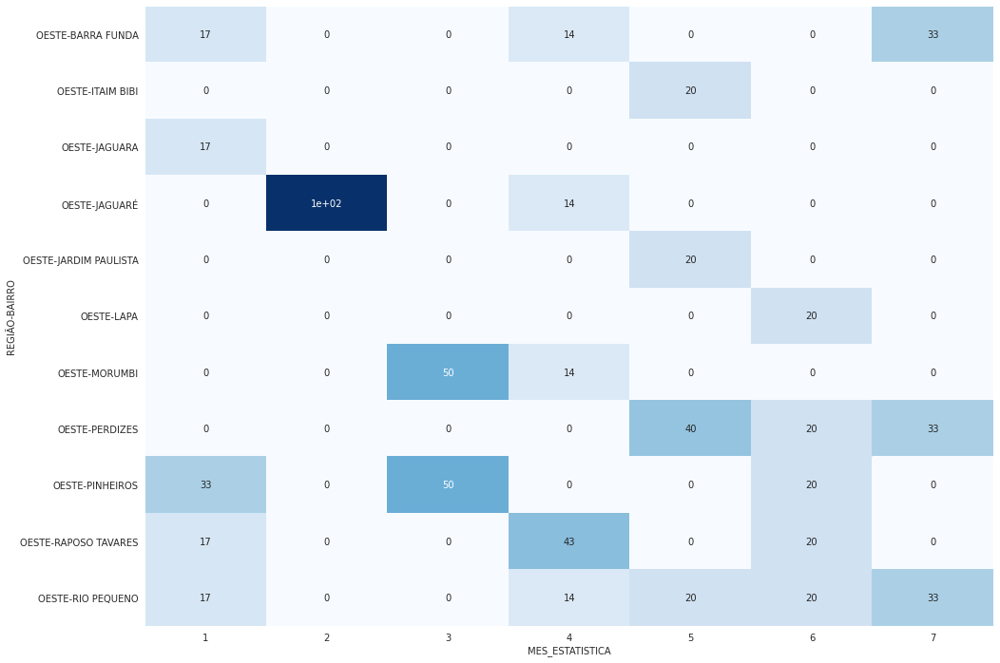

In [341]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_homic_o.REGIÃO,database_homic_o.BAIRRO], database_homic_o.MES_ESTATISTICA, values=database_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês nde percebe-se que a maior parte das ocorrências aconteeram em março, abril e maio

In [342]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_homic_o.REGIÃO,database_homic_o.BAIRRO], database_homic_o.MES_ESTATISTICA, values=database_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                  1     2     3          4           5  \
REGIÃO BAIRRO                                                           
OESTE  BARRA FUNDA       25.000000   0.0   0.0  25.000000    0.000000   
       ITAIM BIBI         0.000000   0.0   0.0   0.000000  100.000000   
       JAGUARA          100.000000   0.0   0.0   0.000000    0.000000   
       JAGUARÉ            0.000000  50.0   0.0  50.000000    0.000000   
       JARDIM PAULISTA    0.000000   0.0   0.0   0.000000  100.000000   
       LAPA               0.000000   0.0   0.0   0.000000    0.000000   
       MORUMBI            0.000000   0.0  50.0  50.000000    0.000000   
       PERDIZES           0.000000   0.0   0.0   0.000000   40.000000   
       PINHEIROS         50.000000   0.0  25.0   0.000000    0.000000   
       RAPOSO TAVARES    20.000000   0.0   0.0  60.000000    0.000000   
       RIO PEQUENO       16.666667   0.0   0.0  16.666667   16.666667   

MES_ESTATISTICA                  6          7  
REGIÃO BAIRRO                                  
OESTE  BARRA FUNDA        0.000000  50.000000  
       ITAIM BIBI         0.000000   0.000000  
       JAGUARA            0.000000   0.000000  
       JAGUARÉ            0.000000   0.000000  
       JARDIM PAULISTA    0.000000   0.000000  
       LAPA             100.000000   0.000000  
       MORUMBI            0.000000   0.000000  
       PERDIZES          20.000000  40.000000  
       PINHEIROS         25.000000   0.000000  
       RAPOSO TAVARES    20.000000   0.000000  
       RIO PEQUENO       16.666667  33.333333

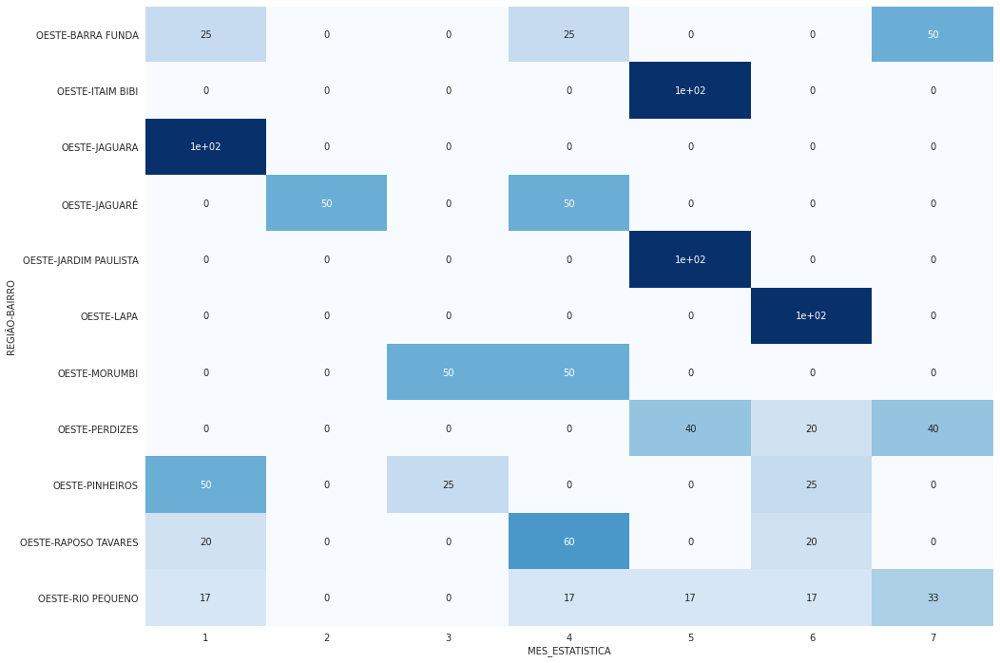

In [343]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_homic_o.REGIÃO,database_homic_o.BAIRRO], database_homic_o.MES_ESTATISTICA, values=database_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro.

#### Análise de Ocorrência HOMICÍDIO na região CENTRAL

In [344]:
#Separando pela região CENTRAL
database_homic_c = database_homic[database_homic['REGIÃO']== 'CENTRO'].reset_index()

In [345]:
database_homic_c

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,2,52,1/1/2023,5:00:00,LIBERDADE,"-23,56192055","-46,62395599",HOMICÍDIO,1,2023,73170.0,CENTRO
1,13,67,1/12/2023,21:43:00,BOM RETIRO,"-23,53518843","-46,6363177",HOMICÍDIO,1,2023,39856.0,CENTRO
2,15,70,1/14/2023,9:15:00,SÉ,"-23,5522819","-46,6307852",HOMICÍDIO,1,2023,27241.0,CENTRO
3,18,73,1/15/2023,7:43:00,BOM RETIRO,"-23,52520202","-46,63070618",HOMICÍDIO,1,2023,39856.0,CENTRO
4,21,76,1/17/2023,4:09:00,REPÚBLICA,0,0,HOMICÍDIO,1,2023,62203.0,CENTRO
5,31,88,1/28/2023,8:52:00,LIBERDADE,"-23,5614866","-46,63557258",HOMICÍDIO,1,2023,73170.0,CENTRO
6,37,40703,2/18/2023,11:16:00 PM,SÉ,"-23,5554688","-46,6352797",HOMICÍDIO,2,2023,27241.0,CENTRO
7,38,42920,2/7/2023,10:30:00 PM,REPÚBLICA,"-23,54207353","-46,64245295",HOMICÍDIO,2,2023,62203.0,CENTRO
8,39,42921,2/26/2023,1:05:00 AM,REPÚBLICA,"-23,54478878","-46,64376054",HOMICÍDIO,2,2023,62203.0,CENTRO
9,63,80309,3/2/2023,6:00:00 AM,SÉ,"-23,54578914","-46,63434267",HOMICÍDIO,3,2023,27241.0,CENTRO


In [346]:
x = database_homic_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_homic_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_homic_c.shape[0])

REGIÃO  BAIRRO       
CENTRO  SÉ               8
        BOM RETIRO       7
        REPÚBLICA        5
        SANTA CECÍLIA    4
        LIBERDADE        3
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
CENTRO  SÉ               0.296296
        BOM RETIRO       0.259259
        REPÚBLICA        0.185185
        SANTA CECÍLIA    0.148148
        LIBERDADE        0.111111
Name: BAIRRO, dtype: float64


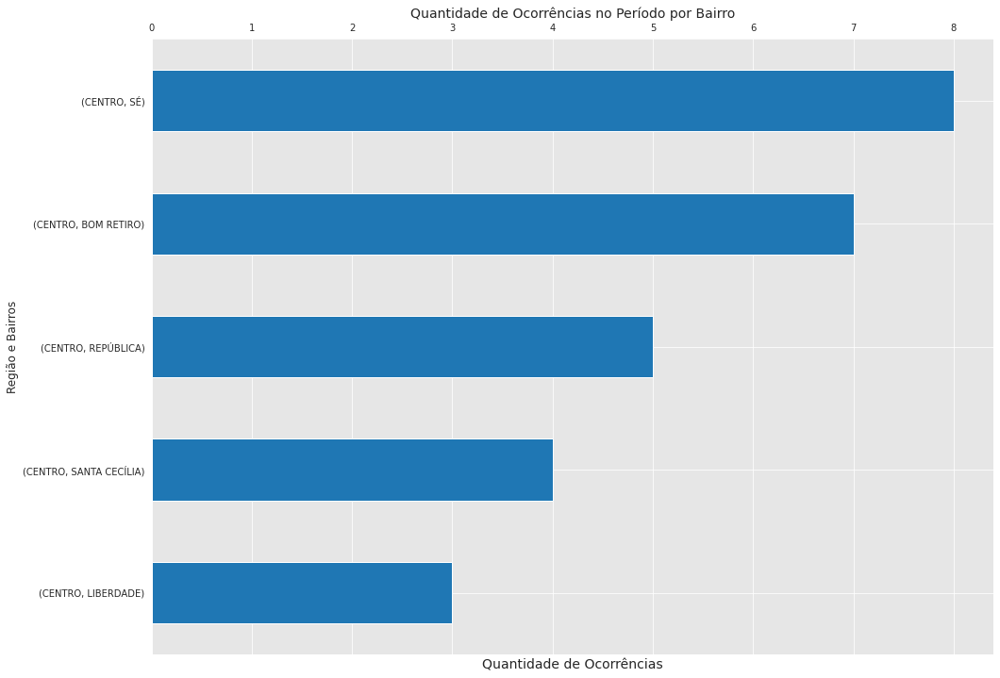

In [347]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 12))
ax = (database_homic_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que os bairros com o maior número de ocorrências de homicídio são SÉ, e BOM RETIRO.

In [348]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
homicidio_cross_c = (pd.crosstab([database_homic_c.REGIÃO,database_homic_c.BAIRRO], database_homic_c.MES_ESTATISTICA, values=database_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
homicidio_cross_c.reset_index(inplace=True)
homicidio_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,CENTRO,BOM RETIRO,33.333333,0.000000,25.0,0.000000,33.333333,50.0,50.0,25.925926
1,CENTRO,LIBERDADE,33.333333,0.000000,0.0,33.333333,0.000000,0.0,0.0,11.111111
2,CENTRO,REPÚBLICA,16.666667,66.666667,25.0,0.000000,0.000000,0.0,0.0,18.518519
3,CENTRO,SANTA CECÍLIA,0.000000,0.000000,12.5,33.333333,33.333333,0.0,50.0,14.814815
4,CENTRO,SÉ,16.666667,33.333333,37.5,33.333333,33.333333,50.0,0.0,29.629630


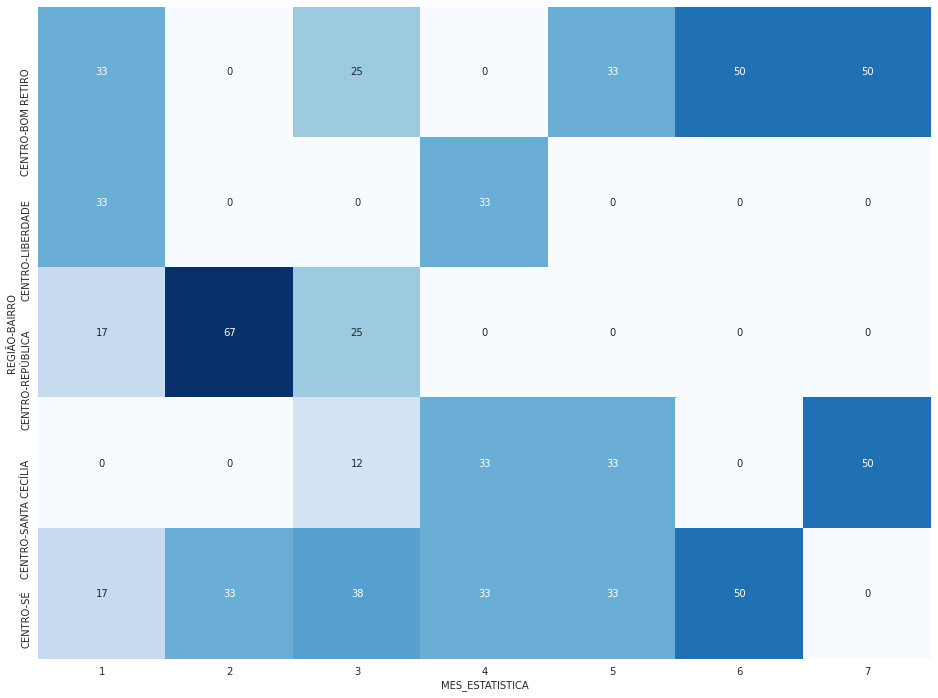

In [349]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_homic_c.REGIÃO,database_homic_c.BAIRRO], database_homic_c.MES_ESTATISTICA, values=database_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - os meses de março, abril e maio apresenta a maior quantidade de bairros com os maiores precentuais de ocorrências

In [350]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_homic_c.REGIÃO,database_homic_c.BAIRRO], database_homic_c.MES_ESTATISTICA, values=database_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA               1     2          3          4          5  \
REGIÃO BAIRRO                                                            
CENTRO BOM RETIRO     28.571429   0.0  28.571429   0.000000  14.285714   
       LIBERDADE      66.666667   0.0   0.000000  33.333333   0.000000   
       REPÚBLICA      20.000000  40.0  40.000000   0.000000   0.000000   
       SANTA CECÍLIA   0.000000   0.0  25.000000  25.000000  25.000000   
       SÉ             12.500000  12.5  37.500000  12.500000  12.500000   

MES_ESTATISTICA               6          7  
REGIÃO BAIRRO                               
CENTRO BOM RETIRO     14.285714  14.285714  
       LIBERDADE       0.000000   0.000000  
       REPÚBLICA       0.000000   0.000000  
       SANTA CECÍLIA   0.000000  25.000000  
       SÉ             12.500000   0.000000

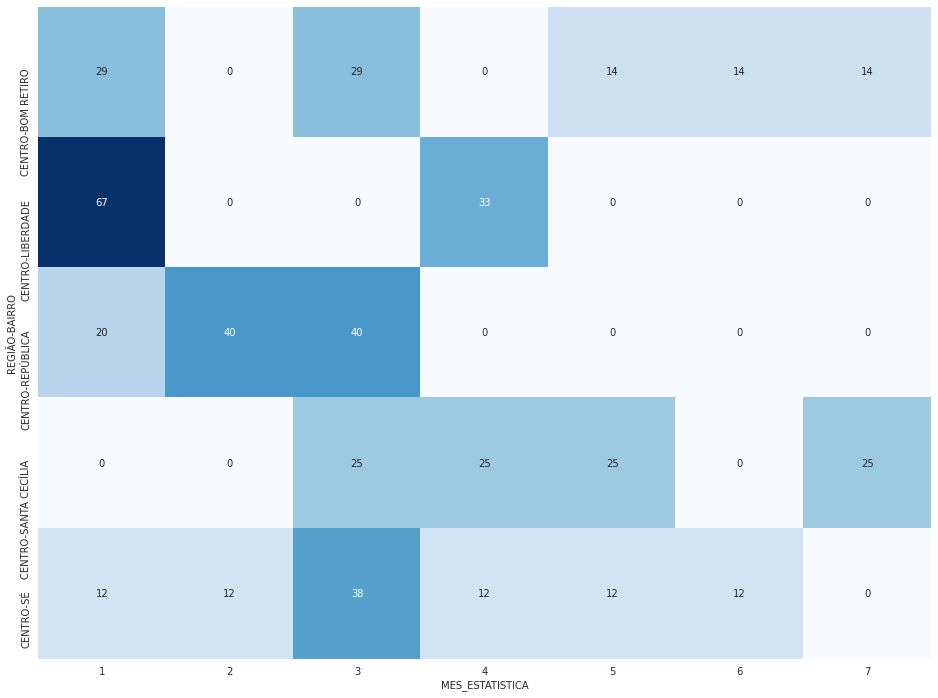

In [351]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_homic_c.REGIÃO,database_homic_c.BAIRRO], database_homic_c.MES_ESTATISTICA, values=database_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro, onde verifica-se um grande aumento quase generalizado no mês de abril em todos os bairros.

### Analisando Ocorrências: TENTATIVA DE HOMICÍDIO

Com o intuito de realizar uma análise mais detalhada, o conjunto de dados será separado por tipo de ocorrência, onde agora será analisado a ocorrência TENTATIVA DE HOMICÍDIO.

In [352]:
#Separando por tipo de ocorrência
database_tent_homic = database.loc[database['NATUREZA_APURADA']== 'TENTATIVA DE HOMICÍDIO'].reset_index()
database_tent_homic

,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,7148,1/5/2023,8:33:00 AM,BRÁS,"-23,54299276","-46,61670443",TENTATIVA DE HOMICÍDIO,1,2023,33770.0,LESTE
1,7149,1/17/2023,8:30:00 PM,BELÉM,"-23,53566151","-46,60135464",TENTATIVA DE HOMICÍDIO,1,2023,49876.0,LESTE
2,9628,1/13/2023,12:54:00 AM,SAÚDE,"-23,59941866","-46,64585077",TENTATIVA DE HOMICÍDIO,1,2023,133796.0,SUL
3,10244,1/3/2023,12:35:00 AM,SACOMÃ,0,0,TENTATIVA DE HOMICÍDIO,1,2023,266814.0,SUL
4,10245,1/17/2023,8:10:00,SACOMÃ,"-23,62929732","-46,61009125",TENTATIVA DE HOMICÍDIO,1,2023,266814.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...
313,278428,7/21/2023,6:05:00 AM,PONTE RASA,0,0,TENTATIVA DE HOMICÍDIO,7,2023,89171.0,LESTE
314,279909,7/21/2023,9:47:00 PM,VILA JACUÍ,0,0,TENTATIVA DE HOMICÍDIO,7,2023,147166.0,LESTE
315,283084,7/18/2023,6:38:00 PM,PARQUE DO CARMO,"-23,55577117","-46,46116922",TENTATIVA DE HOMICÍDIO,7,2023,72625.0,LESTE
316,284310,7/30/2023,9:49:00 PM,SAPOPEMBA,"-23,5866301","-46,4990906",TENTATIVA DE HOMICÍDIO,7,2023,291648.0,LESTE


In [353]:
#Agrupando e contando as ocorrências em cada mês
database.loc[database['NATUREZA_APURADA']== 'TENTATIVA DE HOMICÍDIO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()

MES_ESTATISTICA
1    51
2    51
3    51
4    46
5    38
6    47
7    34
Name: ANO_ESTATISTICA, dtype: int64

In [354]:
#Percentual de ocorrências por mês
database.loc[database['NATUREZA_APURADA']== 'TENTATIVA DE HOMICÍDIO'].groupby('MES_ESTATISTICA')['ANO_ESTATISTICA'].count()/database_tent_homic.shape[0]

MES_ESTATISTICA
1    0.160377
2    0.160377
3    0.160377
4    0.144654
5    0.119497
6    0.147799
7    0.106918
Name: ANO_ESTATISTICA, dtype: float64

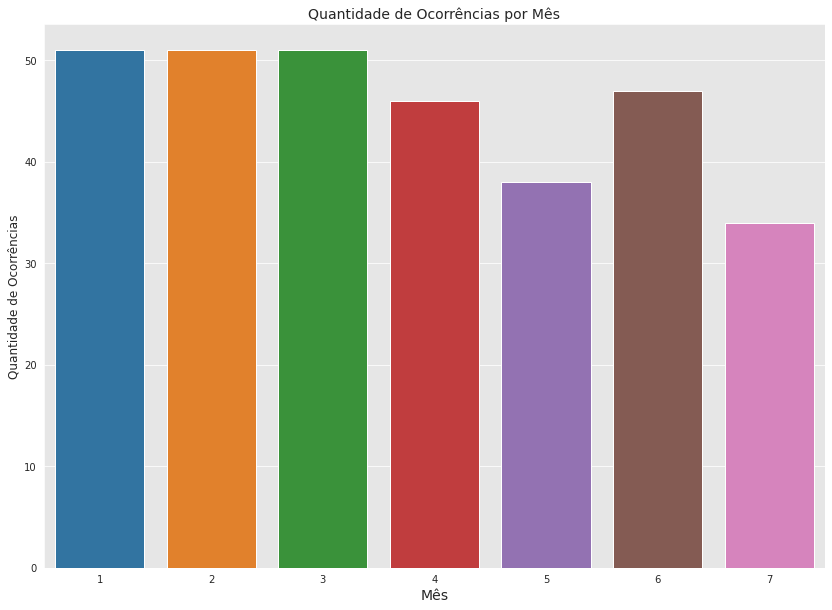

In [355]:
#Plotando o gráfico
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_tent_homic,x='MES_ESTATISTICA')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Mês', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Mês', fontsize=14)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de tentativa de homicídio totais distribuídas pelos meses em questão. Percebe-se um equilíbrio entre os meses principalmente em JANEIRO, FEVEREIRO e MARÇO. Em ABRIL há o início de um declínio nos número se acentuando no mês de MAIO. Em JUNHO há um aumento expressivo vindo, depois a apresentar uma queda no mês de JULHO.

In [356]:
#Ocorrencias por região
database_tent_homic.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)

REGIÃO
SUL       107
LESTE      98
NORTE      64
OESTE      30
CENTRO     19
Name: NATUREZA_APURADA, dtype: int64

In [357]:
#Percental de ocorrências por bairro e região
database_tent_homic.groupby('REGIÃO')['NATUREZA_APURADA'].count().sort_values(ascending=False)/database_tent_homic.shape[0]

REGIÃO
SUL       0.336478
LESTE     0.308176
NORTE     0.201258
OESTE     0.094340
CENTRO    0.059748
Name: NATUREZA_APURADA, dtype: float64

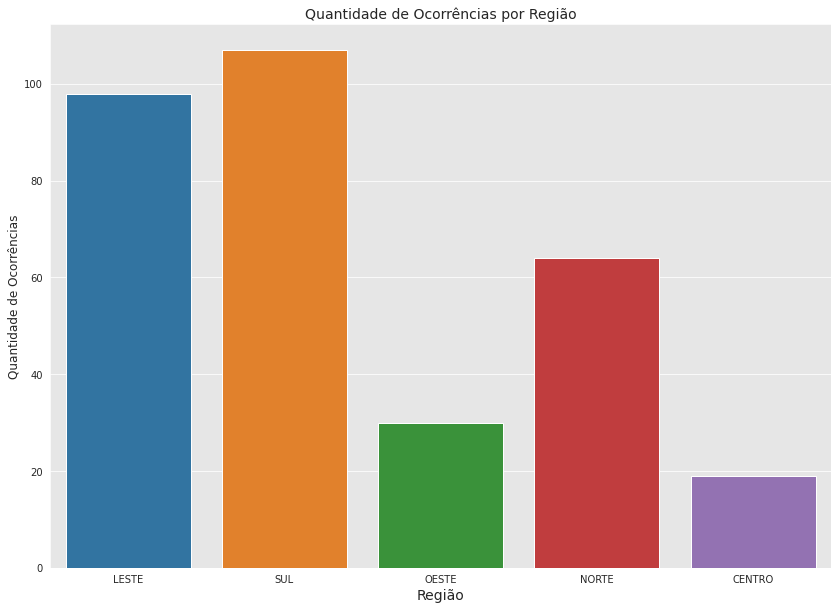

In [358]:
#Gráfico de ocorrências por região
fig, ax = plt.subplots(figsize=(14, 10))
ax = sns.countplot(data = database_tent_homic,x='REGIÃO')
ax.set_ylabel('Quantidade de Ocorrências', fontsize=12)
ax.set_xlabel('Região', fontsize=14)
ax.set_title('Quantidade de Ocorrências por Região', fontsize=14)
plt.show()

Acima o gráfico plotado demostra as regiões LESTE e SUL se destacam e muito das demais, onde demostra que cerca de 30% (LESTE) e 36%(SUL) dos casos. Somados os percentais das regiões LESTE e SUL tem-se que essas duas regiões respondem por quase 64% do total de ocorrências de tentativa de homicídio, percentual possivelmente atrelado ao número de habitantes em cada região.

In [359]:
#Ocorrencias por região
database_tent_homic['BAIRRO'].value_counts()

JARDIM ÂNGELA    20
CAMPO LIMPO      18
GRAJAÚ           14
SACOMÃ           11
JAÇANÃ           10
                 ..
ITAQUERA          1
ARICANDUVA        1
CONSOLAÇÃO        1
ITAIM BIBI        1
BELA VISTA        1
Name: BAIRRO, Length: 74, dtype: int64

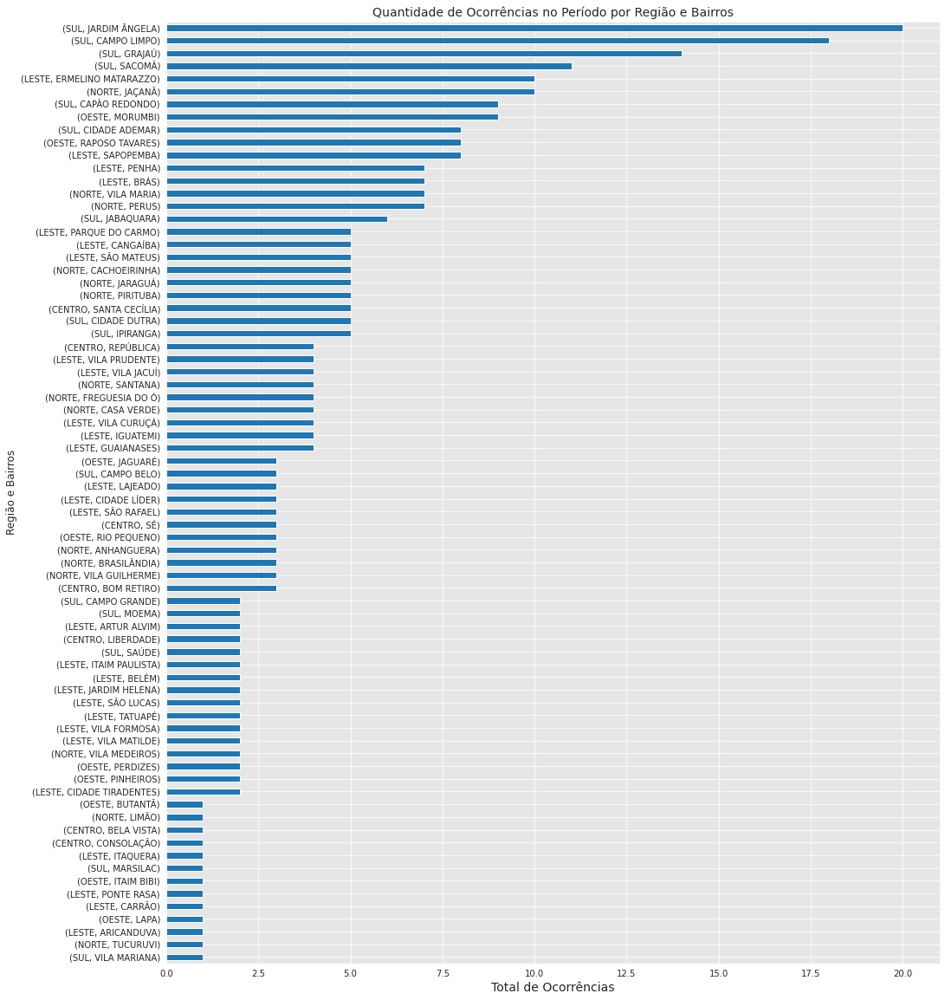

In [360]:
#Plotando o gráfico Quantidade de ocorrências no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 20))
ax = (database_tent_homic.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Total de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Região e Bairros', fontsize=14)
ag.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico plotado da quantidade de ocorrências de tentativa de homicídio por região e bairro no período onde percebe-se que os bairros JARDIM ÂNGELA e CAMPO LIMPO apresentam valores bem acima dos demais bairros. INteressante notar que na ocorrência HOMICÍDIO o JARDIM ÂNGELA e CAMPO LIMPO também ocupam as primeiras posições.

In [361]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_tent_homic.BAIRRO,database_tent_homic.REGIÃO], database_tent_homic.MES_ESTATISTICA, values=database_tent_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7,Total
BAIRRO,REGIÃO,,,,,,,,
ANHANGUERA,NORTE,1.960784,1.960784,1.960784,0.000000,0.000000,0.000000,0.000000,0.943396
ARICANDUVA,LESTE,0.000000,0.000000,1.960784,0.000000,0.000000,0.000000,0.000000,0.314465
ARTUR ALVIM,LESTE,0.000000,0.000000,1.960784,2.173913,0.000000,0.000000,0.000000,0.628931
BELA VISTA,CENTRO,0.000000,1.960784,0.000000,0.000000,0.000000,0.000000,0.000000,0.314465
BELÉM,LESTE,1.960784,0.000000,1.960784,0.000000,0.000000,0.000000,0.000000,0.628931
...,...,...,...,...,...,...,...,...,...
VILA MARIA,NORTE,1.960784,0.000000,1.960784,4.347826,2.631579,0.000000,5.882353,2.201258
VILA MARIANA,SUL,0.000000,1.960784,0.000000,0.000000,0.000000,0.000000,0.000000,0.314465
VILA MATILDE,LESTE,0.000000,0.000000,1.960784,0.000000,0.000000,2.127660,0.000000,0.628931


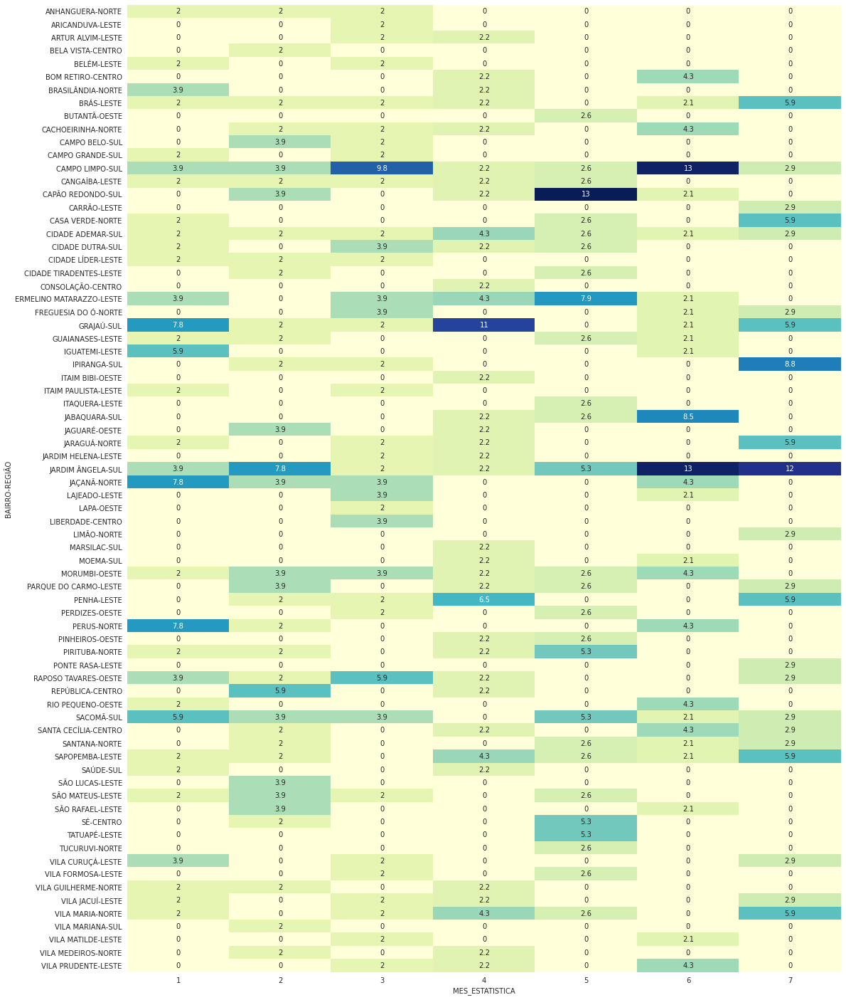

In [362]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(18,25))
sns.heatmap((pd.crosstab([database_tent_homic.BAIRRO,database_tent_homic.REGIÃO], database_tent_homic.MES_ESTATISTICA, values=database_tent_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

         
|    JANEIRO      |   FEVEREIRO     |       MARÇO       |       ABRIL      |      MAIO        |       JUNHO       |      JULHO     |
|:---------------:|:---------------:|:-----------------:|:----------------:|:----------------:|:-----------------:|:---------------:|
|GRAJAÚ **9.5%** |JD. ÂNGELA **11%** |CAMPO LIMPO **14%** |GRAJAÚ **15%** |CAPÃO RED. **19%** |CAMPO LIMPO **15%** |JD. ÂNGELA  **13%**|
|JAÇANÃ **9.5%** |REPÚBLICA **8.3%** |R. TAVARES **8.6%** |PENHA **9.1%** |E. MATARAZZO **11%** |JD. ÂNGELA **15%** |IPIRANGA **9.7%**
|PERUS **9.5%** |CAMPO LIMPO  **5.6%** |SACOMÃ  **5.7%** |SAPOPEMBA **6.6%** |REPÚBLICA **7.4%** |JABAQUARA **10%** |PENHA   **6.5%**|


Analisando as distribuições de ocorrênias pelos bairros em cada mês, notase que em todos os meses pelo há pelo menos 1 bairro da região SUL na tabela com os maiores percentuais Praticamente todos os demais bairros apresentaram percentuais oscilando entre 0% e 3% durante todo o período.

In [363]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
(pd.crosstab([database_tent_homic.BAIRRO,database_tent_homic.REGIÃO], database_tent_homic.MES_ESTATISTICA, values=database_tent_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

,MES_ESTATISTICA,1,2,3,4,5,6,7
BAIRRO,REGIÃO,,,,,,,
ANHANGUERA,NORTE,33.333333,33.333333,33.333333,0.000000,0.000000,0.0,0.000000
ARICANDUVA,LESTE,0.000000,0.000000,100.000000,0.000000,0.000000,0.0,0.000000
ARTUR ALVIM,LESTE,0.000000,0.000000,50.000000,50.000000,0.000000,0.0,0.000000
BELA VISTA,CENTRO,0.000000,100.000000,0.000000,0.000000,0.000000,0.0,0.000000
BELÉM,LESTE,50.000000,0.000000,50.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...
VILA MARIA,NORTE,14.285714,0.000000,14.285714,28.571429,14.285714,0.0,28.571429
VILA MARIANA,SUL,0.000000,100.000000,0.000000,0.000000,0.000000,0.0,0.000000
VILA MATILDE,LESTE,0.000000,0.000000,50.000000,0.000000,0.000000,50.0,0.000000


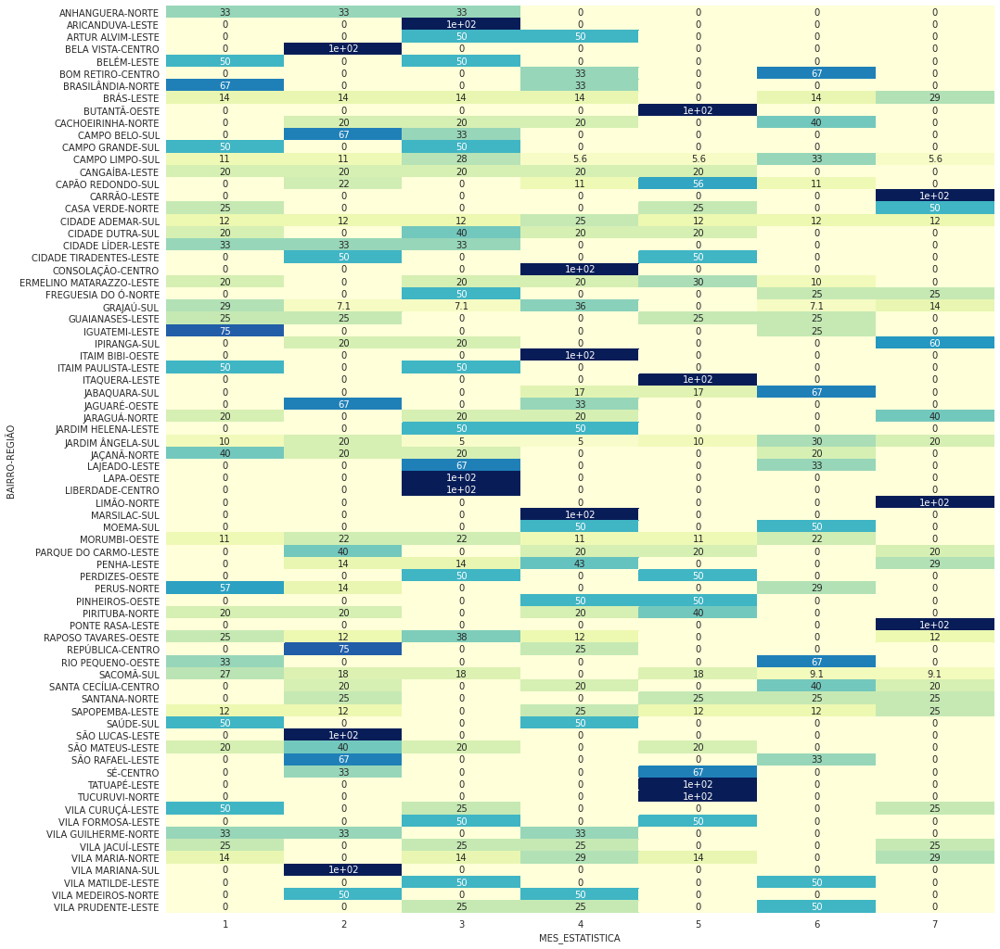

In [364]:
#Gráfico Heatmap da distribuição percentual
plt.figure(figsize=(16,18))
sns.heatmap((pd.crosstab([database_tent_homic.BAIRRO,database_tent_homic.REGIÃO], database_tent_homic.MES_ESTATISTICA, values=database_tent_homic.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="YlGnBu", annot=True, cbar=False)
plt.show()

A mesma análise acima foi feita, porém agora analisando cada bairro ao longo do período (JANEIRO a JULHO), ou seja, em um determinado bairro, de todas as ocorrências de tentativa de homicídio, quais os percentuais em cada mês em relação ao total. Alguns pontos importantes a serem ressaltados:

 - de todos os bairros listados, 23 deles apresentam 50% dos casos nos primeiros 2 meses do período
 - o mês de abril e maio apresentam a maior quantidade de bairros com aumento percentual

#### Análise de Ocorrência TENTATIVA DE HOMICÍDIO na região NORTE

In [365]:
#Separando pela região NORTE
database_tent_homic_n = database_tent_homic[database_tent_homic['REGIÃO']== 'NORTE'].reset_index()

In [366]:
database_tent_homic_n

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,9,17725,1/2/2023,3:20:00 PM,ANHANGUERA,0,0,TENTATIVA DE HOMICÍDIO,1,2023,88677.0,NORTE
1,10,17726,1/7/2023,6:02:00 AM,PERUS,"-23,4194756","-46,7549922",TENTATIVA DE HOMICÍDIO,1,2023,91725.0,NORTE
2,11,17727,1/25/2023,3:10:00 PM,PERUS,"-23,4369166","-46,803325",TENTATIVA DE HOMICÍDIO,1,2023,91725.0,NORTE
3,12,17728,1/26/2023,5:55:00,PERUS,"-23,40555054","-46,75539294",TENTATIVA DE HOMICÍDIO,1,2023,91725.0,NORTE
4,13,17729,1/30/2023,2:00:07 AM,PERUS,"-23,40678982","-46,76498575",TENTATIVA DE HOMICÍDIO,1,2023,91725.0,NORTE
...,...,...,...,...,...,...,...,...,...,...,...,...
59,297,265463,7/20/2023,10:05:00 PM,CASA VERDE,0,0,TENTATIVA DE HOMICÍDIO,7,2023,85871.0,NORTE
60,298,265734,7/1/2023,5:50:00 PM,VILA MARIA,"-23,5112787","-46,5787848",TENTATIVA DE HOMICÍDIO,7,2023,114185.0,NORTE
61,299,265735,7/13/2023,6:00:00 AM,VILA MARIA,0,0,TENTATIVA DE HOMICÍDIO,7,2023,114185.0,NORTE
62,300,267192,7/10/2023,5:40:00 AM,LIMÃO,"-23,4986603","-46,6752118",TENTATIVA DE HOMICÍDIO,7,2023,79686.0,NORTE


In [367]:
x = database_tent_homic_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_tent_homic_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_tent_homic_n.shape[0])

REGIÃO  BAIRRO        
NORTE   JAÇANÃ            10
        PERUS              7
        VILA MARIA         7
        CACHOEIRINHA       5
        JARAGUÁ            5
        PIRITUBA           5
        CASA VERDE         4
        FREGUESIA DO Ó     4
        SANTANA            4
        ANHANGUERA         3
        BRASILÂNDIA        3
        VILA GUILHERME     3
        VILA MEDEIROS      2
        LIMÃO              1
        TUCURUVI           1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        
NORTE   JAÇANÃ            0.156250
        PERUS             0.109375
        VILA MARIA        0.109375
        CACHOEIRINHA      0.078125
        JARAGUÁ           0.078125
        PIRITUBA          0.078125
        CASA VERDE        0.062500
        FREGUESIA DO Ó    0.062500
        SANTANA           0.062500
        ANHANGUERA        0.046875
        BRASILÂNDIA       0.046875
        VILA GUILHERME    0.046875
        VILA MEDEIROS     0.031250
        LIMÃO             0.015625
  

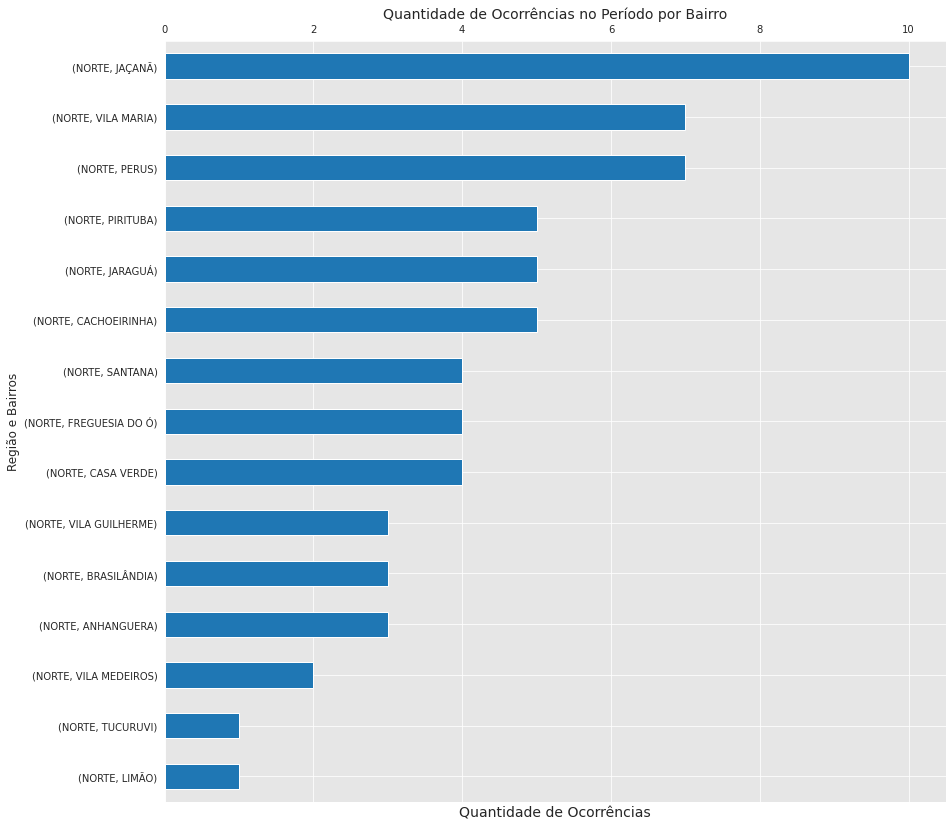

In [368]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_tent_homic_n.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico de ocorrências de tentativa de homicídio somente na região NORTE em todo o período. Nota-se que os bairros com os maiores números de ocorrências são VILA MARIA, JAÇANÃ e PERUS que juntos, somam mais de 30% do total de ocorrências.

In [369]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
tent_homicidio_cross_n = (pd.crosstab([database_tent_homic_n.REGIÃO,database_tent_homic_n.BAIRRO], database_tent_homic_n.MES_ESTATISTICA, values=database_tent_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
tent_homicidio_cross_n.reset_index(inplace=True)
tent_homicidio_cross_n

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,NORTE,ANHANGUERA,6.25,11.111111,12.5,0.0,0.000000,0.0,0.000000,4.6875
1,NORTE,BRASILÂNDIA,12.50,0.000000,0.0,12.5,0.000000,0.0,0.000000,4.6875
2,NORTE,CACHOEIRINHA,0.00,11.111111,12.5,12.5,0.000000,25.0,0.000000,7.8125
3,NORTE,CASA VERDE,6.25,0.000000,0.0,0.0,16.666667,0.0,22.222222,6.2500
4,NORTE,FREGUESIA DO Ó,0.00,0.000000,25.0,0.0,0.000000,12.5,11.111111,6.2500
5,NORTE,JARAGUÁ,6.25,0.000000,12.5,12.5,0.000000,0.0,22.222222,7.8125
6,NORTE,JAÇANÃ,25.00,22.222222,25.0,0.0,0.000000,25.0,0.000000,15.6250
7,NORTE,LIMÃO,0.00,0.000000,0.0,0.0,0.000000,0.0,11.111111,1.5625
8,NORTE,PERUS,25.00,11.111111,0.0,0.0,0.000000,25.0,0.000000,10.9375
9,NORTE,PIRITUBA,6.25,11.111111,0.0,12.5,33.333333,0.0,0.000000,7.8125


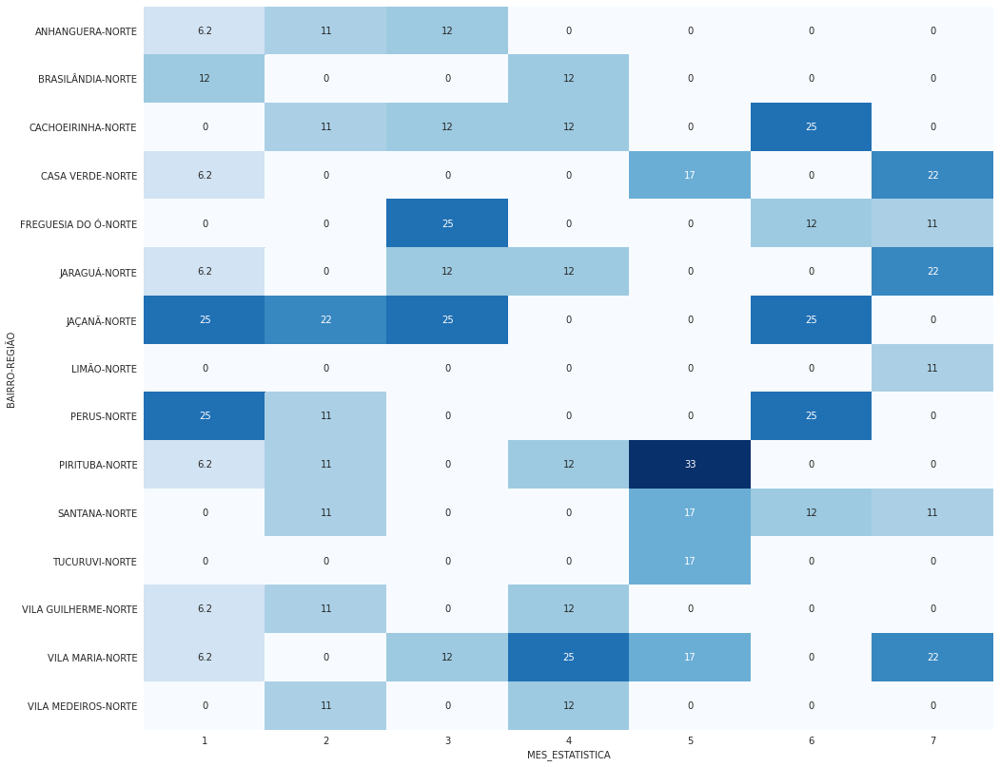

In [370]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_tent_homic_n.BAIRRO,database_tent_homic_n.REGIÃO], database_tent_homic_n.MES_ESTATISTICA, values=database_tent_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês.

In [371]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_tent_homic_n.REGIÃO,database_tent_homic_n.BAIRRO], database_tent_homic_n.MES_ESTATISTICA, values=database_tent_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                1          2          3          4           5  \
REGIÃO BAIRRO                                                                   
NORTE  ANHANGUERA      33.333333  33.333333  33.333333   0.000000    0.000000   
       BRASILÂNDIA     66.666667   0.000000   0.000000  33.333333    0.000000   
       CACHOEIRINHA     0.000000  20.000000  20.000000  20.000000    0.000000   
       CASA VERDE      25.000000   0.000000   0.000000   0.000000   25.000000   
       FREGUESIA DO Ó   0.000000   0.000000  50.000000   0.000000    0.000000   
       JARAGUÁ         20.000000   0.000000  20.000000  20.000000    0.000000   
       JAÇANÃ          40.000000  20.000000  20.000000   0.000000    0.000000   
       LIMÃO            0.000000   0.000000   0.000000   0.000000    0.000000   
       PERUS           57.142857  14.285714   0.000000   0.000000    0.000000   
       PIRITUBA        20.000000  20.000000   0.000000  20.000000   40.000000   
       SANTANA          0.000000  25.000000   0.000000   0.000000   25.000000   
       TUCURUVI         0.000000   0.000000   0.000000   0.000000  100.000000   
       VILA GUILHERME  33.333333  33.333333   0.000000  33.333333    0.000000   
       VILA MARIA      14.285714   0.000000  14.285714  28.571429   14.285714   
       VILA MEDEIROS    0.000000  50.000000   0.000000  50.000000    0.000000   

MES_ESTATISTICA                6           7  
REGIÃO BAIRRO                                 
NORTE  ANHANGUERA       0.000000    0.000000  
       BRASILÂNDIA      0.000000    0.000000  
       CACHOEIRINHA    40.000000    0.000000  
       CASA VERDE       0.000000   50.000000  
       FREGUESIA DO Ó  25.000000   25.000000  
       JARAGUÁ          0.000000   40.000000  
       JAÇANÃ          20.000000    0.000000  
       LIMÃO            0.000000  100.000000  
       PERUS           28.571429    0.000000  
       PIRITUBA         0.000000    0.000000  
       SANTANA         25.000000   25.000000  
       TUCURUVI         0.000000    0.000000  
       VILA GUILHERME   0.000000    0.000000  
       VILA MARIA       0.000000   28.571429  
       VILA MEDEIROS    0.000000    0.000000

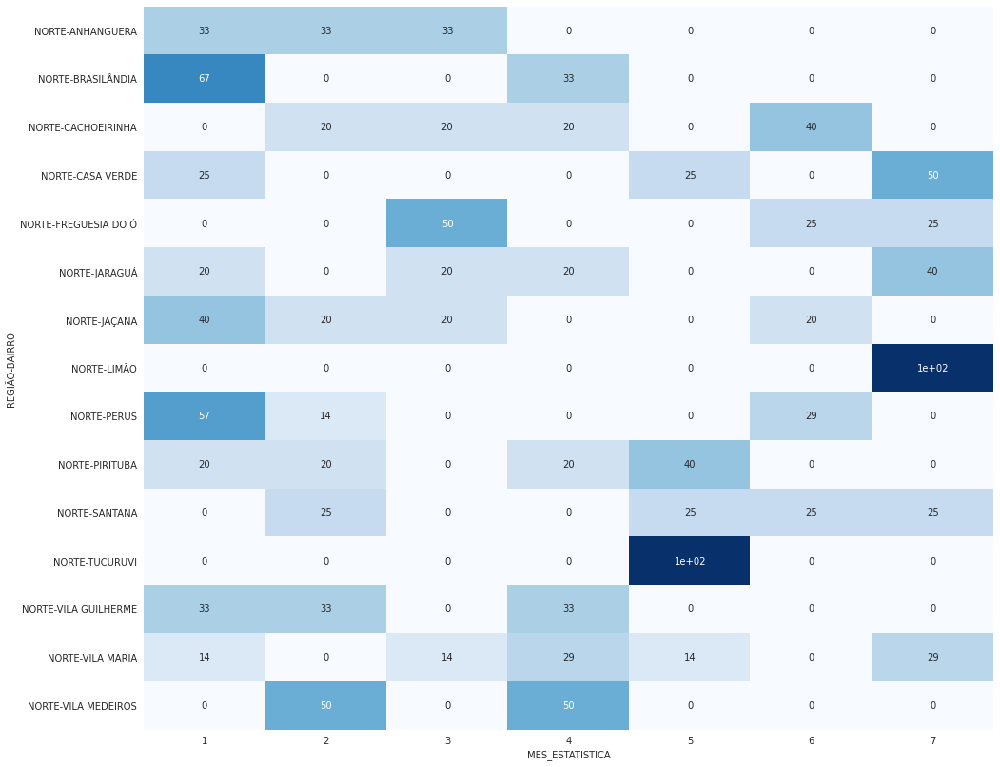

In [372]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_tent_homic_n.REGIÃO,database_tent_homic_n.BAIRRO], database_tent_homic_n.MES_ESTATISTICA, values=database_tent_homic_n.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. 

#### Análise de Ocorrência TENTATIVA DE HOMICÍDIO na região SUL

In [373]:
#Separando pela região SUL
database_tent_homic_s = database_tent_homic[database_tent_homic['REGIÃO']== 'SUL'].reset_index()

In [374]:
database_tent_homic_s

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,2,9628,1/13/2023,12:54:00 AM,SAÚDE,"-23,59941866","-46,64585077",TENTATIVA DE HOMICÍDIO,1,2023,133796.0,SUL
1,3,10244,1/3/2023,12:35:00 AM,SACOMÃ,0,0,TENTATIVA DE HOMICÍDIO,1,2023,266814.0,SUL
2,4,10245,1/17/2023,8:10:00,SACOMÃ,"-23,62929732","-46,61009125",TENTATIVA DE HOMICÍDIO,1,2023,266814.0,SUL
3,5,11962,1/14/2023,4:27:00 PM,SACOMÃ,0,0,TENTATIVA DE HOMICÍDIO,1,2023,266814.0,SUL
4,7,17273,1/4/2023,9:15:00 PM,CAMPO LIMPO,"-23,6461508","-46,7679173",TENTATIVA DE HOMICÍDIO,1,2023,233057.0,SUL
...,...,...,...,...,...,...,...,...,...,...,...,...
102,307,272172,7/29/2023,2:20:00 PM,JARDIM ÂNGELA,0,0,TENTATIVA DE HOMICÍDIO,7,2023,349210.0,SUL
103,308,276129,7/14/2023,7:43:00 PM,GRAJAÚ,"-23,7460789","-46,7060562",TENTATIVA DE HOMICÍDIO,7,2023,398040.0,SUL
104,309,276131,7/21/2023,11:20:00 PM,GRAJAÚ,"-23,7582801","-46,6794561",TENTATIVA DE HOMICÍDIO,7,2023,398040.0,SUL
105,310,276712,7/7/2023,8:10:00 AM,JARDIM ÂNGELA,"-23,65979554","-46,74305148",TENTATIVA DE HOMICÍDIO,7,2023,349210.0,SUL


In [375]:
x = database_tent_homic_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_tent_homic_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_tent_homic_s.shape[0])

REGIÃO  BAIRRO       
SUL     JARDIM ÂNGELA    20
        CAMPO LIMPO      18
        GRAJAÚ           14
        SACOMÃ           11
        CAPÃO REDONDO     9
        CIDADE ADEMAR     8
        JABAQUARA         6
        CIDADE DUTRA      5
        IPIRANGA          5
        CAMPO BELO        3
        CAMPO GRANDE      2
        MOEMA             2
        SAÚDE             2
        MARSILAC          1
        VILA MARIANA      1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
SUL     JARDIM ÂNGELA    0.186916
        CAMPO LIMPO      0.168224
        GRAJAÚ           0.130841
        SACOMÃ           0.102804
        CAPÃO REDONDO    0.084112
        CIDADE ADEMAR    0.074766
        JABAQUARA        0.056075
        CIDADE DUTRA     0.046729
        IPIRANGA         0.046729
        CAMPO BELO       0.028037
        CAMPO GRANDE     0.018692
        MOEMA            0.018692
        SAÚDE            0.018692
        MARSILAC         0.009346
        VILA MARIANA     0.009346

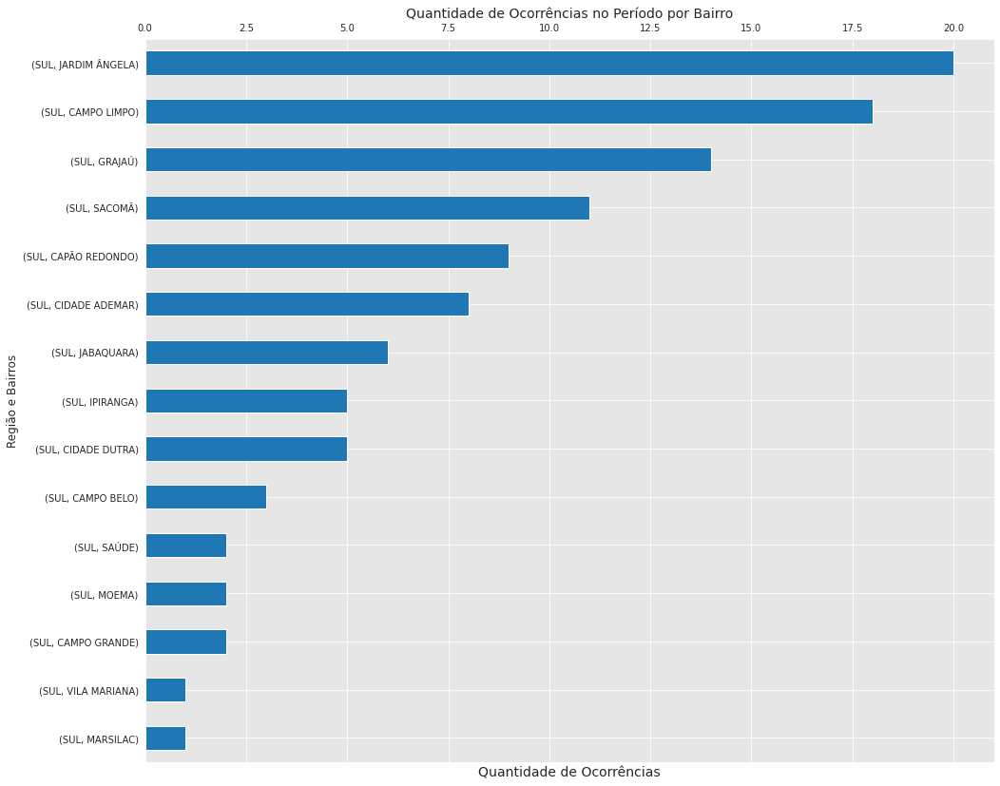

In [376]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_tent_homic_s.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico das ocorrências de tentativa de homicídio somente na região SUL em todo o período. Nota-se que os bairros com o maior número de ocorrências são JARDIM ÂNGELA e CAMPO LIMPO com um percentual muito acima dos demais bairros.

In [377]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
tent_homicidio_cross_s = (pd.crosstab([database_tent_homic_s.REGIÃO,database_tent_homic_s.BAIRRO], database_tent_homic_s.MES_ESTATISTICA, values=database_tent_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100)
tent_homicidio_cross_s.reset_index(inplace=True)
tent_homicidio_cross_s

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,SUL,CAMPO BELO,0.000000,12.50,6.666667,0.000000,0.000000,0.000000,0.000000,2.803738
1,SUL,CAMPO GRANDE,6.666667,0.00,6.666667,0.000000,0.000000,0.000000,0.000000,1.869159
2,SUL,CAMPO LIMPO,13.333333,12.50,33.333333,6.666667,7.692308,28.571429,8.333333,16.822430
3,SUL,CAPÃO REDONDO,0.000000,12.50,0.000000,6.666667,38.461538,4.761905,0.000000,8.411215
4,SUL,CIDADE ADEMAR,6.666667,6.25,6.666667,13.333333,7.692308,4.761905,8.333333,7.476636
5,SUL,CIDADE DUTRA,6.666667,0.00,13.333333,6.666667,7.692308,0.000000,0.000000,4.672897
6,SUL,GRAJAÚ,26.666667,6.25,6.666667,33.333333,0.000000,4.761905,16.666667,13.084112
7,SUL,IPIRANGA,0.000000,6.25,6.666667,0.000000,0.000000,0.000000,25.000000,4.672897
8,SUL,JABAQUARA,0.000000,0.00,0.000000,6.666667,7.692308,19.047619,0.000000,5.607477
9,SUL,JARDIM ÂNGELA,13.333333,25.00,6.666667,6.666667,15.384615,28.571429,33.333333,18.691589


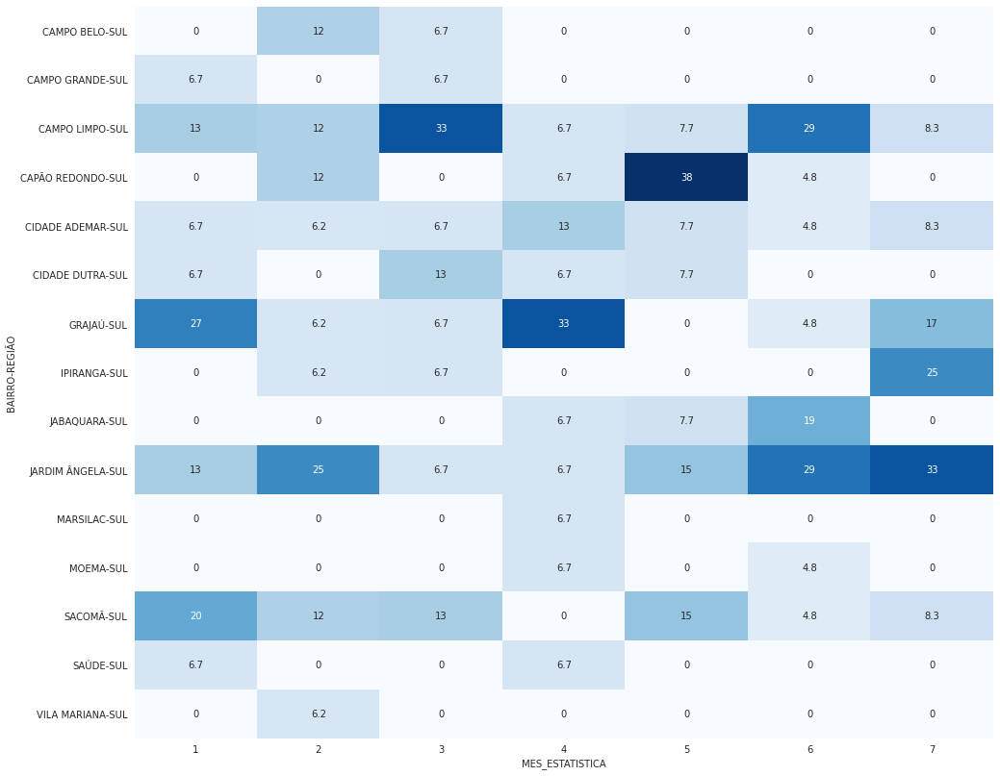

In [378]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_tent_homic_s.BAIRRO,database_tent_homic_s.REGIÃO], database_tent_homic_s.MES_ESTATISTICA, values=database_tent_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídionos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

- só o bairro CAMPO LIMPO foi responsável por 38% de todas as ocorrências no mês de MARÇO e em geral esse bairro apresenta os maiores percentuais ao longo do período
- no mês de abril o CAPÃO REDONDO foi responsável por 38% de todas as ocorrências no mês

In [379]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_tent_homic_s.REGIÃO,database_tent_homic_s.BAIRRO], database_tent_homic_s.MES_ESTATISTICA, values=database_tent_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA               1           2          3           4          5  \
REGIÃO BAIRRO                                                                   
SUL    CAMPO BELO      0.000000   66.666667  33.333333    0.000000   0.000000   
       CAMPO GRANDE   50.000000    0.000000  50.000000    0.000000   0.000000   
       CAMPO LIMPO    11.111111   11.111111  27.777778    5.555556   5.555556   
       CAPÃO REDONDO   0.000000   22.222222   0.000000   11.111111  55.555556   
       CIDADE ADEMAR  12.500000   12.500000  12.500000   25.000000  12.500000   
       CIDADE DUTRA   20.000000    0.000000  40.000000   20.000000  20.000000   
       GRAJAÚ         28.571429    7.142857   7.142857   35.714286   0.000000   
       IPIRANGA        0.000000   20.000000  20.000000    0.000000   0.000000   
       JABAQUARA       0.000000    0.000000   0.000000   16.666667  16.666667   
       JARDIM ÂNGELA  10.000000   20.000000   5.000000    5.000000  10.000000   
       MARSILAC        0.000000    0.000000   0.000000  100.000000   0.000000   
       MOEMA           0.000000    0.000000   0.000000   50.000000   0.000000   
       SACOMÃ         27.272727   18.181818  18.181818    0.000000  18.181818   
       SAÚDE          50.000000    0.000000   0.000000   50.000000   0.000000   
       VILA MARIANA    0.000000  100.000000   0.000000    0.000000   0.000000   

MES_ESTATISTICA               6          7  
REGIÃO BAIRRO                               
SUL    CAMPO BELO      0.000000   0.000000  
       CAMPO GRANDE    0.000000   0.000000  
       CAMPO LIMPO    33.333333   5.555556  
       CAPÃO REDONDO  11.111111   0.000000  
       CIDADE ADEMAR  12.500000  12.500000  
       CIDADE DUTRA    0.000000   0.000000  
       GRAJAÚ          7.142857  14.285714  
       IPIRANGA        0.000000  60.000000  
       JABAQUARA      66.666667   0.000000  
       JARDIM ÂNGELA  30.000000  20.000000  
       MARSILAC        0.000000   0.000000  
       MOEMA          50.000000   0.000000  
       SACOMÃ          9.090909   9.090909  
       SAÚDE           0.000000   0.000000  
       VILA MARIANA    0.000000   0.000000

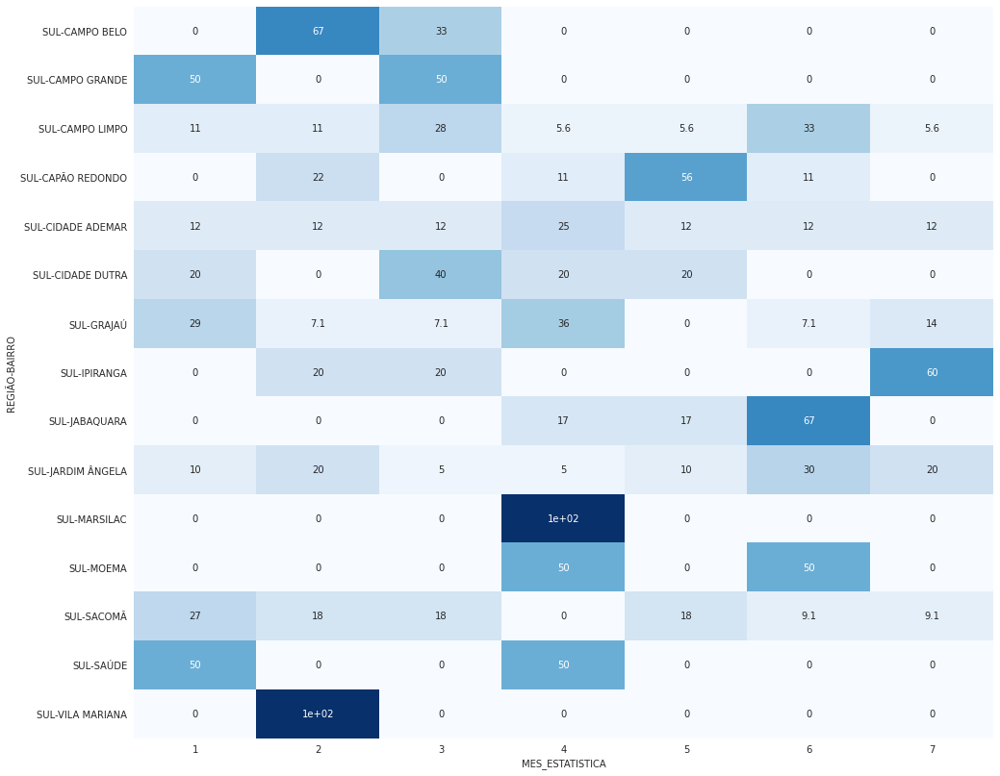

In [380]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,14))
sns.heatmap((pd.crosstab([database_tent_homic_s.REGIÃO,database_tent_homic_s.BAIRRO], database_tent_homic_s.MES_ESTATISTICA, values=database_tent_homic_s.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro.

#### Análise de Ocorrência TENTATIVA DE HOMICÍDIO na região LESTE

In [381]:
#Separando pela região LESTE
database_tent_homic_l = database_tent_homic[database_tent_homic['REGIÃO']== 'LESTE'].reset_index()

In [382]:
database_tent_homic_l

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,0,7148,1/5/2023,8:33:00 AM,BRÁS,"-23,54299276","-46,61670443",TENTATIVA DE HOMICÍDIO,1,2023,33770.0,LESTE
1,1,7149,1/17/2023,8:30:00 PM,BELÉM,"-23,53566151","-46,60135464",TENTATIVA DE HOMICÍDIO,1,2023,49876.0,LESTE
2,37,33055,1/10/2023,6:50:00 PM,VILA CURUÇÁ,0,0,TENTATIVA DE HOMICÍDIO,1,2023,155464.0,LESTE
3,38,33444,1/16/2023,4:15:00 PM,CANGAÍBA,"-23,50003165","-46,53041349",TENTATIVA DE HOMICÍDIO,1,2023,138562.0,LESTE
4,39,34294,1/8/2023,1:20:00 AM,ITAIM PAULISTA,0,0,TENTATIVA DE HOMICÍDIO,1,2023,238478.0,LESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
93,313,278428,7/21/2023,6:05:00 AM,PONTE RASA,0,0,TENTATIVA DE HOMICÍDIO,7,2023,89171.0,LESTE
94,314,279909,7/21/2023,9:47:00 PM,VILA JACUÍ,0,0,TENTATIVA DE HOMICÍDIO,7,2023,147166.0,LESTE
95,315,283084,7/18/2023,6:38:00 PM,PARQUE DO CARMO,"-23,55577117","-46,46116922",TENTATIVA DE HOMICÍDIO,7,2023,72625.0,LESTE
96,316,284310,7/30/2023,9:49:00 PM,SAPOPEMBA,"-23,5866301","-46,4990906",TENTATIVA DE HOMICÍDIO,7,2023,291648.0,LESTE


In [383]:
x = database_tent_homic_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_tent_homic_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_tent_homic_l.shape[0])

REGIÃO  BAIRRO            
LESTE   ERMELINO MATARAZZO    10
        SAPOPEMBA              8
        BRÁS                   7
        PENHA                  7
        CANGAÍBA               5
        PARQUE DO CARMO        5
        SÃO MATEUS             5
        GUAIANASES             4
        IGUATEMI               4
        VILA CURUÇÁ            4
        VILA JACUÍ             4
        VILA PRUDENTE          4
        LAJEADO                3
        SÃO RAFAEL             3
        CIDADE LÍDER           3
        ARTUR ALVIM            2
        BELÉM                  2
        CIDADE TIRADENTES      2
        ITAIM PAULISTA         2
        JARDIM HELENA          2
        SÃO LUCAS              2
        TATUAPÉ                2
        VILA FORMOSA           2
        VILA MATILDE           2
        ARICANDUVA             1
        CARRÃO                 1
        ITAQUERA               1
        PONTE RASA             1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        

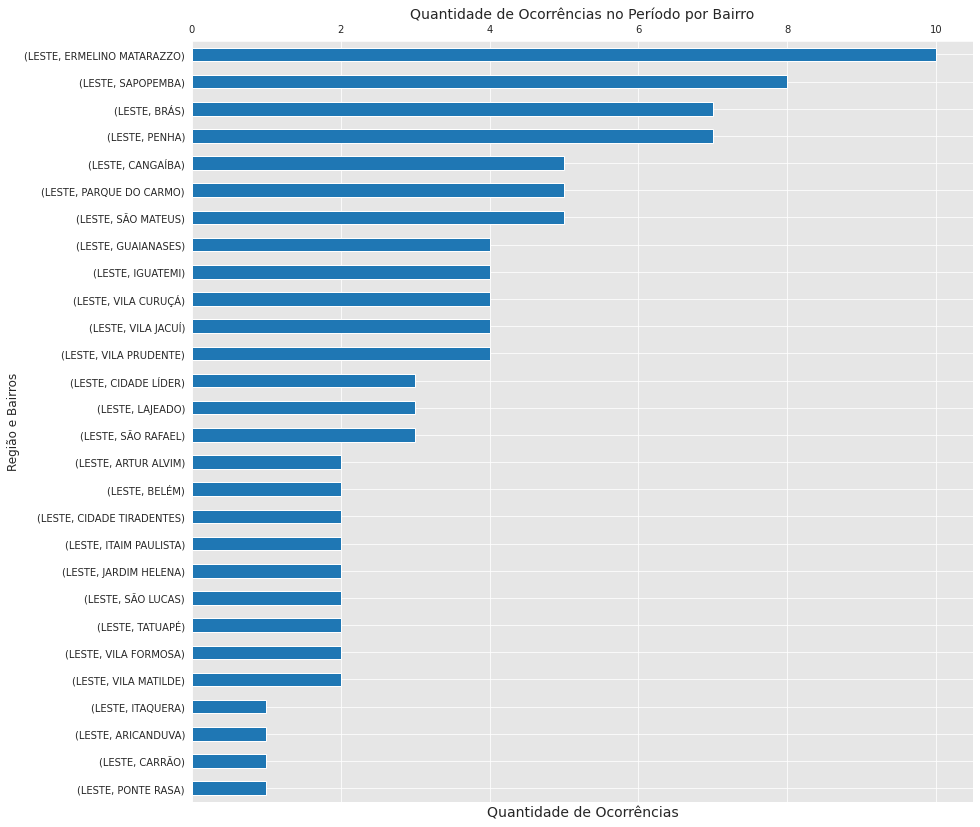

In [384]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(14, 14))
ax = (database_tent_homic_l.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região LESTE em todo o período. Nota-se que o bairro com o maior número de ocorrências de tentativa de homicídio é E.MATARAZZO e SAPOPEMBA.

In [385]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
tent_homicidio_cross_l = pd.crosstab([database_tent_homic_l.REGIÃO,database_tent_homic_l.BAIRRO], database_tent_homic_l.MES_ESTATISTICA, values=database_tent_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
tent_homicidio_cross_l.reset_index(inplace=True)
tent_homicidio_cross_l

MES_ESTATISTICA,REGIÃO,BAIRRO,1,2,3,4,5,6,7,Total
0,LESTE,ARICANDUVA,0.00,0.000000,5.263158,0.000000,0.000000,0.0,0.000000,1.020408
1,LESTE,ARTUR ALVIM,0.00,0.000000,5.263158,7.142857,0.000000,0.0,0.000000,2.040816
2,LESTE,BELÉM,6.25,0.000000,5.263158,0.000000,0.000000,0.0,0.000000,2.040816
3,LESTE,BRÁS,6.25,6.666667,5.263158,7.142857,0.000000,10.0,18.181818,7.142857
4,LESTE,CANGAÍBA,6.25,6.666667,5.263158,7.142857,7.692308,0.0,0.000000,5.102041
5,LESTE,CARRÃO,0.00,0.000000,0.000000,0.000000,0.000000,0.0,9.090909,1.020408
6,LESTE,CIDADE LÍDER,6.25,6.666667,5.263158,0.000000,0.000000,0.0,0.000000,3.061224
7,LESTE,CIDADE TIRADENTES,0.00,6.666667,0.000000,0.000000,7.692308,0.0,0.000000,2.040816
8,LESTE,ERMELINO MATARAZZO,12.50,0.000000,10.526316,14.285714,23.076923,10.0,0.000000,10.204082
9,LESTE,GUAIANASES,6.25,6.666667,0.000000,0.000000,7.692308,10.0,0.000000,4.081633


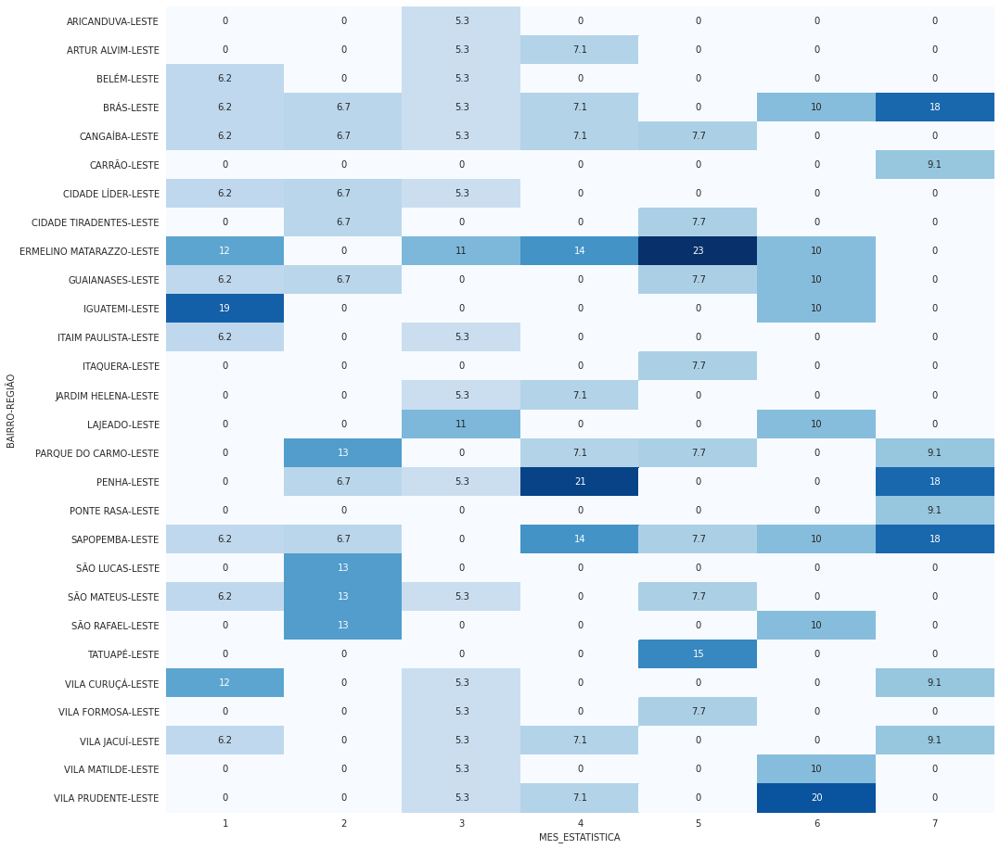

In [386]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_tent_homic_l.BAIRRO,database_tent_homic_l.REGIÃO], database_tent_homic_l.MES_ESTATISTICA, values=database_tent_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações dos furtos nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês. Algumas pontos importantes que valem ressaltar:

 - boa parte dos bairros apresentam altos percentuais nos primeiros 3 meses do período;

In [387]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_tent_homic_l.REGIÃO,database_tent_homic_l.BAIRRO], database_tent_homic_l.MES_ESTATISTICA, values=database_tent_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                    1           2           3          4  \
REGIÃO BAIRRO                                                             
LESTE  ARICANDUVA           0.000000    0.000000  100.000000   0.000000   
       ARTUR ALVIM          0.000000    0.000000   50.000000  50.000000   
       BELÉM               50.000000    0.000000   50.000000   0.000000   
       BRÁS                14.285714   14.285714   14.285714  14.285714   
       CANGAÍBA            20.000000   20.000000   20.000000  20.000000   
       CARRÃO               0.000000    0.000000    0.000000   0.000000   
       CIDADE LÍDER        33.333333   33.333333   33.333333   0.000000   
       CIDADE TIRADENTES    0.000000   50.000000    0.000000   0.000000   
       ERMELINO MATARAZZO  20.000000    0.000000   20.000000  20.000000   
       GUAIANASES          25.000000   25.000000    0.000000   0.000000   
       IGUATEMI            75.000000    0.000000    0.000000   0.000000   
       ITAIM PAULISTA      50.000000    0.000000   50.000000   0.000000   
       ITAQUERA             0.000000    0.000000    0.000000   0.000000   
       JARDIM HELENA        0.000000    0.000000   50.000000  50.000000   
       LAJEADO              0.000000    0.000000   66.666667   0.000000   
       PARQUE DO CARMO      0.000000   40.000000    0.000000  20.000000   
       PENHA                0.000000   14.285714   14.285714  42.857143   
       PONTE RASA           0.000000    0.000000    0.000000   0.000000   
       SAPOPEMBA           12.500000   12.500000    0.000000  25.000000   
       SÃO LUCAS            0.000000  100.000000    0.000000   0.000000   
       SÃO MATEUS          20.000000   40.000000   20.000000   0.000000   
       SÃO RAFAEL           0.000000   66.666667    0.000000   0.000000   
       TATUAPÉ              0.000000    0.000000    0.000000   0.000000   
       VILA CURUÇÁ         50.000000    0.000000   25.000000   0.000000   
       VILA FORMOSA         0.000000    0.000000   50.000000   0.000000   
       VILA JACUÍ          25.000000    0.000000   25.000000  25.000000   
       VILA MATILDE         0.000000    0.000000   50.000000   0.000000   
       VILA PRUDENTE        0.000000    0.000000   25.000000  25.000000   

MES_ESTATISTICA                5          6           7  
REGIÃO BAIRRO                                            
LESTE  ARICANDUVA            0.0   0.000000    0.000000  
       ARTUR ALVIM           0.0   0.000000    0.000000  
       BELÉM                 0.0   0.000000    0.000000  
       BRÁS                  0.0  14.285714   28.571429  
       CANGAÍBA             20.0   0.000000    0.000000  
       CARRÃO                0.0   0.000000  100.000000  
       CIDADE LÍDER          0.0   0.000000    0.000000  
       CIDADE TIRADENTES    50.0   0.000000    0.000000  
       ERMELINO MATARAZZO   30.0  10.000000    0.000000  
       GUAIANASES           25.0  25.000000    0.000000  
       IGUATEMI              0.0  25.000000    0.000000  
       ITAIM PAULISTA        0.0   0.000000    0.000000  
       ITAQUERA            100.0   0.000000    0.000000  
       JARDIM HELENA         0.0   0.000000    0.000000  
       LAJEADO               0.0  33.333333    0.000000  
       PARQUE DO CARMO      20.0   0.000000   20.000000  
       PENHA                 0.0   0.000000   28.571429  
       PONTE RASA            0.0   0.000000  100.000000  
       SAPOPEMBA            12.5  12.500000   25.000000  
       SÃO LUCAS             0.0   0.000000    0.000000  
       SÃO MATEUS           20.0   0.000000    0.000000  
       SÃO RAFAEL            0.0  33.333333    0.000000  
       TATUAPÉ             100.0   0.000000    0.000000  
       VILA CURUÇÁ           0.0   0.000000   25.000000  
       VILA FORMOSA         50.0   0.000000    0.000000  
       VILA JACUÍ            0.0   0.000000   25.000000  
       VILA MATILDE          0.0  50.000000    0.000000  
       VILA PRUDENTE         0.0  50.000000    0.000000

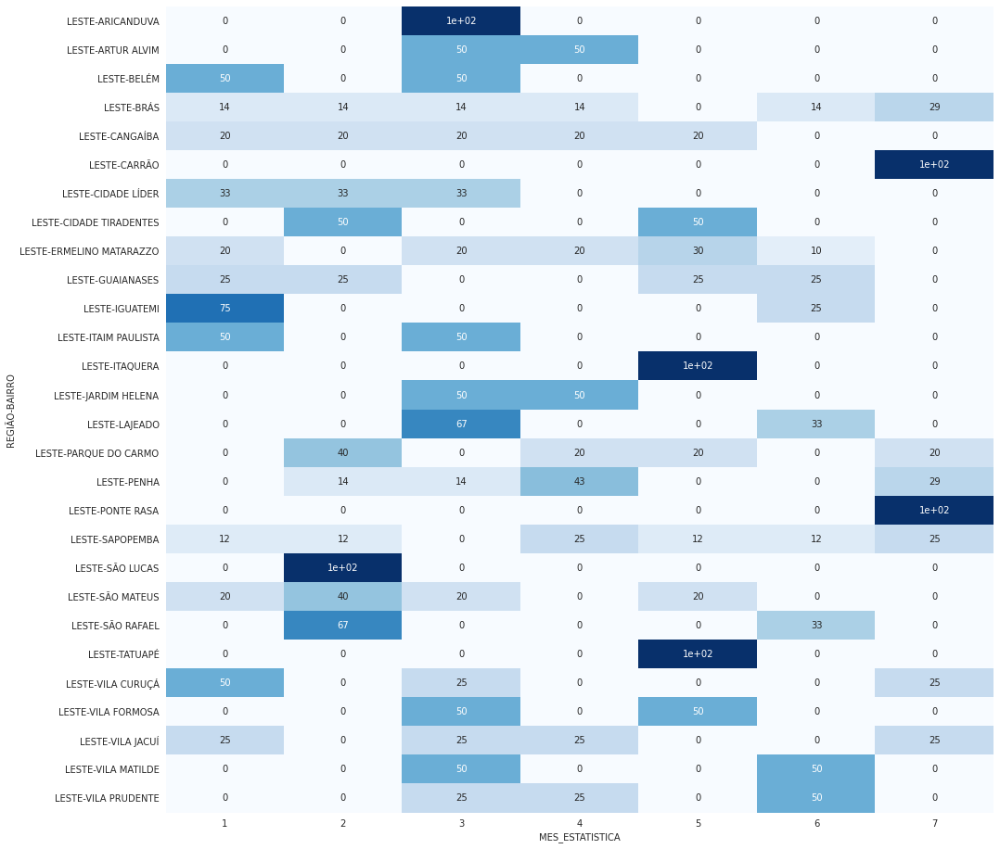

In [388]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,16))
sns.heatmap((pd.crosstab([database_tent_homic_l.REGIÃO,database_tent_homic_l.BAIRRO], database_tent_homic_l.MES_ESTATISTICA, values=database_tent_homic_l.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro. 

#### Análise de Ocorrência TENTATIVA DE HOMICÍDIO na região OESTE

In [389]:
#Separando pela região OESTE
database_tent_homic_o = database_tent_homic[database_tent_homic['REGIÃO']== 'OESTE'].reset_index()

In [390]:
database_tent_homic_o

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,6,16521,1/14/2023,11:30:00 AM,MORUMBI,0,0,TENTATIVA DE HOMICÍDIO,1,2023,54007.0,OESTE
1,14,18069,1/3/2023,11:50:00 PM,RIO PEQUENO,0,0,TENTATIVA DE HOMICÍDIO,1,2023,124671.0,OESTE
2,15,18372,1/14/2023,10:04:00 AM,RAPOSO TAVARES,0,0,TENTATIVA DE HOMICÍDIO,1,2023,109052.0,OESTE
3,16,18373,1/29/2023,18:15:00,RAPOSO TAVARES,"-23,59693062","-46,76927574",TENTATIVA DE HOMICÍDIO,1,2023,109052.0,OESTE
4,64,58143,2/17/2023,10:54:00 PM,MORUMBI,"-23,58683736","-46,75027701",TENTATIVA DE HOMICÍDIO,2,2023,54007.0,OESTE
5,65,58144,2/19/2023,10:21:00 PM,MORUMBI,"-23,60770871","-46,70183376",TENTATIVA DE HOMICÍDIO,2,2023,54007.0,OESTE
6,70,59937,2/6/2023,NaN,RAPOSO TAVARES,"-23,59816015","-46,77460088",TENTATIVA DE HOMICÍDIO,2,2023,109052.0,OESTE
7,72,60973,2/23/2023,7:30:00 PM,JAGUARÉ,"-23,5468867","-46,74646545",TENTATIVA DE HOMICÍDIO,2,2023,56292.0,OESTE
8,73,60974,2/23/2023,7:30:00 PM,JAGUARÉ,"-23,5471603","-46,7464306",TENTATIVA DE HOMICÍDIO,2,2023,56292.0,OESTE
9,109,93984,3/18/2023,6:06:00 PM,LAPA,"-23,52057516","-46,70104979",TENTATIVA DE HOMICÍDIO,3,2023,66909.0,OESTE


In [391]:
X = database_tent_homic_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_tent_homic_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_tent_homic_o.shape[0])

REGIÃO  BAIRRO            
LESTE   ERMELINO MATARAZZO    10
        SAPOPEMBA              8
        BRÁS                   7
        PENHA                  7
        CANGAÍBA               5
        PARQUE DO CARMO        5
        SÃO MATEUS             5
        GUAIANASES             4
        IGUATEMI               4
        VILA CURUÇÁ            4
        VILA JACUÍ             4
        VILA PRUDENTE          4
        LAJEADO                3
        SÃO RAFAEL             3
        CIDADE LÍDER           3
        ARTUR ALVIM            2
        BELÉM                  2
        CIDADE TIRADENTES      2
        ITAIM PAULISTA         2
        JARDIM HELENA          2
        SÃO LUCAS              2
        TATUAPÉ                2
        VILA FORMOSA           2
        VILA MATILDE           2
        ARICANDUVA             1
        CARRÃO                 1
        ITAQUERA               1
        PONTE RASA             1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO        

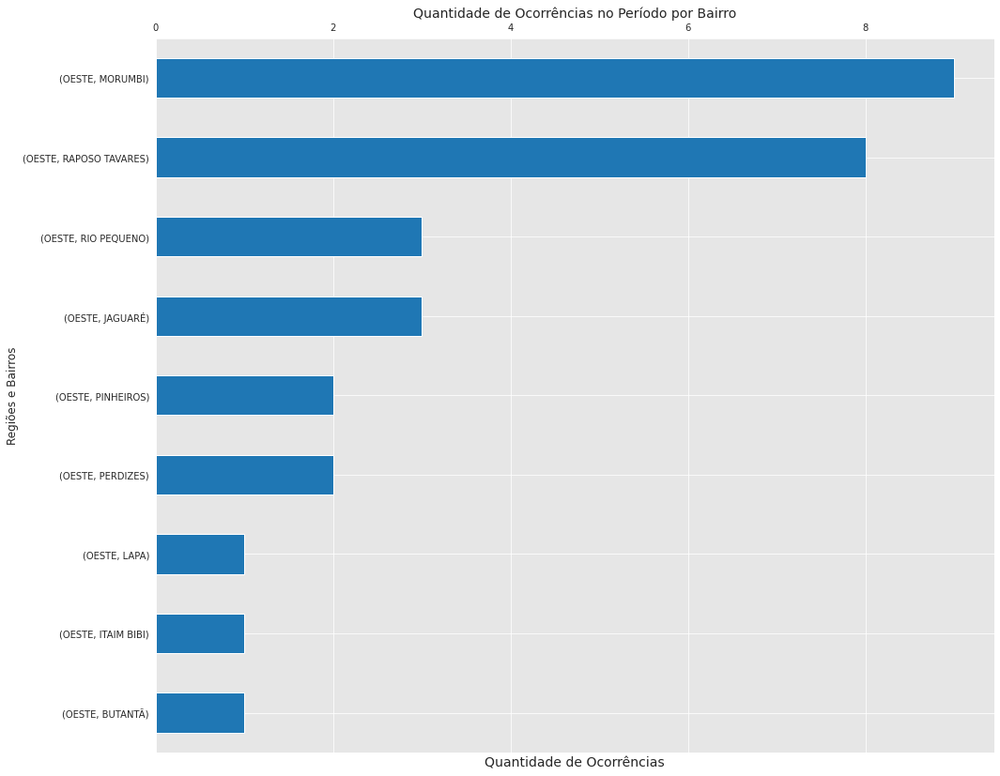

In [392]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 14))
ax = (database_tent_homic_o.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Regiões e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico dos furtos ocorridos somente na região CENTRAL em todo o período. Nota-se que os bairros com o maiores números de ocorrências de tentativa de homicídio (MORUMBI e RAPOSO TAVARES) apresentam mais de 70% do total de ocorrências na região

In [393]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
tent_homicidio_cross_o = pd.crosstab([database_tent_homic_o.BAIRRO,database_tent_homic_o.REGIÃO], database_tent_homic_o.MES_ESTATISTICA, values=database_tent_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
tent_homicidio_cross_o.reset_index(inplace=True)
tent_homicidio_cross_o

MES_ESTATISTICA,BAIRRO,REGIÃO,1,2,3,4,5,6,7,Total
0,BUTANTÃ,OESTE,0.0,0.0,0.000000,0.0,25.0,0.0,0.0,3.333333
1,ITAIM BIBI,OESTE,0.0,0.0,0.000000,20.0,0.0,0.0,0.0,3.333333
2,JAGUARÉ,OESTE,0.0,40.0,0.000000,20.0,0.0,0.0,0.0,10.000000
3,LAPA,OESTE,0.0,0.0,14.285714,0.0,0.0,0.0,0.0,3.333333
4,MORUMBI,OESTE,25.0,40.0,28.571429,20.0,25.0,50.0,0.0,30.000000
5,PERDIZES,OESTE,0.0,0.0,14.285714,0.0,25.0,0.0,0.0,6.666667
6,PINHEIROS,OESTE,0.0,0.0,0.000000,20.0,25.0,0.0,0.0,6.666667
7,RAPOSO TAVARES,OESTE,50.0,20.0,42.857143,20.0,0.0,0.0,100.0,26.666667
8,RIO PEQUENO,OESTE,25.0,0.0,0.000000,0.0,0.0,50.0,0.0,10.000000


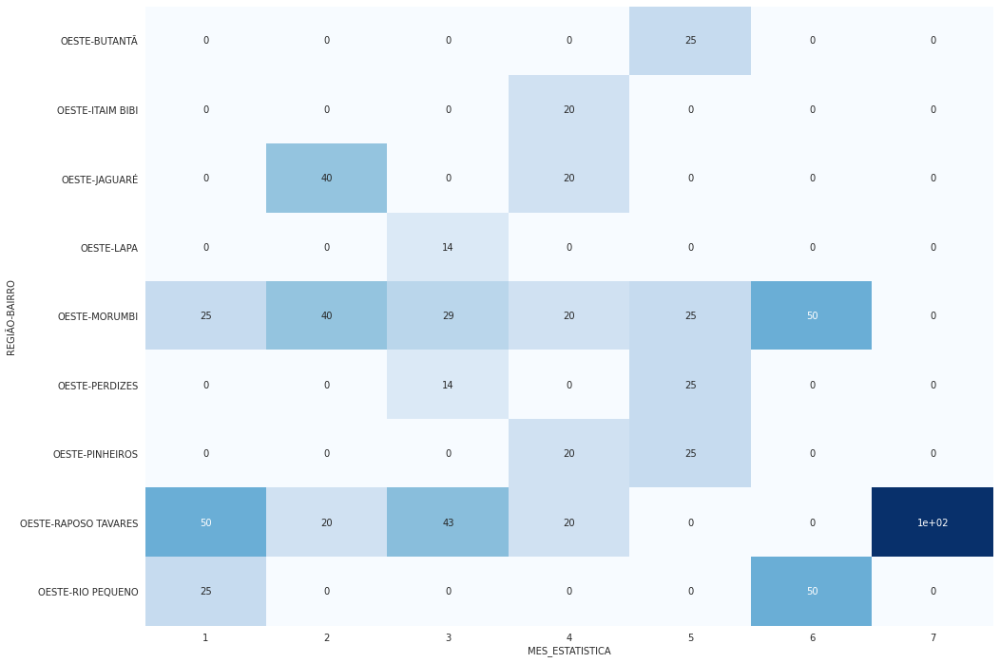

In [394]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_tent_homic_o.REGIÃO,database_tent_homic_o.BAIRRO], database_tent_homic_o.MES_ESTATISTICA, values=database_tent_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total de furtos registrados em cada mês nde percebe-se que a maior parte das ocorrências aconteceram entre fevereiro e março e entre junho e julho.

In [395]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
(pd.crosstab([database_tent_homic_o.REGIÃO,database_tent_homic_o.BAIRRO], database_tent_homic_o.MES_ESTATISTICA, values=database_tent_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100)

MES_ESTATISTICA                1          2           3           4  \
REGIÃO BAIRRO                                                         
OESTE  BUTANTÃ          0.000000   0.000000    0.000000    0.000000   
       ITAIM BIBI       0.000000   0.000000    0.000000  100.000000   
       JAGUARÉ          0.000000  66.666667    0.000000   33.333333   
       LAPA             0.000000   0.000000  100.000000    0.000000   
       MORUMBI         11.111111  22.222222   22.222222   11.111111   
       PERDIZES         0.000000   0.000000   50.000000    0.000000   
       PINHEIROS        0.000000   0.000000    0.000000   50.000000   
       RAPOSO TAVARES  25.000000  12.500000   37.500000   12.500000   
       RIO PEQUENO     33.333333   0.000000    0.000000    0.000000   

MES_ESTATISTICA                 5          6     7  
REGIÃO BAIRRO                                       
OESTE  BUTANTÃ         100.000000   0.000000   0.0  
       ITAIM BIBI        0.000000   0.000000   0.0  
       JAGUARÉ           0.000000   0.000000   0.0  
       LAPA              0.000000   0.000000   0.0  
       MORUMBI          11.111111  22.222222   0.0  
       PERDIZES         50.000000   0.000000   0.0  
       PINHEIROS        50.000000   0.000000   0.0  
       RAPOSO TAVARES    0.000000   0.000000  12.5  
       RIO PEQUENO       0.000000  66.666667   0.0

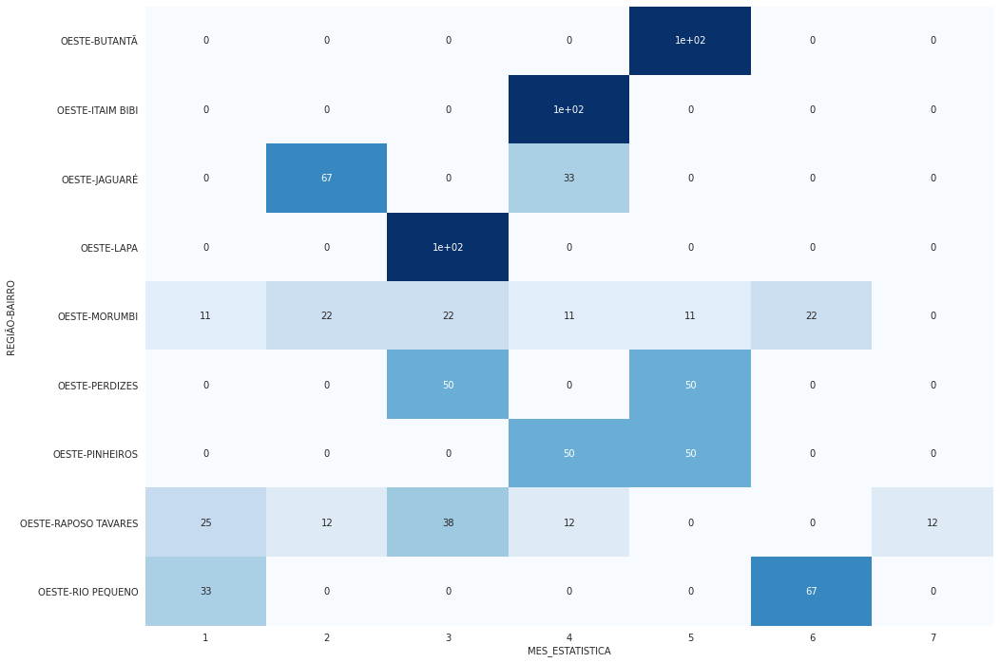

In [396]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_tent_homic_o.REGIÃO,database_tent_homic_o.BAIRRO], database_tent_homic_o.MES_ESTATISTICA, values=database_tent_homic_o.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro.

#### Análise de Ocorrência TENTATIVA DE HOMICÍDIO na região CENTRAL

In [397]:
#Separando pela região CENTRAL
database_tent_homic_c = database_tent_homic[database_tent_homic['REGIÃO']== 'CENTRO'].reset_index()

In [398]:
database_tent_homic_c

,level_0,index,DATA_OCORRENCIA_BO,HORA_OCORRENCIA_BO,BAIRRO,LATITUDE,LONGITUDE,NATUREZA_APURADA,MES_ESTATISTICA,ANO_ESTATISTICA,POPULACAO,REGIÃO
0,51,43796,2/2/2023,4:00:00 PM,REPÚBLICA,0,0,TENTATIVA DE HOMICÍDIO,2,2023,62203.0,CENTRO
1,52,43797,2/13/2023,2:18:56 PM,SANTA CECÍLIA,"-23,53702539","-46,64332683",TENTATIVA DE HOMICÍDIO,2,2023,88795.0,CENTRO
2,53,43798,2/18/2023,12:50:00 AM,REPÚBLICA,"-23,5423974","-46,6448225",TENTATIVA DE HOMICÍDIO,2,2023,62203.0,CENTRO
3,54,43799,2/24/2023,9:10:00 AM,REPÚBLICA,0,0,TENTATIVA DE HOMICÍDIO,2,2023,62203.0,CENTRO
4,55,45711,2/9/2023,9:30:00 AM,BELA VISTA,0,0,TENTATIVA DE HOMICÍDIO,2,2023,73508.0,CENTRO
5,56,45712,2/18/2023,NaN,SÉ,"-23,55292332","-46,63577335",TENTATIVA DE HOMICÍDIO,2,2023,27241.0,CENTRO
6,102,81006,3/7/2023,12:14:13 AM,LIBERDADE,"-23,5551655","-46,6286125",TENTATIVA DE HOMICÍDIO,3,2023,73170.0,CENTRO
7,103,85528,3/2/2023,7:04:00 PM,LIBERDADE,"-23,57193327","-46,62855486",TENTATIVA DE HOMICÍDIO,3,2023,73170.0,CENTRO
8,153,130600,4/15/2023,12:20:00 AM,BOM RETIRO,"-23,53417089","-46,6257948",TENTATIVA DE HOMICÍDIO,4,2023,39856.0,CENTRO
9,155,131111,4/8/2023,10:54:00 PM,REPÚBLICA,"-23,5455031","-46,64477226",TENTATIVA DE HOMICÍDIO,4,2023,62203.0,CENTRO


In [399]:
x = database_tent_homic_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)
print(x)
print(database_tent_homic_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=False)/database_tent_homic_c.shape[0])

REGIÃO  BAIRRO       
CENTRO  SANTA CECÍLIA    5
        REPÚBLICA        4
        BOM RETIRO       3
        SÉ               3
        LIBERDADE        2
        BELA VISTA       1
        CONSOLAÇÃO       1
Name: BAIRRO, dtype: int64
REGIÃO  BAIRRO       
CENTRO  SANTA CECÍLIA    0.263158
        REPÚBLICA        0.210526
        BOM RETIRO       0.157895
        SÉ               0.157895
        LIBERDADE        0.105263
        BELA VISTA       0.052632
        CONSOLAÇÃO       0.052632
Name: BAIRRO, dtype: float64


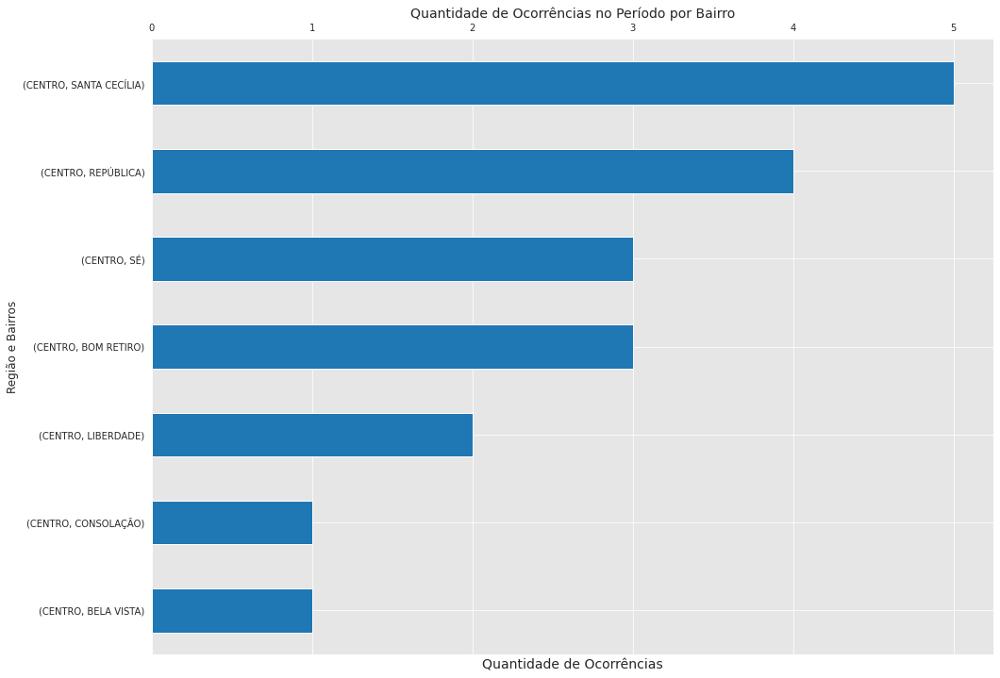

In [400]:
#Plotando o gráfico Quantidade de Furtos no Período por Bairro e Região
fig, ax = plt.subplots(figsize=(16, 12))
ax = (database_tent_homic_c.groupby('REGIÃO')['BAIRRO'].value_counts().sort_values(ascending=True)).plot.barh()
ax.set_ylabel('Região e Bairros', fontsize=12)
ax.set_xlabel('Quantidade de Ocorrências', fontsize=14)
ax.set_title('Quantidade de Ocorrências no Período por Bairro', fontsize=14)
ax.tick_params(labelbottom=False,labeltop=True)
plt.show()

Acima tem-se o gráfico das ocorrências de tentativa de homicídio somente na região CENTRAL em todo o período. Nota-se que os bairros com o maior número de ocorrências de tentativa de homicídio são SANTA CECÍLIA e REPÍBLICA.

In [401]:
#Criando uma tabela de referência cruzada dos dados percentuais entre os meses e os bairros
tent_homicidio_cross_c = pd.crosstab([database_tent_homic_c.REGIÃO,database_tent_homic_c.BAIRRO], database_tent_homic_c.MES_ESTATISTICA, values=database_tent_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns',margins=True, margins_name = 'Total')*100
tent_homicidio_cross_c.reset_index(inplace=True)
tent_homicidio_cross_c

MES_ESTATISTICA,REGIÃO,BAIRRO,2,3,4,5,6,7,Total
0,CENTRO,BELA VISTA,16.666667,0.0,0.0,0.0,0.0,0.0,5.263158
1,CENTRO,BOM RETIRO,0.000000,0.0,25.0,0.0,50.0,0.0,15.789474
2,CENTRO,CONSOLAÇÃO,0.000000,0.0,25.0,0.0,0.0,0.0,5.263158
3,CENTRO,LIBERDADE,0.000000,100.0,0.0,0.0,0.0,0.0,10.526316
4,CENTRO,REPÚBLICA,50.000000,0.0,25.0,0.0,0.0,0.0,21.052632
5,CENTRO,SANTA CECÍLIA,16.666667,0.0,25.0,0.0,50.0,100.0,26.315789
6,CENTRO,SÉ,16.666667,0.0,0.0,100.0,0.0,0.0,15.789474


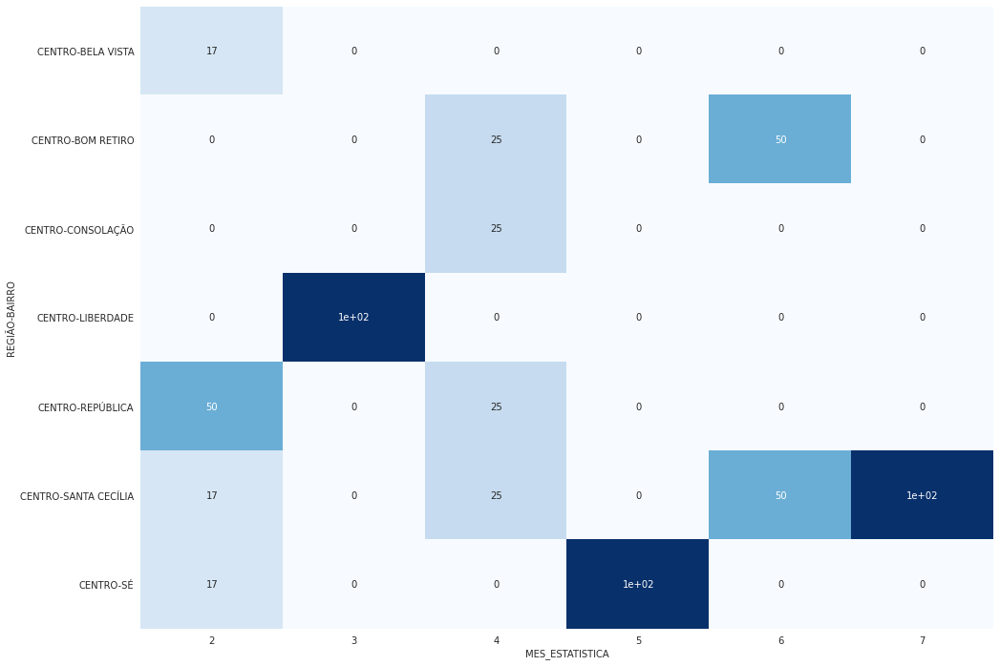

In [402]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_tent_homic_c.REGIÃO,database_tent_homic_c.BAIRRO], database_tent_homic_c.MES_ESTATISTICA, values=database_tent_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='columns')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, quanto determinado bairro contribuiu com o total registrados em cada mês.

In [403]:
#Criando uma tabela de referência cruzada dos dados de cada bairro entre os meses
pd.crosstab([database_tent_homic_c.REGIÃO,database_tent_homic_c.BAIRRO], database_tent_homic_c.MES_ESTATISTICA, values=database_tent_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100

MES_ESTATISTICA                2      3           4          5          6  \
REGIÃO BAIRRO                                                               
CENTRO BELA VISTA     100.000000    0.0    0.000000   0.000000   0.000000   
       BOM RETIRO       0.000000    0.0   33.333333   0.000000  66.666667   
       CONSOLAÇÃO       0.000000    0.0  100.000000   0.000000   0.000000   
       LIBERDADE        0.000000  100.0    0.000000   0.000000   0.000000   
       REPÚBLICA       75.000000    0.0   25.000000   0.000000   0.000000   
       SANTA CECÍLIA   20.000000    0.0   20.000000   0.000000  40.000000   
       SÉ              33.333333    0.0    0.000000  66.666667   0.000000   

MES_ESTATISTICA          7  
REGIÃO BAIRRO               
CENTRO BELA VISTA      0.0  
       BOM RETIRO      0.0  
       CONSOLAÇÃO      0.0  
       LIBERDADE       0.0  
       REPÚBLICA       0.0  
       SANTA CECÍLIA  20.0  
       SÉ              0.0

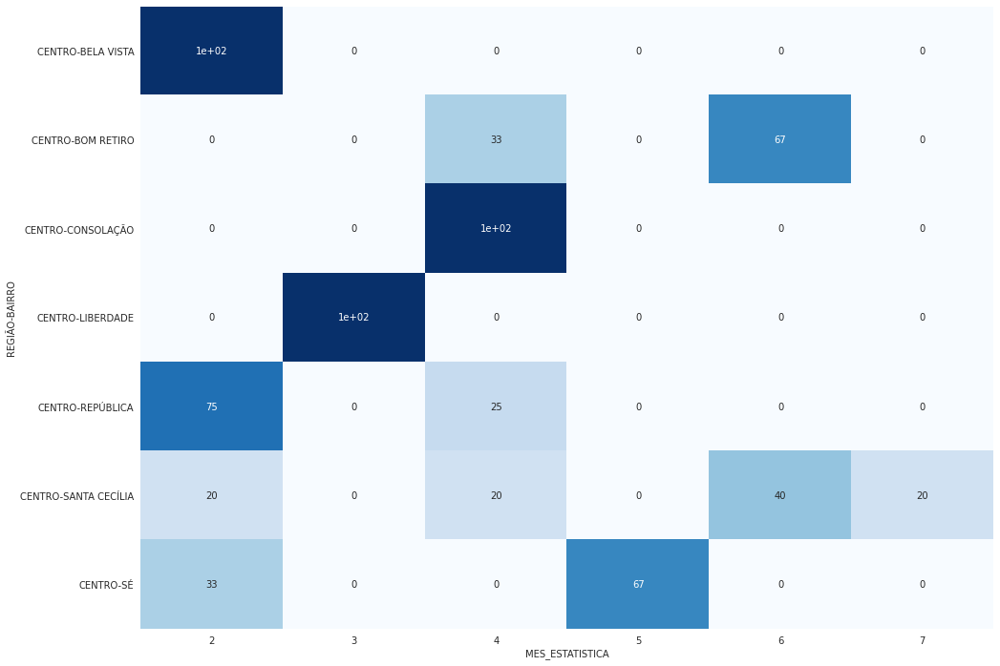

In [404]:
#Criando um heatmap com os resultados acima
plt.figure(figsize=(16,12))
sns.heatmap((pd.crosstab([database_tent_homic_c.REGIÃO,database_tent_homic_c.BAIRRO], database_tent_homic_c.MES_ESTATISTICA, values=database_tent_homic_c.ANO_ESTATISTICA, aggfunc=np.sum, normalize='index')*100),
    cmap="Blues", annot=True, cbar=False)
plt.show()

A Tabela  e o gráfico do tipo heatmap gerados com as informações das ocorrências de tentativa de homicídio nos bairros mostra o percentual de cada bairro separado por mês, ou seja, a distribuição  por mês dos percentuais de todas as ocorrências separados por bairro, onde verifica-se um grande aumento quase generalizado no mês de abril em todos os bairros.

## Conclusão

O Objetivo dessa perte do projeto é analisar todos os bairros em relação aos principais tipos de ocorrências, afim de se verificar dentre todos os bairros quais são os mais seguros em cada região.

Foi utilizado a base de dados da Secretaria  de Segurança Pública de São Paulo e a base de dados do IBGE-SP.Durante a limpeza e manipulação dos dados verificou-se que havia uma divergência entre a quantidade de bairros listados na base da Secretaria com os bairros listados no IBGE-SP: na base da Secretaria haviam 2400 nomes de bairros enquanto que na base do IBGE haviam somente 100 (pesquisando a respeito, um dos motivos é que o IBGE considera somente os bairros distritais (principais bairros com subprefeituras) enquanto que na base da secretaria haviam inúmeros nome de vilas, bairros menores e comunidades). Sendo assim, houve a necessidade de uma pré-limpeza dos dados, afim de verificar cada vilinha, comunidade a qual distrito pertenciam.

Foram excluidas algumas colunas que não seriam úteis aos propósitos do projeto e foi verificado que há diversas categorias de crimes para a mesma natureza da ocorrência. Esse tipo de classificação pode ser importante para órgãos goernamentais e setores especializados em segurança, mas para um usuário final não faz muito sentido essa classificação. Por isso, optou-se por reclassificar essas subcategorias afim de ficar mais simples para o usuário, afinal, independente da natureza, um roubo é um roubo.

O foco será voltado para as ocorrências onde há um grande volume de dados, ou seja, FURTO, ROUBO, HOMICÍDIO,LESÃO CORPORAL, ACIDENTE DE TRÂNSITO, ESTUPRO E TENTATIVA DE HOMICÍDIO.
Os demais tipos de delitos serão desconsiderados por insuficiência de dados (LATROCÍNIO e ROUBO A BANCO)

Foi separado por Tipo de Ocorrência e analisado cada região separadamente. Alguns pontos interessantes a serem apontados:

 - **FURTO**
     - região LESTE é a que concentra a maior quantidade de ocorrências
     - mês mais perigoso: MARÇO
     - bairros mais perigosos:
     
|    NORTE    |   SUL     |       LESTE       |     OESTE      |      CENTRAL       | 
|:----------:|:----------:|:-------------:|:-------------:|:-----------------:|
|SANTANA   |CAPÃO REDONDO  |SÃO MATEUS   |PINHEIROS   |REPÚBLICA |
|BRASILÂNDIA   |CAMPO LIMPO  |E. MATARAZZO  |ITAIM BIBI   |SÉ |
|JAÇANÃ    |JARDIM ÂNGELA   |ITAIM PAULISTA   |MORUMBI   |CONSOLAÇÃO |


 - **ROUBO**
     - região SUL é a que concentra a maior quantidade de ocorrências
     - mês mais perigoso: MARÇO
     - bairros mais perigosos:
     
|    NORTE    |   SUL     |       LESTE       |     OESTE      |      CENTRAL       | 
|:----------:|:----------:|:-------------:|:-------------:|:-----------------:|
|SANTANA   |JARDIM ÂNGELA   |E. MATARAZZO   |PINHEIROS   |REPÚBLICA |
|BRASILÂNDIA   |GRAJAÚ  |SAPOPEMBA  |ITAIM BIBI   |SÉ |
|JAÇANÃ    |CAPÃO REDONDO  |SÃO MATEUS   |MORUMBI   |CONSOLAÇÃO |


 - **LESÃO CORPORAL**
     - região LESTE é a que concentra a maior quantidade de ocorrências
     - mês mais perigoso: MARÇO
     - bairros mais perigosos:
     
|    NORTE    |   SUL     |       LESTE       |     OESTE      |      CENTRAL       | 
|:----------:|:----------:|:-------------:|:-------------:|:-----------------:|
|BRASILÂNDIA   |CAPÃO REDONDO  |SÃO MATEUS   |PINHEIROS   |BELA VISTA |
|JAÇANÃ   |CAMPO LIMPO  |E. MATARAZZO  |RAPOSO TAVARES   |REPÚBLICA |
|CACHOEIRINHA  |JARDIM ÂNGELA   |ITAIM PAULISTA   |ITAIM BIBI   |SANTA CECÍLIA |


 - **ACIDENTE DE TRÂNSITO**
     - região LESTE é a que concentra a maior quantidade de ocorrências
     - mês mais perigoso: MARÇO
     - bairros mais perigosos:
     
|    NORTE    |   SUL     |       LESTE       |     OESTE      |      CENTRAL       | 
|:----------:|:----------:|:-------------:|:-------------:|:-----------------:|
|JAÇANÃ   |JARDIM ÂNGELA   |TATUAPÉ   |PINHEIROS   |BELA VISTA |
|BRASILÂNDIA   |CAMPO LIMPO  |SAPOPEMBA  |MORUMBI   |REPÚBLICA |
|SANTANA  |CAPÃO REDONDO   |E. MATARAZZO   |ITAIM BIBI   |SÉ|


 - **ESTUPRO**
     - região LESTE é a que concentra a maior quantidade de ocorrências
     - mês mais perigoso: MARÇO
     - bairros mais perigosos:
     
|    NORTE    |   SUL     |       LESTE       |     OESTE      |      CENTRAL       | 
|:----------:|:----------:|:-------------:|:-------------:|:-----------------:|
|BRASILÂNDIA    |GRAJAÚ   |E. MATARAZZO   |RAPOSO TAVARES   |LIBERDADE |
|JAÇANÃ   |JARDIM ÂNGELA   |SAPOPEMBA  |BUTANTÃ   |SÉ |
|JARAGUÁ  |CAMPO LIMPO  |LAJEADO   |PINHEIROS  |REPÚBLICA|


 - **HOMICÍDIO**
     - região SUL é a que concentra a maior quantidade de ocorrências
     - mês mais perigoso: ABRIL
     - bairros mais perigosos:
     
|    NORTE    |   SUL     |       LESTE       |     OESTE      |      CENTRAL       | 
|:----------:|:----------:|:-------------:|:-------------:|:-----------------:|
|JAÇANÃ    |JARDIM ÂNGELA   |SÃO MATEUS   |RIO PEQUENO   |SÉ |
|BRASILÂNDIA   |CAMPO LIMPO  |SÃO RAFAEL  |PERDIZES   |BOM RETIRO |
|JARAGUÁ  |CAPÃO REDONDO  |E. MATARAZZO   |RAPOSO TAVARES  |REPÚBLICA|



 - **TENTATIVA HOMICÍDIO**
     - região SUL é a que concentra a maior quantidade de ocorrências
     - mês mais perigoso: JANEIRO, FEVEREIRO e MARÇO
     - bairros mais perigosos:
     
|    NORTE    |   SUL     |       LESTE       |     OESTE      |      CENTRAL       | 
|:----------:|:----------:|:-------------:|:-------------:|:-----------------:|
|JAÇANÃ    |JARDIM ÂNGELA   |E. MATARAZZO    |MORUMBI   |SANTA CECÍLIA |
|PERUS   |CAMPO LIMPO  |SAPOPEMBA  |RAPOSO TAVARES    |REPÚBLICA|
|VILA MARIA  |GRAJAÚ  |BRÁS  |RIO PEQUENO  |BOM RETIRO|



Das tabelas acima, podemos resumir que:
   - o mês de **MARÇO** é o mais perigoso em todas as regiões e para todos os tipos de ocorrências
   - *NORTE:* **BRASILÂNDIA** e **JAÇANÃ** são os bairros mais perigosos para todos os tipos de ocorrências
   - *SUL:* **JARDIM ÂNGELA** e **CAPÃO REDONDO** são os bairros mais perigosos para todos os tipos de ocorrências
   - *LESTE:* **E. MATARAZZO** é o bairro mais perigosos para todos os tipos de ocorrências
   - *OESTE:* **PINHEIROS** é o bairro mais perigosos para todos os tipos de ocorrências
   - *CENTRAL:* **REPÚBLICA** é o bairro mais perigosos para todos os tipos de ocorrências
   
Uma análise que a princípio seria feita é a relação entre quantidade/tipo de ocorrências e população dos bairros. Pesuisando nos sites governamentais e específicos, percebeu-se que esse tipo de análise não é aplicada em se tratando de bairros, pois é sabido que, dado as curtas distâncias que há entre os bairros, geralmente as ocorrências são realizadas por indivíduos de outros bairros (geralemnte LESTE ou SUL, devido a grande população).

Melhorias a serem feitas:
   - encontrar um conjunto de dados com as informações do fluxo de pessoas por dia nos principais bairros de São Paulo;
   - verificar se há correlação entre os tipos de ocorrências nos bairros
   - verificar a aplicação  do algoritmo RFM afim de calcular as chances de ocorrência de um crime, dado o fluxo de pessoas em um determinado bairro